<h3>Kaggle: Forrest Gump </h3>

<p>Mikael Steenbuch, id: 564304, Kandidatnr: 10281

Henning Drøpping, id:564571

Mats Alexander Nissen-Lie, id:564393, Kandidatnr: 10303
<p>

### Individual – feature exploration
we decided to drop the follwing features:
```python
def drop_columns(self, df: pd.DataFrame):
    drop = [
        # wind speed vector u, available up to 20000 m, from 1000 hPa to 10 hPa and on flight levels FL10-FL900[m/s] does not make sens at surfece level
        "wind_speed_w_1000hPa:ms",
        "wind_speed_u_10m:ms",  # same as above
        "wind_speed_v_10m:ms",  # same as above
        "snow_density:kgm3",
        "snow_drift:idx",  # denne er ny. Fikk 140.9 uten.
    ]
    shared_columns = list(set(df.columns) & set(drop))
    df = df.drop(columns=shared_columns)
    return df
```

These features were dropped based on the following reasons:

1. "wind_speed_w_1000hPa:ms": Wind speed vector at 1000 hPa is available up to 20000 m, which doesn't make sense at the surface level.
2. "wind_speed_u_10m:ms" and "wind_speed_v_10m:ms": These are redundant as they represent the same information as the wind speed vectors at higher altitudes.
3. "snow_density:kgm3": This feature was dropped for unspecified reasons.
4. "snow_drift:idx": Dropped, possibly due to inconsistency or lack of relevance, with a note indicating a specific case where it resulted in 140.9.

Based on the *model-interpretations* found by plotting, all agree to our feature selection.

### Pairs of data – feature exploration

The wind speed and snow groups as pairs have proven to be useless.

### Clean up features
Cleaning the features, we set all values to its absolute, removing all negative values – proving to be exceptionally efficient
```python
def absolute_values(self, df: pd.DataFrame):
    df[df.columns] = df[df.columns].abs()
    df = df.replace(-0.0, 0.0)
    return df
```
### Intuitive data
We expect the data to be seasonal. Looking at the individual plots against its timestamp, all off the values seem to follow a sinodial pattern.

The exceptions are more random, and of these are either dropped or features like 
- prob_rime
- dew_or_rime

### Feature engineering

From the different "pipeline classes" you will se how we tried different methods of dropping correlated features, adding lag features, doing sinodial transformations of the timestamps, different ways of grouping and widening the dataframe pivoting the quarter hours. A short description of the optimal Pipeline:

The feature engineering process involves experimenting with various techniques, including:
   - Handling date-related features.
   - One-hot encoding estimated and observed categories.
   - Grouping data by hour.
   - Exploring different methods for removing consecutive measurements.
   - Lagging features by 1 hour.
   - Clipping predictions to be non-negative.

The optimal pipeline involves a combination of these steps to achieve the best results for the given data and problem domain. The feature selection is guided by the identification of important features that contribute significantly to the model's performance.

<h1> Dora the explorer

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [2]:
import pandas as pd
from sklearn.metrics import mean_absolute_error
import os

current_dir = os.getcwd()
print("Current working directory:", current_dir)


PATH = "/Users/matsalexander/Desktop/Forest Gump/"
# Estimate
X_train_estimated_a: pd.DataFrame = pd.read_parquet(
    PATH + 'A/X_train_estimated.parquet')
X_train_estimated_b: pd.DataFrame = pd.read_parquet(
    PATH + "B/X_train_estimated.parquet")
X_train_estimated_c: pd.DataFrame = pd.read_parquet(
    PATH + "C/X_train_estimated.parquet")

# Test estimates
X_test_estimated_a: pd.DataFrame = pd.read_parquet(
    PATH + "A/X_test_estimated.parquet")
X_test_estimated_b: pd.DataFrame = pd.read_parquet(
    PATH + "B/X_test_estimated.parquet")
X_test_estimated_c: pd.DataFrame = pd.read_parquet(
    PATH + "C/X_test_estimated.parquet")

# Observations
X_train_observed_a: pd.DataFrame = pd.read_parquet(
    PATH + "A/X_train_observed.parquet")
X_train_observed_b: pd.DataFrame = pd.read_parquet(
    PATH + "B/X_train_observed.parquet")
X_train_observed_c: pd.DataFrame = pd.read_parquet(
    PATH + "C/X_train_observed.parquet")

# Targets
Y_train_observed_a: pd.DataFrame = pd.read_parquet(
    PATH + "A/train_targets.parquet")
Y_train_observed_b: pd.DataFrame = pd.read_parquet(
    PATH + "B/train_targets.parquet")
Y_train_observed_c: pd.DataFrame = pd.read_parquet(
    PATH + "C/train_targets.parquet")

test_df_example = pd.read_csv(PATH + "test.csv")

best_submission: pd.DataFrame = pd.read_csv(
    PATH + "mikael/submissions/fourth_submission.csv")

optins = {
    "randomize": False,
    "consecutive_threshold": 6,
    "normalize": False,
    "group_by_hour": True,
    "unzip_date_feature": True,
}

# make a options class with the options as attributes


class Options:
    randomize = False
    consecutive_threshold = 6
    normalize = False
    group_by_hour = True
    unzip_date_feature = True

    def __init__(self, randomize=False, consecutive_threshold=6, normalize=False, group_by_hour=True, unzip_date_feature=True) -> None:
        self.randomize = randomize
        self.consecutive_threshold = consecutive_threshold
        self.normalize = normalize
        self.group_by_hour = group_by_hour
        self.unzip_date_feature = unzip_date_feature


class Pipeline:

    def __init__(self):
        pass

    def get_combined_data(self, test_data=False):
        locations = ["A", "B", "C"]
        dfs = []
        for index, location in enumerate(locations):
            if test_data:
                dfs.append(self.get_test_data(location))
            else:
                dfs.append(self.get_data(location))

            dfs[index] = self.onehot_location(dfs[index], location)
        df = pd.concat(dfs).reset_index(drop=True)

        if test_data:
            return df
        return df[[c for c in df if c not in ['pv_measurement']] +  # pv measurement is the target and is at the end columns
                  ['pv_measurement']]

    def get_data(self, location: str, keeptime=False) -> pd.DataFrame:
        train, targets = self.get_training_data_by_location(location)
        return self.handle_data(train, targets, keeptime=keeptime)

    def get_test_data(self, location: str) -> pd.DataFrame:
        test_data = self.get_test_data_by_location(location)
        return self.handle_data(test_data)

    def handle_data(self, df, targets=pd.DataFrame(), keeptime=False):
        df["date_calc"] = pd.to_datetime(df["date_calc"])
        df["date_forecast"] = pd.to_datetime(df["date_forecast"])

        # df = self.add_time_since_calucation(df)
        df = self.onehot_estimated(df)
        df = self.unzip_date_feature(df)
        df = self.grouped_by_hour(df)

        df["time"] = df["date_forecast"]
        # df.drop(["date_forecast"], axis=1, inplace=True)

        if not targets.empty:
            df = self.merge_train_target(df, targets)

        df.drop(columns=["time"], axis=1, inplace=True)

        df = self.absolute_values(df)
        return df

    # –––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––– helper funciton ––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––

    def get_training_data_by_location(self, location):
        if location == "A":
            X_train_observed_x = X_train_observed_a
            X_train_estimated_x = X_train_estimated_a
            Y_train_x = Y_train_observed_a
        elif location == "B":
            X_train_observed_x = X_train_observed_b
            X_train_estimated_x = X_train_estimated_b
            Y_train_x = Y_train_observed_b
        elif location == "C":
            X_train_observed_x = X_train_observed_c
            X_train_estimated_x = X_train_estimated_c
            Y_train_x = Y_train_observed_c
        else:
            raise Exception("location must be A, B or C")
        train = pd.concat(
            [X_train_observed_x, X_train_estimated_x]).reset_index(drop=True)
        return train, Y_train_x

    def get_test_data_by_location(self, location: str,  normalize=False) -> pd.DataFrame:
        if location == "A":
            df = X_test_estimated_a
        elif location == "B":
            df = X_test_estimated_b
        elif location == "C":
            df = X_test_estimated_c
        else:
            raise Exception("location must be A, B or C")
        return df.copy()

    def unzip_date_feature(self, df: pd.DataFrame, date_column: str = "date_forecast"):
        df[date_column] = pd.to_datetime(df[date_column])
        df["day_of_year"] = df["date_forecast"].dt.day_of_year
        df["hour"] = df["date_forecast"].dt.hour
        # df["month"] = df["date_forecast"].dt.month
        return df

    def add_time_since_calucation(self, df):  # denne er ikke så dum.
        df["date_calc"] = pd.to_datetime(df["date_calc"])
        df["calculated_ago"] = (
            df["date_forecast"] - df["date_calc"]).dt.total_seconds()
        df["calculated_ago"] = df["calculated_ago"].fillna(
            0) / 60/30
        return df

    def onehot_estimated(self, df):
        df["estimated"] = 0  # Initialize both columns to 0
        df["observed"] = 0
        estimated_mask = df["date_calc"].notna()
        df.loc[estimated_mask, "estimated"] = 1
        df.loc[~estimated_mask, "observed"] = 1
        return df

    def onehot_location(self, df, location):
        if location == "A":
            df["A"], df["B"], df["C"] = 1, 0, 0
        elif location == "B":
            df["A"], df["B"], df["C"] = 0, 1, 0
        elif location == "C":
            df["A"], df["B"], df["C"] = 0, 0, 1
        return df

    def grouped_by_hour(self, df: pd.DataFrame, date_column: str = "date_forecast"):
        df = df.groupby(pd.Grouper(key=date_column, freq="1H")
                        ).mean(numeric_only=True)
        all_nan_mask = df.isnull().all(axis=1)
        df = df[~all_nan_mask]
        return df.reset_index()

    def merge_train_target(self, x, y):
        # henning får med alle pv measurments selv om han merger på inner time. Fordi resample fyller nan rows for alle timer som ikke er i datasettet.
        merged = pd.merge(x, y, on="time", how="right")
        mask = merged["pv_measurement"].notna()
        merged = merged.loc[mask].reset_index(drop=True)
        return merged

    def absolute_values(self, df: pd.DataFrame):
        columns = list(set(df.columns) - set(["date_forecast", "date_calc"]))
        df[columns] = df[columns].abs()
        df = df.replace(-0.0, 0.0)
        return df

    def lag_features_by_1_hour(df, columns_to_lag):
        lag_columns = [c for c in df.columns if "_1h:" in c]
        df[lag_columns] = df[lag_columns].shift(1)
        return df
    
    def grouped_by_hour_old(self, df: pd.DataFrame, date_column: str = "date_forecast"):
        df = df.groupby(pd.Grouper(key=date_column, freq="1H")
                        ).mean(numeric_only=True)
        all_nan_mask = df.isnull().all(axis=1)
        df = df[~all_nan_mask]
        return df.reset_index()

    def remove_consecutive_measurments_new(self, df: pd.DataFrame, consecutive_threshold=3, consecutive_threshold_zero=12, return_removed=False):
        if consecutive_threshold < 2:
            return df

        column_to_check = 'pv_measurement'

        mask = (df[column_to_check] != df[column_to_check].shift(1)).cumsum()
        df['consecutive_group'] = df.groupby(
            mask).transform('count')[column_to_check]

        df["is_first_in_consecutive_group"] = False
        df['is_first_in_consecutive_group'] = df['consecutive_group'] != df['consecutive_group'].shift(
            1)

        # masks to remove rows
        mask_non_zero = (df['consecutive_group'] >= consecutive_threshold) & (
            df["pv_measurement"] > 0) & (df["is_first_in_consecutive_group"] == False)  # or df["direct_rad:W"] == 0)

        mask_zero = (df['consecutive_group'] >= consecutive_threshold_zero) & (
            df["pv_measurement"] == 0) & (df["is_first_in_consecutive_group"] == False)

        mask = mask_non_zero | mask_zero

        if return_removed:
            return df[mask]

        df = df.loc[~mask]

        df = df.drop(columns=["consecutive_group",
                     "is_first_in_consecutive_group"])

        return df.reset_index(drop=True)

    def remove_consecutive_measurments_new_new(self, df: pd.DataFrame, consecutive_threshold=3, consecutive_threshold_zero=12, consecutive_threshold_zero_no_rad=20, return_removed=False):
        if consecutive_threshold < 2:
            return df

        column_to_check = 'pv_measurement'

        mask = (df[column_to_check] != df[column_to_check].shift(1)).cumsum()
        df['consecutive_group'] = df.groupby(
            mask).transform('count')[column_to_check]

        df["is_first_in_consecutive_group"] = False
        df['is_first_in_consecutive_group'] = df['consecutive_group'] != df['consecutive_group'].shift(
            1)

        # masks to remove rows
        mask_non_zero = (df['consecutive_group'] >= consecutive_threshold) & (
            df["pv_measurement"] > 0) & (df["is_first_in_consecutive_group"] == False)  # or df["direct_rad:W"] == 0)

        tol = 10
        mask_zero = (df['consecutive_group'] >= consecutive_threshold_zero) & (
            df["pv_measurement"] == 0) & (df["direct_rad:W"] > tol)

        mask_zero_no_rad = (df['consecutive_group'] >= consecutive_threshold_zero_no_rad) & (
            df["pv_measurement"] == 0) & (df["direct_rad:W"] < tol)
        mask = mask_non_zero | mask_zero | mask_zero_no_rad

        if return_removed:
            return df[mask]

        df = df.loc[~mask]

        df = df.drop(columns=["consecutive_group",
                     "is_first_in_consecutive_group"])

        return df.reset_index(drop=True)

    def compare_mae(self, df: pd.DataFrame):
        best_submission: pd.DataFrame = pd.read_csv(
            PATH+"mats/submissions/gluon_3_remove_consecutive_measurements_66.csv")
        best_submission = best_submission[["prediction"]]

        if best_submission.shape != df.shape:
            print("best_submission", best_submission.shape)
            print("df", df.shape)
            raise Exception("Dataframe shape must be the same")

        return mean_absolute_error(
            best_submission["prediction"], df["prediction"])

    def split_train_tune(self, df: pd.DataFrame):
        df = df.copy()
        df_estimated = df.loc[df["estimated"] == 1]
        df_observed = df.loc[df["estimated"] == 0]

        num_rows = len(df_estimated)
        middle_index = num_rows // 2

        df_estimated.sample(frac=1, random_state=42)
        train_estimated = df_estimated.iloc[:middle_index]
        tune = df_estimated.iloc[middle_index:]

        train = pd.concat([df_observed, train_estimated])
        return train, tune

    def drop_columns(self, df: pd.DataFrame):
        drop = [
            # wind speed vector u, available up to 20000 m, from 1000 hPa to 10 hPa and on flight levels FL10-FL900[m/s] does not make sens at surfece level
            "wind_speed_w_1000hPa:ms",
            "wind_speed_u_10m:ms",  # same as above
            "wind_speed_v_10m:ms",  # same as above
            # "snow_drift:idx",
            # "snow_density:kgm3",
            # "snow_melt_10min:mm",  # veldig få verdier
        ]
        shared_columns = list(set(df.columns) & set(drop))
        df = df.drop(columns=shared_columns)
        return df

    def drop_columns_new(self, df: pd.DataFrame):
        drop = [
            # wind speed vector u, available up to 20000 m, from 1000 hPa to 10 hPa and on flight levels FL10-FL900[m/s] does not make sens at surfece level
            "wind_speed_w_1000hPa:ms",
            "wind_speed_u_10m:ms",  # same as above
            "wind_speed_v_10m:ms",  # same as above
            "snow_drift:idx",
            "snow_density:kgm3",
            # "snow_melt_10min:mm",  # veldig få verdier
        ]
        shared_columns = list(set(df.columns) & set(drop))
        df = df.drop(columns=shared_columns)
        return df

    def find_min_max_date_in_test(self) -> list:
        locations = ["A", "B", "C"]
        dates = []
        for loc in locations:
            df = self.get_test_data_by_location(loc)
            df["date_forecast"] = pd.to_datetime(df["date_forecast"])
            dates.append((df["date_forecast"].min(),
                         df["date_forecast"].max()))
        return dates

    def split_train_summer_2021(self, df: pd.DataFrame):
        dates = self.find_min_max_date_in_test()
        # set the dates to the summer of 2021
        dates = [(date[0].replace(year=2021), date[1].replace(year=2021))
                 for date in dates]

        summer2021 = df[(df["date_forecast"] >= dates[0][0]) & (
            df["date_forecast"] <= dates[0][1])]

        train = df[~df.index.isin(summer2021.index)]
        return train, summer2021

    def post_processing(self, df: pd.DataFrame, prediction_column: str = "prediction_label"):
        df = df[[prediction_column]].rename(
            columns={prediction_column: "prediction"}).reset_index(drop=True).rename_axis(index="id")

        df["prediction"] = df["prediction"].clip(lower=0)
        return df

Current working directory: /Users/matsalexander/Desktop/Forest Gump/final_submission/merged_explore


In [3]:
pipe = Pipeline()
all_data = pipe.get_combined_data()

In [4]:
PATH = "../"
# Test estimates
X_test_estimated_a = pd.read_parquet(PATH + "../A/X_test_estimated.parquet")
X_test_estimated_b = pd.read_parquet(PATH + "../B/X_test_estimated.parquet")
X_test_estimated_c = pd.read_parquet(PATH + "../C/X_test_estimated.parquet")

# train Estimate
X_train_estimated_a = pd.read_parquet(PATH + "../A/X_train_estimated.parquet")
X_train_estimated_b = pd.read_parquet(PATH + "../B/X_train_estimated.parquet")
X_train_estimated_c = pd.read_parquet(PATH + "../C/X_train_estimated.parquet")

# Observations
X_train_observed_a = pd.read_parquet(PATH + "../A/X_train_observed.parquet")
X_train_observed_b = pd.read_parquet(PATH + "../B/X_train_observed.parquet")
X_train_observed_c = pd.read_parquet(PATH + "../C/X_train_observed.parquet")

# Targets
y_a = pd.read_parquet(PATH + "../A/train_targets.parquet")
y_b = pd.read_parquet(PATH + "../B/train_targets.parquet")
y_c = pd.read_parquet(PATH + "../C/train_targets.parquet")

# X_test_estimated_b.describe()
X_train_estimated_c.head()

,date_calc,date_forecast,absolute_humidity_2m:gm3,air_density_2m:kgm3,ceiling_height_agl:m,clear_sky_energy_1h:J,clear_sky_rad:W,cloud_base_agl:m,dew_or_rime:idx,dew_point_2m:K,...,sun_azimuth:d,sun_elevation:d,super_cooled_liquid_water:kgm2,t_1000hPa:K,total_cloud_cover:p,visibility:m,wind_speed_10m:ms,wind_speed_u_10m:ms,wind_speed_v_10m:ms,wind_speed_w_1000hPa:ms
0,2022-10-27 07:00:18,2022-10-28 22:00:00,8.3,1.231,1427.400024,0.0,0.0,1215.800049,1.0,281.200012,...,340.785004,-38.502998,0.0,285.200012,100.0,34387.398438,1.2,-0.3,1.1,-0.0
1,2022-10-27 07:00:18,2022-10-28 22:15:00,8.3,1.231,2089.000000,0.0,0.0,1425.900024,1.0,281.200012,...,345.440002,-38.992001,0.0,285.100006,100.0,27418.500000,1.2,-0.2,1.2,-0.0
2,2022-10-27 07:00:18,2022-10-28 22:30:00,8.3,1.231,2750.500000,0.0,0.0,1636.099976,1.0,281.100006,...,350.144012,-39.348000,0.0,285.100006,100.0,20508.800781,1.2,-0.1,1.2,-0.0
3,2022-10-27 07:00:18,2022-10-28 22:45:00,8.2,1.230,3412.100098,0.0,0.0,1846.199951,1.0,281.100006,...,354.880005,-39.567001,0.0,285.000000,100.0,13657.799805,1.2,-0.0,1.2,-0.0
4,2022-10-27 07:00:18,2022-10-28 23:00:00,8.2,1.230,4073.699951,0.0,0.0,2056.399902,1.0,281.100006,...,359.634003,-39.647999,0.0,285.000000,100.0,6865.000000,1.2,0.1,1.2,-0.0


In [5]:
wind_features = [c  for c in X_train_observed_a.columns if 'wind' in c]
wind_features

['wind_speed_10m:ms',
 'wind_speed_u_10m:ms',
 'wind_speed_v_10m:ms',
 'wind_speed_w_1000hPa:ms']

In [6]:
snow_features = [c  for c in X_train_observed_a.columns if 'snow' in c]
snow_features
X_train_observed_a[snow_features].describe()


,fresh_snow_12h:cm,fresh_snow_1h:cm,fresh_snow_24h:cm,fresh_snow_3h:cm,fresh_snow_6h:cm,snow_density:kgm3,snow_depth:cm,snow_drift:idx,snow_melt_10min:mm,snow_water:kgm2
count,118669.000000,118669.000000,118669.000000,118669.000000,118669.000000,2724.0,118669.000000,118669.0,118669.000000,118669.000000
mean,0.053117,0.004418,0.106243,0.013277,0.026567,250.0,0.052763,0.0,0.000062,0.091566
std,0.490255,0.075688,0.746683,0.181613,0.306374,0.0,0.409511,0.0,0.001885,0.249349
min,0.000000,0.000000,0.000000,0.000000,0.000000,250.0,0.000000,0.0,-0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,250.0,0.000000,0.0,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,250.0,0.000000,0.0,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,250.0,0.000000,0.0,0.000000,0.100000
max,15.100000,3.900000,15.100000,7.900000,14.800000,250.0,6.300000,0.0,0.120000,6.900000


In [7]:
# snow_drift:idx sum
sum_snow_drift = X_train_observed_a['snow_drift:idx'].sum()
sum_snow_drift

0.0

<Axes: title={'center': 'target  C'}, xlabel='date_forecast'>

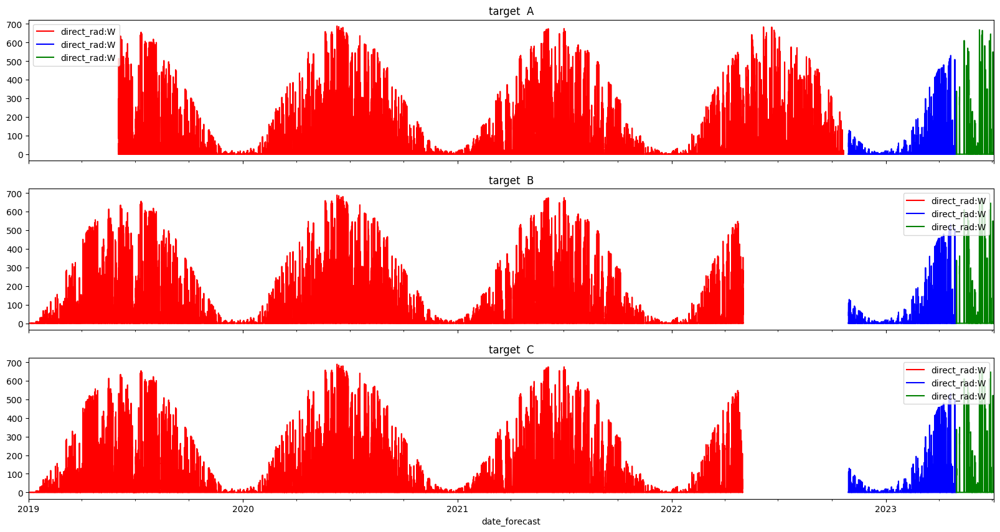

In [8]:
fig, axs = plt.subplots(3, 1, figsize=(20, 10), sharex=True)
feature_name = 'direct_rad:W'
X_train_observed_a[['date_forecast', feature_name]].set_index('date_forecast').plot(ax=axs[0], title='target A', color='red')
X_train_estimated_a[['date_forecast', feature_name]].set_index('date_forecast').plot(ax=axs[0], title='target A', color='blue')
X_test_estimated_a[['date_forecast', feature_name]].set_index('date_forecast').plot(ax=axs[0], title='target  A', color='green')

X_train_observed_b[['date_forecast', feature_name]].set_index('date_forecast').plot(ax=axs[1], title='target  B', color='red')
X_train_estimated_b[['date_forecast', feature_name]].set_index('date_forecast').plot(ax=axs[1], title='target  B', color='blue')
X_test_estimated_b[['date_forecast', feature_name]].set_index('date_forecast').plot(ax=axs[1], title='target  B', color='green')

X_train_observed_c[['date_forecast', feature_name]].set_index('date_forecast').plot(ax=axs[2], title='target  C', color='red')
X_train_estimated_c[['date_forecast', feature_name]].set_index('date_forecast').plot(ax=axs[2], title='target  C', color='blue')
X_test_estimated_c[['date_forecast', feature_name]].set_index('date_forecast').plot(ax=axs[2], title='target  C', color='green')

In [9]:
wind_features = [c  for c in X_train_observed_a.columns if 'wind' in c]
wind_features

['wind_speed_10m:ms',
 'wind_speed_u_10m:ms',
 'wind_speed_v_10m:ms',
 'wind_speed_w_1000hPa:ms']

<Axes: title={'center': 'target  C'}, xlabel='time'>

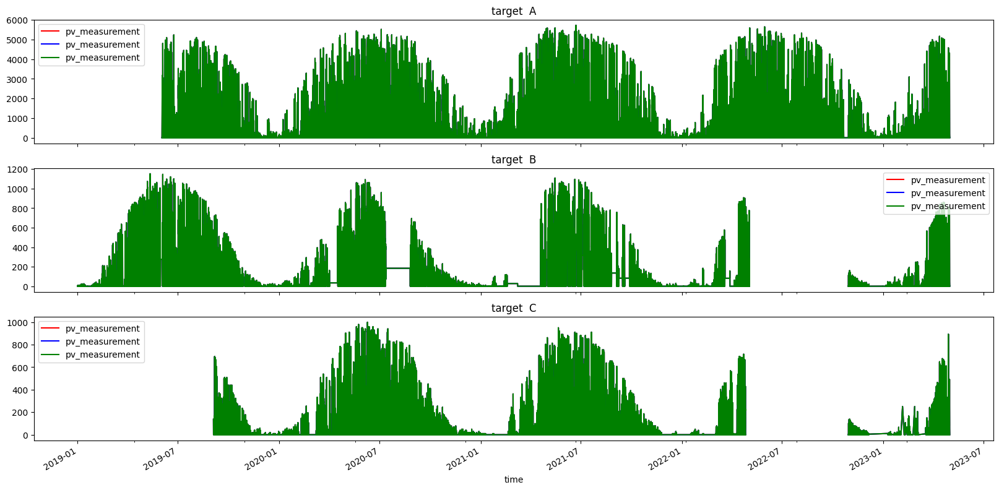

In [10]:
# correlation_matrix = np.abs(X.corr())
# sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
# plt.title('Correlation Heatmap')
# plt.show()
fig, axs = plt.subplots(3, 1, figsize=(20, 10), sharex=True)
feature_name = 'pv_measurement'
y_a[['time', feature_name]].set_index('time').plot(ax=axs[0], title='target A', color='red')
y_a[['time', feature_name]].set_index('time').plot(ax=axs[0], title='target A', color='blue')
y_a[['time', feature_name]].set_index('time').plot(ax=axs[0], title='target  A', color='green')

y_b[['time', feature_name]].set_index('time').plot(ax=axs[1], title='target  B', color='red')
y_b[['time', feature_name]].set_index('time').plot(ax=axs[1], title='target  B', color='blue')
y_b[['time', feature_name]].set_index('time').plot(ax=axs[1], title='target  B', color='green')

y_c[['time', feature_name]].set_index('time').plot(ax=axs[2], title='target  C', color='red')
y_c[['time', feature_name]].set_index('time').plot(ax=axs[2], title='target  C', color='blue')
y_c[['time', feature_name]].set_index('time').plot(ax=axs[2], title='target  C', color='green')


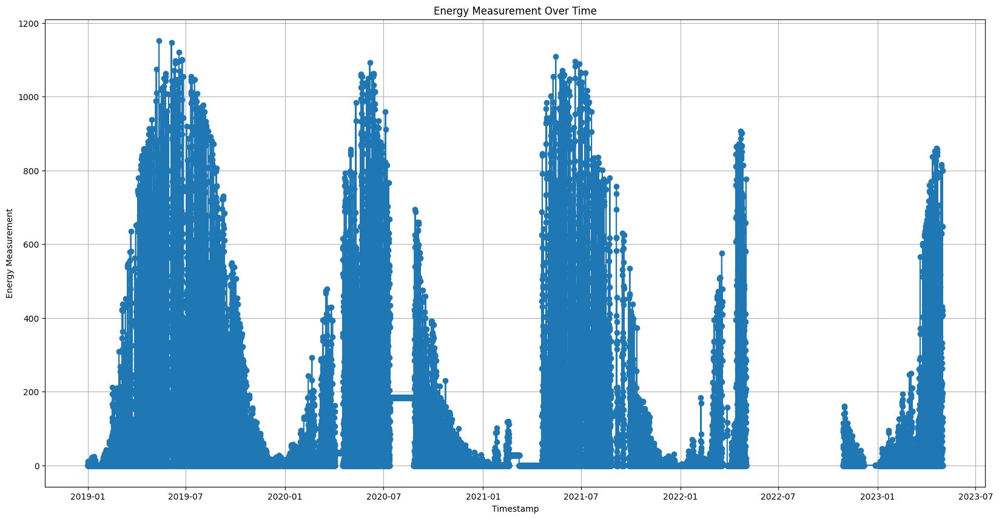

In [11]:
feature_name = "pv_measurement"
y_b['time'] = pd.to_datetime(y_b['time'])
plt.figure(figsize=(20, 10))
plt.plot(y_b['time'], y_b[feature_name], marker='o', linestyle='-')
plt.xlabel('Timestamp')
plt.ylabel('Energy Measurement')
plt.title('Energy Measurement Over Time')
plt.grid(True)
plt.show()


<h5> The sampling device seems to be broken in the interval below

/var/folders/b0/slnc__2x31jczblnsfgfmjw00000gn/T/ipykernel_63616/1321599009.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_b_sub['time'] = pd.to_datetime(y_b_sub['time'])


Text(0.5, 0, 'Timestamp')

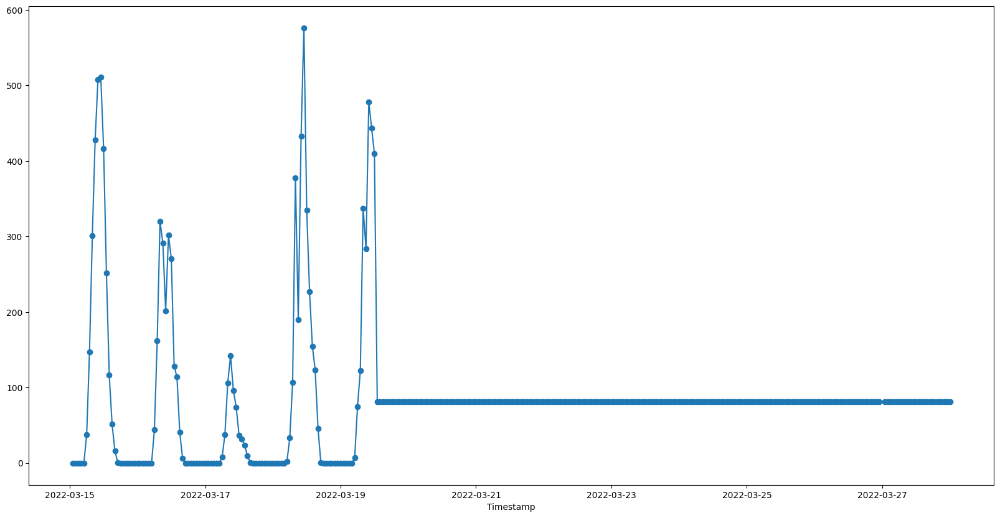

In [12]:
# select the data frames from 2020-06 to 2020-09
start_date = '2022-03-15'
end_date = '2022-03-28'

mask = (y_b['time'] > start_date) & (y_b['time'] <= end_date)
y_b_sub = y_b.loc[mask]
y_b_sub['time'] = pd.to_datetime(y_b_sub['time'])
plt.figure(figsize=(20, 10))
plt.plot(y_b_sub['time'], y_b_sub[feature_name], marker='o', linestyle='-')
plt.xlabel('Timestamp')


<h1> Basis for remove consecutive measurements<h1>


<p> In the above graphs we see that the targets value have a lot of consecutive measurements. This is not good for the model, since it will learn that the target value is constant. We need to remove these consecutive measurements. We will do this by removing the measurements that are close to each other. We therefore made a function that removes the measurements that are close to each other. The function is called remove_consecutive_measurements. The function takes in a dataframe and a threshold. The threshold is the maximum amount of consecutive measurements that are allowed. The function will then remove all the measurements that are closer than the threshold. The function will return a dataframe with the removed measurements.<p>

<Axes: title={'center': 'Train/Test  C'}, xlabel='date_forecast'>

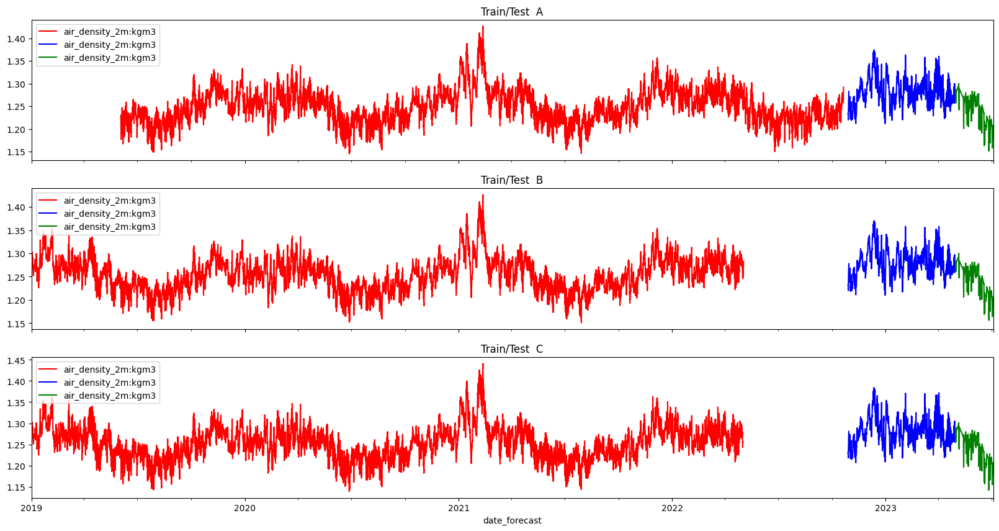

In [14]:
feature_names = X_train_observed_a.columns
# X_train_observed_a["date_forecast"] = pd.to_datetime(X_train_observed_a["date_forecast"])
fig, axs = plt.subplots(3, 1, figsize=(20, 10), sharex=True)
feature_name = feature_names[2]
X_train_observed_a[['date_forecast', feature_name]].set_index('date_forecast').plot(ax=axs[0], title='Train/Test A', color='red')
X_train_estimated_a[['date_forecast', feature_name]].set_index('date_forecast').plot(ax=axs[0], title='Train/Test A', color='blue')
X_test_estimated_a[['date_forecast', feature_name]].set_index('date_forecast').plot(ax=axs[0], title='Train/Test  A', color='green')

X_train_observed_b[['date_forecast', feature_name]].set_index('date_forecast').plot(ax=axs[1], title='Train/Test  B', color='red')
X_train_estimated_b[['date_forecast', feature_name]].set_index('date_forecast').plot(ax=axs[1], title='Train/Test  B', color='blue')
X_test_estimated_b[['date_forecast', feature_name]].set_index('date_forecast').plot(ax=axs[1], title='Train/Test  B', color='green')

X_train_observed_c[['date_forecast', feature_name]].set_index('date_forecast').plot(ax=axs[2], title='Train/Test  C', color='red')
X_train_estimated_c[['date_forecast', feature_name]].set_index('date_forecast').plot(ax=axs[2], title='Train/Test  C', color='blue')
X_test_estimated_c[['date_forecast', feature_name]].set_index('date_forecast').plot(ax=axs[2], title='Train/Test  C', color='green')


<Axes: title={'center': 'Train/Test  C'}, xlabel='date_forecast'>

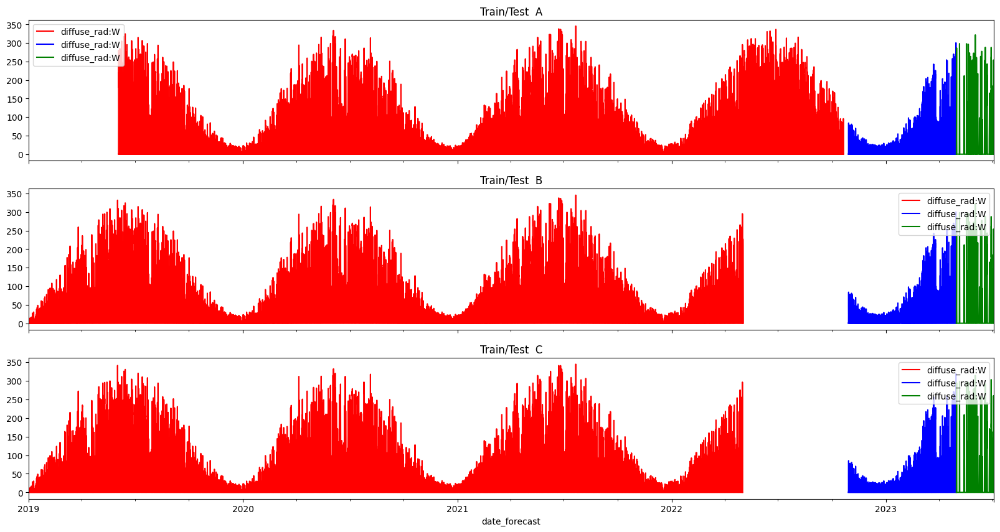

In [15]:
fig, axs = plt.subplots(3, 1, figsize=(20, 10), sharex=True)
feature_name = feature_names[2]
feature_name = "diffuse_rad:W"
# feature_name = "sun_azimuth:d"

X_train_observed_a[['date_forecast', feature_name]].set_index('date_forecast').plot(ax=axs[0], title='Train/Test A', color='red')
X_train_estimated_a[['date_forecast', feature_name]].set_index('date_forecast').plot(ax=axs[0], title='Train/Test A', color='blue')
X_test_estimated_a[['date_forecast', feature_name]].set_index('date_forecast').plot(ax=axs[0], title='Train/Test  A', color='green')

X_train_observed_b[['date_forecast', feature_name]].set_index('date_forecast').plot(ax=axs[1], title='Train/Test  B', color='red')
X_train_estimated_b[['date_forecast', feature_name]].set_index('date_forecast').plot(ax=axs[1], title='Train/Test  B', color='blue')
X_test_estimated_b[['date_forecast', feature_name]].set_index('date_forecast').plot(ax=axs[1], title='Train/Test  B', color='green')

X_train_observed_c[['date_forecast', feature_name]].set_index('date_forecast').plot(ax=axs[2], title='Train/Test  C', color='red')
X_train_estimated_c[['date_forecast', feature_name]].set_index('date_forecast').plot(ax=axs[2], title='Train/Test  C', color='blue')
X_test_estimated_c[['date_forecast', feature_name]].set_index('date_forecast').plot(ax=axs[2], title='Train/Test  C', color='green')


<Axes: title={'center': 'Train/Test  C'}, xlabel='date_forecast'>

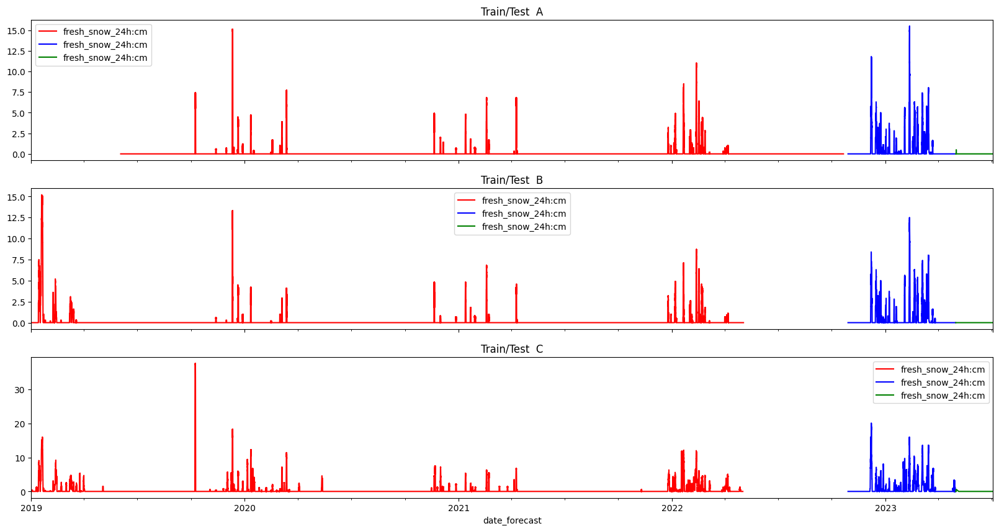

In [16]:
fig, axs = plt.subplots(3, 1, figsize=(20, 10), sharex=True)
feature_name = "fresh_snow_24h:cm"

X_train_observed_a[['date_forecast', feature_name]].set_index('date_forecast').plot(ax=axs[0], title='Train/Test A', color='red')
X_train_estimated_a[['date_forecast', feature_name]].set_index('date_forecast').plot(ax=axs[0], title='Train/Test A', color='blue')
X_test_estimated_a[['date_forecast', feature_name]].set_index('date_forecast').plot(ax=axs[0], title='Train/Test  A', color='green')

X_train_observed_b[['date_forecast', feature_name]].set_index('date_forecast').plot(ax=axs[1], title='Train/Test  B', color='red')
X_train_estimated_b[['date_forecast', feature_name]].set_index('date_forecast').plot(ax=axs[1], title='Train/Test  B', color='blue')
X_test_estimated_b[['date_forecast', feature_name]].set_index('date_forecast').plot(ax=axs[1], title='Train/Test  B', color='green')

X_train_observed_c[['date_forecast', feature_name]].set_index('date_forecast').plot(ax=axs[2], title='Train/Test  C', color='red')
X_train_estimated_c[['date_forecast', feature_name]].set_index('date_forecast').plot(ax=axs[2], title='Train/Test  C', color='blue')
X_test_estimated_c[['date_forecast', feature_name]].set_index('date_forecast').plot(ax=axs[2], title='Train/Test  C', color='green')


<h1> Dora the explorer consecutive measures </h1>

In [18]:
import pandas as pd
from sklearn.metrics import mean_absolute_error
import os

current_dir = os.getcwd() + "../"
print("Current working directory:", current_dir)


# PATH = "/Users/matsalexander/Desktop/Forest Gump/"
# PATH = "/Users/henningdropping/Documents/GitHub/Forest-Gump//"
PATH = "../../"
# Estimate
X_train_estimated_a: pd.DataFrame = pd.read_parquet(
    PATH + 'A/X_train_estimated.parquet')
X_train_estimated_b: pd.DataFrame = pd.read_parquet(
    PATH + "B/X_train_estimated.parquet")
X_train_estimated_c: pd.DataFrame = pd.read_parquet(
    PATH + "C/X_train_estimated.parquet")

# Test estimates
X_test_estimated_a: pd.DataFrame = pd.read_parquet(
    PATH + "A/X_test_estimated.parquet")
X_test_estimated_b: pd.DataFrame = pd.read_parquet(
    PATH + "B/X_test_estimated.parquet")
X_test_estimated_c: pd.DataFrame = pd.read_parquet(
    PATH + "C/X_test_estimated.parquet")

# Observations
X_train_observed_a: pd.DataFrame = pd.read_parquet(
    PATH + "A/X_train_observed.parquet")
X_train_observed_b: pd.DataFrame = pd.read_parquet(
    PATH + "B/X_train_observed.parquet")
X_train_observed_c: pd.DataFrame = pd.read_parquet(
    PATH + "C/X_train_observed.parquet")

# Targets
Y_train_observed_a: pd.DataFrame = pd.read_parquet(
    PATH + "A/train_targets.parquet")
Y_train_observed_b: pd.DataFrame = pd.read_parquet(
    PATH + "B/train_targets.parquet")
Y_train_observed_c: pd.DataFrame = pd.read_parquet(
    PATH + "C/train_targets.parquet")

test_df_example = pd.read_csv(PATH + "test.csv")

best_submission: pd.DataFrame = pd.read_csv(
    PATH + "mikael/submissions/fourth_submission.csv")

class Pipeline_henni:

    def __init__(self):
        pass

    def get_combined_data(self, test_data=False):
        locations = ["A", "B", "C"]
        dfs = []
        for index, location in enumerate(locations):
            if test_data:
                dfs.append(self.get_test_data(location))
            else:
                dfs.append(self.get_data(location))

            dfs[index] = self.onehot_location(dfs[index], location)
        df = pd.concat(dfs).reset_index(drop=True)

        if test_data:
            return df
        return df[[c for c in df if c not in ['pv_measurement']] +  # pv measurement is the target and is at the end columns
                  ['pv_measurement']]

    def get_data(self, location: str) -> pd.DataFrame:
        train, targets = self.get_training_data_by_location(location)
        return self.handle_data(train, targets)

    def get_test_data(self, location: str) -> pd.DataFrame:
        test_data = self.get_test_data_by_location(location)
        return self.handle_data(test_data)

    def handle_data(self, df, targets=pd.DataFrame()):
        df["date_calc"] = pd.to_datetime(df["date_calc"])
        df["date_forecast"] = pd.to_datetime(df["date_forecast"])

        # df = self.add_time_since_calucation(df)
        df = self.onehot_estimated(df)
        df = self.unzip_date_feature(df)
        df = self.grouped_by_hour(df)

        df["time"] = df["date_forecast"]
        # df.drop(["date_forecast"], axis=1, inplace=True)

        # denne kjører bare når vi prossessere train data (med targets som parameter)
        if not targets.empty:
            df = self.merge_train_target(df, targets)

        df.drop(["time"], axis=1, inplace=True)
        df = self.absolute_values(df)
        return df

    # –––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––– helper funciton ––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––

    def get_training_data_by_location(self, location):
        if location == "A":
            X_train_observed_x = X_train_observed_a
            X_train_estimated_x = X_train_estimated_a
            Y_train_x = Y_train_observed_a
        elif location == "B":
            X_train_observed_x = X_train_observed_b
            X_train_estimated_x = X_train_estimated_b
            Y_train_x = Y_train_observed_b
        elif location == "C":
            X_train_observed_x = X_train_observed_c
            X_train_estimated_x = X_train_estimated_c
            Y_train_x = Y_train_observed_c
        else:
            raise Exception("location must be A, B or C")
        train = pd.concat(
            [X_train_observed_x, X_train_estimated_x]).reset_index(drop=True)
        return train, Y_train_x

    def get_test_data_by_location(self, location: str,  normalize=False) -> pd.DataFrame:
        if location == "A":
            df = X_test_estimated_a
        elif location == "B":
            df = X_test_estimated_b
        elif location == "C":
            df = X_test_estimated_c
        else:
            raise Exception("location must be A, B or C")
        return df.copy()

    def unzip_date_feature(self, df: pd.DataFrame, date_column: str = "date_forecast"):
        df[date_column] = pd.to_datetime(df[date_column])
        df["day_of_year"] = df["date_forecast"].dt.day_of_year
        df["hour"] = df["date_forecast"].dt.hour
        # df["month"] = df["date_forecast"].dt.month
        return df

    def add_time_since_calucation(self, df):
        df["date_calc"] = pd.to_datetime(df["date_calc"])
        df["calculated_ago"] = (
            df["date_forecast"] - df["date_calc"]).dt.total_seconds()
        df["calculated_ago"] = df["calculated_ago"].fillna(
            0)
        return df

    def onehot_estimated(self, df):
        df["estimated"] = 0  # Initialize both columns to 0
        df["observed"] = 0
        estimated_mask = df["date_calc"].notna()
        df.loc[estimated_mask, "estimated"] = 1
        df.loc[~estimated_mask, "observed"] = 1
        return df

    def onehot_location(self, df, location):
        if location == "A":
            df["A"], df["B"], df["C"] = 1, 0, 0
        elif location == "B":
            df["A"], df["B"], df["C"] = 0, 1, 0
        elif location == "C":
            df["A"], df["B"], df["C"] = 0, 0, 1
        return df

    def grouped_by_hour(self, df: pd.DataFrame, date_column: str = "date_forecast"):
        df = df.groupby(pd.Grouper(key=date_column, freq="1H")
                        ).mean(numeric_only=True)
        all_nan_mask = df.isnull().all(axis=1)
        df = df[~all_nan_mask]
        return df.reset_index()

    def merge_train_target(self, x, y):
        # henning får med alle pv measurments selv om han merger på inner time. Fordi resample fyller nan rows for alle timer som ikke er i datasettet.
        merged = pd.merge(x, y, on="time", how="right")
        mask = merged["pv_measurement"].notna()
        merged = merged.loc[mask].reset_index(drop=True)
        return merged

    def absolute_values(self, df: pd.DataFrame):
        columns = list(set(df.columns) - set(["date_forecast", "date_calc"]))
        df[columns] = df[columns].abs()
        df = df.replace(-0.0, 0.0)
        return df

    def remove_consecutive_measurments(self, df: pd.DataFrame, consecutive_threshold=6, consecutive_threshold_for_zero=12, return_removed=False):
        if consecutive_threshold < 2:
            return df

        column_to_check = 'pv_measurement'
        mask = (df[column_to_check] != df[column_to_check].shift(2)).cumsum()

        df['consecutive_group'] = df.groupby(
            mask).transform('count')[column_to_check]
        mask = (df['consecutive_group'] > consecutive_threshold)
        mask_zero = (df['consecutive_group'] > consecutive_threshold_for_zero) & (
            df[column_to_check] == 0)

        if return_removed:
            return df[mask | mask_zero]

        df.drop(columns=["consecutive_group"], inplace=True)

        df = df.loc[~mask]
        df = df.loc[~mask_zero]
        return df.reset_index(drop=True)

    def compare_mae(self, df: pd.DataFrame):
        best_submission: pd.DataFrame = pd.read_csv(
            PATH+"mats/submissions/big_gluon_best.csv")
        best_submission = best_submission[["prediction"]]

        if best_submission.shape != df.shape:
            print("best_submission", best_submission.shape)
            print("df", df.shape)
            raise Exception("Dataframe shape must be the same")

        return mean_absolute_error(
            best_submission["prediction"], df["prediction"])

    def split_train_tune(self, df: pd.DataFrame):
        df = df.copy()
        df_estimated = df.loc[df["estimated"] == 1]
        df_observed = df.loc[df["estimated"] == 0]

        num_rows = len(df_estimated)
        middle_index = num_rows // 2

        df_estimated.sample(frac=1, random_state=42)
        train_estimated = df.iloc[:middle_index]
        tune = df.iloc[middle_index:]

        train = pd.concat([df_observed, train_estimated])
        return train, tune

    def post_processing(self, df: pd.DataFrame, prediction_column: str = "prediction_label"):
        df = df[[prediction_column]].rename(
            columns={prediction_column: "prediction"}).reset_index(drop=True).rename_axis(index="id")

        df["prediction"] = df["prediction"].clip(lower=0)
        return df


Current working directory: /Users/matsalexander/Desktop/Forest Gump/final_submission/merged_explore../


In [19]:
pipe = Pipeline_henni()

In [20]:
all_data = pipe.get_combined_data()
all_data.shape

(93024, 54)

In [21]:
df1_0 = pipe.get_data("A")
df2_0 = pipe.get_data("B")
df3_0 = pipe.get_data("C")

In [22]:
def diff_between_dataframes(df1, df2):
    # Add a 'source' column to identify the source DataFrame
    df1['source'] = 'df1'
    df2['source'] = 'df2'

    # Concatenate the DataFrames and drop duplicates
    merged_df = pd.concat([df1, df2], ignore_index=True)
    diff_df = merged_df[merged_df.duplicated(subset=df1.columns, keep=False)]

    return diff_df

In [23]:
print(df1_0.shape, df2_0.shape, df3_0.shape)

(34085, 51) (32844, 51) (26095, 51)


In [24]:
# df0, df1 = pipe.remove_consecutive_measurments(all_data.copy(), 4,34, fuck = True)
relevant_columns = [ "pv_measurement", "consecutive_group", "direct_rad:W", "hour"]
relevant_columns2 = [ "pv_measurement", "direct_rad:W", "hour", "day_of_year"]
# print(df0.shape, df1.shape)


In [25]:
# make a list of 

numbers = [0 if c % 2 == 0 else c for c in range(100)]
numbers = [0,0,0,0,0] + numbers +[0,0,0,0]

od = pd.DataFrame(numbers, columns=["pv_measurement"])
conscs = pipe.remove_consecutive_measurments(all_data.copy(), 4, 4, return_removed=True)
# # conscs, coc = pipe.remove_consecutive_measurments(od, 3, 12, fuck= True)
print(conscs.shape)
# conscs[relevant_columns]

(47368, 55)


In [26]:

pipe2 = Pipeline()

In [27]:
mydf = pipe2.get_combined_data()
numbers = [0 if c % 2 == 0 else c for c in range(100)]
numbers = [0,0,0,0,0] + numbers +[0,0,0,0]

od = pd.DataFrame(numbers, columns=["pv_measurement"])
# od
# dette skal være samme som henning sin.
# print(mydf.shape)
removed = pipe2.remove_consecutive_measurments_new_new(all_data.copy(), 3, 100, 100, return_removed=True) #5, 1000
# conscs, coc = pipe.remove_consecutive_measurments(od, 3, 12, fuck= True)
print("removed",removed.shape)

row_where_consecutive_group_is_between = removed[(removed['consecutive_group'] > 0) &  (removed['consecutive_group'] < 30)]
see = row_where_consecutive_group_is_between[relevant_columns]
print(see.shape)
# see.head(20)

outliers = see[(see["direct_rad:W"] > 0.1) & (see["direct_rad:W"] < 10000)]
print("som ikke har 0 rad",outliers.shape)
outliers.head(100)
outliers

removed (9509, 56)
(244, 4)
som ikke har 0 rad (158, 4)


,pv_measurement,consecutive_group,direct_rad:W,hour
34721,3.4500,28,40.075001,11.0
34722,3.4500,28,30.599998,12.0
34723,3.4500,28,22.250000,13.0
34724,3.4500,28,3.050000,14.0
34743,3.4500,28,11.150000,9.0
34744,3.4500,28,29.275002,10.0
34745,3.4500,28,27.000000,11.0
34746,3.4500,28,42.299999,12.0
34747,3.4500,28,27.450001,13.0
34795,6.9000,7,0.125000,13.0


id: 696969
<h1> Splitting the remove consecutive measurements function to have different threshold for zero value targets and non zero value targets <h1>

In the code we have analyzed how many consecutive zero values that should be tolorated. We found that on a january day in location C there can be as many as 20 consecutive zero values. We check that the direct_rad:W was zero as well. This makes sense. Maybe the location is Trondheim. Therefore we set the consecutive zero values to 20. However, there can be sequnces of zero targes that are shorter than that and are wrong. To exclude these targets we compare the target value to the most important feature, energy from the sun, direct_rad:W. If the direct rad is high, and there are a lot of consecutive zero measurements, we remove the targets.

In [28]:
value_counts = outliers['consecutive_group'].value_counts()

value_counts

3     93
4     26
28     9
10     7
7      6
12     5
6      5
11     4
8      2
5      1
Name: consecutive_group, dtype: int64

In [29]:
sub = mydf.loc[810:850]
sub[relevant_columns2]

,pv_measurement,direct_rad:W,hour,day_of_year
810,869.88,8.500000,16.0,187.0
811,318.34,0.900000,17.0,187.0
812,81.62,1.275000,18.0,187.0
813,47.30,2.475000,19.0,187.0
814,2.64,0.625000,20.0,187.0
815,0.00,0.000000,21.0,187.0
816,0.00,0.000000,22.0,187.0
817,0.00,0.000000,23.0,187.0
818,0.00,0.000000,0.0,188.0
819,1.32,0.000000,1.0,188.0


<h1> Dora the explorer the pipeline </h1>

In [30]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
pd.set_option('display.max_rows', 200)
pd.set_option('display.max_columns', None)

In [31]:
pipe = Pipeline()

In [32]:
# all_data = pipe.get_combined_datasets(offset_years=True)
all_data = pipe.get_combined_data()
df0 = all_data

Se på features

In [33]:
snow_features = [c  for c in all_data.columns if 'snow' in c]
snow_features
all_data[snow_features].describe()

,fresh_snow_12h:cm,fresh_snow_1h:cm,fresh_snow_24h:cm,fresh_snow_3h:cm,fresh_snow_6h:cm,snow_density:kgm3,snow_depth:cm,snow_drift:idx,snow_melt_10min:mm,snow_water:kgm2
count,92951.000000,92951.000000,92951.000000,92951.000000,92951.000000,4213.0,92951.000000,92951.000000,92951.000000,92951.000000
mean,0.117096,0.009727,0.231608,0.029244,0.058533,250.0,0.193164,0.000022,0.000273,0.090299
std,0.779764,0.104943,1.223007,0.275208,0.477040,0.0,1.253925,0.004181,0.004249,0.237841
min,0.000000,0.000000,0.000000,0.000000,0.000000,250.0,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,250.0,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,250.0,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,250.0,0.000000,0.000000,0.000000,0.100000
max,37.474998,7.250000,37.474998,20.325001,33.375000,250.0,18.200001,1.000000,0.180000,5.650000


In [34]:
for sne_feat in snow_features:
    sne_sum = all_data[sne_feat].sum()
    print(f'{sne_feat} : {sne_sum} ')

fresh_snow_12h:cm : 10884.2001953125 
fresh_snow_1h:cm : 904.1250610351562 
fresh_snow_24h:cm : 21528.17578125 
fresh_snow_3h:cm : 2718.25 
fresh_snow_6h:cm : 5440.69970703125 
snow_density:kgm3 : 1053250.0 
snow_depth:cm : 17954.826171875 
snow_drift:idx : 2.0 
snow_melt_10min:mm : 25.399999618530273 
snow_water:kgm2 : 8393.375 


In [35]:
sum_snow_drift = all_data['snow_drift:idx'].unique()
print(sum_snow_drift)
print( all_data['snow_drift:idx'].sum())

[0.    nan 0.75 1.   0.25]
2.0


<h1>Se på tune funcksjonen. Hva gjør den? <h1>

In [36]:
df1_0 = pipe.get_data("A")
df2_0 = pipe.get_data("B")
df3_0 = pipe.get_data("C") 

In [37]:
train1, tune1 = pipe.split_train_tune(df1_0 )
train2, tune2 = pipe.split_train_tune(df2_0 )
train3, tune3 = pipe.split_train_tune(df3_0 )  

In [38]:
df1_0.describe()

,absolute_humidity_2m:gm3,air_density_2m:kgm3,ceiling_height_agl:m,clear_sky_energy_1h:J,clear_sky_rad:W,cloud_base_agl:m,dew_or_rime:idx,dew_point_2m:K,diffuse_rad:W,diffuse_rad_1h:J,direct_rad:W,direct_rad_1h:J,effective_cloud_cover:p,elevation:m,fresh_snow_12h:cm,fresh_snow_1h:cm,fresh_snow_24h:cm,fresh_snow_3h:cm,fresh_snow_6h:cm,is_day:idx,is_in_shadow:idx,msl_pressure:hPa,precip_5min:mm,precip_type_5min:idx,pressure_100m:hPa,pressure_50m:hPa,prob_rime:p,rain_water:kgm2,relative_humidity_1000hPa:p,sfc_pressure:hPa,snow_density:kgm3,snow_depth:cm,snow_drift:idx,snow_melt_10min:mm,snow_water:kgm2,sun_azimuth:d,sun_elevation:d,super_cooled_liquid_water:kgm2,t_1000hPa:K,total_cloud_cover:p,visibility:m,wind_speed_10m:ms,wind_speed_u_10m:ms,wind_speed_v_10m:ms,wind_speed_w_1000hPa:ms,estimated,observed,day_of_year,hour,pv_measurement
count,34061.000000,34061.000000,27934.000000,3.406100e+04,34061.000000,31698.000000,34061.00000,34061.000000,34061.000000,3.406100e+04,34061.000000,3.406100e+04,34061.000000,34061.0,34061.000000,34061.000000,34061.000000,34061.000000,34061.000000,34061.000000,34061.000000,34061.000000,34061.000000,34061.000000,34061.000000,34061.000000,34061.000000,34061.000000,34061.000000,34061.000000,1140.0,34061.000000,34061.0,34061.000000,34061.000000,34061.000000,34061.000000,34061.000000,34061.000000,34061.000000,34061.000000,34061.000000,34061.000000,34061.000000,34061.000000,34061.000000,34061.000000,34061.000000,34061.000000,34085.000000
mean,6.322320,1.253280,2974.149414,5.526711e+05,153.519684,1728.923462,0.03777,275.971802,42.069969,1.514517e+05,52.627697,1.894599e+05,67.701607,6.0,0.088203,0.007403,0.173595,0.022289,0.044405,0.499185,0.535348,1009.603821,0.006015,0.089075,996.707581,1002.829041,0.231885,0.010783,74.025368,1008.977905,250.0,0.073509,0.0,0.000127,0.089688,179.636734,19.554213,0.055665,279.936371,74.319000,32577.396484,3.061313,2.343175,1.519751,0.000017,0.129004,0.870996,183.672176,11.500954,630.594707
std,2.799442,0.037206,2564.641846,8.483389e+05,236.244736,1807.137817,0.18258,6.892324,62.838524,2.235248e+05,115.250557,4.093454e+05,33.808254,0.0,0.594526,0.083636,0.928176,0.214113,0.366713,0.486157,0.486656,12.739138,0.030218,0.323689,12.603231,12.659498,2.803257,0.043945,13.881201,12.717940,0.0,0.468488,0.0,0.002649,0.237548,97.657913,14.180796,0.103919,6.664930,33.492355,17701.937500,1.774981,1.814351,1.179184,0.001157,0.335209,0.335209,106.316505,6.923089,1165.902422
min,0.700000,1.145000,27.849998,0.000000e+00,0.000000,27.799999,0.00000,251.074997,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,6.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,944.400024,0.000000,0.000000,932.400024,938.200012,0.000000,0.000000,21.700001,944.000000,250.0,0.000000,0.0,0.000000,0.000000,6.983000,0.000500,0.000000,259.000000,0.000000,159.675003,0.025000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000
25%,4.200000,1.227500,1126.050049,0.000000e+00,0.000000,582.918762,0.00000,271.299988,0.000000,0.000000e+00,0.000000,0.000000e+00,43.500000,6.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1001.650024,0.000000,0.000000,988.875000,994.950012,0.000000,0.000000,64.750000,1001.075012,250.0,0.000000,0.0,0.000000,0.000000,94.178497,7.023500,0.000000,275.225006,54.549999,16580.625000,1.675000,0.950000,0.600000,0.000000,0.000000,1.000000,89.000000,6.000000,0.000000
50%,5.800000,1.251500,1978.900024,2.166182e+04,3.525000,1150.162476,0.00000,276.000000,2.075000,1.651862e+04,0.000000,1.248000e+02,80.449997,6.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.500000,1.000000,1010.549988,0.000000,0.000000,997.700012,1003.775024,0.000000,0.000000,76.400002,1009.900024,250.0,0.000000,0.0,0.000000,0.000000,180.045746,17.074001,0.000000,279.549988,93.500000,35903.824219,2.725000,1.900000,1.250000,0.000000,0.000000,1.000000,186.000000,12.000000,5.940000
75%,8.250000,1.277250,4174.150391,8.924273e+05,251.925003,2084.781250,0.00000,281.349976,70.699997,2.536671e

In [39]:

tune1.describe()

,absolute_humidity_2m:gm3,air_density_2m:kgm3,ceiling_height_agl:m,clear_sky_energy_1h:J,clear_sky_rad:W,cloud_base_agl:m,dew_or_rime:idx,dew_point_2m:K,diffuse_rad:W,diffuse_rad_1h:J,direct_rad:W,direct_rad_1h:J,effective_cloud_cover:p,elevation:m,fresh_snow_12h:cm,fresh_snow_1h:cm,fresh_snow_24h:cm,fresh_snow_3h:cm,fresh_snow_6h:cm,is_day:idx,is_in_shadow:idx,msl_pressure:hPa,precip_5min:mm,precip_type_5min:idx,pressure_100m:hPa,pressure_50m:hPa,prob_rime:p,rain_water:kgm2,relative_humidity_1000hPa:p,sfc_pressure:hPa,snow_density:kgm3,snow_depth:cm,snow_drift:idx,snow_melt_10min:mm,snow_water:kgm2,sun_azimuth:d,sun_elevation:d,super_cooled_liquid_water:kgm2,t_1000hPa:K,total_cloud_cover:p,visibility:m,wind_speed_10m:ms,wind_speed_u_10m:ms,wind_speed_v_10m:ms,wind_speed_w_1000hPa:ms,estimated,observed,day_of_year,hour,pv_measurement
count,2197.000000,2197.000000,1694.000000,2.197000e+03,2197.000000,1909.000000,2197.000000,2197.000000,2197.000000,2.197000e+03,2197.000000,2.197000e+03,2197.000000,2197.0,2197.000000,2197.000000,2197.000000,2197.000000,2197.000000,2197.000000,2197.000000,2197.000000,2197.000000,2197.000000,2197.000000,2197.000000,2197.000000,2197.000000,2197.000000,2197.000000,150.0,2197.000000,2197.0,2197.000000,2197.000000,2197.000000,2197.000000,2197.000000,2197.000000,2197.000000,2197.000000,2197.000000,2197.000000,2197.000000,2197.0,2197.0,2197.0,2197.000000,2197.000000,2197.000000
mean,4.116796,1.281070,3213.755615,4.409714e+05,122.473030,1637.790771,0.038917,270.453186,40.571609,1.460680e+05,48.508091,1.746288e+05,68.099396,6.0,0.390009,0.030291,0.779097,0.094083,0.192126,0.475535,0.558603,1011.370605,0.003957,0.085913,998.234741,1004.483398,0.668025,0.001218,71.027733,1010.759888,250.0,0.166545,0.0,0.000632,0.079381,179.904572,17.712051,0.034160,274.818512,72.876511,29622.638672,3.335924,2.670722,1.559877,0.0,1.0,0.0,74.727811,11.532544,590.297651
std,1.319260,0.024972,2486.944092,6.646809e+05,185.306503,1836.614136,0.187007,4.745133,58.202454,2.065653e+05,106.050629,3.769525e+05,36.833477,0.0,1.172899,0.151295,1.935587,0.402777,0.696882,0.486438,0.483631,14.432036,0.018353,0.387928,14.331497,14.380436,4.924515,0.010667,14.558252,14.429879,0.0,0.719369,0.0,0.006709,0.197618,96.680031,11.031183,0.083005,3.974071,36.785950,14608.264648,1.908954,1.989711,1.102087,0.0,0.0,0.0,26.432590,6.922118,1166.894573
min,1.100000,1.220750,27.924999,0.000000e+00,0.000000,28.200001,0.000000,255.250000,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,6.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,973.200012,0.000000,0.000000,960.674988,966.650024,0.000000,0.000000,21.700001,972.650024,250.0,0.000000,0.0,0.000000,0.000000,14.913000,0.022500,0.000000,261.975006,0.000000,1352.199951,0.125000,0.000000,0.000000,0.0,1.0,0.0,29.000000,0.000000,0.000000
25%,3.200000,1.264500,1175.968750,0.000000e+00,0.000000,527.775024,0.000000,267.700012,0.000000,0.000000e+00,0.000000,0.000000e+00,37.349998,6.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1001.500000,0.000000,0.000000,988.450012,994.699951,0.000000,0.000000,61.450001,1000.949951,250.0,0.000000,0.0,0.000000,0.000000,95.153000,8.690750,0.000000,272.424988,46.250000,18605.449219,1.800000,1.000000,0.650000,0.0,1.0,0.0,52.000000,6.000000,0.000000
50%,4.225000,1.280500,2653.800049,9.454175e+03,0.950000,903.150024,0.000000,271.424988,0.575000,1.431685e+04,0.000000,0.000000e+00,87.625000,6.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.250000,1.000000,1010.549988,0.000000,0.000000,997.400024,1003.625000,0.000000,0.000000,73.449997,1009.950012,250.0,0.000000,0.0,0.000000,0.000000,179.470505,16.332750,0.000000,274.849976,96.849998,30314.824219,3.000000,2.275000,1.400000,0.0,1.0,0.0,75.000000,12.000000,1.320000
75%,5.000000,1.296000,4572.125000,7.225884e+05,202.225006,1932.900024,0.000000,273.799988,75.074997,2.670561e+05,30.325001,1.145617e+05,99.900002,6.0,0.000000,0.000000,0.075000,0.000000,0.000000,1.000000,1.000000,1022.650024,0.000000,0.0000

In [40]:
train1.describe()

,absolute_humidity_2m:gm3,air_density_2m:kgm3,ceiling_height_agl:m,clear_sky_energy_1h:J,clear_sky_rad:W,cloud_base_agl:m,dew_or_rime:idx,dew_point_2m:K,diffuse_rad:W,diffuse_rad_1h:J,direct_rad:W,direct_rad_1h:J,effective_cloud_cover:p,elevation:m,fresh_snow_12h:cm,fresh_snow_1h:cm,fresh_snow_24h:cm,fresh_snow_3h:cm,fresh_snow_6h:cm,is_day:idx,is_in_shadow:idx,msl_pressure:hPa,precip_5min:mm,precip_type_5min:idx,pressure_100m:hPa,pressure_50m:hPa,prob_rime:p,rain_water:kgm2,relative_humidity_1000hPa:p,sfc_pressure:hPa,snow_density:kgm3,snow_depth:cm,snow_drift:idx,snow_melt_10min:mm,snow_water:kgm2,sun_azimuth:d,sun_elevation:d,super_cooled_liquid_water:kgm2,t_1000hPa:K,total_cloud_cover:p,visibility:m,wind_speed_10m:ms,wind_speed_u_10m:ms,wind_speed_v_10m:ms,wind_speed_w_1000hPa:ms,estimated,observed,day_of_year,hour,pv_measurement
count,31864.000000,31864.000000,26240.000000,3.186400e+04,31864.000000,29789.000000,31864.000000,31864.000000,31864.000000,3.186400e+04,31864.000000,3.186400e+04,31864.000000,31864.0,31864.000000,31864.000000,31864.000000,31864.000000,31864.000000,31864.000000,31864.000000,31864.000000,31864.000000,31864.000000,31864.000000,31864.000000,31864.000000,31864.000000,31864.000000,31864.000000,990.0,31864.000000,31864.0,31864.000000,31864.000000,31864.000000,31864.000000,31864.000000,31864.000000,31864.000000,31864.000000,31864.000000,31864.000000,31864.000000,31864.000000,31864.000000,31864.000000,31864.000000,31864.000000,31864.000000
mean,6.474390,1.251364,2958.680420,5.603728e+05,155.660339,1734.763550,0.037691,276.352356,42.173279,1.518229e+05,52.911743,1.904825e+05,67.674187,6.0,0.067393,0.005825,0.131846,0.017339,0.034220,0.500816,0.533745,1009.481995,0.006157,0.089294,996.602295,1002.715027,0.201814,0.011442,74.232048,1008.854980,250.0,0.067094,0.0,0.000093,0.090399,179.618271,19.681231,0.057148,280.289246,74.418465,32781.121094,3.042379,2.320591,1.516984,0.000018,0.068949,0.931051,191.183812,11.498776,633.818333
std,2.810473,0.037147,2568.855469,8.590304e+05,239.211639,1805.106812,0.182274,6.854417,63.145176,2.246452e+05,115.854111,4.114707e+05,33.590080,0.0,0.525649,0.076557,0.797296,0.193507,0.329654,0.486103,0.486830,12.605176,0.030863,0.318789,12.468612,12.524339,2.591273,0.045274,13.809577,12.582287,0.0,0.445321,0.0,0.002092,0.240042,97.726456,14.363981,0.105047,6.668221,33.251568,17877.751953,1.763827,1.799469,1.184281,0.001196,0.253372,0.253372,105.639081,6.923259,1166.124516
min,0.700000,1.145000,27.849998,0.000000e+00,0.000000,27.799999,0.000000,251.074997,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,6.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,944.400024,0.000000,0.000000,932.400024,938.200012,0.000000,0.000000,22.700001,944.000000,250.0,0.000000,0.0,0.000000,0.000000,6.983000,0.000500,0.000000,259.000000,0.000000,159.675003,0.025000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000
25%,4.300000,1.226000,1122.637573,0.000000e+00,0.000000,588.650024,0.000000,271.600006,0.000000,0.000000e+00,0.000000,0.000000e+00,43.718749,6.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1001.650024,0.000000,0.000000,988.900024,994.950012,0.000000,0.000000,64.949997,1001.075012,250.0,0.000000,0.0,0.000000,0.000000,94.122498,6.902813,0.000000,275.549988,54.943748,16383.868896,1.675000,0.925000,0.600000,0.000000,0.000000,1.000000,102.000000,5.000000,0.000000
50%,6.075000,1.249000,1950.875000,2.294212e+04,3.750000,1164.025024,0.000000,276.600006,2.150000,1.662506e+04,0.000000,1.473375e+02,80.050003,6.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.500000,1.000000,1010.549988,0.000000,0.000000,997.700012,1003.799988,0.000000,0.000000,76.649994,1009.900024,250.0,0.000000,0.0,0.000000,0.000000,180.081123,17.169375,0.000000,280.100006,93.224998,36397.400391,2.700000,1.900000,1.250000,0.000000,0.000000,1.000000,198.000000,11.000000,6.600000
75%,8.425000,1.275000,4136.362793,9.037950e+05,257.500008,2088.524902,0.000000,281.649994,70.525002,2.

<h1> Dora the explorer

In [41]:
# %autoreload
# import sys
# from pipeline import Pipeline as Pipin
# pipe = Pipin()

In [42]:
# all_data = pipe.get_combined_datasets(offset_years=True)
all_data = pipe.get_combined_data()
df0 = all_data


Se på features

In [43]:
snow_features = [c  for c in all_data.columns if 'snow' in c]
snow_features
all_data[snow_features].describe()

,fresh_snow_12h:cm,fresh_snow_1h:cm,fresh_snow_24h:cm,fresh_snow_3h:cm,fresh_snow_6h:cm,snow_density:kgm3,snow_depth:cm,snow_drift:idx,snow_melt_10min:mm,snow_water:kgm2
count,92951.000000,92951.000000,92951.000000,92951.000000,92951.000000,4213.0,92951.000000,92951.000000,92951.000000,92951.000000
mean,0.117096,0.009727,0.231608,0.029244,0.058533,250.0,0.193164,0.000022,0.000273,0.090299
std,0.779764,0.104943,1.223007,0.275208,0.477040,0.0,1.253925,0.004181,0.004249,0.237841
min,0.000000,0.000000,0.000000,0.000000,0.000000,250.0,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,250.0,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,250.0,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,250.0,0.000000,0.000000,0.000000,0.100000
max,37.474998,7.250000,37.474998,20.325001,33.375000,250.0,18.200001,1.000000,0.180000,5.650000


In [44]:
for sne_feat in snow_features:
    sne_sum = all_data[sne_feat].sum()
    print(f'{sne_feat} : {sne_sum} ')

fresh_snow_12h:cm : 10884.2001953125 
fresh_snow_1h:cm : 904.1250610351562 
fresh_snow_24h:cm : 21528.17578125 
fresh_snow_3h:cm : 2718.25 
fresh_snow_6h:cm : 5440.69970703125 
snow_density:kgm3 : 1053250.0 
snow_depth:cm : 17954.826171875 
snow_drift:idx : 2.0 
snow_melt_10min:mm : 25.399999618530273 
snow_water:kgm2 : 8393.375 


In [45]:
sum_snow_drift = all_data['snow_drift:idx'].sum()
sum_snow_drift

2.0

<h1>New groupe<h1>

In [46]:
import pandas as pd
from sklearn.metrics import mean_absolute_error
import os

current_dir = os.getcwd()
print("Current working directory:", current_dir)


PATH = "../../"
# PATH = "/Users/matsalexander/Desktop/Forest Gump/"
# Estimate
X_train_estimated_a: pd.DataFrame = pd.read_parquet(
    PATH + 'A/X_train_estimated.parquet')
X_train_estimated_b: pd.DataFrame = pd.read_parquet(
    PATH + "B/X_train_estimated.parquet")
X_train_estimated_c: pd.DataFrame = pd.read_parquet(
    PATH + "C/X_train_estimated.parquet")

# Test estimates
X_test_estimated_a: pd.DataFrame = pd.read_parquet(
    PATH + "A/X_test_estimated.parquet")
X_test_estimated_b: pd.DataFrame = pd.read_parquet(
    PATH + "B/X_test_estimated.parquet")
X_test_estimated_c: pd.DataFrame = pd.read_parquet(
    PATH + "C/X_test_estimated.parquet")

# Observations
X_train_observed_a: pd.DataFrame = pd.read_parquet(
    PATH + "A/X_train_observed.parquet")
X_train_observed_b: pd.DataFrame = pd.read_parquet(
    PATH + "B/X_train_observed.parquet")
X_train_observed_c: pd.DataFrame = pd.read_parquet(
    PATH + "C/X_train_observed.parquet")

# Targets
Y_train_observed_a: pd.DataFrame = pd.read_parquet(
    PATH + "A/train_targets.parquet")
Y_train_observed_b: pd.DataFrame = pd.read_parquet(
    PATH + "B/train_targets.parquet")
Y_train_observed_c: pd.DataFrame = pd.read_parquet(
    PATH + "C/train_targets.parquet")

test_df_example = pd.read_csv(PATH + "test.csv")

best_submission: pd.DataFrame = pd.read_csv(
    PATH + "mikael/submissions/fourth_submission.csv")


class Pipeline:

    def __init__(self):
        pass

    def get_combined_data(self, test_data=False):
        locations = ["A", "B", "C"]
        dfs = []
        for index, location in enumerate(locations):
            if test_data:
                dfs.append(self.get_test_data(location))
            else:
                dfs.append(self.get_data(location))

            dfs[index] = self.onehot_location(dfs[index], location)
        df = pd.concat(dfs).reset_index(drop=True)

        if test_data:
            return df
        return df[[c for c in df if c not in ['pv_measurement']] +  # pv measurement is the target and is at the end columns
                  ['pv_measurement']]

    def get_data(self, location: str, keeptime=False) -> pd.DataFrame:
        train, targets = self.get_training_data_by_location(location)
        return self.handle_data(train, targets, keeptime=keeptime)

    def get_test_data(self, location: str) -> pd.DataFrame:
        test_data = self.get_test_data_by_location(location)
        return self.handle_data(test_data)

    def handle_data(self, df, targets=pd.DataFrame(), keeptime=False):
        df["date_calc"] = pd.to_datetime(df["date_calc"])
        df["date_forecast"] = pd.to_datetime(df["date_forecast"])

        df = self.drop_columns(df)
        df = self.grouped_by_hour(df)

        df = self.unzip_date_feature(df)
        df = self.onehot_estimated(df)

        df["time"] = df["date_forecast"]
        df.drop(["date_forecast"], axis=1, inplace=True)
        if not targets.empty:
            df = self.merge_train_target(df, targets)

        df.drop(columns=["time"], axis=1, inplace=True)

        df = self.absolute_values(df)
        return df

    # –––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––– helper funciton ––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––

    def get_training_data_by_location(self, location):
        if location == "A":
            X_train_observed_x = X_train_observed_a
            X_train_estimated_x = X_train_estimated_a
            Y_train_x = Y_train_observed_a
        elif location == "B":
            X_train_observed_x = X_train_observed_b
            X_train_estimated_x = X_train_estimated_b
            Y_train_x = Y_train_observed_b
        elif location == "C":
            X_train_observed_x = X_train_observed_c
            X_train_estimated_x = X_train_estimated_c
            Y_train_x = Y_train_observed_c
        else:
            raise Exception("location must be A, B or C")
        train = pd.concat(
            [X_train_observed_x, X_train_estimated_x]).reset_index(drop=True)
        return train, Y_train_x

    def get_test_data_by_location(self, location: str,  normalize=False) -> pd.DataFrame:
        if location == "A":
            df = X_test_estimated_a
        elif location == "B":
            df = X_test_estimated_b
        elif location == "C":
            df = X_test_estimated_c
        else:
            raise Exception("location must be A, B or C")
        return df.copy()

    def unzip_date_feature(self, df: pd.DataFrame, date_column: str = "date_forecast"):
        df[date_column] = pd.to_datetime(df[date_column])
        df["day_of_year"] = df["date_forecast"].dt.day_of_year
        df["hour"] = df["date_forecast"].dt.hour
        # df["month"] = df["date_forecast"].dt.month
        return df

    def add_time_since_calucation(self, df):  # denne er ikke så dum.
        df["date_calc"] = pd.to_datetime(df["date_calc"])
        df["calculated_ago"] = (
            df["date_forecast"] - df["date_calc"]).dt.total_seconds()
        df["calculated_ago"] = df["calculated_ago"].fillna(
            0) / 60/30
        return df

    def onehot_estimated(self, df):
        df["estimated"] = 0  # Initialize both columns to 0
        df["observed"] = 0
        estimated_mask = df["date_calc"].notna()
        df.loc[estimated_mask, "estimated"] = 1
        df.loc[~estimated_mask, "observed"] = 1
        df.drop(columns=["date_calc"], inplace=True)
        return df

    def onehot_location(self, df, location):
        if location == "A":
            df["A"], df["B"], df["C"] = 1, 0, 0
        elif location == "B":
            df["A"], df["B"], df["C"] = 0, 1, 0
        elif location == "C":
            df["A"], df["B"], df["C"] = 0, 0, 1
        return df

    def grouped_by_hour(self, df: pd.DataFrame, date_column: str = "date_forecast") -> pd.DataFrame:
        # Group by hour and aggregate the values into lists for all columns
        df['date_hour'] = df[date_column].dt.to_period('H')
        df["min"] = df[date_column].dt.minute
        df.drop(columns=[date_column], inplace=True)

        # Use pivot_table to combine rows with the same date and hour
        pivot_df = df.pivot_table(index=['date_hour'], columns=[
                                  'min'], values=df.columns, aggfunc='first')
        # rename the date_hour to date_forecast
        # pivot_df.columns = [f'{col[0]}_{col[1]}' if col[1]
        #                     else col[0] for col in pivot_df.columns]

        pivot_df.index.names = [date_column]

        # Reset index to make 'date' a regular column
        pivot_df.columns = pivot_df.columns.to_flat_index()
        pivot_df.reset_index(inplace=True)

        pivot_df["date_forecast"] = pivot_df["date_forecast"].dt.to_timestamp()

        pivot_df["date_calc"] = pivot_df[('date_calc', 0)]
        pivot_df.drop(columns=[
            ('date_calc', c) for c in range(0, 60, 15)
        ], inplace=True)

        pivot_df.columns = [str(col) for col in pivot_df.columns]

        return pivot_df

    def grouped_by_hour_old(self, df: pd.DataFrame, date_column: str = "date_forecast"):
        df = df.groupby(pd.Grouper(key=date_column, freq="1H")
                        ).mean(numeric_only=True)
        all_nan_mask = df.isnull().all(axis=1)
        df = df[~all_nan_mask]
        return df.reset_index()

    def merge_train_target(self, x, y):
        # henning får med alle pv measurments selv om han merger på inner time. Fordi resample fyller nan rows for alle timer som ikke er i datasettet.
        merged = pd.merge(x, y, on="time", how="right")
        mask = merged["pv_measurement"].notna()
        merged = merged.loc[mask].reset_index(drop=True)
        return merged

    def absolute_values(self, df: pd.DataFrame):
        columns = list(df.columns)
        df[columns] = df[columns].abs()
        df = df.replace(-0.0, 0.0)
        return df

    def lag_features_by_1_hour(df, columns_to_lag):
        lag_columns = [c for c in df.columns if "_1h:" in c]
        df[lag_columns] = df[lag_columns].shift(1)
        return df

    def remove_consecutive_measurments_new(self, df: pd.DataFrame, consecutive_threshold=3, consecutive_threshold_zero=12,  return_removed=False):
        if consecutive_threshold < 2:
            return df

        column_to_check = 'pv_measurement'

        mask = (df[column_to_check] != df[column_to_check].shift(1)).cumsum()
        df['consecutive_group'] = df.groupby(
            mask).transform('count')[column_to_check]

        df["is_first_in_consecutive_group"] = False
        df['is_first_in_consecutive_group'] = df['consecutive_group'] != df['consecutive_group'].shift(
            1)

        # masks to remove rows
        mask_non_zero = (df['consecutive_group'] >= consecutive_threshold) & (
            df["pv_measurement"] > 0) & (df["is_first_in_consecutive_group"] == False)  # or df["direct_rad:W"] == 0)

        mask_zero = (df['consecutive_group'] >= consecutive_threshold_zero) & (
            df["pv_measurement"] == 0) & (df["is_first_in_consecutive_group"] == False)

        mask = mask_non_zero | mask_zero

        if return_removed:
            return df[mask]

        df = df.loc[~mask]

        df = df.drop(columns=["consecutive_group",
                     "is_first_in_consecutive_group"])

        return df.reset_index(drop=True)

    def remove_consecutive_measurments_new_new(self, df: pd.DataFrame, consecutive_threshold=3, consecutive_threshold_zero=12, consecutive_threshold_zero_no_rad=20, return_removed=False):
        if consecutive_threshold < 2:
            return df

        column_to_check = 'pv_measurement'

        mask = (df[column_to_check] != df[column_to_check].shift(1)).cumsum()
        df['consecutive_group'] = df.groupby(
            mask).transform('count')[column_to_check]

        df["is_first_in_consecutive_group"] = False
        df['is_first_in_consecutive_group'] = df['consecutive_group'] != df['consecutive_group'].shift(
            1)
        rad_cols = [f"('direct_rad:W', {c})" for c in range(0, 60, 15)]
        df["direct_rad:W"] = df[rad_cols].mean(axis=1)
        # masks to remove rows
        mask_non_zero = (df['consecutive_group'] >= consecutive_threshold) & (
            df["pv_measurement"] > 0) & (df["is_first_in_consecutive_group"] == False)  # or df["direct_rad:W"] == 0)

        tol = 10
        mask_zero = (df['consecutive_group'] >= consecutive_threshold_zero) & (
            df["pv_measurement"] == 0) & (df["direct_rad:W"] > tol)

        mask_zero_no_rad = (df['consecutive_group'] >= consecutive_threshold_zero_no_rad) & (
            df["pv_measurement"] == 0) & (df["direct_rad:W"] < tol)
        mask = mask_non_zero | mask_zero | mask_zero_no_rad

        if return_removed:
            return df[mask]

        df = df.loc[~mask]

        df = df.drop(columns=["consecutive_group",
                     "is_first_in_consecutive_group", "direct_rad:W"])

        return df.reset_index(drop=True)

    def compare_mae(self, df: pd.DataFrame):
        best_submission: pd.DataFrame = pd.read_csv(
            PATH+"mats/submissions/gluon_3_remove_consecutive_measurements_66.csv")
        best_submission = best_submission[["prediction"]]

        if best_submission.shape != df.shape:
            print("best_submission", best_submission.shape)
            print("df", df.shape)
            raise Exception("Dataframe shape must be the same")

        return mean_absolute_error(
            best_submission["prediction"], df["prediction"])

    def drop_columns(self, df: pd.DataFrame):
        drop = [
            # wind speed vector u, available up to 20000 m, from 1000 hPa to 10 hPa and on flight levels FL10-FL900[m/s] does not make sens at surfece level
            "wind_speed_w_1000hPa:ms",
            "wind_speed_u_10m:ms",  # same as above
            "wind_speed_v_10m:ms",  # same as above
            "snow_density:kgm3",
            "snow_drift:idx",  # denne er ny. Fikk 140.9 uten.
            # "snow_melt_10min:mm",  # veldig få verdier
        ]
        shared_columns = list(set(df.columns) & set(drop))
        df = df.drop(columns=shared_columns)
        return df

    def find_min_max_date_in_test(self) -> list:
        locations = ["A", "B", "C"]
        dates = []
        for loc in locations:
            df = self.get_test_data_by_location(loc)
            df["date_forecast"] = pd.to_datetime(df["date_forecast"])
            dates.append((df["date_forecast"].min(),
                         df["date_forecast"].max()))
        return dates

    def split_train_summer_2021(self, df: pd.DataFrame):
        dates = self.find_min_max_date_in_test()
        # set the dates to the summer of 2021
        dates = [(date[0].replace(year=2021), date[1].replace(year=2021))
                 for date in dates]

        summer2021 = df[(df["date_forecast"] >= dates[0][0]) & (
            df["date_forecast"] <= dates[0][1])]

        train = df[~df.index.isin(summer2021.index)]
        return train, summer2021

    def post_processing(self, df: pd.DataFrame, prediction_column: str = "prediction_label"):
        df = df[[prediction_column]].rename(
            columns={prediction_column: "prediction"}).reset_index(drop=True).rename_axis(index="id")

        df["prediction"] = df["prediction"].clip(lower=0)
        return df


Current working directory: /Users/matsalexander/Desktop/Forest Gump/final_submission/merged_explore


In [47]:
pipe2 = Pipeline()

In [48]:
df1, Y = pipe2.get_training_data_by_location("A")
df1["date_forecast"] = pd.to_datetime(df1["date_forecast"])
df1[df1["date_forecast"] < "2023-04-30 20:00:00"].tail(20)

,date_forecast,absolute_humidity_2m:gm3,air_density_2m:kgm3,ceiling_height_agl:m,clear_sky_energy_1h:J,clear_sky_rad:W,cloud_base_agl:m,dew_or_rime:idx,dew_point_2m:K,diffuse_rad:W,diffuse_rad_1h:J,direct_rad:W,direct_rad_1h:J,effective_cloud_cover:p,elevation:m,fresh_snow_12h:cm,fresh_snow_1h:cm,fresh_snow_24h:cm,fresh_snow_3h:cm,fresh_snow_6h:cm,is_day:idx,is_in_shadow:idx,msl_pressure:hPa,precip_5min:mm,precip_type_5min:idx,pressure_100m:hPa,pressure_50m:hPa,prob_rime:p,rain_water:kgm2,relative_humidity_1000hPa:p,sfc_pressure:hPa,snow_density:kgm3,snow_depth:cm,snow_drift:idx,snow_melt_10min:mm,snow_water:kgm2,sun_azimuth:d,sun_elevation:d,super_cooled_liquid_water:kgm2,t_1000hPa:K,total_cloud_cover:p,visibility:m,wind_speed_10m:ms,wind_speed_u_10m:ms,wind_speed_v_10m:ms,wind_speed_w_1000hPa:ms,date_calc
136209,2023-04-30 15:00:00,4.6,1.263,4795.500000,1.870634e+06,463.100006,715.400024,0.0,272.799988,164.800003,679038.000000,178.399994,612584.625000,87.900002,6.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1014.200012,0.0,0.0,1001.000000,1007.200012,0.0,0.0,66.099998,1013.400024,NaN,0.0,0.0,-0.0,0.0,245.445999,27.790001,0.0,276.700012,87.900002,22850.900391,7.0,7.0,0.4,-0.0,2023-04-29 07:00:05
136210,2023-04-30 15:15:00,4.6,1.264,4181.000000,1.769851e+06,432.500000,708.599976,0.0,272.600006,160.300003,632067.625000,165.600006,629414.187500,86.000000,6.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1014.299988,0.0,0.0,1001.099976,1007.299988,0.0,0.0,65.800003,1013.500000,NaN,0.0,0.0,-0.0,0.0,249.139999,26.239000,0.0,276.600006,86.000000,23263.199219,7.0,7.0,0.4,-0.0,2023-04-29 07:00:05
136211,2023-04-30 15:30:00,4.5,1.265,3566.500000,1.664340e+06,401.000000,701.700012,0.0,272.500000,154.500000,583870.625000,152.699997,639885.875000,84.000000,6.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1014.299988,0.0,0.0,1001.099976,1007.299988,0.0,0.0,65.400002,1013.500000,NaN,0.0,0.0,-0.0,0.0,252.764999,24.650000,0.0,276.500000,84.000000,23672.000000,7.1,7.1,0.4,-0.0,2023-04-29 07:00:05
136212,2023-04-30 15:45:00,4.5,1.265,2952.000000,1.554693e+06,368.600006,694.799988,0.0,272.299988,146.699997,566436.187500,135.899994,588136.812500,82.199997,6.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1014.299988,0.0,0.0,1001.099976,1007.299988,0.0,0.0,65.000000,1013.500000,NaN,0.0,0.0,-0.0,0.0,256.325989,23.030001,0.0,276.500000,82.199997,24077.500000,7.2,7.2,0.4,-0.0,2023-04-29 07:00:05
136213,2023-04-30 16:00:00,4.4,1.266,2337.500000,1.441550e+06,335.700012,687.900024,0.0,272.200012,137.899994,544752.875000,119.800003,536708.875000,80.300003,6.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1014.400024,0.0,0.0,1001.200012,1007.299988,0.0,0.0,64.599998,1013.599976,NaN,0.0,0.0,-0.0,0.0,259.832001,21.385000,0.0,276.399994,80.300003,24479.500000,7.2,7.2,0.4,-0.0,2023-04-29 07:00:05
136214,2023-04-30 16:15:00,4.5,1.267,2235.500000,1.325600e+06,302.399994,667.400024,0.0,272.299988,128.000000,518955.687500,104.300003,485907.687500,82.300003,6.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1014.400024,0.0,0.0,1001.200012,1007.400024,0.0,0.0,66.000000,1013.599976,NaN,0.0,0.0,-0.0,0.0,263.287994,19.722000,0.0,276.200012,82.300003,23630.800781,7.1,7.0,0.5,-0.0,2023-04-29 07:00:05
136215,2023-04-30 16:30:00,4.5,1.268,2133.399902,1.207590e+06,269.000000,646.900024,0.0,272.399994,117.300003,489243.000000,89.599998,436038.687500,84.199997,6.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1014.400024,0.0,0.0,1001.200012,1007.400024,0.0,0.0,67.500000,1013.599976,NaN,0.0,0.0,-0.0,0.0,266.701996,18.047001,0.0,276.100006,84.199997,22788.699219,6.9,6.8,0.6,-0.0,2023-04-29 07:00:05
136216,2023-04-30 16:45:00,4.5,1.269,2031.400024,1.088337e+06,235.699997,626.400024,0.0,272.500000,105.300003,453580.093750,79.900002,388476.406250,86.000000,6.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1014.400024,0.0,0.0,1001.200012,1007.400024,0.0,0.0,68.900002,1013.700012,NaN,0.0,0.0,-0.0,0.0,270.079987,16.365999,0.0,276.000000,86.000000,21953.300781,6.7,6.7,0.7,-0.0,2023-04-29 07:00:05
136217,2023-04-30 17:00:00,4.6,1.270,1929.300049,9.687359e+05,203.000000,605.900024,0.0,272.500000,92.800003,415135.406250,69.9

In [49]:
gruped = pipe2.grouped_by_hour_old(df1.copy())
# gruped["date_forecast"] = gruped["date_forecast"].dt.to_timestamp()

for col in gruped.columns:
    if "date_calc" in col[0]:
        print(col)
gruped.tail(10)

,date_forecast,absolute_humidity_2m:gm3,air_density_2m:kgm3,ceiling_height_agl:m,clear_sky_energy_1h:J,clear_sky_rad:W,cloud_base_agl:m,dew_or_rime:idx,dew_point_2m:K,diffuse_rad:W,diffuse_rad_1h:J,direct_rad:W,direct_rad_1h:J,effective_cloud_cover:p,elevation:m,fresh_snow_12h:cm,fresh_snow_1h:cm,fresh_snow_24h:cm,fresh_snow_3h:cm,fresh_snow_6h:cm,is_day:idx,is_in_shadow:idx,msl_pressure:hPa,precip_5min:mm,precip_type_5min:idx,pressure_100m:hPa,pressure_50m:hPa,prob_rime:p,rain_water:kgm2,relative_humidity_1000hPa:p,sfc_pressure:hPa,snow_density:kgm3,snow_depth:cm,snow_drift:idx,snow_melt_10min:mm,snow_water:kgm2,sun_azimuth:d,sun_elevation:d,super_cooled_liquid_water:kgm2,t_1000hPa:K,total_cloud_cover:p,visibility:m,wind_speed_10m:ms,wind_speed_u_10m:ms,wind_speed_v_10m:ms,wind_speed_w_1000hPa:ms
34052,2023-04-30 14:00:00,4.725,1.26275,4965.750000,2.094367e+06,533.125000,736.875000,0.0,273.049988,185.324997,790703.000000,184.899994,529532.000000,90.300003,6.0,0.0,0.0,0.0,0.0,0.0,1.0,0.00,1014.224976,0.0,0.0,1001.000000,1007.200012,0.0,0.0,67.074997,1013.400024,NaN,0.0,0.0,0.0,0.000,235.806503,31.411251,0.000,276.700012,90.300003,21634.275391,6.875,6.875,0.150,0.0
34053,2023-04-30 15:00:00,4.550,1.26425,3873.750000,1.714879e+06,416.299988,705.125000,0.0,272.549988,156.574997,615353.125000,158.149994,617505.375000,85.025002,6.0,0.0,0.0,0.0,0.0,0.0,1.0,0.00,1014.275024,0.0,0.0,1001.074951,1007.275024,0.0,0.0,65.574997,1013.474976,NaN,0.0,0.0,0.0,0.000,250.919250,25.427250,0.000,276.575012,85.025002,23465.900391,7.075,7.075,0.400,0.0
34054,2023-04-30 16:00:00,4.475,1.26750,2184.449951,1.265769e+06,285.700012,657.150024,0.0,272.350006,122.125000,501632.906250,98.400002,461782.906250,83.199997,6.0,0.0,0.0,0.0,0.0,0.0,1.0,0.00,1014.400024,0.0,0.0,1001.200012,1007.375000,0.0,0.0,66.750000,1013.625000,NaN,0.0,0.0,0.0,0.000,264.975494,18.880001,0.000,276.174988,83.199997,23213.074219,6.975,6.925,0.550,0.0
34055,2023-04-30 17:00:00,4.600,1.27125,2008.525024,7.924191e+05,156.375000,582.049988,0.0,272.500000,73.750000,352586.750000,52.750000,272104.937500,88.224998,6.0,0.0,0.0,0.0,0.0,0.0,1.0,0.00,1014.450012,0.0,0.0,1001.275024,1007.500000,0.0,0.0,70.900002,1013.724976,NaN,0.0,0.0,0.0,0.000,278.404755,12.186749,0.000,275.750000,88.224998,21046.800781,6.250,6.175,1.150,0.0
34056,2023-04-30 18:00:00,4.600,1.27400,1950.250000,3.636292e+05,52.875000,544.250000,0.0,272.500000,28.549999,184130.375000,7.275000,108046.796875,92.574997,6.0,0.0,0.0,0.0,0.0,0.0,1.0,0.00,1014.599976,0.0,0.0,1001.400024,1007.625000,0.0,0.0,72.525002,1013.875000,NaN,0.0,0.0,0.0,0.000,291.613007,5.718250,0.000,275.375000,92.574997,22678.425781,5.675,5.425,1.750,0.0
34057,2023-04-30 19:00:00,4.550,1.27650,1674.199951,8.446495e+04,4.225000,542.700012,0.0,272.424988,2.825000,56431.050781,0.100000,13230.649414,96.699997,6.0,0.0,0.0,0.0,0.0,0.0,0.5,0.75,1014.750000,0.0,0.0,1001.574951,1007.799988,0.0,0.0,74.625000,1014.049988,NaN,0.0,0.0,0.0,0.000,304.939240,-0.180500,0.000,275.024994,96.699997,23417.074219,5.175,4.800,1.925,0.0
34058,2023-04-30 20:00:00,4.500,1.27975,1762.400024,2.270875e+03,0.000000,546.400024,0.0,272.299988,0.000000,5067.875000,0.000000,176.350006,94.224998,6.0,0.0,0.0,0.0,0.0,0.0,0.0,1.00,1014.700012,0.0,0.0,1001.549988,1007.799988,0.0,0.0,76.875000,1014.049988,NaN,0.0,0.0,0.0,0.000,318.625763,-5.176000,0.000,274.650024,94.525002,21084.050781,4.650,4.025,2.300,0.0
34059,2023-04-30 21:00:00,4.500,1.28100,1696.650024,0.000000e+00,0.000000,548.349976,0.0,272.299988,0.000000,0.000000,0.000000,0.000000,94.324997,6.0,0.0,0.0,0.0,0.0,0.0,0.0,1.00,1014.549988,0.0,0.0,1001.400024,1007.674988,0.0,0.0,77.775002,1013.925049,NaN,0.0,0.0,0.0,0.000,332.785736,-8.950750,0.000,274.524994,95.675003,20792.500000,4.450,3.575,2.600,0.0
34060,2023-04-30 22:00:00,4.500,1.28100,1353.400024,0.000000e+00,0.000000,527.775024,0.0,272.299988,0.000000,0.000000,0.000000,0.000000,97.775002,6.0,0.0,0.0,0.0,0.0,0.0,0.0,1.00,1014.400024,0.0,0.0,1001.250000,1007.500000,0.0,0.0,79.000000,1

In [50]:
df = pipe2.get_data("A")
len(list(df.columns))
see_cols = [ "('snow_density:kgm3', 0)",
 "('snow_density:kgm3', 15)",
 "('snow_density:kgm3', 30)",
 "('snow_density:kgm3', 45)",
 ]
rad_cols = [f"('direct_rad:W', {c})" for c in range(0, 60, 15)]
df["direct_rad:W"] = df[rad_cols].mean(axis=1)
rad_cols.append("direct_rad:W")

df[rad_cols].head()


,"('direct_rad:W', 0)","('direct_rad:W', 15)","('direct_rad:W', 30)","('direct_rad:W', 45)",direct_rad:W
0,0.0,0.0,0.0,0.0,0.00
1,0.0,0.0,0.0,0.0,0.00
2,0.0,0.0,0.0,0.0,0.00
3,0.0,0.0,0.0,0.0,0.00
4,0.0,0.0,0.0,0.6,0.15


In [51]:
dfa = pipe2.get_test_data("A")
# dfa[see_cols].head() 

In [52]:
def compare_columns(df1, df2):
    # diff = set(df1.columns).difference(set(df2.columns))
    diff = set(df1.columns)-(set(df2.columns))
    return diff

diff = compare_columns(df, dfa)
diff
    
    

{'direct_rad:W', 'pv_measurement'}

In [53]:
cloud_base  = [
    "('cloud_base_agl:m', 0)",
    "('cloud_base_agl:m', 15)",
    "('cloud_base_agl:m', 30)",
    "('cloud_base_agl:m', 45)",
]
sne  = [
    "('snow_drift:idx', 0)",
    "('snow_drift:idx', 15)",
    "('snow_drift:idx', 30)",
    "('snow_drift:idx', 45)",
]

# sne = "snow_drift"
# count nans in each columns 
dfa[cloud_base].isna().sum()

('cloud_base_agl:m', 0)     88
('cloud_base_agl:m', 15)    70
('cloud_base_agl:m', 30)    70
('cloud_base_agl:m', 45)    70
dtype: int64

In [1]:
%load_ext autoreload

In [1]:
import pandas as pd
from sklearn.metrics import mean_absolute_error
import os

current_dir = os.getcwd()
print("Current working directory:", current_dir)


PATH = "/Users/matsalexander/Desktop/Forest Gump/"
# Estimate
X_train_estimated_a: pd.DataFrame = pd.read_parquet(
    PATH + 'A/X_train_estimated.parquet')
X_train_estimated_b: pd.DataFrame = pd.read_parquet(
    PATH + "B/X_train_estimated.parquet")
X_train_estimated_c: pd.DataFrame = pd.read_parquet(
    PATH + "C/X_train_estimated.parquet")

# Test estimates
X_test_estimated_a: pd.DataFrame = pd.read_parquet(
    PATH + "A/X_test_estimated.parquet")
X_test_estimated_b: pd.DataFrame = pd.read_parquet(
    PATH + "B/X_test_estimated.parquet")
X_test_estimated_c: pd.DataFrame = pd.read_parquet(
    PATH + "C/X_test_estimated.parquet")

# Observations
X_train_observed_a: pd.DataFrame = pd.read_parquet(
    PATH + "A/X_train_observed.parquet")
X_train_observed_b: pd.DataFrame = pd.read_parquet(
    PATH + "B/X_train_observed.parquet")
X_train_observed_c: pd.DataFrame = pd.read_parquet(
    PATH + "C/X_train_observed.parquet")

# Targets
Y_train_observed_a: pd.DataFrame = pd.read_parquet(
    PATH + "A/train_targets.parquet")
Y_train_observed_b: pd.DataFrame = pd.read_parquet(
    PATH + "B/train_targets.parquet")
Y_train_observed_c: pd.DataFrame = pd.read_parquet(
    PATH + "C/train_targets.parquet")

test_df_example = pd.read_csv(PATH + "test.csv")

best_submission: pd.DataFrame = pd.read_csv(
    PATH + "mikael/submissions/fourth_submission.csv")

optins = {
    "randomize": False,
    "consecutive_threshold": 6,
    "normalize": False,
    "group_by_hour": True,
    "unzip_date_feature": True,
}

# make a options class with the options as attributes


def get_unique_filename(base_name, folder="submissions", move_up=True):
    end = ""
    if folder == "models":
        end = ".pkl"

    # Use '..' to move up one folder level if move_up is True
    parent_folder = ".." if move_up else ""

    file_path = Path(parent_folder) / folder / f"{base_name}.csv{end}"
    count = 1
    while file_path.exists():
        file_path = Path(parent_folder) / folder / \
            f"{base_name}_{count}.csv{end}"
        count += 1
    return str(file_path)


class Options:
    randomize = False
    consecutive_threshold = 6
    normalize = False
    group_by_hour = True
    unzip_date_feature = True

    def __init__(self, randomize=False, consecutive_threshold=6, normalize=False, group_by_hour=True, unzip_date_feature=True) -> None:
        self.randomize = randomize
        self.consecutive_threshold = consecutive_threshold
        self.normalize = normalize
        self.group_by_hour = group_by_hour
        self.unzip_date_feature = unzip_date_feature


class Pipeline:

    def __init__(self):
        pass

    def get_combined_data(self, test_data=False):
        locations = ["A", "B", "C"]
        dfs = []
        for index, location in enumerate(locations):
            if test_data:
                dfs.append(self.get_test_data(location))
            else:
                dfs.append(self.get_data(location))

            dfs[index] = self.onehot_location(dfs[index], location)
        df = pd.concat(dfs).reset_index(drop=True)

        if test_data:
            return df
        return df[[c for c in df if c not in ['pv_measurement']] +  # pv measurement is the target and is at the end columns
                  ['pv_measurement']]

    def get_data(self, location: str, keeptime=False) -> pd.DataFrame:
        train, targets = self.get_training_data_by_location(location)
        return self.handle_data(train, targets, keeptime=keeptime)

    def get_test_data(self, location: str) -> pd.DataFrame:
        test_data = self.get_test_data_by_location(location)
        return self.handle_data(test_data)

    def handle_data(self, df, targets=pd.DataFrame(), keeptime=False):
        df["date_calc"] = pd.to_datetime(df["date_calc"])
        df["date_forecast"] = pd.to_datetime(df["date_forecast"])

        # df = self.add_time_since_calucation(df)
        df = self.onehot_estimated(df)
        df = self.unzip_date_feature(df)
        df = self.grouped_by_hour(df)

        df["time"] = df["date_forecast"]
        df.drop(["date_forecast"], axis=1, inplace=True)

        if not targets.empty:
            df = self.merge_train_target(df, targets)

        df.drop(columns=["time"], axis=1, inplace=True)

        df = self.absolute_values(df)
        return df

    # –––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––– helper funciton ––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––

    def get_training_data_by_location(self, location):
        if location == "A":
            X_train_observed_x = X_train_observed_a
            X_train_estimated_x = X_train_estimated_a
            Y_train_x = Y_train_observed_a
        elif location == "B":
            X_train_observed_x = X_train_observed_b
            X_train_estimated_x = X_train_estimated_b
            Y_train_x = Y_train_observed_b
        elif location == "C":
            X_train_observed_x = X_train_observed_c
            X_train_estimated_x = X_train_estimated_c
            Y_train_x = Y_train_observed_c
        else:
            raise Exception("location must be A, B or C")
        train = pd.concat(
            [X_train_observed_x, X_train_estimated_x]).reset_index(drop=True)
        return train, Y_train_x

    def get_test_data_by_location(self, location: str,  normalize=False) -> pd.DataFrame:
        if location == "A":
            df = X_test_estimated_a
        elif location == "B":
            df = X_test_estimated_b
        elif location == "C":
            df = X_test_estimated_c
        else:
            raise Exception("location must be A, B or C")
        return df.copy()

    def unzip_date_feature(self, df: pd.DataFrame, date_column: str = "date_forecast"):
        df[date_column] = pd.to_datetime(df[date_column])
        df["day_of_year"] = df["date_forecast"].dt.day_of_year
        df["hour"] = df["date_forecast"].dt.hour
        # df["month"] = df["date_forecast"].dt.month
        return df

    def add_time_since_calucation(self, df):  # denne er ikke så dum.
        df["date_calc"] = pd.to_datetime(df["date_calc"])
        df["calculated_ago"] = (
            df["date_forecast"] - df["date_calc"]).dt.total_seconds()
        df["calculated_ago"] = df["calculated_ago"].fillna(
            0) / 60/30
        return df

    def onehot_estimated(self, df):
        df["estimated"] = 0  # Initialize both columns to 0
        df["observed"] = 0
        estimated_mask = df["date_calc"].notna()
        df.loc[estimated_mask, "estimated"] = 1
        df.loc[~estimated_mask, "observed"] = 1
        return df

    def onehot_location(self, df, location):
        if location == "A":
            df["A"], df["B"], df["C"] = 1, 0, 0
        elif location == "B":
            df["A"], df["B"], df["C"] = 0, 1, 0
        elif location == "C":
            df["A"], df["B"], df["C"] = 0, 0, 1
        return df

    def grouped_by_hour(self, df: pd.DataFrame, date_column: str = "date_forecast"):
        df = df.groupby(pd.Grouper(key=date_column, freq="1H")
                        ).mean(numeric_only=True)
        all_nan_mask = df.isnull().all(axis=1)
        df = df[~all_nan_mask]
        return df.reset_index()

    def merge_train_target(self, x, y):
        # henning får med alle pv measurments selv om han merger på inner time. Fordi resample fyller nan rows for alle timer som ikke er i datasettet.
        merged = pd.merge(x, y, on="time", how="right")
        mask = merged["pv_measurement"].notna()
        merged = merged.loc[mask].reset_index(drop=True)
        return merged

    def absolute_values(self, df: pd.DataFrame):
        columns = list(df.columns)
        df[columns] = df[columns].abs()
        df = df.replace(-0.0, 0.0)
        return df

    def lag_features_by_1_hour(df, columns_to_lag):
        lag_columns = [c for c in df.columns if "_1h:" in c]
        df[lag_columns] = df[lag_columns].shift(1)
        return df

    def remove_consecutive_measurments_new(self, df: pd.DataFrame, consecutive_threshold=3, consecutive_threshold_zero=12, return_removed=False):
        if consecutive_threshold < 2:
            return df

        column_to_check = 'pv_measurement'

        mask = (df[column_to_check] != df[column_to_check].shift(1)).cumsum()
        df['consecutive_group'] = df.groupby(
            mask).transform('count')[column_to_check]

        df["is_first_in_consecutive_group"] = False
        df['is_first_in_consecutive_group'] = df['consecutive_group'] != df['consecutive_group'].shift(
            1)

        # masks to remove rows
        mask_non_zero = (df['consecutive_group'] >= consecutive_threshold) & (
            df["pv_measurement"] > 0) & (df["is_first_in_consecutive_group"] == False)  # or df["direct_rad:W"] == 0)

        mask_zero = (df['consecutive_group'] >= consecutive_threshold_zero) & (
            df["pv_measurement"] == 0) & (df["is_first_in_consecutive_group"] == False)

        mask = mask_non_zero | mask_zero

        if return_removed:
            return df[mask]

        df = df.loc[~mask]

        df = df.drop(columns=["consecutive_group",
                     "is_first_in_consecutive_group"])

        return df.reset_index(drop=True)

    def remove_consecutive_measurments_new_new(self, df: pd.DataFrame, consecutive_threshold=3, consecutive_threshold_zero=12, consecutive_threshold_zero_no_rad=20, return_removed=False):
        if consecutive_threshold < 2:
            return df

        column_to_check = 'pv_measurement'

        mask = (df[column_to_check] != df[column_to_check].shift(1)).cumsum()
        df['consecutive_group'] = df.groupby(
            mask).transform('count')[column_to_check]

        df["is_first_in_consecutive_group"] = False
        df['is_first_in_consecutive_group'] = df['consecutive_group'] != df['consecutive_group'].shift(
            1)

        # masks to remove rows
        mask_non_zero = (df['consecutive_group'] >= consecutive_threshold) & (
            df["pv_measurement"] > 0) & (df["is_first_in_consecutive_group"] == False)  # or df["direct_rad:W"] == 0)

        tol = 10
        mask_zero = (df['consecutive_group'] >= consecutive_threshold_zero) & (
            df["pv_measurement"] == 0) & (df["direct_rad:W"] > tol)

        mask_zero_no_rad = (df['consecutive_group'] >= consecutive_threshold_zero_no_rad) & (
            df["pv_measurement"] == 0) & (df["direct_rad:W"] < tol)
        mask = mask_non_zero | mask_zero | mask_zero_no_rad

        if return_removed:
            return df[mask]

        df = df.loc[~mask]

        df = df.drop(columns=["consecutive_group",
                     "is_first_in_consecutive_group"])

        return df.reset_index(drop=True)

    def compare_mae(self, df: pd.DataFrame):
        best_submission: pd.DataFrame = pd.read_csv(
            PATH+"mats/submissions/gluon_3_remove_consecutive_measurements_66.csv")
        best_submission = best_submission[["prediction"]]

        if best_submission.shape != df.shape:
            print("best_submission", best_submission.shape)
            print("df", df.shape)
            raise Exception("Dataframe shape must be the same")

        return mean_absolute_error(
            best_submission["prediction"], df["prediction"])

    def split_train_tune(self, df: pd.DataFrame):
        df = df.copy()
        df_estimated = df.loc[df["estimated"] == 1]
        df_observed = df.loc[df["estimated"] == 0]

        num_rows = len(df_estimated)
        middle_index = num_rows // 2

        df_estimated.sample(frac=1, random_state=42)
        train_estimated = df_estimated.iloc[:middle_index]
        tune = df_estimated.iloc[middle_index:]

        train = pd.concat([df_observed, train_estimated])
        return train, tune

    def drop_columns(self, df: pd.DataFrame):
        drop = [
            # wind speed vector u, available up to 20000 m, from 1000 hPa to 10 hPa and on flight levels FL10-FL900[m/s] does not make sens at surfece level
            "wind_speed_w_1000hPa:ms",
            "wind_speed_u_10m:ms",  # same as above
            "wind_speed_v_10m:ms",  # same as above
            # "snow_drift:idx",
            # "snow_density:kgm3",
            # "snow_melt_10min:mm",  # veldig få verdier
        ]
        shared_columns = list(set(df.columns) & set(drop))
        df = df.drop(columns=shared_columns)
        return df

    def drop_columns_new(self, df: pd.DataFrame):
        drop = [
            # wind speed vector u, available up to 20000 m, from 1000 hPa to 10 hPa and on flight levels FL10-FL900[m/s] does not make sens at surfece level
            "wind_speed_w_1000hPa:ms",
            "wind_speed_u_10m:ms",  # same as above
            "wind_speed_v_10m:ms",  # same as above
            "snow_drift:idx",
            "snow_density:kgm3",
            # "snow_melt_10min:mm",  # veldig få verdier
        ]
        shared_columns = list(set(df.columns) & set(drop))
        df = df.drop(columns=shared_columns)
        return df

    def find_min_max_date_in_test(self) -> list:
        locations = ["A", "B", "C"]
        dates = []
        for loc in locations:
            df = self.get_test_data_by_location(loc)
            df["date_forecast"] = pd.to_datetime(df["date_forecast"])
            dates.append((df["date_forecast"].min(),
                         df["date_forecast"].max()))
        return dates

    def split_train_summer_2021(self, df: pd.DataFrame):
        dates = self.find_min_max_date_in_test()
        # set the dates to the summer of 2021
        dates = [(date[0].replace(year=2021), date[1].replace(year=2021))
                 for date in dates]

        summer2021 = df[(df["date_forecast"] >= dates[0][0]) & (
            df["date_forecast"] <= dates[0][1])]

        train = df[~df.index.isin(summer2021.index)]
        return train, summer2021

    def post_processing(self, df: pd.DataFrame, prediction_column: str = "prediction_label"):
        df = df[[prediction_column]].rename(
            columns={prediction_column: "prediction"}).reset_index(drop=True).rename_axis(index="id")

        df["prediction"] = df["prediction"].clip(lower=0)
        return df



Current working directory: /Users/matsalexander/Desktop/Forest Gump/final_submission/merged_models


In [ ]:
# predictor.evaluate(df1, silent=True)

In [2]:
%load_ext autoreload
# %reload_ext autoreload
pipin = Pipeline()

In [ ]:
import os
import pandas as pd
import numpy as np
from pycaret.regression import *
from pathlib import Path
pd.set_option('display.max_rows', 200)
pd.set_option('display.max_columns', None)

In [ ]:
# from pycaret.utils import version
# version()

In [ ]:
df_0 = pipin.get_combined_data()
df_0 = pipin.remove_consecutive_measurments_new(df_0, consecutive_threshold=3,consecutive_threshold_zero=3 )
# //get_combined_datasets(consecutive_threshold=3)

In [ ]:
df = df_0.copy()
print(df.shape)
df.head(15)

(43858, 53)


,absolute_humidity_2m:gm3,air_density_2m:kgm3,ceiling_height_agl:m,clear_sky_energy_1h:J,clear_sky_rad:W,cloud_base_agl:m,dew_or_rime:idx,dew_point_2m:K,diffuse_rad:W,diffuse_rad_1h:J,direct_rad:W,direct_rad_1h:J,effective_cloud_cover:p,elevation:m,fresh_snow_12h:cm,fresh_snow_1h:cm,fresh_snow_24h:cm,fresh_snow_3h:cm,fresh_snow_6h:cm,is_day:idx,is_in_shadow:idx,msl_pressure:hPa,precip_5min:mm,precip_type_5min:idx,pressure_100m:hPa,pressure_50m:hPa,prob_rime:p,rain_water:kgm2,relative_humidity_1000hPa:p,sfc_pressure:hPa,snow_density:kgm3,snow_depth:cm,snow_drift:idx,snow_melt_10min:mm,snow_water:kgm2,sun_azimuth:d,sun_elevation:d,super_cooled_liquid_water:kgm2,t_1000hPa:K,total_cloud_cover:p,visibility:m,wind_speed_10m:ms,wind_speed_u_10m:ms,wind_speed_v_10m:ms,wind_speed_w_1000hPa:ms,estimated,observed,day_of_year,hour,A,B,C,pv_measurement
0,7.700000,1.22825,1728.949951,0.000000e+00,0.000000,1728.949951,0.0,280.299988,0.000000,0.000000,0.000000,0.000000e+00,99.074997,6.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1006.299988,0.0,0.0,993.750000,999.775024,0.0,0.000,71.674995,1005.799988,NaN,0.0,0.0,0.0,0.175,348.036743,3.774250,0.000,286.225006,100.000000,40386.476562,3.600,3.575,0.500,0.0,0.0,1.0,153.0,22.0,1,0,0,0.00
1,8.950000,1.21800,1003.500000,3.246815e+04,23.100000,1003.500000,0.0,282.500000,11.975000,22068.949219,0.150000,2.829750e+02,84.875000,6.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1003.099976,0.0,0.0,990.550049,996.500000,0.0,0.100,79.925003,1002.500000,NaN,0.0,0.0,0.0,0.250,41.997501,3.051250,0.000,286.450012,99.224998,11634.799805,2.550,2.350,0.925,0.0,0.0,1.0,154.0,2.0,1,0,0,19.36
2,9.250000,1.21650,809.375000,1.794991e+05,84.375000,809.375000,0.0,283.049988,45.125000,102788.046875,6.300000,1.162755e+04,65.025002,6.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1002.349976,0.0,0.0,989.750000,995.700012,0.0,0.000,82.849998,1001.674988,NaN,0.0,0.0,0.0,0.100,55.041748,8.071000,0.000,286.475006,94.800003,29848.199219,2.300,2.200,0.800,0.0,0.0,1.0,154.0,3.0,1,0,0,251.02
3,9.525000,1.21300,757.775024,4.781178e+05,186.649994,757.775024,0.0,283.524994,89.525002,242438.000000,43.724998,9.007338e+04,77.550003,6.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1001.825012,0.0,0.0,989.250000,995.200012,0.0,0.000,82.275002,1001.174988,NaN,0.0,0.0,0.0,0.000,67.898003,13.956500,0.000,286.825012,95.099998,35980.148438,2.325,2.200,0.750,0.0,0.0,1.0,154.0,4.0,1,0,0,263.78
4,9.700000,1.20750,705.650024,8.926679e+05,311.525024,705.650024,0.0,283.799988,139.000000,411381.906250,53.099998,1.742545e+05,85.050003,6.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1001.200012,0.0,0.0,988.700012,994.599976,0.0,0.000,78.699997,1000.500000,NaN,0.0,0.0,0.0,0.000,80.821251,20.406250,0.000,287.325012,97.150002,37874.523438,2.225,2.000,0.950,0.0,0.0,1.0,154.0,5.0,1,0,0,522.72
5,9.550000,1.20500,669.650024,1.357902e+06,442.750000,669.650024,0.0,283.600006,167.100006,550960.562500,33.825001,1.564732e+05,96.750000,6.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1000.750000,0.0,0.0,988.275024,994.200012,0.0,0.050,75.099998,1000.150024,NaN,0.0,0.0,0.0,0.125,94.178497,27.096001,0.000,287.450012,99.199997,25470.250000,2.350,1.750,1.525,0.0,0.0,1.0,154.0,6.0,1,0,0,904.42
6,9.450000,1.20500,662.224976,1.821739e+06,567.299988,662.224976,0.0,283.524994,217.699997,692633.125000,17.600000,9.265122e+04,100.000000,6.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1000.849976,0.0,0.0,988.349976,994.250000,0.0,0.150,74.199997,1000.174988,NaN,0.0,0.0,0.0,0.425,108.438499,33.660751,0.000,287.325012,100.000000,2655.699951,2.700,1.175,2.425,0.0,0.0,1.0,154.0,7.0,1,0,0,1238.82
7,9.850000,1.20250,654.424988,2.242189e+06,674.700012,654.424988,0.0,284.149994,215.625000,779998.437500,13.075000,5.523405e+04,99.900002,6.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1000.599976,0.0,0.0,988.049988,993.925049,0.0,0.175,76.474998,999.849976,NaN,0.0,0.0,0.0,0.500,124.139496,39.661999,0.000,287.575012,100.000000,2567.725098,2.525,0.875,2.375,0.0,0.0,1.0,154.0,8.0,1,0,0,2189.88
8,10.075001,1.19850,997.600037,2.585010e+06,756.549988,997.600037,0.0,284.500000,265.575012,866128.562500,59.924999,1.313954e+05,

In [ ]:
# s = setup(df_transformed, target="pv_measurement", normalize=False, categorical_features=categorical_features, experiment_name="pv_power_mw", ignore_features=ignore_features, index=False)
s = setup(df, target="pv_measurement", normalize=False, experiment_name="pv_power_mw",  index=False, fold_shuffle=True)
# s = setup(df, target="pv_measurement", normalize=False, categorical_features=categorical_features, experiment_name="pv_power_mw", ignore_features=ignore_features, index=False, fold_shuffle=True, feature_selection=True, feature_selection_estimator="et", n_features_to_select=30)
# s = setup(df, target="pv_measurement", normalize=False, categorical_features=categorical_features, experiment_name="pv_power_mw", ignore_features=ignore_features, index=False, imputation_type="iterative", feature_selection="classic", feature_selection_estimator="et", remove_multicollinearity=True, remove_outliers = True, low_variance_threshold = 0.1,)
# s = setup(df, target="pv_measurement", imputation_type="iterative", feature_selection="classic", feature_selection_estimator="et", remove_multicollinearity=True, remove_outliers = True, low_variance_threshold = 0.1,  normalize=False, categorical_features=categorical_features, experiment_name="pv_power_mw", ignore_features=ignore_features, index=False,)

,Description,Value
0,Session id,1715
1,Target,pv_measurement
2,Target type,Regression
3,Original data shape,"(43858, 53)"
4,Transformed data shape,"(43858, 53)"
5,Transformed train set shape,"(30700, 53)"
6,Transformed test set shape,"(13158, 53)"
7,Numeric features,52
8,Rows with missing values,98.7%
9,Preprocess,True


In [ ]:
preprocessed_data = s.dataset_transformed
preprocessed_data
print(preprocessed_data.shape)
# print (preprocessed_data.columns)
preprocessed_data.tail(20)

(43858, 53)


,absolute_humidity_2mgm3,air_density_2mkgm3,ceiling_height_aglm,clear_sky_energy_1hJ,clear_sky_radW,cloud_base_aglm,dew_or_rimeidx,dew_point_2mK,diffuse_radW,diffuse_rad_1hJ,direct_radW,direct_rad_1hJ,effective_cloud_coverp,elevationm,fresh_snow_12hcm,fresh_snow_1hcm,fresh_snow_24hcm,fresh_snow_3hcm,fresh_snow_6hcm,is_dayidx,is_in_shadowidx,msl_pressurehPa,precip_5minmm,precip_type_5minidx,pressure_100mhPa,pressure_50mhPa,prob_rimep,rain_waterkgm2,relative_humidity_1000hPap,sfc_pressurehPa,snow_densitykgm3,snow_depthcm,snow_driftidx,snow_melt_10minmm,snow_waterkgm2,sun_azimuthd,sun_elevationd,super_cooled_liquid_waterkgm2,t_1000hPaK,total_cloud_coverp,visibilitym,wind_speed_10mms,wind_speed_u_10mms,wind_speed_v_10mms,wind_speed_w_1000hPams,estimated,observed,day_of_year,hour,A,B,C,pv_measurement
43838,7.100,1.22200,7870.399902,7.877881e+05,282.149994,5532.725098,0.0,279.100006,77.574997,264222.093750,191.324997,4.953902e+05,44.849998,7.0,0.00,0.0,0.000,0.0,0.000,1.00,0.00,1000.500000,0.0000,0.00,987.750000,993.724976,0.0,0.00,70.675003,999.724976,250.0,0.0,0.0,0.0,0.000,81.499748,18.856251,0.000,283.524994,87.375000,40138.675781,3.150,3.125,0.450,0.000,0.0,1.0,143.0,5.0,0.0,1.0,0.0,225.112503
43839,8.300,1.23425,3108.988281,6.054250e+02,2.150000,9581.299805,0.0,281.375000,1.350000,2409.800049,0.000000,0.000000e+00,12.625000,6.0,0.00,0.0,0.000,0.0,0.000,0.25,1.00,1012.500000,0.0000,0.00,999.849976,1005.875000,0.0,0.00,71.949997,1011.950012,250.0,0.0,0.0,0.0,0.000,94.768501,1.295000,0.000,285.500000,25.250000,45638.476562,2.325,2.300,0.150,0.000,0.0,1.0,275.0,5.0,1.0,0.0,0.0,45.540001
43840,4.100,1.27275,2276.225098,8.556409e+05,279.924988,1872.675049,0.0,271.100006,71.900002,203866.375000,0.625000,1.121700e+03,99.900002,6.0,0.00,0.0,0.000,0.0,0.000,1.00,0.00,1019.875000,0.0050,0.25,1006.750000,1012.950012,0.0,0.00,44.924999,1019.224976,250.0,0.0,0.0,0.0,0.075,146.388245,18.206001,0.125,278.024994,100.000000,54718.648438,2.800,1.250,2.475,0.000,0.0,1.0,69.0,9.0,1.0,0.0,0.0,1542.859985
43841,9.450,1.22925,5526.549805,3.894048e+05,63.424999,590.099976,0.0,283.399994,29.100000,172275.250000,8.600000,7.059865e+04,84.150002,6.0,0.00,0.0,0.000,0.0,0.000,1.00,0.00,1015.625000,0.0000,0.00,1002.849976,1008.849976,0.0,0.00,80.949997,1014.924988,250.0,0.0,0.0,0.0,0.000,305.278748,6.647000,0.075,285.175018,94.275002,26253.300781,2.925,2.650,1.275,0.000,0.0,1.0,199.0,19.0,1.0,0.0,0.0,78.760002
43842,8.750,1.19650,8191.299805,2.945132e+06,804.724976,8019.200195,0.0,282.774994,161.699997,609677.187500,505.600006,1.804198e+06,30.049999,24.0,0.00,0.0,0.000,0.0,0.000,1.00,0.00,1024.050049,0.0000,0.00,1008.549988,1014.450012,0.0,0.00,51.075001,1020.349976,250.0,0.0,0.0,0.0,0.000,202.227005,47.676250,0.000,291.075012,57.599998,51580.398438,1.950,1.225,1.500,0.000,0.0,1.0,156.0,12.0,0.0,0.0,1.0,803.599976
43843,12.425,1.18075,3108.988281,2.857203e+06,816.625000,3298.850098,0.0,288.200012,88.000000,308434.937500,634.700012,2.223421e+06,0.550000,7.0,0.00,0.0,0.000,0.0,0.000,1.00,0.00,1017.650024,0.0000,0.00,1005.200012,1010.950012,0.0,0.00,53.750000,1016.849976,250.0,0.0,0.0,0.0,0.000,159.796997,48.692749,0.000,295.950012,0.550000,51349.476562,2.150,0.775,2.000,0.000,0.0,1.0,178.0,10.0,0.0,1.0,0.0,715.875000
43844,15.050,1.16400,2358.800049,1.109371e+06,242.899994,2358.800049,0.0,291.299988,64.474998,273712.187500,120.849998,5.645444e+05,29.475000,6.0,0.00,0.0,0.000,0.0,0.000,1.00,0.00,1010.349976,0.0000,0.00,997.974976,1003.724976,0.0,0.00,55.200001,1009.450012,250.0,0.0,0.0,0.0,0.000,278.470490,16.933001,0.000,299.200012,33.875000,52791.726562,3.150,2.800,1.400,0.000,0.0,1.0,210.0,17.0,1.0,0.0,0.0,805.419983
43845,6.550,1.22800,3108.988281,2.352784e+06,658.974976,2291.050049,0.0,278.024994,145.000000,531143.375000,363.475006,1.303802e+06,44.049999,7.0,0.00,0.0,0.000,0.0,0.000,1.00,0.00,1011.650024,0.0000,0.00,998.849976,1004.849976,0.0,0.00,49.174999,1010.900024,250.0,0.0,0.0,0.0,0.000,181.063248,37.999748,0.000,284.975006,44.049999,40594.226562,1.4

In [ ]:
modeller = models()
modell_navn = pd.DataFrame(modeller)
# modell_navn = modell_navn["ID"]
navn = list(modell_navn.index)
navn

['lr',
 'lasso',
 'ridge',
 'en',
 'lar',
 'llar',
 'omp',
 'br',
 'ard',
 'par',
 'ransac',
 'tr',
 'huber',
 'kr',
 'svm',
 'knn',
 'dt',
 'rf',
 'et',
 'ada',
 'gbr',
 'mlp',
 'xgboost',
 'lightgbm',
 'dummy']

In [ ]:
top3 = compare_models(n_select=3, sort='MAE')
# lightgmb = create_model('lightgbm', sort='MAE')


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,168.0388,134143.4382,366.1099,0.8738,0.7183,1.9449,1.9110
rf,Random Forest Regressor,171.7623,140074.6236,374.1524,0.8682,0.7260,3.7921,5.3720
lightgbm,Light Gradient Boosting Machine,171.9184,131885.7478,362.9757,0.8759,1.0030,6.2696,0.5210
xgboost,Extreme Gradient Boosting,176.2997,131330.1656,362.2492,0.8765,1.2058,3.1099,0.1140
gbr,Gradient Boosting Regressor,202.8603,159148.7558,398.7659,0.8503,1.4681,6.0512,1.9210
dt,Decision Tree Regressor,233.9472,280689.5932,529.5366,0.7360,0.9064,1.5459,0.1090
ada,AdaBoost Regressor,289.7024,236166.6636,485.7023,0.7780,1.9041,22.5244,0.4950
huber,Huber Regressor,438.8240,917408.6066,957.6173,0.1377,1.3795,3.7204,0.1180
ridge,Ridge Regression,449.6801,380895.8188,617.1140,0.6417,2.3906,114.7524,0.0230
en,Elastic Net,473.0169,479573.4688,692.4287,0.5490,2.2547,50.6290,0.1090


<h1> Model evaluation </h1>

<p>
    We see that the most important feature is the location. Since we are making one modell with all 3 locations.
<p>

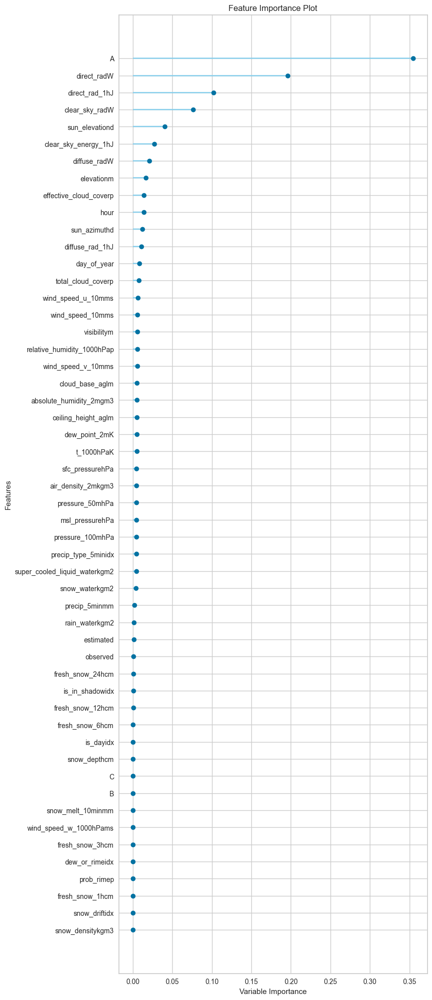

In [ ]:
plot_model(top3[0], plot="feature_all")
# plot_model(gump, plot="feature_all")

In [ ]:
test_data = pipin.get_combined_data(test_data=True)

In [ ]:
tdf = pipin.get_test_data("A")
tdf

,absolute_humidity_2m:gm3,air_density_2m:kgm3,ceiling_height_agl:m,clear_sky_energy_1h:J,clear_sky_rad:W,cloud_base_agl:m,dew_or_rime:idx,dew_point_2m:K,diffuse_rad:W,diffuse_rad_1h:J,...,total_cloud_cover:p,visibility:m,wind_speed_10m:ms,wind_speed_u_10m:ms,wind_speed_v_10m:ms,wind_speed_w_1000hPa:ms,estimated,observed,day_of_year,hour
0,4.325,1.28675,912.700012,0.000000,0.000000,1061.550049,0.0,271.650024,0.000000,0.000000,...,74.949997,29907.500000,3.950,2.100,3.350,0.0,1.0,0.0,121.0,0.0
1,4.275,1.28600,1482.099976,0.000000,0.000000,1075.100098,0.0,271.450012,0.000000,0.000000,...,77.474998,29519.074219,3.825,1.925,3.300,0.0,1.0,0.0,121.0,1.0
2,4.150,1.28375,1791.300049,0.000000,0.000000,1200.400024,0.0,271.049988,0.000000,0.000000,...,88.099998,31009.125000,3.650,1.750,3.200,0.0,1.0,0.0,121.0,2.0
3,4.025,1.28200,2312.875000,10124.424805,11.675000,1179.849976,0.0,270.649994,9.375000,16845.226562,...,68.599998,34552.500000,3.500,1.450,3.150,0.0,1.0,0.0,121.0,3.0
4,3.900,1.28100,2198.299805,141748.593750,76.875000,920.049988,0.0,270.375000,47.400002,102209.703125,...,66.300003,35483.875000,3.325,1.300,3.050,0.0,1.0,0.0,121.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
715,8.350,1.19725,3638.899902,477093.187500,85.099998,2013.750000,0.0,281.575012,33.625000,168774.546875,...,86.150002,44056.375000,2.450,2.075,1.350,0.0,1.0,0.0,184.0,19.0
716,8.525,1.20050,3552.100098,184335.671875,24.799999,1610.900024,0.0,281.850006,14.325000,86321.125000,...,75.324997,44017.175781,2.450,2.100,1.250,0.0,1.0,0.0,184.0,20.0
717,8.825,1.20450,2315.000000,37429.328125,1.275000,1622.800049,0.0,282.325012,1.300000,28169.150391,...,76.849998,43302.050781,2.575,2.150,1.400,0.0,1.0,0.0,184.0,21.0
718,9.025,1.20700,2202.800049,360.049988,0.000000,1767.550049,0.0,282.675018,0.000000,2350.725098,...,98.324997,40505.851562,2.250,1.800,1.350,0.0,1.0,0.0,184.0,22.0


In [ ]:
res_stack = predict_model(top3[0], test_data)
res_stack = res_stack[["prediction_label"]].rename(columns={"prediction_label": "prediction"}).rename_axis(index="id")


In [1]:
%load_ext autoreload

In [2]:
from autogluon.tabular import TabularDataset, TabularPredictor
import pandas as pd
import numpy as np

In [ ]:
import numpy as np
import pandas as pd
from feature_engine.timeseries.forecasting import LagFeatures
from feature_engine.selection import DropCorrelatedFeatures
from sklearn.metrics import mean_absolute_error
import os

current_dir = os.getcwd()
print("Current working directory:", current_dir)


PATH = "../../../"
# Estimate
X_train_estimated_a: pd.DataFrame = pd.read_parquet(
    PATH + 'A/X_train_estimated.parquet')
X_train_estimated_b: pd.DataFrame = pd.read_parquet(
    PATH + "B/X_train_estimated.parquet")
X_train_estimated_c: pd.DataFrame = pd.read_parquet(
    PATH + "C/X_train_estimated.parquet")

# Test estimates
X_test_estimated_a: pd.DataFrame = pd.read_parquet(
    PATH + "A/X_test_estimated.parquet")
X_test_estimated_b: pd.DataFrame = pd.read_parquet(
    PATH + "B/X_test_estimated.parquet")
X_test_estimated_c: pd.DataFrame = pd.read_parquet(
    PATH + "C/X_test_estimated.parquet")

# Observations
X_train_observed_a: pd.DataFrame = pd.read_parquet(
    PATH + "A/X_train_observed.parquet")
X_train_observed_b: pd.DataFrame = pd.read_parquet(
    PATH + "B/X_train_observed.parquet")
X_train_observed_c: pd.DataFrame = pd.read_parquet(
    PATH + "C/X_train_observed.parquet")

# Targets
Y_train_observed_a: pd.DataFrame = pd.read_parquet(
    PATH + "A/train_targets.parquet")
Y_train_observed_b: pd.DataFrame = pd.read_parquet(
    PATH + "B/train_targets.parquet")
Y_train_observed_c: pd.DataFrame = pd.read_parquet(
    PATH + "C/train_targets.parquet")

test_df_example = pd.read_csv(PATH + "test.csv")

best_submission: pd.DataFrame = pd.read_csv(
    PATH + "mikael/submissions/fourth_submission.csv")

optins = {
    "randomize": False,
    "consecutive_threshold": 6,
    "normalize": False,
    "group_by_hour": True,
    "unzip_date_feature": True,
}

# make a options class with the options as attributes


class Options:
    randomize = False
    consecutive_threshold = 6
    normalize = False
    group_by_hour = True
    unzip_date_feature = True

    def __init__(self, randomize=False, consecutive_threshold=6, normalize=False, group_by_hour=True, unzip_date_feature=True) -> None:
        self.randomize = randomize
        self.consecutive_threshold = consecutive_threshold
        self.normalize = normalize
        self.group_by_hour = group_by_hour
        self.unzip_date_feature = unzip_date_feature


class Pipeline:

    def __init__(self):
        pass

    def get_combined_data(self, test_data=False):
        locations = ["A", "B", "C"]
        dfs = []
        for index, location in enumerate(locations):
            if test_data:
                dfs.append(self.get_test_data(location))
            else:
                dfs.append(self.get_data(location))

            dfs[index] = self.onehot_location(dfs[index], location)
        df = pd.concat(dfs).reset_index(drop=True)

        if test_data:
            return df
        return df[[c for c in df if c not in ['pv_measurement']] +  # pv measurement is the target and is at the end columns
                  ['pv_measurement']]
    
    def get_all_data(self, location: str):
        train, targets = self.get_training_data_by_location("A")
        test = self.get_test_data_by_location("A")
        train = self.drop_features(train)
        test = test[train.columns.to_list()]
        train = self.handle_data(train, targets)
        test = self.handle_data(test, test=True)
        return train, test

    def get_data(self, location: str) -> pd.DataFrame:
        train, targets = self.get_training_data_by_location(location)
        return self.handle_data(train, targets)

    def get_test_data(self, location: str, columns: list) -> pd.DataFrame:
        test_data = self.get_test_data_by_location(location)
        test_data = test_data[columns]
        return self.handle_data(test_data)

    def handle_data(self, df, targets=pd.DataFrame(), test=False):
        df["date_calc"] = pd.to_datetime(df["date_calc"])
        df["date_forecast"] = pd.to_datetime(df["date_forecast"])

        # df = self.add_time_since_calucation(df)

        df = self.onehot_estimated(df)
        df = self.unzip_date_feature(df)
        df = self.grouped_by_hour(df)
        df = self.add_lag_features(df)

        df["time"] = df["date_forecast"]
        # df.drop(["date_forecast"], axis=1, inplace=True)
        if not targets.empty:
            df = self.merge_train_target(df, targets)

        # df.drop(["date_calc"], axis=1, inplace=True)
        df.drop(["time"], axis=1, inplace=True)
        # df = self.absolute_values(df)
        return df

    # –––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––– helper funciton ––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––

    def get_training_data_by_location(self, location):
        if location == "A":
            X_train_observed_x = X_train_observed_a
            X_train_estimated_x = X_train_estimated_a
            Y_train_x = Y_train_observed_a
        elif location == "B":
            X_train_observed_x = X_train_observed_b
            X_train_estimated_x = X_train_estimated_b
            Y_train_x = Y_train_observed_b
        elif location == "C":
            X_train_observed_x = X_train_observed_c
            X_train_estimated_x = X_train_estimated_c
            Y_train_x = Y_train_observed_c
        else:
            raise Exception("location must be A, B or C")
        train = pd.concat(
            [X_train_observed_x, X_train_estimated_x]).reset_index(drop=True)
        return train, Y_train_x
    
    def add_lag_features(self, df: pd.DataFrame):
        no_cat_features_1h = [c for c in df.columns if "_1h:" in c]
        lag_cols = df[no_cat_features_1h].select_dtypes(include=["number", "float", "int"]).columns.to_list()
        lag_f = LagFeatures(variables=lag_cols, periods=1)
        df_tr = lag_f.fit_transform(df[lag_cols].select_dtypes(include=["number", "float", "int"]))
        df[df_tr.columns] = df_tr
        return df

    def get_test_data_by_location(self, location: str,  normalize=False) -> pd.DataFrame:
        if location == "A":
            df = X_test_estimated_a
        elif location == "B":
            df = X_test_estimated_b
        elif location == "C":
            df = X_test_estimated_c
        else:
            raise Exception("location must be A, B or C")
        return df.copy()

    def unzip_date_feature(self, df: pd.DataFrame, date_column: str = "date_forecast"):
        df[date_column] = pd.to_datetime(df[date_column])
        
        df["day_of_year"] = df[date_column].dt.day_of_year
        df['time_of_day'] = df[date_column].dt.hour + df['date_forecast'].dt.minute / 60
        
        df['time_sin'] = np.sin(2 * np.pi * df['time_of_day'] / 24)
        df['day_sin'] = np.sin(2 * np.pi * df['day_of_year'] / 365)
        
        # df["month"] = df["date_forecast"].dt.month
        df.drop(columns=["day_of_year", "time_of_day"], inplace=True)
        return df

    def add_time_since_calucation(self, df):
        df["date_calc"] = pd.to_datetime(df["date_calc"])
        df["calculated_ago"] = (
            df["date_forecast"] - df["date_calc"]).dt.total_seconds()
        df["calculated_ago"] = df["calculated_ago"].fillna(
            0)
        return df

    def onehot_estimated(self, df):
        df["estimated"] = 0  # Initialize both columns to 0
        df["observed"] = 0
        estimated_mask = df["date_calc"].notna()
        df.loc[estimated_mask, "estimated"] = 1
        df.loc[~estimated_mask, "observed"] = 1
        return df

    def onehot_location(self, df, location):
        if location == "A":
            df["A"], df["B"], df["C"] = 1, 0, 0
        elif location == "B":
            df["A"], df["B"], df["C"] = 0, 1, 0
        elif location == "C":
            df["A"], df["B"], df["C"] = 0, 0, 1
        return df

    def grouped_by_hour(self, df: pd.DataFrame, date_column: str = "date_forecast"):
        df = df.groupby(pd.Grouper(key=date_column, freq="1H")
                        ).mean(numeric_only=True)
        all_nan_mask = df.isnull().all(axis=1)
        df = df[~all_nan_mask]
        return df.reset_index()

    def merge_train_target(self, x, y):
        # henning får med alle pv measurments selv om han merger på inner time. Fordi resample fyller nan rows for alle timer som ikke er i datasettet.
        merged = pd.merge(x, y, on="time", how="right")
        mask = merged["pv_measurement"].notna()
        merged = merged.loc[mask].reset_index(drop=True)
        return merged

    def absolute_values(self, df: pd.DataFrame):
        df[df.columns] = df[df.columns].abs()
        df = df.replace(-0.0, 0.0)
        return df

    def remove_consecutive_measurments(self, df: pd.DataFrame, consecutive_threshold=6, consecutive_threshold_for_zero=12):
        df = df.copy()
        if consecutive_threshold < 2:
            return df

        column_to_check = 'pv_measurement'
        mask = (df[column_to_check] != df[column_to_check].shift(2)).cumsum()

        df['consecutive_count'] = df.groupby(
            mask).transform('count')[column_to_check]

        mask = (df['consecutive_count'] > consecutive_threshold)
        mask_zero = (df['consecutive_count'] > consecutive_threshold_for_zero) & (
            df[column_to_check] == 0)
        df.drop(columns=["consecutive_count"], inplace=True)

        df = df.loc[~mask]
        df = df.loc[~mask_zero]
        return df.reset_index(drop=True)

    def compare_mae(self, df: pd.DataFrame):
        best_submission: pd.DataFrame = pd.read_csv(
            PATH+"mikael/submissions/best_prediction.csv")
        best_submission = best_submission[["prediction"]]

        if best_submission.shape != df.shape:
            print("best_submission", best_submission.shape)
            print("df", df.shape)
            raise Exception("Dataframe shape must be the same")

        return mean_absolute_error(
            best_submission["prediction"], df["prediction"])

    def split_train_tune(self, df: pd.DataFrame):
        df = df.copy()
        df_estimated = df.loc[df["estimated"] == 1]
        df_observed = df.loc[df["estimated"] == 0]

        num_rows = len(df_estimated)
        middle_index = num_rows // 2

        df_estimated.sample(frac=1, random_state=42)
        train_estimated = df.iloc[:middle_index]
        tune = df.iloc[middle_index:]

        train = pd.concat([df_observed, train_estimated])
        return train, tune
    
    def drop_features(self, df: pd.DataFrame):
        df.drop(
        columns=[
            "wind_speed_w_1000hPa:ms",
            "wind_speed_u_10m:ms",
            "wind_speed_v_10m:ms",
        ], inplace=True)
        # correlated = DropCorrelatedFeatures(variables=None, method='pearson', threshold=0.8)
        # df = correlated.fit_transform(df)
        return df

    def post_processing(self, df: pd.DataFrame, prediction_column: str = "prediction_label"):
        df = df[[prediction_column]].rename(
            columns={prediction_column: "prediction"}).reset_index(drop=True).rename_axis(index="id")

        df["prediction"] = df["prediction"].clip(lower=0)
        return df
    
    def find_min_max_date_in_test(self) -> list:
        locations = ["A", "B", "C"]
        dates = []
        for loc in locations:
            df = self.get_test_data_by_location(loc)
            df["date_forecast"] = pd.to_datetime(df["date_forecast"])
            dates.append((df["date_forecast"].min(),
                         df["date_forecast"].max()))
        return dates

    def split_train_summer_2021(self, df: pd.DataFrame):
        dates = self.find_min_max_date_in_test()
        # set the dates to the summer of 2021
        dates = [(date[0].replace(year=2021), date[1].replace(year=2021))
                 for date in dates]

        summer2021 = df[(df["date_forecast"] >= dates[0][0]) & (
            df["date_forecast"] <= dates[0][1])]

        train = df[~df.index.isin(summer2021.index)]
        return train, summer2021

    def post_processing(self, df: pd.DataFrame, prediction_column: str = "prediction_label"):
        df = df[[prediction_column]].rename(
            columns={prediction_column: "prediction"}).reset_index(drop=True).rename_axis(index="id")

        df["prediction"] = df["prediction"].clip(lower=0)
        return df


# pipe = Pipeline()
# df00 = pipe.get_combined_data()
# df00


# pipin = Pipin()
# x = pipin.get_combined_datasets(data_sets={"A"})

# get all date_calc.rows that are nan


# pipin.compare_mae(pd.DataFrame({"prediction": [1,2,3,4,5]}))

# print("df", big_data.head())
# pipin = Pipin()
# test = pipin.get_combined_test_data()
# pipin.get_data("B")

important_features = [
    'time',
    'direct_rad:W',
    'diffuse_rad:W',
    'sun_azimuth:d',
    'sun_elevation:d',
    'clear_sky_energy_1h:J',
    'clear_sky_rad:W',
    'total_cloud_cover:p',
    'effective_cloud_cover:p',
    'rain_water:kgm2',
    'precip_5min:mm',
    'wind_speed_10m:ms',
    'wind_speed_w_1000hPa:ms',
    'super_cooled_liquid_water:kgm2',
    'air_density_2m:kgm3',
    'pressure_100m:hPa',
    'pressure_50m:hPa',
    'sfc_pressure:hPa',
    'msl_pressure:hPa',
    'dew_point_2m:K',
    'is_day:idx',
    'is_in_shadow:idx',
    'elevation:m',

    "snow_melt_10min:mm",
    "snow_density:kgm3",
    "fresh_snow_6h:cm",
    "fresh_snow_1h:cm",
    "snow_water:kgm2",
    "fresh_snow_12h:cm",
    "fresh_snow_3h:cm",
    "fresh_snow_24h:cm",
    "snow_depth:cm",

    'A',
    'B',
    'C',
    "estimated",
    "observed",
]


In [3]:
%autoreload
from pipeline_145_preset import Pipeline
pipin = Pipeline()

Current working directory: /Users/miksx/GitHub/Forest-Gump/mikael/autoML/gluon


In [4]:
DEFAULT_PATH="ag_145_lag_sine_drop_"

In [5]:
df1_0, test1  = pipin.get_all_data("A")
df2_0, test2 = pipin.get_all_data("B")
df3_0, test3 = pipin.get_all_data("C")

In [6]:
# remove_consecutive_measurments
# 6/24
df1_0 = pipin.remove_consecutive_measurments(df1_0, 4, 24)
df2_0 = pipin.remove_consecutive_measurments(df2_0, 4, 24)
df3_0 = pipin.remove_consecutive_measurments(df3_0, 4, 24)

In [7]:
# tuning
# split_train_summer_2021 test this
train1, tune1 = pipin.split_train_summer_2021(df1_0 )
train2, tune2 = pipin.split_train_summer_2021(df2_0 )
train3, tune3 = pipin.split_train_summer_2021(df3_0 )

In [8]:
train1.describe()

,date_forecast,absolute_humidity_2m:gm3,air_density_2m:kgm3,ceiling_height_agl:m,clear_sky_energy_1h:J,clear_sky_rad:W,cloud_base_agl:m,dew_or_rime:idx,dew_point_2m:K,diffuse_rad:W,...,wind_speed_10m:ms,estimated,observed,time_sin,day_sin,clear_sky_energy_1h:J_lag_1,diffuse_rad_1h:J_lag_1,direct_rad_1h:J_lag_1,fresh_snow_1h:cm_lag_1,pv_measurement
count,18843,18843.000000,18843.000000,15222.000000,1.884300e+04,18843.000000,17463.000000,18843.00000,18843.000000,18843.000000,...,18843.000000,18843.00000,18843.00000,18843.000000,18843.000000,1.884200e+04,1.884200e+04,1.884200e+04,18842.000000,18851.000000
mean,2021-04-20 12:32:06.763254272,7.074725,1.242394,3059.118652,8.994141e+05,249.822983,1751.986084,0.00804,277.785797,68.997200,...,3.065145,0.09956,0.90044,0.033309,-0.004713,8.983328e+05,2.475663e+05,3.016146e+05,0.002777,1023.182602
min,2019-06-02 22:00:00,0.700000,1.145000,27.849998,0.000000e+00,0.000000,27.950001,-1.00000,251.074997,0.000000,...,0.025000,0.00000,0.00000,-0.992522,-0.999991,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000
25%,2020-05-08 13:30:00,4.700000,1.218250,1168.593750,7.897528e+04,21.125000,591.125000,0.00000,272.950012,10.799999,...,1.650000,0.00000,1.00000,-0.632696,-0.699458,7.664217e+04,4.218096e+04,1.700963e+03,0.000000,45.980000
50%,2021-04-05 09:00:00,7.000000,1.240000,2026.737427,5.626879e+05,161.649994,1133.449951,0.00000,278.850006,53.525002,...,2.775000,0.00000,1.00000,0.162460,-0.060213,5.630086e+05,1.919329e+05,5.965061e+04,0.000000,420.200000
75%,2022-05-23 21:30:00,9.050000,1.265750,4279.862305,1.599738e+06,440.337524,2149.912598,0.00000,282.799988,105.599998,...,4.200000,0.00000,1.00000,0.770942,0.729558,1.600173e+06,3.805976e+05,4.065271e+05,0.000000,1519.870000
max,2023-04-30 23:00:00,17.350000,1.426250,12042.525391,2.988628e+06,835.099976,11673.625000,1.00000,293.625000,332.274994,...,11.200000,1.00000,1.00000,0.992522,0.999991,2.988628e+06,1.144410e+06,2.441750e+06,3.125000,5651.800000
std,NaN,2.909262,0.035103,2621.933838,9.085201e+05,253.266098,1832.834717,0.09576,6.747072,66.715828,...,1.776226,0.29942,0.29942,0.704019,0.710937,9.097653e+05,2.368009e+05,4.724599e+05,0.044683,1318.488784


In [9]:
train1 = TabularDataset(df1_0)
train2 = TabularDataset(df2_0)
train3 = TabularDataset(df3_0)

In [10]:
tuning1 = TabularDataset(tune1)
tuning2 = TabularDataset(tune2)
tuning3 = TabularDataset(tune3)

In [11]:
predictor1 = TabularPredictor(label="pv_measurement", eval_metric='mean_absolute_error',
                                                            path= DEFAULT_PATH+"A").fit(
    train1,
    time_limit=3600,
    # hyperparameters='extrme', 
    presets='best_quality',
    tuning_data = tuning1,
    use_bag_holdout=True,
    # num_bag_folds= 6,
    # refit_full = True,
    # auto_stack = True,
    # num_bag_sets= 10,
    # set_best_to_refit_full= True,
    # num_stack_levels = 2,
    # verbosity = 3
    )

Presets specified: ['best_quality']
/Users/miksx/anaconda3/envs/TDT4173/lib/python3.10/site-packages/autogluon/core/utils/utils.py:564: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context("mode.use_inf_as_na", True):  # treat None, NaN, INF, NINF as NA
Stack configuration (auto_stack=True): num_stack_levels=1, num_bag_folds=8, num_bag_sets=20
Beginning AutoGluon training ... Time limit = 3600s
AutoGluon will save models to "ag_145_lag_sine_drop_A"
AutoGluon Version:  0.8.2
Python Version:     3.10.12
Operating System:   Darwin
Platform Machine:   arm64
Platform Version:   Darwin Kernel Version 23.0.0: Fri Sep 15 14:41:43 PDT 2023; root:xnu-10002.1.13~1/RELEASE_ARM64_T6000
Disk Space Avail:   252.93 GB / 494.38 GB (51.2%)
Train Data Rows:    20301
Train Data Columns: 51
Tuning Data Rows:    1450
Tuning Data Columns: 51
Label Column: pv_measurement
Preprocessing data ...
/U

In [12]:
predictor2 = TabularPredictor(label="pv_measurement", eval_metric='mean_absolute_error',
                                                            path= DEFAULT_PATH+"B").fit(
    train2,

    presets='best_quality', 
    # hyperparameters='very_large', 
    time_limit=3600,
    tuning_data = tuning2,
    use_bag_holdout=True,
    # num_bag_folds= 6,
    # refit_full = True,
    # auto_stack = True,
    # num_bag_sets= 10,
    # set_best_to_refit_full= True,
    # num_stack_levels = 2,
    # verbosity = 3
    )

# tuning_data
# num bag holdout 6
# bag_holdout

Presets specified: ['best_quality']
/Users/miksx/anaconda3/envs/TDT4173/lib/python3.10/site-packages/autogluon/core/utils/utils.py:564: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context("mode.use_inf_as_na", True):  # treat None, NaN, INF, NINF as NA
Stack configuration (auto_stack=True): num_stack_levels=1, num_bag_folds=8, num_bag_sets=20
Beginning AutoGluon training ... Time limit = 3600s
AutoGluon will save models to "ag_145_lag_sine_drop_B"
AutoGluon Version:  0.8.2
Python Version:     3.10.12
Operating System:   Darwin
Platform Machine:   arm64
Platform Version:   Darwin Kernel Version 23.0.0: Fri Sep 15 14:41:43 PDT 2023; root:xnu-10002.1.13~1/RELEASE_ARM64_T6000
Disk Space Avail:   247.08 GB / 494.38 GB (50.0%)
Train Data Rows:    20301
Train Data Columns: 51
Tuning Data Rows:    1450
Tuning Data Columns: 51
Label Column: pv_measurement
Preprocessing data ...
/U

In [13]:
predictor3 = TabularPredictor(label="pv_measurement", eval_metric='mean_absolute_error',
                                                            path= DEFAULT_PATH+"C").fit(
    train3,

    presets='best_quality', 
    # hyperparameters='very_large', 
    time_limit=3600,
    tuning_data = tuning3,
    use_bag_holdout=True,
    # num_bag_folds= 6,
    # refit_full = True,
    # auto_stack = True,
    # num_bag_sets= 10,
    # set_best_to_refit_full= True,
    # num_stack_levels = 2,
    # verbosity = 3
    )

Presets specified: ['best_quality']
/Users/miksx/anaconda3/envs/TDT4173/lib/python3.10/site-packages/autogluon/core/utils/utils.py:564: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context("mode.use_inf_as_na", True):  # treat None, NaN, INF, NINF as NA
Stack configuration (auto_stack=True): num_stack_levels=1, num_bag_folds=8, num_bag_sets=20
Beginning AutoGluon training ... Time limit = 3600s
AutoGluon will save models to "ag_145_lag_sine_drop_C"
AutoGluon Version:  0.8.2
Python Version:     3.10.12
Operating System:   Darwin
Platform Machine:   arm64
Platform Version:   Darwin Kernel Version 23.0.0: Fri Sep 15 14:41:43 PDT 2023; root:xnu-10002.1.13~1/RELEASE_ARM64_T6000
Disk Space Avail:   239.24 GB / 494.38 GB (48.4%)
Train Data Rows:    20301
Train Data Columns: 51
Tuning Data Rows:    1450
Tuning Data Columns: 51
Label Column: pv_measurement
Preprocessing data ...
/U

In [14]:
test_data1 = TabularDataset(test1)
test_data2 = TabularDataset(test2)
test_data3 = TabularDataset(test3)

pred1 = pd.DataFrame(predictor1.predict(test_data1))
pred2 = pd.DataFrame(predictor2.predict(test_data2))
pred3 = pd.DataFrame(predictor3.predict(test_data3))

negatives_pred1 = pred1[pred1["pv_measurement"] < 0]
negatives_pred2 = pred2[pred2["pv_measurement"] < 0]
negatives_pred3 = pred3[pred3["pv_measurement"] < 0]
neg = pd.concat([negatives_pred1, negatives_pred2, negatives_pred3])
neg.shape

(0, 1)

In [15]:
pred = pd.concat([pred1, pred2, pred3])
final_prediction = pipin.post_processing(pred, prediction_column="pv_measurement")
final_prediction.to_csv('gluon_3_same_as_145_tune_lag_sine_drop.csv')

In [16]:
diff = pipin.compare_mae(final_prediction)
diff

564.1427064806163

In [17]:
# predictor.evaluate(df1, silent=True)

<h3> prøver å gjenskape henning sin 143.</h3>
<p><p>

In [1]:
%load_ext autoreload

In [2]:
from autogluon.tabular import TabularDataset, TabularPredictor
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

/Users/miksx/.pyenv/versions/3.10.12/envs/TDT4173/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [ ]:
import pandas as pd
from sklearn.metrics import mean_absolute_error
import numpy as np
import os

current_dir = os.getcwd()
print("Current working directory:", current_dir)

PATH = "../../../"
# Estimate
X_train_estimated_a: pd.DataFrame = pd.read_parquet(
    PATH + 'A/X_train_estimated.parquet')
X_train_estimated_b: pd.DataFrame = pd.read_parquet(
    PATH + "B/X_train_estimated.parquet")
X_train_estimated_c: pd.DataFrame = pd.read_parquet(
    PATH + "C/X_train_estimated.parquet")

# Test estimates
X_test_estimated_a: pd.DataFrame = pd.read_parquet(
    PATH + "A/X_test_estimated.parquet")
X_test_estimated_b: pd.DataFrame = pd.read_parquet(
    PATH + "B/X_test_estimated.parquet")
X_test_estimated_c: pd.DataFrame = pd.read_parquet(
    PATH + "C/X_test_estimated.parquet")

# Observations
X_train_observed_a: pd.DataFrame = pd.read_parquet(
    PATH + "A/X_train_observed.parquet")
X_train_observed_b: pd.DataFrame = pd.read_parquet(
    PATH + "B/X_train_observed.parquet")
X_train_observed_c: pd.DataFrame = pd.read_parquet(
    PATH + "C/X_train_observed.parquet")

# Targets
Y_train_observed_a: pd.DataFrame = pd.read_parquet(
    PATH + "A/train_targets.parquet")
Y_train_observed_b: pd.DataFrame = pd.read_parquet(
    PATH + "B/train_targets.parquet")
Y_train_observed_c: pd.DataFrame = pd.read_parquet(
    PATH + "C/train_targets.parquet")

test_df_example = pd.read_csv(PATH + "test.csv")

best_submission: pd.DataFrame = pd.read_csv(
    PATH + "mikael/submissions/fourth_submission.csv")

optins = {
    "randomize": False,
    "consecutive_threshold": 6,
    "normalize": False,
    "group_by_hour": True,
    "unzip_date_feature": True,
}

# make a options class with the options as attributes


class Options:
    randomize = False
    consecutive_threshold = 6
    normalize = False
    group_by_hour = True
    unzip_date_feature = True

    def __init__(self, randomize=False, consecutive_threshold=6, normalize=False, group_by_hour=True, unzip_date_feature=True) -> None:
        self.randomize = randomize
        self.consecutive_threshold = consecutive_threshold
        self.normalize = normalize
        self.group_by_hour = group_by_hour
        self.unzip_date_feature = unzip_date_feature


class Pipeline:

    def __init__(self):
        pass

    def get_combined_data(self, test_data=False):
        locations = ["A", "B", "C"]
        dfs = []
        for index, location in enumerate(locations):
            if test_data:
                dfs.append(self.get_test_data(location))
            else:
                dfs.append(self.get_data(location))

            dfs[index] = self.onehot_location(dfs[index], location)
        df = pd.concat(dfs).reset_index(drop=True)

        if test_data:
            return df
        return df[[c for c in df if c not in ['pv_measurement']] +  # pv measurement is the target and is at the end columns
                  ['pv_measurement']]

    def get_data(self, location: str, keeptime=False) -> pd.DataFrame:
        train, targets = self.get_training_data_by_location(location)
        return self.handle_data(train, targets, keeptime=keeptime)

    def get_test_data(self, location: str) -> pd.DataFrame:
        test_data = self.get_test_data_by_location(location)
        return self.handle_data(test_data)

    def handle_data(self, df, targets=pd.DataFrame(), keeptime=False):
        df["date_calc"] = pd.to_datetime(df["date_calc"])
        df["date_forecast"] = pd.to_datetime(df["date_forecast"])

        df = self.drop_columns(df)
        df = self.grouped_by_hour(df)

        df = self.unzip_date_feature(df)
        df = self.onehot_estimated(df)

        df["time"] = df["date_forecast"]
        df.drop(["date_forecast"], axis=1, inplace=True)
        if not targets.empty:
            df = self.merge_train_target(df, targets)

        df.drop(columns=["time"], axis=1, inplace=True)

        df = self.absolute_values(df)
        return df

    # –––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––– helper funciton ––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––

    def get_training_data_by_location(self, location):
        if location == "A":
            X_train_observed_x = X_train_observed_a
            X_train_estimated_x = X_train_estimated_a
            Y_train_x = Y_train_observed_a
        elif location == "B":
            X_train_observed_x = X_train_observed_b
            X_train_estimated_x = X_train_estimated_b
            Y_train_x = Y_train_observed_b
        elif location == "C":
            X_train_observed_x = X_train_observed_c
            X_train_estimated_x = X_train_estimated_c
            Y_train_x = Y_train_observed_c
        else:
            raise Exception("location must be A, B or C")
        train = pd.concat(
            [X_train_observed_x, X_train_estimated_x]).reset_index(drop=True)
        return train, Y_train_x

    def get_test_data_by_location(self, location: str,  normalize=False) -> pd.DataFrame:
        if location == "A":
            df = X_test_estimated_a
        elif location == "B":
            df = X_test_estimated_b
        elif location == "C":
            df = X_test_estimated_c
        else:
            raise Exception("location must be A, B or C")
        return df.copy()

    def unzip_date_feature(self, df: pd.DataFrame, date_column: str = "date_forecast"):
        df[date_column] = pd.to_datetime(df[date_column])
        df['day_of_year_sin'] = np.sin(2 * np.pi * df[date_column].dt.dayofyear / 365.25)
        df['hour'] = np.sin(2 * np.pi * df[date_column].dt.hour / 24)
        # df["month"] = df["date_forecast"].dt.month
        return df

    def add_time_since_calucation(self, df):  # denne er ikke så dum.
        df["date_calc"] = pd.to_datetime(df["date_calc"])
        df["calculated_ago"] = (
            df["date_forecast"] - df["date_calc"]).dt.total_seconds()
        df["calculated_ago"] = df["calculated_ago"].fillna(
            0) / 60/30
        return df

    def onehot_estimated(self, df):
        df["estimated"] = 0  # Initialize both columns to 0
        df["observed"] = 0
        estimated_mask = df["date_calc"].notna()
        df.loc[estimated_mask, "estimated"] = 1
        df.loc[~estimated_mask, "observed"] = 1
        df.drop(columns=["date_calc"], inplace=True)
        return df

    def onehot_location(self, df, location):
        if location == "A":
            df["A"], df["B"], df["C"] = 1, 0, 0
        elif location == "B":
            df["A"], df["B"], df["C"] = 0, 1, 0
        elif location == "C":
            df["A"], df["B"], df["C"] = 0, 0, 1
        return df

    def grouped_by_hour(self, df: pd.DataFrame, date_column: str = "date_forecast") -> pd.DataFrame:
        # Group by hour and aggregate the values into lists for all columns
        df['date_hour'] = df[date_column].dt.to_period('H')
        df["min"] = df[date_column].dt.minute
        df.drop(columns=[date_column], inplace=True)

        # Use pivot_table to combine rows with the same date and hour
        pivot_df = df.pivot_table(index=['date_hour'], columns=[
                                  'min'], values=df.columns, aggfunc='first')
        # rename the date_hour to date_forecast
        # pivot_df.columns = [f'{col[0]}_{col[1]}' if col[1]
        #                     else col[0] for col in pivot_df.columns]

        pivot_df.index.names = [date_column]

        # Reset index to make 'date' a regular column
        pivot_df.columns = pivot_df.columns.to_flat_index()
        pivot_df.reset_index(inplace=True)

        pivot_df["date_forecast"] = pivot_df["date_forecast"].dt.to_timestamp()

        pivot_df["date_calc"] = pivot_df[('date_calc', 0)]
        pivot_df.drop(columns=[
            ('date_calc', c) for c in range(0, 60, 15)
        ], inplace=True)

        pivot_df.columns = [str(col) for col in pivot_df.columns]

        return pivot_df

    def grouped_by_hour_old(self, df: pd.DataFrame, date_column: str = "date_forecast"):
        df = df.groupby(pd.Grouper(key=date_column, freq="1H")
                        ).mean(numeric_only=True)
        all_nan_mask = df.isnull().all(axis=1)
        df = df[~all_nan_mask]
        return df.reset_index()

    def merge_train_target(self, x, y):
        # henning får med alle pv measurments selv om han merger på inner time. Fordi resample fyller nan rows for alle timer som ikke er i datasettet.
        merged = pd.merge(x, y, on="time", how="right")
        mask = merged["pv_measurement"].notna()
        merged = merged.loc[mask].reset_index(drop=True)
        return merged

    def absolute_values(self, df: pd.DataFrame):
        columns = list(df.columns)
        df[columns] = df[columns].abs()
        df = df.replace(-0.0, 0.0)
        return df

    def lag_features_by_1_hour(df, columns_to_lag):
        lag_columns = [c for c in df.columns if "_1h:" in c]
        df[lag_columns] = df[lag_columns].shift(1)
        return df

    def remove_consecutive_measurments_new(self, df: pd.DataFrame, consecutive_threshold=3, consecutive_threshold_zero=12,  return_removed=False):
        if consecutive_threshold < 2:
            return df

        column_to_check = 'pv_measurement'

        mask = (df[column_to_check] != df[column_to_check].shift(1)).cumsum()
        df['consecutive_group'] = df.groupby(
            mask).transform('count')[column_to_check]

        df["is_first_in_consecutive_group"] = False
        df['is_first_in_consecutive_group'] = df['consecutive_group'] != df['consecutive_group'].shift(
            1)

        # masks to remove rows
        mask_non_zero = (df['consecutive_group'] >= consecutive_threshold) & (
            df["pv_measurement"] > 0) & (df["is_first_in_consecutive_group"] == False)  # or df["direct_rad:W"] == 0)

        mask_zero = (df['consecutive_group'] >= consecutive_threshold_zero) & (
            df["pv_measurement"] == 0) & (df["is_first_in_consecutive_group"] == False)

        mask = mask_non_zero | mask_zero

        if return_removed:
            return df[mask]

        df = df.loc[~mask]

        df = df.drop(columns=["consecutive_group",
                     "is_first_in_consecutive_group"])

        return df.reset_index(drop=True)

    def remove_consecutive_measurments_new_new(self, df: pd.DataFrame, consecutive_threshold=3, consecutive_threshold_zero=12, consecutive_threshold_zero_no_rad=20, return_removed=False):
        if consecutive_threshold < 2:
            return df

        column_to_check = 'pv_measurement'

        mask = (df[column_to_check] != df[column_to_check].shift(1)).cumsum()
        df['consecutive_group'] = df.groupby(
            mask).transform('count')[column_to_check]

        df["is_first_in_consecutive_group"] = False
        df['is_first_in_consecutive_group'] = df['consecutive_group'] != df['consecutive_group'].shift(
            1)

        # masks to remove rows
        mask_non_zero = (df['consecutive_group'] >= consecutive_threshold) & (
            df["pv_measurement"] > 0) & (df["is_first_in_consecutive_group"] == False)  # or df["direct_rad:W"] == 0)

        tol = 10
        mask_zero = (df['consecutive_group'] >= consecutive_threshold_zero) & (
            df["pv_measurement"] == 0) & (df["direct_rad:W"] > tol)

        mask_zero_no_rad = (df['consecutive_group'] >= consecutive_threshold_zero_no_rad) & (
            df["pv_measurement"] == 0) & (df["direct_rad:W"] < tol)
        mask = mask_non_zero | mask_zero | mask_zero_no_rad

        if return_removed:
            return df[mask]

        df = df.loc[~mask]

        df = df.drop(columns=["consecutive_group",
                     "is_first_in_consecutive_group"])

        return df.reset_index(drop=True)

    def compare_mae(self, df: pd.DataFrame):
        best_submission: pd.DataFrame = pd.read_csv(
            PATH+"mikael/best_prediction.csv")
        best_submission = best_submission[["prediction"]]

        if best_submission.shape != df.shape:
            print("best_submission", best_submission.shape)
            print("df", df.shape)
            raise Exception("Dataframe shape must be the same")

        return mean_absolute_error(
            best_submission["prediction"], df["prediction"])

    def drop_columns(self, df: pd.DataFrame):
        drop = [
            # wind speed vector u, available up to 20000 m, from 1000 hPa to 10 hPa and on flight levels FL10-FL900[m/s] does not make sens at surfece level
            "wind_speed_w_1000hPa:ms",
            "wind_speed_u_10m:ms",  # same as above
            "wind_speed_v_10m:ms",  # same as above
            "snow_density:kgm3",
            "snow_drift:idx",
            # "snow_melt_10min:mm",  # veldig få verdier
        ]
        shared_columns = list(set(df.columns) & set(drop))
        df = df.drop(columns=shared_columns)
        return df

    def find_min_max_date_in_test(self) -> list:
        locations = ["A", "B", "C"]
        dates = []
        for loc in locations:
            df = self.get_test_data_by_location(loc)
            df["date_forecast"] = pd.to_datetime(df["date_forecast"])
            dates.append((df["date_forecast"].min(),
                         df["date_forecast"].max()))
        return dates

    def split_train_summer_2021(self, df: pd.DataFrame):
        dates = self.find_min_max_date_in_test()
        # set the dates to the summer of 2021
        dates = [(date[0].replace(year=2021), date[1].replace(year=2021))
                 for date in dates]

        summer2021 = df[(df["date_forecast"] >= dates[0][0]) & (
            df["date_forecast"] <= dates[0][1])]

        train = df[~df.index.isin(summer2021.index)]
        return train, summer2021

    def post_processing(self, df: pd.DataFrame, prediction_column: str = "prediction_label"):
        df = df[[prediction_column]].rename(
            columns={prediction_column: "prediction"}).reset_index(drop=True).rename_axis(index="id")

        df["prediction"] = df["prediction"].clip(lower=0)
        return df


# pipe = Pipeline()
# df00 = pipe.get_combined_data()
# df00


# pipin = Pipin()
# x = pipin.get_combined_datasets(data_sets={"A"})

# get all date_calc.rows that are nan


# pipin.compare_mae(pd.DataFrame({"prediction": [1,2,3,4,5]}))

# print("df", big_data.head())
# pipin = Pipin()
# test = pipin.get_combined_test_data()
# pipin.get_data("B")

important_features = [
    'time',
    'direct_rad:W',
    'diffuse_rad:W',
    'sun_azimuth:d',
    'sun_elevation:d',
    'clear_sky_energy_1h:J',
    'clear_sky_rad:W',
    'total_cloud_cover:p',
    'effective_cloud_cover:p',
    'rain_water:kgm2',
    'precip_5min:mm',
    'wind_speed_10m:ms',
    'wind_speed_w_1000hPa:ms',
    'super_cooled_liquid_water:kgm2',
    'air_density_2m:kgm3',
    'pressure_100m:hPa',
    'pressure_50m:hPa',
    'sfc_pressure:hPa',
    'msl_pressure:hPa',
    'dew_point_2m:K',
    'is_day:idx',
    'is_in_shadow:idx',
    'elevation:m',

    "snow_melt_10min:mm",
    "snow_density:kgm3",
    "fresh_snow_6h:cm",
    "fresh_snow_1h:cm",
    "snow_water:kgm2",
    "fresh_snow_12h:cm",
    "fresh_snow_3h:cm",
    "fresh_snow_24h:cm",
    "snow_depth:cm",

    'A',
    'B',
    'C',
    "estimated",
    "observed",
]


In [3]:
%autoreload
from pipeline import Pipeline
pipin = Pipeline()

Current working directory: /Users/miksx/GitHub/Forest-Gump/mikael/autoML/gluon


In [4]:
PATH = "ag_144_exstract_time_4_17"

In [5]:
df1_0 = pipin.get_data("A")
df2_0 = pipin.get_data("B")
df3_0 = pipin.get_data("C")

In [6]:
numeric_columns = df1_0.select_dtypes(include='number').columns

# Select columns with negative values, excluding datetime columns
negative_columns = numeric_columns[(df1_0[numeric_columns] < 0).any()]
negative_columns

Index([], dtype='object')

In [7]:
# remove_consecutive_measurments
# 6/24
# dette skal prøve å gjenskape henning sin
df1_0 = pipin.remove_consecutive_measurments_new(df1_0, 4, 17)
df2_0 = pipin.remove_consecutive_measurments_new(df2_0, 4, 17)
df3_0 = pipin.remove_consecutive_measurments_new(df3_0, 4, 17)

/Users/miksx/GitHub/Forest-Gump/mikael/autoML/gluon/pipeline.py:250: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['consecutive_group'] = df.groupby(
/Users/miksx/GitHub/Forest-Gump/mikael/autoML/gluon/pipeline.py:253: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["is_first_in_consecutive_group"] = False
/Users/miksx/GitHub/Forest-Gump/mikael/autoML/gluon/pipeline.py:250: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consid

In [8]:
print(df1_0.shape, df2_0.shape, df3_0.shape)

(28713, 165) (20132, 165) (17076, 165)


In [9]:
df1_0.describe()

,"('absolute_humidity_2m:gm3', 0)","('absolute_humidity_2m:gm3', 15)","('absolute_humidity_2m:gm3', 30)","('absolute_humidity_2m:gm3', 45)","('air_density_2m:kgm3', 0)","('air_density_2m:kgm3', 15)","('air_density_2m:kgm3', 30)","('air_density_2m:kgm3', 45)","('ceiling_height_agl:m', 0)","('ceiling_height_agl:m', 15)",...,"('visibility:m', 45)","('wind_speed_10m:ms', 0)","('wind_speed_10m:ms', 15)","('wind_speed_10m:ms', 30)","('wind_speed_10m:ms', 45)",day_of_year_sin,hour,estimated,observed,pv_measurement
count,28705.000000,28705.000000,28705.000000,28705.000000,28705.000000,28705.000000,28705.000000,28705.000000,21845.000000,23279.000000,...,28705.000000,28705.000000,28705.000000,28705.000000,28705.000000,28705.000000,28705.000000,28705.000000,28705.000000,28713.000000
mean,6.745494,6.745640,6.745375,6.745612,1.248199,1.248196,1.248203,1.248202,2961.565186,3057.664795,...,32259.802734,3.015646,3.015614,3.015711,3.015924,0.691487,0.618251,0.108692,0.891308,748.574534
std,2.793042,2.790889,2.789928,2.790788,0.035889,0.035853,0.035836,0.035848,2615.146729,2647.720703,...,17619.517578,1.770563,1.755222,1.749676,1.755036,0.293663,0.316334,0.311258,0.311258,1235.045878
min,0.700000,0.700000,0.700000,0.700000,1.145000,1.145000,1.145000,1.145000,27.799999,27.799999,...,265.299988,0.000000,0.000000,0.000000,0.000000,0.004301,0.000000,0.000000,0.000000,0.000000
25%,4.500000,4.500000,4.500000,4.500000,1.224000,1.224000,1.224000,1.224000,1096.300049,1145.550049,...,16159.599609,1.600000,1.600000,1.600000,1.600000,0.484089,0.258819,0.000000,1.000000,0.000000
50%,6.500000,6.500000,6.500000,6.500000,1.246000,1.246000,1.246000,1.246000,1916.400024,1997.199951,...,35751.398438,2.700000,2.700000,2.700000,2.700000,0.790563,0.707107,0.000000,1.000000,83.820000
75%,8.700000,8.700000,8.700000,8.700000,1.272000,1.272000,1.272000,1.272000,4082.899902,4293.750000,...,47427.699219,4.100000,4.100000,4.100000,4.100000,0.948772,0.866025,0.000000,1.000000,949.300000
max,17.500000,17.400000,17.400000,17.400000,1.427000,1.426000,1.426000,1.426000,12307.700195,12294.900391,...,70518.203125,11.400000,11.300000,11.100000,11.100000,0.999999,1.000000,1.000000,1.000000,5733.420000


In [10]:
train1 = TabularDataset(df1_0)
train2 = TabularDataset(df2_0)
train3 = TabularDataset(df3_0)

In [11]:
predictor1 = TabularPredictor(label="pv_measurement", eval_metric='mean_absolute_error',
                              path=PATH+"A").fit(
    train1,
    # time_limit=60,
    presets='best_quality',
    # tuning_data = tuning1,
    # use_bag_holdout=True,

    # verbosity = 3
    )

Presets specified: ['best_quality']
/Users/miksx/.pyenv/versions/3.10.12/envs/TDT4173/lib/python3.10/site-packages/autogluon/core/utils/utils.py:564: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context("mode.use_inf_as_na", True):  # treat None, NaN, INF, NINF as NA
Stack configuration (auto_stack=True): num_stack_levels=1, num_bag_folds=8, num_bag_sets=1
Beginning AutoGluon training ...
AutoGluon will save models to "ag_144_exstract_time_4_17A"
AutoGluon Version:  0.8.3b20231108
Python Version:     3.10.12
Operating System:   Darwin
Platform Machine:   arm64
Platform Version:   Darwin Kernel Version 23.0.0: Fri Sep 15 14:41:43 PDT 2023; root:xnu-10002.1.13~1/RELEASE_ARM64_T6000
Disk Space Avail:   243.23 GB / 494.38 GB (49.2%)
Train Data Rows:    28713
Train Data Columns: 164
Label Column: pv_measurement
Preprocessing data ...
/Users/miksx/.pyenv/versions/3.10.12/envs/TD

In [12]:
test1 = pipin.get_test_data("A")
test_data1 = TabularDataset(test1)


pred1 = pd.DataFrame(predictor1.predict(test_data1))

/Users/miksx/.pyenv/versions/3.10.12/envs/TDT4173/lib/python3.10/site-packages/autogluon/tabular/models/fastainn/tabular_nn_fastai.py:200: FutureWarning: The 'downcast' keyword in fillna is deprecated and will be removed in a future version. Use res.infer_objects(copy=False) to infer non-object dtype, or pd.to_numeric with the 'downcast' keyword to downcast numeric results.
  df = df.fillna(column_fills, inplace=False, downcast=False)
/Users/miksx/.pyenv/versions/3.10.12/envs/TDT4173/lib/python3.10/site-packages/autogluon/tabular/models/fastainn/tabular_nn_fastai.py:200: FutureWarning: The 'downcast' keyword in fillna is deprecated and will be removed in a future version. Use res.infer_objects(copy=False) to infer non-object dtype, or pd.to_numeric with the 'downcast' keyword to downcast numeric results.
  df = df.fillna(column_fills, inplace=False, downcast=False)
/Users/miksx/.pyenv/versions/3.10.12/envs/TDT4173/lib/python3.10/site-packages/autogluon/tabular/models/fastainn/tabular_n

In [13]:
predictor2 = TabularPredictor(label="pv_measurement", eval_metric='mean_absolute_error',
                              path=PATH+"B").fit(
    train2,

    presets='best_quality', 
    # hyperparameters='very_large', 
    # time_limit=60,
    # tuning_data = tuning2,
    # use_bag_holdout=True,
    # verbosity = 3
    )

Presets specified: ['best_quality']
/Users/miksx/.pyenv/versions/3.10.12/envs/TDT4173/lib/python3.10/site-packages/autogluon/core/utils/utils.py:564: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context("mode.use_inf_as_na", True):  # treat None, NaN, INF, NINF as NA
Stack configuration (auto_stack=True): num_stack_levels=1, num_bag_folds=8, num_bag_sets=1
Beginning AutoGluon training ...
AutoGluon will save models to "ag_144_exstract_time_4_17B"
AutoGluon Version:  0.8.3b20231108
Python Version:     3.10.12
Operating System:   Darwin
Platform Machine:   arm64
Platform Version:   Darwin Kernel Version 23.0.0: Fri Sep 15 14:41:43 PDT 2023; root:xnu-10002.1.13~1/RELEASE_ARM64_T6000
Disk Space Avail:   238.02 GB / 494.38 GB (48.1%)
Train Data Rows:    20132
Train Data Columns: 164
Label Column: pv_measurement
Preprocessing data ...
/Users/miksx/.pyenv/versions/3.10.12/envs/TD

In [14]:
predictor3 = TabularPredictor(label="pv_measurement", eval_metric='mean_absolute_error',
                              path=PATH+"C").fit(
    train3,

    presets='best_quality', 
    # hyperparameters='very_large', 
    # time_limit=60,
    # tuning_data = tuning3,
    # use_bag_holdout=True,
    # verbosity = 3
    )

Presets specified: ['best_quality']
/Users/miksx/.pyenv/versions/3.10.12/envs/TDT4173/lib/python3.10/site-packages/autogluon/core/utils/utils.py:564: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context("mode.use_inf_as_na", True):  # treat None, NaN, INF, NINF as NA
Stack configuration (auto_stack=True): num_stack_levels=1, num_bag_folds=8, num_bag_sets=1
Beginning AutoGluon training ...
AutoGluon will save models to "ag_144_exstract_time_4_17C"
AutoGluon Version:  0.8.3b20231108
Python Version:     3.10.12
Operating System:   Darwin
Platform Machine:   arm64
Platform Version:   Darwin Kernel Version 23.0.0: Fri Sep 15 14:41:43 PDT 2023; root:xnu-10002.1.13~1/RELEASE_ARM64_T6000
Disk Space Avail:   228.41 GB / 494.38 GB (46.2%)
Train Data Rows:    17076
Train Data Columns: 164
Label Column: pv_measurement
Preprocessing data ...
/Users/miksx/.pyenv/versions/3.10.12/envs/TD

In [15]:
test1 = pipin.get_test_data("A")
test2 = pipin.get_test_data("B")
test3 = pipin.get_test_data("C")

In [16]:
test_data1 = TabularDataset(test1)
test_data2 = TabularDataset(test2)
test_data3 = TabularDataset(test3)

# pred1 = pd.DataFrame(predictor1.predict(test_data1))
pred2 = pd.DataFrame(predictor2.predict(test_data2))
pred3 = pd.DataFrame(predictor3.predict(test_data3))

negatives_pred1 = pred1[pred1["pv_measurement"] < 0]
negatives_pred2 = pred2[pred2["pv_measurement"] < 0]
negatives_pred3 = pred3[pred3["pv_measurement"] < 0]
neg = pd.concat([negatives_pred1, negatives_pred2, negatives_pred3])
neg.shape

/Users/miksx/.pyenv/versions/3.10.12/envs/TDT4173/lib/python3.10/site-packages/autogluon/tabular/models/fastainn/tabular_nn_fastai.py:200: FutureWarning: The 'downcast' keyword in fillna is deprecated and will be removed in a future version. Use res.infer_objects(copy=False) to infer non-object dtype, or pd.to_numeric with the 'downcast' keyword to downcast numeric results.
  df = df.fillna(column_fills, inplace=False, downcast=False)
/Users/miksx/.pyenv/versions/3.10.12/envs/TDT4173/lib/python3.10/site-packages/autogluon/tabular/models/fastainn/tabular_nn_fastai.py:200: FutureWarning: The 'downcast' keyword in fillna is deprecated and will be removed in a future version. Use res.infer_objects(copy=False) to infer non-object dtype, or pd.to_numeric with the 'downcast' keyword to downcast numeric results.
  df = df.fillna(column_fills, inplace=False, downcast=False)
/Users/miksx/.pyenv/versions/3.10.12/envs/TDT4173/lib/python3.10/site-packages/autogluon/tabular/models/fastainn/tabular_n

(38, 1)

In [17]:
pred = pd.concat([pred1, pred2, pred3])
final_prediction = pipin.post_processing(pred, prediction_column="pv_measurement")
final_prediction.to_csv('submissions/gluon_3_exstract_time_4_17_backwards.csv')

In [21]:
diff = pipin.compare_mae(final_prediction)
diff

21.880052342675608

In [19]:
# predictor.evaluate(df1, silent=True)

<h3> Henning skal teste å fjerne consecutives.</h3>
<p> yee<p>

In [1]:
%load_ext autoreload

In [2]:
from autogluon.tabular import TabularDataset, TabularPredictor
import pandas as pd
import numpy as np

In [ ]:
import numpy as np
import pandas as pd
from feature_engine.timeseries.forecasting import LagFeatures
from feature_engine.selection import DropCorrelatedFeatures
from sklearn.metrics import mean_absolute_error
import os

current_dir = os.getcwd()
print("Current working directory:", current_dir)


PATH = "../../../"
# Estimate
X_train_estimated_a: pd.DataFrame = pd.read_parquet(
    PATH + 'A/X_train_estimated.parquet')
X_train_estimated_b: pd.DataFrame = pd.read_parquet(
    PATH + "B/X_train_estimated.parquet")
X_train_estimated_c: pd.DataFrame = pd.read_parquet(
    PATH + "C/X_train_estimated.parquet")

# Test estimates
X_test_estimated_a: pd.DataFrame = pd.read_parquet(
    PATH + "A/X_test_estimated.parquet")
X_test_estimated_b: pd.DataFrame = pd.read_parquet(
    PATH + "B/X_test_estimated.parquet")
X_test_estimated_c: pd.DataFrame = pd.read_parquet(
    PATH + "C/X_test_estimated.parquet")

# Observations
X_train_observed_a: pd.DataFrame = pd.read_parquet(
    PATH + "A/X_train_observed.parquet")
X_train_observed_b: pd.DataFrame = pd.read_parquet(
    PATH + "B/X_train_observed.parquet")
X_train_observed_c: pd.DataFrame = pd.read_parquet(
    PATH + "C/X_train_observed.parquet")

# Targets
Y_train_observed_a: pd.DataFrame = pd.read_parquet(
    PATH + "A/train_targets.parquet")
Y_train_observed_b: pd.DataFrame = pd.read_parquet(
    PATH + "B/train_targets.parquet")
Y_train_observed_c: pd.DataFrame = pd.read_parquet(
    PATH + "C/train_targets.parquet")

test_df_example = pd.read_csv(PATH + "test.csv")

best_submission: pd.DataFrame = pd.read_csv(
    PATH + "mikael/submissions/fourth_submission.csv")

optins = {
    "randomize": False,
    "consecutive_threshold": 6,
    "normalize": False,
    "group_by_hour": True,
    "unzip_date_feature": True,
}

# make a options class with the options as attributes


class Options:
    randomize = False
    consecutive_threshold = 6
    normalize = False
    group_by_hour = True
    unzip_date_feature = True

    def __init__(self, randomize=False, consecutive_threshold=6, normalize=False, group_by_hour=True, unzip_date_feature=True) -> None:
        self.randomize = randomize
        self.consecutive_threshold = consecutive_threshold
        self.normalize = normalize
        self.group_by_hour = group_by_hour
        self.unzip_date_feature = unzip_date_feature


class Pipeline:

    def __init__(self):
        pass

    def get_combined_data(self, test_data=False):
        locations = ["A", "B", "C"]
        dfs = []
        for index, location in enumerate(locations):
            if test_data:
                dfs.append(self.get_test_data(location))
            else:
                dfs.append(self.get_data(location))

            dfs[index] = self.onehot_location(dfs[index], location)
        df = pd.concat(dfs).reset_index(drop=True)

        if test_data:
            return df
        return df[[c for c in df if c not in ['pv_measurement']] +  # pv measurement is the target and is at the end columns
                  ['pv_measurement']]
    
    def get_all_data(self, location: str):
        train, targets = self.get_training_data_by_location("A")
        train = self.drop_features(train)
        
        test = self.get_test_data_by_location("A")
        test = test[train.columns.to_list()]
        train = self.handle_data(train, targets)
        test = self.handle_data(test, train=False)
        return train, test

    def get_data(self, location: str) -> pd.DataFrame:
        train, targets = self.get_training_data_by_location(location)
        return self.handle_data(train, targets)

    def get_test_data(self, location: str, columns: list) -> pd.DataFrame:
        test_data = self.get_test_data_by_location(location)
        test_data = test_data[columns]
        return self.handle_data(test_data)

    def handle_data(self, df, targets=pd.DataFrame(), train=True):
        df["date_calc"] = pd.to_datetime(df["date_calc"])
        df["date_forecast"] = pd.to_datetime(df["date_forecast"])

        df = self.onehot_estimated(df)
        df = self.unzip_date_feature(df)
        df = self.grouped_by_hour(df)
        # df = self.add_lag_features(df)

        df["time"] = df["date_forecast"]
        df.drop(["date_forecast"], axis=1, inplace=True)
        if not targets.empty:
            df = self.merge_train_target(df, targets)

        # df.drop(["date_calc"], axis=1, inplace=True)
        df.drop(["time"], axis=1, inplace=True)
        if train:
            df = self.remove_consecutive_measurments(df, 4)
        df = self.absolute_values(df)
        return df

    # –––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––– helper funciton ––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––

    def get_training_data_by_location(self, location):
        if location == "A":
            X_train_observed_x = X_train_observed_a
            X_train_estimated_x = X_train_estimated_a
            Y_train_x = Y_train_observed_a
        elif location == "B":
            X_train_observed_x = X_train_observed_b
            X_train_estimated_x = X_train_estimated_b
            Y_train_x = Y_train_observed_b
        elif location == "C":
            X_train_observed_x = X_train_observed_c
            X_train_estimated_x = X_train_estimated_c
            Y_train_x = Y_train_observed_c
        else:
            raise Exception("location must be A, B or C")
        train = pd.concat(
            [X_train_observed_x, X_train_estimated_x]).reset_index(drop=True)
        return train, Y_train_x
    
    def add_lag_features(self, df: pd.DataFrame):
        no_cat_features_1h = [c for c in df.columns if "_1h:" in c]
        lag_cols = df[no_cat_features_1h].select_dtypes(include=["number", "float", "int"]).columns.to_list()
        lag_f = LagFeatures(variables=lag_cols, periods=1)
        df_tr = lag_f.fit_transform(df[lag_cols].select_dtypes(include=["number", "float", "int"]))
        df[df_tr.columns] = df_tr
        return df

    def get_test_data_by_location(self, location: str,  normalize=False) -> pd.DataFrame:
        if location == "A":
            df = X_test_estimated_a
        elif location == "B":
            df = X_test_estimated_b
        elif location == "C":
            df = X_test_estimated_c
        else:
            raise Exception("location must be A, B or C")
        return df.copy()

    def unzip_date_feature(self, df: pd.DataFrame, date_column: str = "date_forecast"):
        df[date_column] = pd.to_datetime(df[date_column])
        
        df["day_of_year"] = df[date_column].dt.day_of_year
        df['time_of_day'] = df[date_column].dt.hour + df['date_forecast'].dt.minute / 60
        
        df['time_sin'] = np.sin(2 * np.pi * df['time_of_day'] / 24)
        df['day_sin'] = np.sin(2 * np.pi * df['day_of_year'] / 365)
        
        # df["month"] = df["date_forecast"].dt.month
        df.drop(columns=["day_of_year", "time_of_day"], inplace=True)
        return df

    def add_time_since_calucation(self, df):
        df["date_calc"] = pd.to_datetime(df["date_calc"])
        df["calculated_ago"] = (
            df["date_forecast"] - df["date_calc"]).dt.total_seconds()
        df["calculated_ago"] = df["calculated_ago"].fillna(
            0)
        return df

    def onehot_estimated(self, df):
        df["estimated"] = 0  # Initialize both columns to 0
        df["observed"] = 0
        estimated_mask = df["date_calc"].notna()
        df.loc[estimated_mask, "estimated"] = 1
        df.loc[~estimated_mask, "observed"] = 1
        return df

    def onehot_location(self, df, location):
        if location == "A":
            df["A"], df["B"], df["C"] = 1, 0, 0
        elif location == "B":
            df["A"], df["B"], df["C"] = 0, 1, 0
        elif location == "C":
            df["A"], df["B"], df["C"] = 0, 0, 1
        return df

    def grouped_by_hour(self, df: pd.DataFrame, date_column: str = "date_forecast"):
        df = df.groupby(pd.Grouper(key=date_column, freq="1H")
                        ).mean(numeric_only=True)
        all_nan_mask = df.isnull().all(axis=1)
        df = df[~all_nan_mask]
        return df.reset_index()

    def merge_train_target(self, x, y):
        # henning får med alle pv measurments selv om han merger på inner time. Fordi resample fyller nan rows for alle timer som ikke er i datasettet.
        merged = pd.merge(x, y, on="time", how="right")
        mask = merged["pv_measurement"].notna()
        merged = merged.loc[mask].reset_index(drop=True)
        return merged

    def absolute_values(self, df: pd.DataFrame):
        df[df.columns] = df[df.columns].abs()
        df = df.replace(-0.0, 0.0)
        return df

    def remove_consecutive_measurments(self, df: pd.DataFrame, consecutive_threshold=6, consecutive_threshold_for_zero=12):
        df = df.copy()
        if consecutive_threshold < 2:
            return df

        column_to_check = 'pv_measurement'
        mask = (df[column_to_check] != df[column_to_check].shift(2)).cumsum()

        df['consecutive_count'] = df.groupby(
            mask).transform('count')[column_to_check]

        mask = (df['consecutive_count'] > consecutive_threshold)
        mask_zero = (df['consecutive_count'] > consecutive_threshold_for_zero) & (
            df[column_to_check] == 0)
        df.drop(columns=["consecutive_count"], inplace=True)

        df = df.loc[~mask]
        df = df.loc[~mask_zero]
        return df.reset_index(drop=True)

    def compare_mae(self, df: pd.DataFrame):
        best_submission: pd.DataFrame = pd.read_csv(
            PATH+"mikael/submissions/best_prediction.csv")
        best_submission = best_submission[["prediction"]]

        if best_submission.shape != df.shape:
            print("best_submission", best_submission.shape)
            print("df", df.shape)
            raise Exception("Dataframe shape must be the same")

        return mean_absolute_error(
            best_submission["prediction"], df["prediction"])

    def split_train_tune(self, df: pd.DataFrame):
        df = df.copy()
        df_estimated = df.loc[df["estimated"] == 1]
        df_observed = df.loc[df["estimated"] == 0]

        num_rows = len(df_estimated)
        middle_index = num_rows // 2

        df_estimated.sample(frac=1, random_state=42)
        train_estimated = df.iloc[:middle_index]
        tune = df.iloc[middle_index:]

        train = pd.concat([df_observed, train_estimated])
        return train, tune
    
    def drop_features(self, df: pd.DataFrame):
        df.drop(
        columns=[
            "wind_speed_w_1000hPa:ms",
            "wind_speed_u_10m:ms",
            "wind_speed_v_10m:ms",
            "snow_density:kgm3",
        ], inplace=True)
        # correlated = DropCorrelatedFeatures(variables=None, method='spearman', threshold=0.98)
        # df = correlated.fit_transform(df)
        return df

    def post_processing(self, df: pd.DataFrame, prediction_column: str = "prediction_label"):
        df = df[[prediction_column]].rename(
            columns={prediction_column: "prediction"}).reset_index(drop=True).rename_axis(index="id")

        df["prediction"] = df["prediction"].clip(lower=0)
        return df


# pipe = Pipeline()
# df00 = pipe.get_combined_data()
# df00


# pipin = Pipin()
# x = pipin.get_combined_datasets(data_sets={"A"})

# get all date_calc.rows that are nan


# pipin.compare_mae(pd.DataFrame({"prediction": [1,2,3,4,5]}))

# print("df", big_data.head())
# pipin = Pipin()
# test = pipin.get_combined_test_data()
# pipin.get_data("B")

important_features = [
    'time',
    'direct_rad:W',
    'diffuse_rad:W',
    'sun_azimuth:d',
    'sun_elevation:d',
    'clear_sky_energy_1h:J',
    'clear_sky_rad:W',
    'total_cloud_cover:p',
    'effective_cloud_cover:p',
    'rain_water:kgm2',
    'precip_5min:mm',
    'wind_speed_10m:ms',
    'wind_speed_w_1000hPa:ms',
    'super_cooled_liquid_water:kgm2',
    'air_density_2m:kgm3',
    'pressure_100m:hPa',
    'pressure_50m:hPa',
    'sfc_pressure:hPa',
    'msl_pressure:hPa',
    'dew_point_2m:K',
    'is_day:idx',
    'is_in_shadow:idx',
    'elevation:m',

    "snow_melt_10min:mm",
    "snow_density:kgm3",
    "fresh_snow_6h:cm",
    "fresh_snow_1h:cm",
    "snow_water:kgm2",
    "fresh_snow_12h:cm",
    "fresh_snow_3h:cm",
    "fresh_snow_24h:cm",
    "snow_depth:cm",

    'A',
    'B',
    'C',
    "estimated",
    "observed",
]


In [3]:
%autoreload
from pipeline_main import Pipeline
pipin = Pipeline()

Current working directory: /Users/miksx/GitHub/Forest-Gump/mikael/autoML/gluon


In [4]:
DEFAULT_PATH = f"ag_145_4_drop_correlated"

In [5]:
df1_0, test1 = pipin.get_all_data("A")
df2_0, test2 = pipin.get_all_data("B")
df3_0, test3 = pipin.get_all_data("C")

In [6]:
df1_0.describe()

,absolute_humidity_2m:gm3,air_density_2m:kgm3,ceiling_height_agl:m,clear_sky_energy_1h:J,clear_sky_rad:W,cloud_base_agl:m,dew_or_rime:idx,direct_rad:W,direct_rad_1h:J,effective_cloud_cover:p,...,visibility:m,wind_speed_10m:ms,estimated,observed,time_sin,day_sin,clear_sky_energy_1h:J_lag_1,direct_rad_1h:J_lag_1,fresh_snow_1h:cm_lag_1,pv_measurement
count,20293.000000,20293.000000,16271.000000,2.029300e+04,20293.000000,18794.000000,20293.000000,20293.000000,2.029300e+04,20293.000000,...,20293.000000,20293.000000,20293.000000,20293.000000,20293.000000,2.029300e+04,2.029200e+04,2.029200e+04,20292.000000,20301.000000
mean,7.133427,1.241340,3130.423340,9.264022e+05,257.321381,1791.566284,0.010940,88.096649,3.171803e+05,65.917831,...,33474.390625,3.011817,0.092446,0.907554,0.637215,6.250961e-01,9.253626e+05,3.171120e+05,0.002579,1058.756741
std,2.856283,0.034508,2662.231934,9.272698e+05,258.477142,1877.248169,0.096687,138.067474,4.893276e+05,34.179680,...,18058.730469,1.759086,0.289661,0.289661,0.303578,3.131824e-01,9.284674e+05,4.895787e+05,0.043062,1352.401862
min,0.700000,1.145000,27.849998,0.000000e+00,0.000000,27.950001,0.000000,0.000000,0.000000e+00,0.000000,...,301.000000,0.025000,0.000000,0.000000,0.097755,6.432491e-16,0.000000e+00,0.000000e+00,0.000000,0.000000
25%,4.800000,1.217750,1185.812500,7.975608e+04,21.699999,598.849976,0.000000,0.150000,2.632450e+03,39.724998,...,16755.474609,1.625000,0.000000,1.000000,0.411603,3.617137e-01,7.788101e+04,1.819581e+03,0.000000,47.300000
50%,7.150000,1.238500,2072.899902,5.933086e+05,169.199997,1160.600098,0.000000,15.675000,6.480042e+04,77.324997,...,37874.523438,2.700000,0.000000,1.000000,0.770942,6.932812e-01,5.934201e+05,6.476804e+04,0.000000,441.320000
75%,9.100000,1.264000,4432.649902,1.665297e+06,451.700012,2204.000000,0.000000,121.074997,4.361113e+05,98.224998,...,49022.375000,4.100000,0.000000,1.000000,0.933402,9.242907e-01,1.665483e+06,4.362441e+05,0.000000,1600.940000
max,17.350000,1.426250,12042.525391,2.988628e+06,835.099976,11673.625000,1.000000,683.400024,2.441750e+06,100.000000,...,69395.523438,11.200000,1.000000,1.000000,0.992522,9.999907e-01,2.988628e+06,2.441750e+06,3.125000,5733.420000


In [7]:
df2_0.head()

,absolute_humidity_2m:gm3,air_density_2m:kgm3,ceiling_height_agl:m,clear_sky_energy_1h:J,clear_sky_rad:W,cloud_base_agl:m,dew_or_rime:idx,direct_rad:W,direct_rad_1h:J,effective_cloud_cover:p,...,visibility:m,wind_speed_10m:ms,estimated,observed,time_sin,day_sin,clear_sky_energy_1h:J_lag_1,direct_rad_1h:J_lag_1,fresh_snow_1h:cm_lag_1,pv_measurement
0,7.700,1.22825,1728.949951,0.000000,0.00,1728.949951,0.0,0.00,0.000000,99.074997,...,40386.476562,3.600,0.0,1.0,0.411603,0.486273,NaN,NaN,NaN,0.00
1,7.700,1.22350,1689.824951,0.000000,0.00,1689.824951,0.0,0.00,0.000000,99.750000,...,33770.648438,3.350,0.0,1.0,0.162460,0.486273,0.000000,0.0,0.0,0.00
2,7.875,1.21975,1563.224976,0.000000,0.00,1563.224976,0.0,0.00,0.000000,100.000000,...,13595.500000,3.050,0.0,1.0,0.097755,0.471160,0.000000,0.0,0.0,0.00
3,8.425,1.21800,1283.425049,208.649994,0.75,1283.425049,0.0,0.00,0.000000,100.000000,...,2321.850098,2.725,0.0,1.0,0.351308,0.471160,0.000000,0.0,0.0,0.00
4,8.950,1.21800,1003.500000,32468.150391,23.10,1003.500000,0.0,0.15,282.975006,84.875000,...,11634.799805,2.550,0.0,1.0,0.580919,0.471160,208.649994,0.0,0.0,19.36


In [8]:
df3_0.head()

,absolute_humidity_2m:gm3,air_density_2m:kgm3,ceiling_height_agl:m,clear_sky_energy_1h:J,clear_sky_rad:W,cloud_base_agl:m,dew_or_rime:idx,direct_rad:W,direct_rad_1h:J,effective_cloud_cover:p,...,visibility:m,wind_speed_10m:ms,estimated,observed,time_sin,day_sin,clear_sky_energy_1h:J_lag_1,direct_rad_1h:J_lag_1,fresh_snow_1h:cm_lag_1,pv_measurement
0,7.700,1.22825,1728.949951,0.000000,0.00,1728.949951,0.0,0.00,0.000000,99.074997,...,40386.476562,3.600,0.0,1.0,0.411603,0.486273,NaN,NaN,NaN,0.00
1,7.700,1.22350,1689.824951,0.000000,0.00,1689.824951,0.0,0.00,0.000000,99.750000,...,33770.648438,3.350,0.0,1.0,0.162460,0.486273,0.000000,0.0,0.0,0.00
2,7.875,1.21975,1563.224976,0.000000,0.00,1563.224976,0.0,0.00,0.000000,100.000000,...,13595.500000,3.050,0.0,1.0,0.097755,0.471160,0.000000,0.0,0.0,0.00
3,8.425,1.21800,1283.425049,208.649994,0.75,1283.425049,0.0,0.00,0.000000,100.000000,...,2321.850098,2.725,0.0,1.0,0.351308,0.471160,0.000000,0.0,0.0,0.00
4,8.950,1.21800,1003.500000,32468.150391,23.10,1003.500000,0.0,0.15,282.975006,84.875000,...,11634.799805,2.550,0.0,1.0,0.580919,0.471160,208.649994,0.0,0.0,19.36


In [9]:
train1 = TabularDataset(df1_0)
train2 = TabularDataset(df2_0)
train3 = TabularDataset(df3_0)

In [10]:
predictor1 = TabularPredictor(label="pv_measurement",
                              eval_metric='mean_absolute_error',
                              path= DEFAULT_PATH+"A"
                              ).fit(
    train1,
    # time_limit=6000,
    # hyperparameters='extrme', 
    presets='best_quality', 
    # tuning_data = tuning1,
    # use_bag_holdout=True,
    # num_bag_folds= 6,
    # refit_full = True,
    # auto_stack = True,
    # num_bag_sets= 10,
    # set_best_to_refit_full= True,
    # num_stack_levels = 2,
    # verbosity = 3
    )

Presets specified: ['best_quality']
/Users/miksx/anaconda3/envs/TDT4173/lib/python3.10/site-packages/autogluon/core/utils/utils.py:564: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context("mode.use_inf_as_na", True):  # treat None, NaN, INF, NINF as NA
Stack configuration (auto_stack=True): num_stack_levels=1, num_bag_folds=8, num_bag_sets=1
Beginning AutoGluon training ...
AutoGluon will save models to "ag_145_4_drop_correlatedA"
AutoGluon Version:  0.8.2
Python Version:     3.10.12
Operating System:   Darwin
Platform Machine:   arm64
Platform Version:   Darwin Kernel Version 23.0.0: Fri Sep 15 14:41:43 PDT 2023; root:xnu-10002.1.13~1/RELEASE_ARM64_T6000
Disk Space Avail:   258.87 GB / 494.38 GB (52.4%)
Train Data Rows:    20301
Train Data Columns: 41
Label Column: pv_measurement
Preprocessing data ...
/Users/miksx/anaconda3/envs/TDT4173/lib/python3.10/site-packages/auto

In [11]:
predictor2 = TabularPredictor(label="pv_measurement",
                              eval_metric='mean_absolute_error',
                              path= DEFAULT_PATH+"B"
                              ).fit(
    train2,
    # time_limit=6000,
    # hyperparameters='extrme', 
    presets='best_quality', 
    # tuning_data = tuning1,
    # use_bag_holdout=True,
    # num_bag_folds= 6,
    # refit_full = True,
    # auto_stack = True,
    # num_bag_sets= 10,
    # set_best_to_refit_full= True,
    # num_stack_levels = 2,
    # verbosity = 3
    )

# tuning_data
# num bag holdout 6
# bag_holdout

Presets specified: ['best_quality']
/Users/miksx/anaconda3/envs/TDT4173/lib/python3.10/site-packages/autogluon/core/utils/utils.py:564: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context("mode.use_inf_as_na", True):  # treat None, NaN, INF, NINF as NA
Stack configuration (auto_stack=True): num_stack_levels=1, num_bag_folds=8, num_bag_sets=1
Beginning AutoGluon training ...
AutoGluon will save models to "ag_145_4_drop_correlatedB"
AutoGluon Version:  0.8.2
Python Version:     3.10.12
Operating System:   Darwin
Platform Machine:   arm64
Platform Version:   Darwin Kernel Version 23.0.0: Fri Sep 15 14:41:43 PDT 2023; root:xnu-10002.1.13~1/RELEASE_ARM64_T6000
Disk Space Avail:   258.88 GB / 494.38 GB (52.4%)
Train Data Rows:    20301
Train Data Columns: 41
Label Column: pv_measurement
Preprocessing data ...
/Users/miksx/anaconda3/envs/TDT4173/lib/python3.10/site-packages/auto

In [12]:
predictor3 = TabularPredictor(label="pv_measurement",
                              eval_metric='mean_absolute_error',
                              path= DEFAULT_PATH+"C"
                              ).fit(
    train3,
    # time_limit=6000,
    # hyperparameters='extrme', 
    presets='best_quality', 
    # tuning_data = tuning1,
    # use_bag_holdout=True,
    # num_bag_folds= 6,
    # refit_full = True,
    # auto_stack = True,
    # num_bag_sets= 10,
    # set_best_to_refit_full= True,
    # num_stack_levels = 2,
    # verbosity = 3
    )

Presets specified: ['best_quality']
/Users/miksx/anaconda3/envs/TDT4173/lib/python3.10/site-packages/autogluon/core/utils/utils.py:564: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context("mode.use_inf_as_na", True):  # treat None, NaN, INF, NINF as NA
Stack configuration (auto_stack=True): num_stack_levels=1, num_bag_folds=8, num_bag_sets=1
Beginning AutoGluon training ...
AutoGluon will save models to "ag_145_4_drop_correlatedC"
AutoGluon Version:  0.8.2
Python Version:     3.10.12
Operating System:   Darwin
Platform Machine:   arm64
Platform Version:   Darwin Kernel Version 23.0.0: Fri Sep 15 14:41:43 PDT 2023; root:xnu-10002.1.13~1/RELEASE_ARM64_T6000
Disk Space Avail:   258.89 GB / 494.38 GB (52.4%)
Train Data Rows:    20301
Train Data Columns: 41
Label Column: pv_measurement
Preprocessing data ...
/Users/miksx/anaconda3/envs/TDT4173/lib/python3.10/site-packages/auto

In [13]:
test_data1 = TabularDataset(test1)
test_data2 = TabularDataset(test2)
test_data3 = TabularDataset(test3)

pred1 = pd.DataFrame(predictor1.predict(test_data1))
pred2 = pd.DataFrame(predictor2.predict(test_data2))
pred3 = pd.DataFrame(predictor3.predict(test_data3))

negatives_pred1 = pred1[pred1["pv_measurement"] < 0]
negatives_pred2 = pred2[pred2["pv_measurement"] < 0]
negatives_pred3 = pred3[pred3["pv_measurement"] < 0]
neg = pd.concat([negatives_pred1, negatives_pred2, negatives_pred3])
neg.shape

/Users/miksx/anaconda3/envs/TDT4173/lib/python3.10/site-packages/autogluon/tabular/models/fastainn/tabular_nn_fastai.py:192: FutureWarning: The 'downcast' keyword in fillna is deprecated and will be removed in a future version. Use res.infer_objects(copy=False) to infer non-object dtype, or pd.to_numeric with the 'downcast' keyword to downcast numeric results.
  df = df.fillna(column_fills, inplace=False, downcast=False)
/Users/miksx/anaconda3/envs/TDT4173/lib/python3.10/site-packages/autogluon/tabular/models/fastainn/tabular_nn_fastai.py:192: FutureWarning: The 'downcast' keyword in fillna is deprecated and will be removed in a future version. Use res.infer_objects(copy=False) to infer non-object dtype, or pd.to_numeric with the 'downcast' keyword to downcast numeric results.
  df = df.fillna(column_fills, inplace=False, downcast=False)
/Users/miksx/anaconda3/envs/TDT4173/lib/python3.10/site-packages/autogluon/tabular/models/fastainn/tabular_nn_fastai.py:192: FutureWarning: The 'downc

(99, 1)

In [14]:
pred = pd.concat([pred1, pred2, pred3])
final_prediction = pipin.post_processing(pred, prediction_column="pv_measurement")
final_prediction.to_csv('submissions/gluon_145_4_drop_correlated_lag.csv')

In [15]:
diff = pipin.compare_mae(final_prediction)
diff

691.3612539340936

In [16]:
# predictor.evaluate(df1, silent=True)

<h3> Henning skal teste å fjerne consecutives.</h3>
<p> yee<p>

In [1]:
%load_ext autoreload

In [2]:
from autogluon.tabular import TabularDataset, TabularPredictor
import pandas as pd
import numpy as np

In [ ]:
import numpy as np
import pandas as pd
from feature_engine.timeseries.forecasting import LagFeatures
from feature_engine.selection import DropCorrelatedFeatures
from sklearn.metrics import mean_absolute_error
import os

current_dir = os.getcwd()
print("Current working directory:", current_dir)


PATH = "../../../"
# Estimate
X_train_estimated_a: pd.DataFrame = pd.read_parquet(
    PATH + 'A/X_train_estimated.parquet')
X_train_estimated_b: pd.DataFrame = pd.read_parquet(
    PATH + "B/X_train_estimated.parquet")
X_train_estimated_c: pd.DataFrame = pd.read_parquet(
    PATH + "C/X_train_estimated.parquet")

# Test estimates
X_test_estimated_a: pd.DataFrame = pd.read_parquet(
    PATH + "A/X_test_estimated.parquet")
X_test_estimated_b: pd.DataFrame = pd.read_parquet(
    PATH + "B/X_test_estimated.parquet")
X_test_estimated_c: pd.DataFrame = pd.read_parquet(
    PATH + "C/X_test_estimated.parquet")

# Observations
X_train_observed_a: pd.DataFrame = pd.read_parquet(
    PATH + "A/X_train_observed.parquet")
X_train_observed_b: pd.DataFrame = pd.read_parquet(
    PATH + "B/X_train_observed.parquet")
X_train_observed_c: pd.DataFrame = pd.read_parquet(
    PATH + "C/X_train_observed.parquet")

# Targets
Y_train_observed_a: pd.DataFrame = pd.read_parquet(
    PATH + "A/train_targets.parquet")
Y_train_observed_b: pd.DataFrame = pd.read_parquet(
    PATH + "B/train_targets.parquet")
Y_train_observed_c: pd.DataFrame = pd.read_parquet(
    PATH + "C/train_targets.parquet")

test_df_example = pd.read_csv(PATH + "test.csv")

best_submission: pd.DataFrame = pd.read_csv(
    PATH + "mikael/submissions/fourth_submission.csv")

optins = {
    "randomize": False,
    "consecutive_threshold": 6,
    "normalize": False,
    "group_by_hour": True,
    "unzip_date_feature": True,
}

# make a options class with the options as attributes


class Options:
    randomize = False
    consecutive_threshold = 6
    normalize = False
    group_by_hour = True
    unzip_date_feature = True

    def __init__(self, randomize=False, consecutive_threshold=6, normalize=False, group_by_hour=True, unzip_date_feature=True) -> None:
        self.randomize = randomize
        self.consecutive_threshold = consecutive_threshold
        self.normalize = normalize
        self.group_by_hour = group_by_hour
        self.unzip_date_feature = unzip_date_feature


class Pipeline:

    def __init__(self):
        pass

    def get_combined_data(self, test_data=False):
        locations = ["A", "B", "C"]
        dfs = []
        for index, location in enumerate(locations):
            if test_data:
                dfs.append(self.get_test_data(location))
            else:
                dfs.append(self.get_data(location))

            dfs[index] = self.onehot_location(dfs[index], location)
        df = pd.concat(dfs).reset_index(drop=True)

        if test_data:
            return df
        return df[[c for c in df if c not in ['pv_measurement']] +  # pv measurement is the target and is at the end columns
                  ['pv_measurement']]
    
    def get_all_data(self, location: str):
        train, targets = self.get_training_data_by_location("A")
        test = self.get_test_data_by_location("A")
        train = self.drop_features(train)
        test = test[train.columns.to_list()]
        train = self.handle_data(train, targets)
        test = self.handle_data(test, test=True)
        return train, test

    def get_data(self, location: str) -> pd.DataFrame:
        train, targets = self.get_training_data_by_location(location)
        return self.handle_data(train, targets)

    def get_test_data(self, location: str, columns: list) -> pd.DataFrame:
        test_data = self.get_test_data_by_location(location)
        test_data = test_data[columns]
        return self.handle_data(test_data)

    def handle_data(self, df, targets=pd.DataFrame(), test=False):
        df["date_calc"] = pd.to_datetime(df["date_calc"])
        df["date_forecast"] = pd.to_datetime(df["date_forecast"])

        # df = self.add_time_since_calucation(df)

        df = self.onehot_estimated(df)
        df = self.unzip_date_feature(df)
        df = self.grouped_by_hour(df)
        df = self.add_lag_features(df)

        df["time"] = df["date_forecast"]
        # df.drop(["date_forecast"], axis=1, inplace=True)
        if not targets.empty:
            df = self.merge_train_target(df, targets)

        # df.drop(["date_calc"], axis=1, inplace=True)
        df.drop(["time"], axis=1, inplace=True)
        # df = self.absolute_values(df)
        return df

    # –––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––– helper funciton ––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––

    def get_training_data_by_location(self, location):
        if location == "A":
            X_train_observed_x = X_train_observed_a
            X_train_estimated_x = X_train_estimated_a
            Y_train_x = Y_train_observed_a
        elif location == "B":
            X_train_observed_x = X_train_observed_b
            X_train_estimated_x = X_train_estimated_b
            Y_train_x = Y_train_observed_b
        elif location == "C":
            X_train_observed_x = X_train_observed_c
            X_train_estimated_x = X_train_estimated_c
            Y_train_x = Y_train_observed_c
        else:
            raise Exception("location must be A, B or C")
        train = pd.concat(
            [X_train_observed_x, X_train_estimated_x]).reset_index(drop=True)
        return train, Y_train_x
    
    def add_lag_features(self, df: pd.DataFrame):
        no_cat_features_1h = [c for c in df.columns if "_1h:" in c]
        lag_cols = df[no_cat_features_1h].select_dtypes(include=["number", "float", "int"]).columns.to_list()
        lag_f = LagFeatures(variables=lag_cols, periods=1)
        df_tr = lag_f.fit_transform(df[lag_cols].select_dtypes(include=["number", "float", "int"]))
        df[df_tr.columns] = df_tr
        return df

    def get_test_data_by_location(self, location: str,  normalize=False) -> pd.DataFrame:
        if location == "A":
            df = X_test_estimated_a
        elif location == "B":
            df = X_test_estimated_b
        elif location == "C":
            df = X_test_estimated_c
        else:
            raise Exception("location must be A, B or C")
        return df.copy()

    def unzip_date_feature(self, df: pd.DataFrame, date_column: str = "date_forecast"):
        df[date_column] = pd.to_datetime(df[date_column])
        
        df["day_of_year"] = df[date_column].dt.day_of_year
        df['time_of_day'] = df[date_column].dt.hour + df['date_forecast'].dt.minute / 60
        
        df['time_sin'] = np.sin(2 * np.pi * df['time_of_day'] / 24)
        df['day_sin'] = np.sin(2 * np.pi * df['day_of_year'] / 365)
        
        # df["month"] = df["date_forecast"].dt.month
        df.drop(columns=["day_of_year", "time_of_day"], inplace=True)
        return df

    def add_time_since_calucation(self, df):
        df["date_calc"] = pd.to_datetime(df["date_calc"])
        df["calculated_ago"] = (
            df["date_forecast"] - df["date_calc"]).dt.total_seconds()
        df["calculated_ago"] = df["calculated_ago"].fillna(
            0)
        return df

    def onehot_estimated(self, df):
        df["estimated"] = 0  # Initialize both columns to 0
        df["observed"] = 0
        estimated_mask = df["date_calc"].notna()
        df.loc[estimated_mask, "estimated"] = 1
        df.loc[~estimated_mask, "observed"] = 1
        return df

    def onehot_location(self, df, location):
        if location == "A":
            df["A"], df["B"], df["C"] = 1, 0, 0
        elif location == "B":
            df["A"], df["B"], df["C"] = 0, 1, 0
        elif location == "C":
            df["A"], df["B"], df["C"] = 0, 0, 1
        return df

    def grouped_by_hour(self, df: pd.DataFrame, date_column: str = "date_forecast"):
        df = df.groupby(pd.Grouper(key=date_column, freq="1H")
                        ).mean(numeric_only=True)
        all_nan_mask = df.isnull().all(axis=1)
        df = df[~all_nan_mask]
        return df.reset_index()

    def merge_train_target(self, x, y):
        # henning får med alle pv measurments selv om han merger på inner time. Fordi resample fyller nan rows for alle timer som ikke er i datasettet.
        merged = pd.merge(x, y, on="time", how="right")
        mask = merged["pv_measurement"].notna()
        merged = merged.loc[mask].reset_index(drop=True)
        return merged

    def absolute_values(self, df: pd.DataFrame):
        df[df.columns] = df[df.columns].abs()
        df = df.replace(-0.0, 0.0)
        return df

    def remove_consecutive_measurments(self, df: pd.DataFrame, consecutive_threshold=6, consecutive_threshold_for_zero=12):
        df = df.copy()
        if consecutive_threshold < 2:
            return df

        column_to_check = 'pv_measurement'
        mask = (df[column_to_check] != df[column_to_check].shift(2)).cumsum()

        df['consecutive_count'] = df.groupby(
            mask).transform('count')[column_to_check]

        mask = (df['consecutive_count'] > consecutive_threshold)
        mask_zero = (df['consecutive_count'] > consecutive_threshold_for_zero) & (
            df[column_to_check] == 0)
        df.drop(columns=["consecutive_count"], inplace=True)

        df = df.loc[~mask]
        df = df.loc[~mask_zero]
        return df.reset_index(drop=True)

    def compare_mae(self, df: pd.DataFrame):
        best_submission: pd.DataFrame = pd.read_csv(
            PATH+"mikael/submissions/best_prediction.csv")
        best_submission = best_submission[["prediction"]]

        if best_submission.shape != df.shape:
            print("best_submission", best_submission.shape)
            print("df", df.shape)
            raise Exception("Dataframe shape must be the same")

        return mean_absolute_error(
            best_submission["prediction"], df["prediction"])

    def split_train_tune(self, df: pd.DataFrame):
        df = df.copy()
        df_estimated = df.loc[df["estimated"] == 1]
        df_observed = df.loc[df["estimated"] == 0]

        num_rows = len(df_estimated)
        middle_index = num_rows // 2

        df_estimated.sample(frac=1, random_state=42)
        train_estimated = df.iloc[:middle_index]
        tune = df.iloc[middle_index:]

        train = pd.concat([df_observed, train_estimated])
        return train, tune
    
    def drop_features(self, df: pd.DataFrame):
        df.drop(
        columns=[
            "wind_speed_w_1000hPa:ms",
            "wind_speed_u_10m:ms",
            "wind_speed_v_10m:ms",
        ], inplace=True)
        # correlated = DropCorrelatedFeatures(variables=None, method='pearson', threshold=0.8)
        # df = correlated.fit_transform(df)
        return df

    def post_processing(self, df: pd.DataFrame, prediction_column: str = "prediction_label"):
        df = df[[prediction_column]].rename(
            columns={prediction_column: "prediction"}).reset_index(drop=True).rename_axis(index="id")

        df["prediction"] = df["prediction"].clip(lower=0)
        return df
    
    def find_min_max_date_in_test(self) -> list:
        locations = ["A", "B", "C"]
        dates = []
        for loc in locations:
            df = self.get_test_data_by_location(loc)
            df["date_forecast"] = pd.to_datetime(df["date_forecast"])
            dates.append((df["date_forecast"].min(),
                         df["date_forecast"].max()))
        return dates

    def split_train_summer_2021(self, df: pd.DataFrame):
        dates = self.find_min_max_date_in_test()
        # set the dates to the summer of 2021
        dates = [(date[0].replace(year=2021), date[1].replace(year=2021))
                 for date in dates]

        summer2021 = df[(df["date_forecast"] >= dates[0][0]) & (
            df["date_forecast"] <= dates[0][1])]

        train = df[~df.index.isin(summer2021.index)]
        return train, summer2021

    def post_processing(self, df: pd.DataFrame, prediction_column: str = "prediction_label"):
        df = df[[prediction_column]].rename(
            columns={prediction_column: "prediction"}).reset_index(drop=True).rename_axis(index="id")

        df["prediction"] = df["prediction"].clip(lower=0)
        return df


# pipe = Pipeline()
# df00 = pipe.get_combined_data()
# df00


# pipin = Pipin()
# x = pipin.get_combined_datasets(data_sets={"A"})

# get all date_calc.rows that are nan


# pipin.compare_mae(pd.DataFrame({"prediction": [1,2,3,4,5]}))

# print("df", big_data.head())
# pipin = Pipin()
# test = pipin.get_combined_test_data()
# pipin.get_data("B")

important_features = [
    'time',
    'direct_rad:W',
    'diffuse_rad:W',
    'sun_azimuth:d',
    'sun_elevation:d',
    'clear_sky_energy_1h:J',
    'clear_sky_rad:W',
    'total_cloud_cover:p',
    'effective_cloud_cover:p',
    'rain_water:kgm2',
    'precip_5min:mm',
    'wind_speed_10m:ms',
    'wind_speed_w_1000hPa:ms',
    'super_cooled_liquid_water:kgm2',
    'air_density_2m:kgm3',
    'pressure_100m:hPa',
    'pressure_50m:hPa',
    'sfc_pressure:hPa',
    'msl_pressure:hPa',
    'dew_point_2m:K',
    'is_day:idx',
    'is_in_shadow:idx',
    'elevation:m',

    "snow_melt_10min:mm",
    "snow_density:kgm3",
    "fresh_snow_6h:cm",
    "fresh_snow_1h:cm",
    "snow_water:kgm2",
    "fresh_snow_12h:cm",
    "fresh_snow_3h:cm",
    "fresh_snow_24h:cm",
    "snow_depth:cm",

    'A',
    'B',
    'C',
    "estimated",
    "observed",
]


In [3]:
%autoreload
from pipeline_145_preset import Pipeline
pipin = Pipeline()

Current working directory: /Users/miksx/GitHub/Forest-Gump/mikael/autoML/gluon


In [4]:
DEFAULT_PATH = f"ag_145_experimental_exstreme_preset"

In [5]:
df1_0 = pipin.get_data("A")
df2_0 = pipin.get_data("B")
df3_0 = pipin.get_data("C")

In [6]:
# remove_consecutive_measurments
df1_0 = pipin.remove_consecutive_measurments(df1_0, 400, 25)
df2_0 = pipin.remove_consecutive_measurments(df2_0, 400, 25)
df3_0 = pipin.remove_consecutive_measurments(df3_0, 400, 25)

In [7]:
df1_0.head()

,absolute_humidity_2m:gm3,air_density_2m:kgm3,ceiling_height_agl:m,clear_sky_energy_1h:J,clear_sky_rad:W,cloud_base_agl:m,dew_or_rime:idx,dew_point_2m:K,diffuse_rad:W,diffuse_rad_1h:J,...,visibility:m,wind_speed_10m:ms,wind_speed_u_10m:ms,wind_speed_v_10m:ms,wind_speed_w_1000hPa:ms,estimated,observed,day_of_year,hour,pv_measurement
0,7.700,1.22825,1728.949951,0.000000,0.00,1728.949951,0.0,280.299988,0.000,0.000000,...,40386.476562,3.600,3.575,0.500,0.0,0.0,1.0,153.0,22.0,0.00
1,7.700,1.22350,1689.824951,0.000000,0.00,1689.824951,0.0,280.299988,0.000,0.000000,...,33770.648438,3.350,3.350,0.275,0.0,0.0,1.0,153.0,23.0,0.00
2,7.875,1.21975,1563.224976,0.000000,0.00,1563.224976,0.0,280.649994,0.000,0.000000,...,13595.500000,3.050,2.950,0.750,0.0,0.0,1.0,154.0,0.0,0.00
3,8.425,1.21800,1283.425049,208.649994,0.75,1283.425049,0.0,281.674988,0.300,526.775024,...,2321.850098,2.725,2.600,0.875,0.0,0.0,1.0,154.0,1.0,0.00
4,8.950,1.21800,1003.500000,32468.150391,23.10,1003.500000,0.0,282.500000,11.975,22068.949219,...,11634.799805,2.550,2.350,0.925,0.0,0.0,1.0,154.0,2.0,19.36


In [8]:
train1 = TabularDataset(df1_0)
train2 = TabularDataset(df2_0)
train3 = TabularDataset(df3_0)

In [9]:
predictor1 = TabularPredictor(label="pv_measurement",
                              eval_metric='mean_absolute_error',
                              path= DEFAULT_PATH+"A"
                              ).fit(
    train1,
    # time_limit=6000,
    # hyperparameters='extrme', 
    presets='experimental_extreme_quality', 
    # tuning_data = tuning1,
    # use_bag_holdout=True,
    # num_bag_folds= 6,
    # refit_full = True,
    # auto_stack = True,
    # num_bag_sets= 10,
    # set_best_to_refit_full= True,
    # num_stack_levels = 2,
    # verbosity = 3
    )

Presets specified: ['experimental_extreme_quality']
/Users/miksx/anaconda3/envs/TDT4173/lib/python3.10/site-packages/autogluon/core/utils/utils.py:564: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context("mode.use_inf_as_na", True):  # treat None, NaN, INF, NINF as NA
Stack configuration (auto_stack=True): num_stack_levels=1, num_bag_folds=8, num_bag_sets=1
Beginning AutoGluon training ...
AutoGluon will save models to "ag_145_experimental_exstreme_presetA"
AutoGluon Version:  0.8.2
Python Version:     3.10.12
Operating System:   Darwin
Platform Machine:   arm64
Platform Version:   Darwin Kernel Version 23.0.0: Fri Sep 15 14:41:43 PDT 2023; root:xnu-10002.1.13~1/RELEASE_ARM64_T6000
Disk Space Avail:   213.28 GB / 494.38 GB (43.1%)
Train Data Rows:    34043
Train Data Columns: 49
Label Column: pv_measurement
Preprocessing data ...
/Users/miksx/anaconda3/envs/TDT4173/lib/py

In [10]:
predictor2 = TabularPredictor(label="pv_measurement",
                              eval_metric='mean_absolute_error',
                              path= DEFAULT_PATH+"B"
                              ).fit(
    train2,
    # time_limit=6000,
    # hyperparameters='extrme', 
    presets='experimental_extreme_quality', 
    # tuning_data = tuning1,
    # use_bag_holdout=True,
    # num_bag_folds= 6,
    # refit_full = True,
    # auto_stack = True,
    # num_bag_sets= 10,
    # set_best_to_refit_full= True,
    # num_stack_levels = 2,
    # verbosity = 3
    )

# tuning_data
# num bag holdout 6
# bag_holdout

Presets specified: ['experimental_extreme_quality']
/Users/miksx/anaconda3/envs/TDT4173/lib/python3.10/site-packages/autogluon/core/utils/utils.py:564: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context("mode.use_inf_as_na", True):  # treat None, NaN, INF, NINF as NA
Stack configuration (auto_stack=True): num_stack_levels=1, num_bag_folds=8, num_bag_sets=1
Beginning AutoGluon training ...
AutoGluon will save models to "ag_145_experimental_exstreme_presetB"
AutoGluon Version:  0.8.2
Python Version:     3.10.12
Operating System:   Darwin
Platform Machine:   arm64
Platform Version:   Darwin Kernel Version 23.0.0: Fri Sep 15 14:41:43 PDT 2023; root:xnu-10002.1.13~1/RELEASE_ARM64_T6000
Disk Space Avail:   212.21 GB / 494.38 GB (42.9%)
Train Data Rows:    27618
Train Data Columns: 49
Label Column: pv_measurement
Preprocessing data ...
/Users/miksx/anaconda3/envs/TDT4173/lib/py

In [11]:
predictor3 = TabularPredictor(label="pv_measurement",
                              eval_metric='mean_absolute_error',
                              path= DEFAULT_PATH+"C"
                              ).fit(
    train3,
    # time_limit=6000,
    # hyperparameters='extrme', 
    presets='experimental_extreme_quality', 
    # tuning_data = tuning1,
    # use_bag_holdout=True,
    # num_bag_folds= 6,
    # refit_full = True,
    # auto_stack = True,
    # num_bag_sets= 10,
    # set_best_to_refit_full= True,
    # num_stack_levels = 2,
    # verbosity = 3
    )

Presets specified: ['experimental_extreme_quality']
/Users/miksx/anaconda3/envs/TDT4173/lib/python3.10/site-packages/autogluon/core/utils/utils.py:564: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context("mode.use_inf_as_na", True):  # treat None, NaN, INF, NINF as NA
Stack configuration (auto_stack=True): num_stack_levels=1, num_bag_folds=8, num_bag_sets=1
Beginning AutoGluon training ...
AutoGluon will save models to "ag_145_experimental_exstreme_presetC"
AutoGluon Version:  0.8.2
Python Version:     3.10.12
Operating System:   Darwin
Platform Machine:   arm64
Platform Version:   Darwin Kernel Version 23.0.0: Fri Sep 15 14:41:43 PDT 2023; root:xnu-10002.1.13~1/RELEASE_ARM64_T6000
Disk Space Avail:   209.17 GB / 494.38 GB (42.3%)
Train Data Rows:    21169
Train Data Columns: 49
Label Column: pv_measurement
Preprocessing data ...
/Users/miksx/anaconda3/envs/TDT4173/lib/py

In [12]:
test1 = pipin.get_test_data("A")
test2 = pipin.get_test_data("B")
test3 = pipin.get_test_data("C")

In [13]:
test_data1 = TabularDataset(test1)
test_data2 = TabularDataset(test2)
test_data3 = TabularDataset(test3)

pred1 = pd.DataFrame(predictor1.predict(test_data1))
pred2 = pd.DataFrame(predictor2.predict(test_data2))
pred3 = pd.DataFrame(predictor3.predict(test_data3))

negatives_pred1 = pred1[pred1["pv_measurement"] < 0]
negatives_pred2 = pred2[pred2["pv_measurement"] < 0]
negatives_pred3 = pred3[pred3["pv_measurement"] < 0]
neg = pd.concat([negatives_pred1, negatives_pred2, negatives_pred3])
neg.shape

/Users/miksx/anaconda3/envs/TDT4173/lib/python3.10/site-packages/autogluon/tabular/models/fastainn/tabular_nn_fastai.py:192: FutureWarning: The 'downcast' keyword in fillna is deprecated and will be removed in a future version. Use res.infer_objects(copy=False) to infer non-object dtype, or pd.to_numeric with the 'downcast' keyword to downcast numeric results.
  df = df.fillna(column_fills, inplace=False, downcast=False)
/Users/miksx/anaconda3/envs/TDT4173/lib/python3.10/site-packages/autogluon/tabular/models/fastainn/tabular_nn_fastai.py:192: FutureWarning: The 'downcast' keyword in fillna is deprecated and will be removed in a future version. Use res.infer_objects(copy=False) to infer non-object dtype, or pd.to_numeric with the 'downcast' keyword to downcast numeric results.
  df = df.fillna(column_fills, inplace=False, downcast=False)
/Users/miksx/anaconda3/envs/TDT4173/lib/python3.10/site-packages/autogluon/tabular/models/fastainn/tabular_nn_fastai.py:192: FutureWarning: The 'downc

(151, 1)

In [14]:
pred = pd.concat([pred1, pred2, pred3])
final_prediction = pipin.post_processing(pred, prediction_column="pv_measurement")
final_prediction.to_csv('gluon_145_experimental_exstreme_preset.csv')

In [15]:
diff = pipin.compare_mae(final_prediction)
diff

55.24093004142889

In [16]:
# predictor.evaluate(df1, silent=True)

In [1]:
%load_ext autoreload

In [2]:
from autogluon.tabular import TabularDataset, TabularPredictor
import pandas as pd
import numpy as np

In [ ]:
import pandas as pd
from feature_engine.timeseries.forecasting import LagFeatures
from sklearn.metrics import mean_absolute_error
import os

current_dir = os.getcwd()
print("Current working directory:", current_dir)


PATH = "../../../"
# Estimate
X_train_estimated_a: pd.DataFrame = pd.read_parquet(
    PATH + 'A/X_train_estimated.parquet')
X_train_estimated_b: pd.DataFrame = pd.read_parquet(
    PATH + "B/X_train_estimated.parquet")
X_train_estimated_c: pd.DataFrame = pd.read_parquet(
    PATH + "C/X_train_estimated.parquet")

# Test estimates
X_test_estimated_a: pd.DataFrame = pd.read_parquet(
    PATH + "A/X_test_estimated.parquet")
X_test_estimated_b: pd.DataFrame = pd.read_parquet(
    PATH + "B/X_test_estimated.parquet")
X_test_estimated_c: pd.DataFrame = pd.read_parquet(
    PATH + "C/X_test_estimated.parquet")

# Observations
X_train_observed_a: pd.DataFrame = pd.read_parquet(
    PATH + "A/X_train_observed.parquet")
X_train_observed_b: pd.DataFrame = pd.read_parquet(
    PATH + "B/X_train_observed.parquet")
X_train_observed_c: pd.DataFrame = pd.read_parquet(
    PATH + "C/X_train_observed.parquet")

# Targets
Y_train_observed_a: pd.DataFrame = pd.read_parquet(
    PATH + "A/train_targets.parquet")
Y_train_observed_b: pd.DataFrame = pd.read_parquet(
    PATH + "B/train_targets.parquet")
Y_train_observed_c: pd.DataFrame = pd.read_parquet(
    PATH + "C/train_targets.parquet")

test_df_example = pd.read_csv(PATH + "test.csv")

best_submission: pd.DataFrame = pd.read_csv(
    PATH + "mikael/submissions/fourth_submission.csv")

optins = {
    "randomize": False,
    "consecutive_threshold": 6,
    "normalize": False,
    "group_by_hour": True,
    "unzip_date_feature": True,
}

# make a options class with the options as attributes


class Options:
    randomize = False
    consecutive_threshold = 6
    normalize = False
    group_by_hour = True
    unzip_date_feature = True

    def __init__(self, randomize=False, consecutive_threshold=6, normalize=False, group_by_hour=True, unzip_date_feature=True) -> None:
        self.randomize = randomize
        self.consecutive_threshold = consecutive_threshold
        self.normalize = normalize
        self.group_by_hour = group_by_hour
        self.unzip_date_feature = unzip_date_feature


class Pipeline:

    def __init__(self):
        pass

    def get_combined_data(self, test_data=False):
        locations = ["A", "B", "C"]
        dfs = []
        for index, location in enumerate(locations):
            if test_data:
                dfs.append(self.get_test_data(location))
            else:
                dfs.append(self.get_data(location))

            dfs[index] = self.onehot_location(dfs[index], location)
        df = pd.concat(dfs).reset_index(drop=True)

        if test_data:
            return df
        return df[[c for c in df if c not in ['pv_measurement']] +  # pv measurement is the target and is at the end columns
                  ['pv_measurement']]

    def get_data(self, location: str) -> pd.DataFrame:
        train, targets = self.get_training_data_by_location(location)
        return self.handle_data(train, targets)

    def get_test_data(self, location: str) -> pd.DataFrame:
        test_data = self.get_test_data_by_location(location)
        return self.handle_data(test_data)

    def handle_data(self, df, targets=pd.DataFrame()):
        df["date_calc"] = pd.to_datetime(df["date_calc"])
        df["date_forecast"] = pd.to_datetime(df["date_forecast"])

        # df = self.add_time_since_calucation(df)
        df = self.onehot_estimated(df)
        df = self.unzip_date_feature(df)
        df = self.grouped_by_hour(df)
        df = self.add_lag_features(df)

        df["time"] = df["date_forecast"]
        df.drop(["date_forecast"], axis=1, inplace=True)
        if not targets.empty:
            df = self.merge_train_target(df, targets)

        # df.drop(["date_calc"], axis=1, inplace=True)
        df.drop(["time"], axis=1, inplace=True)
        df = self.absolute_values(df)
        return df

    # –––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––– helper funciton ––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––

    def get_training_data_by_location(self, location):
        if location == "A":
            X_train_observed_x = X_train_observed_a
            X_train_estimated_x = X_train_estimated_a
            Y_train_x = Y_train_observed_a
        elif location == "B":
            X_train_observed_x = X_train_observed_b
            X_train_estimated_x = X_train_estimated_b
            Y_train_x = Y_train_observed_b
        elif location == "C":
            X_train_observed_x = X_train_observed_c
            X_train_estimated_x = X_train_estimated_c
            Y_train_x = Y_train_observed_c
        else:
            raise Exception("location must be A, B or C")
        train = pd.concat(
            [X_train_observed_x, X_train_estimated_x]).reset_index(drop=True)
        return train, Y_train_x
    
    def add_lag_features(self, df: pd.DataFrame):
        no_cat_features_1h = [c for c in df.columns if "_1h:" in c]
        lag_cols = df[no_cat_features_1h].select_dtypes(include=["number", "float", "int"]).columns.to_list()
        lag_f = LagFeatures(variables=lag_cols, periods=1)
        df_tr = lag_f.fit_transform(df[lag_cols].select_dtypes(include=["number", "float", "int"]))
        df[df_tr.columns] = df_tr
        return df

    def get_test_data_by_location(self, location: str,  normalize=False) -> pd.DataFrame:
        if location == "A":
            df = X_test_estimated_a
        elif location == "B":
            df = X_test_estimated_b
        elif location == "C":
            df = X_test_estimated_c
        else:
            raise Exception("location must be A, B or C")
        return df.copy()

    def unzip_date_feature(self, df: pd.DataFrame, date_column: str = "date_forecast"):
        df[date_column] = pd.to_datetime(df[date_column])
        df["day_of_year"] = df["date_forecast"].dt.day_of_year
        df["hour"] = df["date_forecast"].dt.hour
        # df["month"] = df["date_forecast"].dt.month
        return df

    def add_time_since_calucation(self, df):
        df["date_calc"] = pd.to_datetime(df["date_calc"])
        df["calculated_ago"] = (
            df["date_forecast"] - df["date_calc"]).dt.total_seconds()
        df["calculated_ago"] = df["calculated_ago"].fillna(
            0)
        return df

    def onehot_estimated(self, df):
        df["estimated"] = 0  # Initialize both columns to 0
        df["observed"] = 0
        estimated_mask = df["date_calc"].notna()
        df.loc[estimated_mask, "estimated"] = 1
        df.loc[~estimated_mask, "observed"] = 1
        return df

    def onehot_location(self, df, location):
        if location == "A":
            df["A"], df["B"], df["C"] = 1, 0, 0
        elif location == "B":
            df["A"], df["B"], df["C"] = 0, 1, 0
        elif location == "C":
            df["A"], df["B"], df["C"] = 0, 0, 1
        return df

    def grouped_by_hour(self, df: pd.DataFrame, date_column: str = "date_forecast"):
        df = df.groupby(pd.Grouper(key=date_column, freq="1H")
                        ).mean(numeric_only=True)
        all_nan_mask = df.isnull().all(axis=1)
        df = df[~all_nan_mask]
        return df.reset_index()

    def merge_train_target(self, x, y):
        # henning får med alle pv measurments selv om han merger på inner time. Fordi resample fyller nan rows for alle timer som ikke er i datasettet.
        merged = pd.merge(x, y, on="time", how="right")
        mask = merged["pv_measurement"].notna()
        merged = merged.loc[mask].reset_index(drop=True)
        return merged

    def absolute_values(self, df: pd.DataFrame):
        df[df.columns] = df[df.columns].abs()
        df = df.replace(-0.0, 0.0)
        return df

    def remove_consecutive_measurments(self, df: pd.DataFrame, consecutive_threshold=6, consecutive_threshold_for_zero=12):
        if consecutive_threshold < 2:
            return df

        column_to_check = 'pv_measurement'
        mask = (df[column_to_check] != df[column_to_check].shift(2)).cumsum()

        df['consecutive_count'] = df.groupby(
            mask).transform('count')[column_to_check]

        mask = (df['consecutive_count'] > consecutive_threshold)
        mask_zero = (df['consecutive_count'] > consecutive_threshold_for_zero) & (
            df[column_to_check] == 0)
        df.drop(columns=["consecutive_count"], inplace=True)

        df = df.loc[~mask]
        df = df.loc[~mask_zero]
        return df.reset_index(drop=True)

    def compare_mae(self, df: pd.DataFrame):
        best_submission: pd.DataFrame = pd.read_csv(
            PATH+"mats/submissions/big_gluon_best.csv")
        best_submission = best_submission[["prediction"]]

        if best_submission.shape != df.shape:
            print("best_submission", best_submission.shape)
            print("df", df.shape)
            raise Exception("Dataframe shape must be the same")

        return mean_absolute_error(
            best_submission["prediction"], df["prediction"])

    def split_train_tune(self, df: pd.DataFrame):
        df = df.copy()
        df_estimated = df.loc[df["estimated"] == 1]
        df_observed = df.loc[df["estimated"] == 0]

        num_rows = len(df_estimated)
        middle_index = num_rows // 2

        df_estimated.sample(frac=1, random_state=42)
        train_estimated = df.iloc[:middle_index]
        tune = df.iloc[middle_index:]

        train = pd.concat([df_observed, train_estimated])
        return train, tune

    def post_processing(self, df: pd.DataFrame, prediction_column: str = "prediction_label"):
        df = df[[prediction_column]].rename(
            columns={prediction_column: "prediction"}).reset_index(drop=True).rename_axis(index="id")

        df["prediction"] = df["prediction"].clip(lower=0)
        return df


# pipe = Pipeline()
# df00 = pipe.get_combined_data()
# df00


# pipin = Pipin()
# x = pipin.get_combined_datasets(data_sets={"A"})

# get all date_calc.rows that are nan


# pipin.compare_mae(pd.DataFrame({"prediction": [1,2,3,4,5]}))

# print("df", big_data.head())
# pipin = Pipin()
# test = pipin.get_combined_test_data()
# pipin.get_data("B")

important_features = [
    'time',
    'direct_rad:W',
    'diffuse_rad:W',
    'sun_azimuth:d',
    'sun_elevation:d',
    'clear_sky_energy_1h:J',
    'clear_sky_rad:W',
    'total_cloud_cover:p',
    'effective_cloud_cover:p',
    'rain_water:kgm2',
    'precip_5min:mm',
    'wind_speed_10m:ms',
    'wind_speed_w_1000hPa:ms',
    'super_cooled_liquid_water:kgm2',
    'air_density_2m:kgm3',
    'pressure_100m:hPa',
    'pressure_50m:hPa',
    'sfc_pressure:hPa',
    'msl_pressure:hPa',
    'dew_point_2m:K',
    'is_day:idx',
    'is_in_shadow:idx',
    'elevation:m',

    "snow_melt_10min:mm",
    "snow_density:kgm3",
    "fresh_snow_6h:cm",
    "fresh_snow_1h:cm",
    "snow_water:kgm2",
    "fresh_snow_12h:cm",
    "fresh_snow_3h:cm",
    "fresh_snow_24h:cm",
    "snow_depth:cm",

    'A',
    'B',
    'C',
    "estimated",
    "observed",
]


In [3]:
%autoreload
from pipeline_lag_features_sine import Pipeline
pipin = Pipeline()

Current working directory: /Users/miksx/GitHub/Forest-Gump/mikael/autoML/gluon


In [4]:
DEFAULT_PATH = f"ag_145_lag_features_4_24_sine"

In [5]:
df1_0, test1  = pipin.get_all_data("A")
df2_0, test2 = pipin.get_all_data("B")
df3_0, test3 = pipin.get_all_data("C")

In [6]:
# remove_consecutive_measurments
df1_0 = pipin.remove_consecutive_measurments(df1_0, 4, 24)
df2_0 = pipin.remove_consecutive_measurments(df2_0, 4, 24)
df3_0 = pipin.remove_consecutive_measurments(df3_0, 4, 24)

In [7]:
df1_0.head()

,absolute_humidity_2m:gm3,air_density_2m:kgm3,ceiling_height_agl:m,clear_sky_energy_1h:J,clear_sky_rad:W,cloud_base_agl:m,dew_or_rime:idx,dew_point_2m:K,diffuse_rad:W,diffuse_rad_1h:J,...,wind_speed_10m:ms,estimated,observed,time_sin,day_sin,clear_sky_energy_1h:J_lag_1,diffuse_rad_1h:J_lag_1,direct_rad_1h:J_lag_1,fresh_snow_1h:cm_lag_1,pv_measurement
0,7.700,1.22825,1728.949951,0.000000,0.00,1728.949951,0.0,280.299988,0.000,0.000000,...,3.600,0.0,1.0,0.411603,0.486273,NaN,NaN,NaN,NaN,0.00
1,7.700,1.22350,1689.824951,0.000000,0.00,1689.824951,0.0,280.299988,0.000,0.000000,...,3.350,0.0,1.0,0.162460,0.486273,0.000000,0.000000,0.0,0.0,0.00
2,7.875,1.21975,1563.224976,0.000000,0.00,1563.224976,0.0,280.649994,0.000,0.000000,...,3.050,0.0,1.0,0.097755,0.471160,0.000000,0.000000,0.0,0.0,0.00
3,8.425,1.21800,1283.425049,208.649994,0.75,1283.425049,0.0,281.674988,0.300,526.775024,...,2.725,0.0,1.0,0.351308,0.471160,0.000000,0.000000,0.0,0.0,0.00
4,8.950,1.21800,1003.500000,32468.150391,23.10,1003.500000,0.0,282.500000,11.975,22068.949219,...,2.550,0.0,1.0,0.580919,0.471160,208.649994,526.775024,0.0,0.0,19.36


In [8]:
train1 = TabularDataset(df1_0)
train2 = TabularDataset(df2_0)
train3 = TabularDataset(df3_0)

In [9]:
predictor1 = TabularPredictor(label="pv_measurement",
                              eval_metric='mean_absolute_error',
                              path= DEFAULT_PATH+"A"
                              ).fit(
    train1,
    time_limit=3600,
    # hyperparameters='extrme', 
    presets='best_quality', 
    # tuning_data = tuning1,
    # use_bag_holdout=True,
    # num_bag_folds= 6,
    # refit_full = True,
    # auto_stack = True,
    # num_bag_sets= 10,
    # set_best_to_refit_full= True,
    # num_stack_levels = 2,
    # verbosity = 3
    )

Presets specified: ['best_quality']
/Users/miksx/anaconda3/envs/TDT4173/lib/python3.10/site-packages/autogluon/core/utils/utils.py:564: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context("mode.use_inf_as_na", True):  # treat None, NaN, INF, NINF as NA
Stack configuration (auto_stack=True): num_stack_levels=1, num_bag_folds=8, num_bag_sets=20
Beginning AutoGluon training ... Time limit = 3600s
AutoGluon will save models to "ag_145_lag_features_4_24_sineA"
AutoGluon Version:  0.8.2
Python Version:     3.10.12
Operating System:   Darwin
Platform Machine:   arm64
Platform Version:   Darwin Kernel Version 23.0.0: Fri Sep 15 14:41:43 PDT 2023; root:xnu-10002.1.13~1/RELEASE_ARM64_T6000
Disk Space Avail:   252.38 GB / 494.38 GB (51.0%)
Train Data Rows:    20301
Train Data Columns: 50
Label Column: pv_measurement
Preprocessing data ...
/Users/miksx/anaconda3/envs/TDT4173/lib/pyth

In [10]:
predictor2 = TabularPredictor(label="pv_measurement", 
                              eval_metric='mean_absolute_error',
                              path= DEFAULT_PATH+"B"
                              ).fit(
    train2,
    time_limit=3600,
    presets='best_quality', 
    # hyperparameters='very_large', 
    # tuning_data = tuning2,
    # use_bag_holdout=True,
    # num_bag_folds= 6,
    # refit_full = True,
    # auto_stack = True,
    # num_bag_sets= 10,
    # set_best_to_refit_full= True,
    # num_stack_levels = 2,
    # verbosity = 3
    )

# tuning_data
# num bag holdout 6
# bag_holdout

Presets specified: ['best_quality']
/Users/miksx/anaconda3/envs/TDT4173/lib/python3.10/site-packages/autogluon/core/utils/utils.py:564: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context("mode.use_inf_as_na", True):  # treat None, NaN, INF, NINF as NA
Stack configuration (auto_stack=True): num_stack_levels=1, num_bag_folds=8, num_bag_sets=20
Beginning AutoGluon training ... Time limit = 3600s
AutoGluon will save models to "ag_145_lag_features_4_24_sineB"
AutoGluon Version:  0.8.2
Python Version:     3.10.12
Operating System:   Darwin
Platform Machine:   arm64
Platform Version:   Darwin Kernel Version 23.0.0: Fri Sep 15 14:41:43 PDT 2023; root:xnu-10002.1.13~1/RELEASE_ARM64_T6000
Disk Space Avail:   247.07 GB / 494.38 GB (50.0%)
Train Data Rows:    20301
Train Data Columns: 50
Label Column: pv_measurement
Preprocessing data ...
/Users/miksx/anaconda3/envs/TDT4173/lib/pyth

In [11]:
predictor3 = TabularPredictor(label="pv_measurement", 
                              eval_metric='mean_absolute_error',
                              path= DEFAULT_PATH+"C"
                              ).fit(
    train3,
    time_limit=3600,
    presets='best_quality', 
    # hyperparameters='very_large', 
    # tuning_data = tuning3,
    # use_bag_holdout=True,
    # num_bag_folds= 6,
    # refit_full = True,
    # auto_stack = True,
    # num_bag_sets= 10,
    # set_best_to_refit_full= True,
    # num_stack_levels = 2,
    # verbosity = 3
    )

Presets specified: ['best_quality']
/Users/miksx/anaconda3/envs/TDT4173/lib/python3.10/site-packages/autogluon/core/utils/utils.py:564: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context("mode.use_inf_as_na", True):  # treat None, NaN, INF, NINF as NA
Stack configuration (auto_stack=True): num_stack_levels=1, num_bag_folds=8, num_bag_sets=20
Beginning AutoGluon training ... Time limit = 3600s
AutoGluon will save models to "ag_145_lag_features_4_24_sineC"
AutoGluon Version:  0.8.2
Python Version:     3.10.12
Operating System:   Darwin
Platform Machine:   arm64
Platform Version:   Darwin Kernel Version 23.0.0: Fri Sep 15 14:41:43 PDT 2023; root:xnu-10002.1.13~1/RELEASE_ARM64_T6000
Disk Space Avail:   239.22 GB / 494.38 GB (48.4%)
Train Data Rows:    20301
Train Data Columns: 50
Label Column: pv_measurement
Preprocessing data ...
/Users/miksx/anaconda3/envs/TDT4173/lib/pyth

In [12]:
test_data1 = TabularDataset(test1)
test_data2 = TabularDataset(test2)
test_data3 = TabularDataset(test3)

pred1 = pd.DataFrame(predictor1.predict(test_data1))
pred2 = pd.DataFrame(predictor2.predict(test_data2))
pred3 = pd.DataFrame(predictor3.predict(test_data3))

negatives_pred1 = pred1[pred1["pv_measurement"] < 0]
negatives_pred2 = pred2[pred2["pv_measurement"] < 0]
negatives_pred3 = pred3[pred3["pv_measurement"] < 0]
neg = pd.concat([negatives_pred1, negatives_pred2, negatives_pred3])
neg.shape

/Users/miksx/anaconda3/envs/TDT4173/lib/python3.10/site-packages/autogluon/tabular/models/fastainn/tabular_nn_fastai.py:192: FutureWarning: The 'downcast' keyword in fillna is deprecated and will be removed in a future version. Use res.infer_objects(copy=False) to infer non-object dtype, or pd.to_numeric with the 'downcast' keyword to downcast numeric results.
  df = df.fillna(column_fills, inplace=False, downcast=False)
/Users/miksx/anaconda3/envs/TDT4173/lib/python3.10/site-packages/autogluon/tabular/models/fastainn/tabular_nn_fastai.py:192: FutureWarning: The 'downcast' keyword in fillna is deprecated and will be removed in a future version. Use res.infer_objects(copy=False) to infer non-object dtype, or pd.to_numeric with the 'downcast' keyword to downcast numeric results.
  df = df.fillna(column_fills, inplace=False, downcast=False)
/Users/miksx/anaconda3/envs/TDT4173/lib/python3.10/site-packages/autogluon/tabular/models/fastainn/tabular_nn_fastai.py:192: FutureWarning: The 'downc

(240, 1)

In [13]:
pred = pd.concat([pred1, pred2, pred3])
final_prediction = pipin.post_processing(pred, prediction_column="pv_measurement")
final_prediction.to_csv('submissions/gluon_145_lag_features_4_24_sine.csv')

In [14]:
diff = pipin.compare_mae(final_prediction)
diff

689.0320463115394

In [15]:
# predictor.evaluate(df1, silent=True)

In [1]:
%load_ext autoreload

In [2]:
from autogluon.tabular import TabularDataset, TabularPredictor
import pandas as pd
import numpy as np

In [ ]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_absolute_error
import os

current_dir = os.getcwd()
print("Current working directory:", current_dir)


PATH = "../../../"
# Estimate
X_train_estimated_a: pd.DataFrame = pd.read_parquet(
    PATH + 'A/X_train_estimated.parquet')
X_train_estimated_b: pd.DataFrame = pd.read_parquet(
    PATH + "B/X_train_estimated.parquet")
X_train_estimated_c: pd.DataFrame = pd.read_parquet(
    PATH + "C/X_train_estimated.parquet")

# Test estimates
X_test_estimated_a: pd.DataFrame = pd.read_parquet(
    PATH + "A/X_test_estimated.parquet")
X_test_estimated_b: pd.DataFrame = pd.read_parquet(
    PATH + "B/X_test_estimated.parquet")
X_test_estimated_c: pd.DataFrame = pd.read_parquet(
    PATH + "C/X_test_estimated.parquet")

# Observations
X_train_observed_a: pd.DataFrame = pd.read_parquet(
    PATH + "A/X_train_observed.parquet")
X_train_observed_b: pd.DataFrame = pd.read_parquet(
    PATH + "B/X_train_observed.parquet")
X_train_observed_c: pd.DataFrame = pd.read_parquet(
    PATH + "C/X_train_observed.parquet")

# Targets
Y_train_observed_a: pd.DataFrame = pd.read_parquet(
    PATH + "A/train_targets.parquet")
Y_train_observed_b: pd.DataFrame = pd.read_parquet(
    PATH + "B/train_targets.parquet")
Y_train_observed_c: pd.DataFrame = pd.read_parquet(
    PATH + "C/train_targets.parquet")

test_df_example = pd.read_csv(PATH + "test.csv")

best_submission: pd.DataFrame = pd.read_csv(
    PATH + "mikael/submissions/fourth_submission.csv")

optins = {
    "randomize": False,
    "consecutive_threshold": 6,
    "normalize": False,
    "group_by_hour": True,
    "unzip_date_feature": True,
}

# make a options class with the options as attributes


class Options:
    randomize = False
    consecutive_threshold = 6
    normalize = False
    group_by_hour = True
    unzip_date_feature = True

    def __init__(self, randomize=False, consecutive_threshold=6, normalize=False, group_by_hour=True, unzip_date_feature=True) -> None:
        self.randomize = randomize
        self.consecutive_threshold = consecutive_threshold
        self.normalize = normalize
        self.group_by_hour = group_by_hour
        self.unzip_date_feature = unzip_date_feature


class Pipeline:

    def __init__(self):
        pass

    def get_combined_data(self, test_data=False):
        locations = ["A", "B", "C"]
        dfs = []
        for index, location in enumerate(locations):
            if test_data:
                dfs.append(self.get_test_data(location))
            else:
                dfs.append(self.get_data(location))

            dfs[index] = self.onehot_location(dfs[index], location)
        df = pd.concat(dfs).reset_index(drop=True)

        if test_data:
            return df
        return df[[c for c in df if c not in ['pv_measurement']] +  # pv measurement is the target and is at the end columns
                  ['pv_measurement']]

    def get_data(self, location: str) -> pd.DataFrame:
        train, targets = self.get_training_data_by_location(location)
        return self.handle_data(train, targets)

    def get_test_data(self, location: str) -> pd.DataFrame:
        test_data = self.get_test_data_by_location(location)
        return self.handle_data(test_data)

    def handle_data(self, df, targets=pd.DataFrame()):
        df["date_calc"] = pd.to_datetime(df["date_calc"])
        df["date_forecast"] = pd.to_datetime(df["date_forecast"])

        # df = self.add_time_since_calucation(df)
        df = self.onehot_estimated(df)
        df = self.unzip_date_feature(df)
        df = self.grouped_by_hour(df)

        df["time"] = df["date_forecast"]
        df.drop(["date_forecast"], axis=1, inplace=True)
        if not targets.empty:
            df = self.merge_train_target(df, targets)

        # df.drop(["date_calc"], axis=1, inplace=True)
        df.drop(["time"], axis=1, inplace=True)
        df = self.absolute_values(df)
        return df

    # –––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––– helper funciton ––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––

    def get_training_data_by_location(self, location):
        if location == "A":
            X_train_observed_x = X_train_observed_a
            X_train_estimated_x = X_train_estimated_a
            Y_train_x = Y_train_observed_a
        elif location == "B":
            X_train_observed_x = X_train_observed_b
            X_train_estimated_x = X_train_estimated_b
            Y_train_x = Y_train_observed_b
        elif location == "C":
            X_train_observed_x = X_train_observed_c
            X_train_estimated_x = X_train_estimated_c
            Y_train_x = Y_train_observed_c
        else:
            raise Exception("location must be A, B or C")
        train = pd.concat(
            [X_train_observed_x, X_train_estimated_x]).reset_index(drop=True)
        return train, Y_train_x

    def get_test_data_by_location(self, location: str,  normalize=False) -> pd.DataFrame:
        if location == "A":
            df = X_test_estimated_a
        elif location == "B":
            df = X_test_estimated_b
        elif location == "C":
            df = X_test_estimated_c
        else:
            raise Exception("location must be A, B or C")
        return df.copy()

    def unzip_date_feature(self, df: pd.DataFrame, date_column: str = "date_forecast"):
        df[date_column] = pd.to_datetime(df[date_column])
        
        df["day_of_year"] = df[date_column].dt.day_of_year
        df['time_of_day'] = df[date_column].dt.hour + df['date_forecast'].dt.minute / 60
        
        df['time_sin'] = np.sin(2 * np.pi * df['time_of_day'] / 24)
        df['day_sin'] = np.sin(2 * np.pi * df['day_of_year'] / 365)
        
        # df["month"] = df["date_forecast"].dt.month
        df.drop(columns=["day_of_year", "time_of_day"], inplace=True)
        return df

    def add_time_since_calucation(self, df):
        df["date_calc"] = pd.to_datetime(df["date_calc"])
        df["calculated_ago"] = (
            df["date_forecast"] - df["date_calc"]).dt.total_seconds()
        df["calculated_ago"] = df["calculated_ago"].fillna(
            0)
        return df

    def onehot_estimated(self, df):
        df["estimated"] = 0  # Initialize both columns to 0
        df["observed"] = 0
        estimated_mask = df["date_calc"].notna()
        df.loc[estimated_mask, "estimated"] = 1
        df.loc[~estimated_mask, "observed"] = 1
        return df

    def onehot_location(self, df, location):
        if location == "A":
            df["A"], df["B"], df["C"] = 1, 0, 0
        elif location == "B":
            df["A"], df["B"], df["C"] = 0, 1, 0
        elif location == "C":
            df["A"], df["B"], df["C"] = 0, 0, 1
        return df

    def grouped_by_hour(self, df: pd.DataFrame, date_column: str = "date_forecast"):
        df = df.groupby(pd.Grouper(key=date_column, freq="1H")
                        ).mean(numeric_only=True)
        all_nan_mask = df.isnull().all(axis=1)
        df = df[~all_nan_mask]
        return df.reset_index()

    def merge_train_target(self, x, y):
        # henning får med alle pv measurments selv om han merger på inner time. Fordi resample fyller nan rows for alle timer som ikke er i datasettet.
        merged = pd.merge(x, y, on="time", how="right")
        mask = merged["pv_measurement"].notna()
        merged = merged.loc[mask].reset_index(drop=True)
        return merged

    def absolute_values(self, df: pd.DataFrame):
        df[df.columns] = df[df.columns].abs()
        df = df.replace(-0.0, 0.0)
        return df

    def remove_consecutive_measurments(self, df: pd.DataFrame, consecutive_threshold=6, consecutive_threshold_for_zero=12):
        if consecutive_threshold < 2:
            return df

        column_to_check = 'pv_measurement'
        mask = (df[column_to_check] != df[column_to_check].shift(2)).cumsum()

        df['consecutive_count'] = df.groupby(
            mask).transform('count')[column_to_check]

        mask = (df['consecutive_count'] > consecutive_threshold)
        mask_zero = (df['consecutive_count'] > consecutive_threshold_for_zero) & (
            df[column_to_check] == 0)
        df.drop(columns=["consecutive_count"], inplace=True)

        df = df.loc[~mask]
        df = df.loc[~mask_zero]
        return df.reset_index(drop=True)

    def compare_mae(self, df: pd.DataFrame):
        best_submission: pd.DataFrame = pd.read_csv(
            PATH+"mikael/best_submission.csv")
        best_submission = best_submission[["prediction"]]

        if best_submission.shape != df.shape:
            print("best_submission", best_submission.shape)
            print("df", df.shape)
            raise Exception("Dataframe shape must be the same")

        return mean_absolute_error(
            best_submission["prediction"], df["prediction"])

    def split_train_tune(self, df: pd.DataFrame):
        df = df.copy()
        df_estimated = df.loc[df["estimated"] == 1]
        df_observed = df.loc[df["estimated"] == 0]

        num_rows = len(df_estimated)
        middle_index = num_rows // 2

        df_estimated.sample(frac=1, random_state=42)
        train_estimated = df.iloc[:middle_index]
        tune = df.iloc[middle_index:]

        train = pd.concat([df_observed, train_estimated])
        return train, tune

    def post_processing(self, df: pd.DataFrame, prediction_column: str = "prediction_label"):
        df = df[[prediction_column]].rename(
            columns={prediction_column: "prediction"}).reset_index(drop=True).rename_axis(index="id")

        df["prediction"] = df["prediction"].clip(lower=0)
        return df


# pipe = Pipeline()
# df00 = pipe.get_combined_data()
# df00


# pipin = Pipin()
# x = pipin.get_combined_datasets(data_sets={"A"})

# get all date_calc.rows that are nan


# pipin.compare_mae(pd.DataFrame({"prediction": [1,2,3,4,5]}))

# print("df", big_data.head())
# pipin = Pipin()
# test = pipin.get_combined_test_data()
# pipin.get_data("B")

important_features = [
    'time',
    'direct_rad:W',
    'diffuse_rad:W',
    'sun_azimuth:d',
    'sun_elevation:d',
    'clear_sky_energy_1h:J',
    'clear_sky_rad:W',
    'total_cloud_cover:p',
    'effective_cloud_cover:p',
    'rain_water:kgm2',
    'precip_5min:mm',
    'wind_speed_10m:ms',
    'wind_speed_w_1000hPa:ms',
    'super_cooled_liquid_water:kgm2',
    'air_density_2m:kgm3',
    'pressure_100m:hPa',
    'pressure_50m:hPa',
    'sfc_pressure:hPa',
    'msl_pressure:hPa',
    'dew_point_2m:K',
    'is_day:idx',
    'is_in_shadow:idx',
    'elevation:m',

    "snow_melt_10min:mm",
    "snow_density:kgm3",
    "fresh_snow_6h:cm",
    "fresh_snow_1h:cm",
    "snow_water:kgm2",
    "fresh_snow_12h:cm",
    "fresh_snow_3h:cm",
    "fresh_snow_24h:cm",
    "snow_depth:cm",

    'A',
    'B',
    'C',
    "estimated",
    "observed",
]


In [3]:
%autoreload
from pipeline_sin_transformation import Pipeline
pipin = Pipeline()

Current working directory: /Users/miksx/GitHub/Forest-Gump/mikael/autoML/gluon


In [4]:
DEFAULT_PATH = f"ag_148_sine_transform"

In [5]:
df1_0 = pipin.get_data("A")
df2_0 = pipin.get_data("B")
df3_0 = pipin.get_data("C")


In [6]:
df1_0.head()

,absolute_humidity_2m:gm3,air_density_2m:kgm3,ceiling_height_agl:m,clear_sky_energy_1h:J,clear_sky_rad:W,cloud_base_agl:m,dew_or_rime:idx,dew_point_2m:K,diffuse_rad:W,diffuse_rad_1h:J,...,visibility:m,wind_speed_10m:ms,wind_speed_u_10m:ms,wind_speed_v_10m:ms,wind_speed_w_1000hPa:ms,estimated,observed,time_sin,day_sin,pv_measurement
0,7.700,1.22825,1728.949951,0.000000,0.00,1728.949951,0.0,280.299988,0.000,0.000000,...,40386.476562,3.600,3.575,0.500,0.0,0.0,1.0,0.411603,0.486273,0.00
1,7.700,1.22350,1689.824951,0.000000,0.00,1689.824951,0.0,280.299988,0.000,0.000000,...,33770.648438,3.350,3.350,0.275,0.0,0.0,1.0,0.162460,0.486273,0.00
2,7.875,1.21975,1563.224976,0.000000,0.00,1563.224976,0.0,280.649994,0.000,0.000000,...,13595.500000,3.050,2.950,0.750,0.0,0.0,1.0,0.097755,0.471160,0.00
3,8.425,1.21800,1283.425049,208.649994,0.75,1283.425049,0.0,281.674988,0.300,526.775024,...,2321.850098,2.725,2.600,0.875,0.0,0.0,1.0,0.351308,0.471160,0.00
4,8.950,1.21800,1003.500000,32468.150391,23.10,1003.500000,0.0,282.500000,11.975,22068.949219,...,11634.799805,2.550,2.350,0.925,0.0,0.0,1.0,0.580919,0.471160,19.36


In [7]:
train1 = TabularDataset(df1_0)
train2 = TabularDataset(df2_0)
train3 = TabularDataset(df3_0)

In [8]:
predictor1 = TabularPredictor(label="pv_measurement",
                              eval_metric='mean_absolute_error',
                              path= DEFAULT_PATH+"A"
                              ).fit(
    train1,
    # time_limit=6000,
    # hyperparameters='extrme', 
    presets='best_quality', 
    # tuning_data = tuning1,
    # use_bag_holdout=True,
    # num_bag_folds= 6,
    # refit_full = True,
    # auto_stack = True,
    # num_bag_sets= 10,
    # set_best_to_refit_full= True,
    # num_stack_levels = 2,
    # verbosity = 3
    )

Presets specified: ['best_quality']
/Users/miksx/anaconda3/envs/TDT4173/lib/python3.10/site-packages/autogluon/core/utils/utils.py:564: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context("mode.use_inf_as_na", True):  # treat None, NaN, INF, NINF as NA
Stack configuration (auto_stack=True): num_stack_levels=1, num_bag_folds=8, num_bag_sets=1
Beginning AutoGluon training ...
AutoGluon will save models to "ag_148_sine_transformA"
AutoGluon Version:  0.8.2
Python Version:     3.10.12
Operating System:   Darwin
Platform Machine:   arm64
Platform Version:   Darwin Kernel Version 23.0.0: Fri Sep 15 14:41:43 PDT 2023; root:xnu-10002.1.13~1/RELEASE_ARM64_T6000
Disk Space Avail:   50.00 GB / 494.38 GB (10.1%)
Train Data Rows:    34085
Train Data Columns: 49
Label Column: pv_measurement
Preprocessing data ...
/Users/miksx/anaconda3/envs/TDT4173/lib/python3.10/site-packages/autogluo

In [10]:
predictor2 = TabularPredictor(label="pv_measurement", 
                              eval_metric='mean_absolute_error',
                              path= DEFAULT_PATH+"B"
                              ).fit(
    train2,

    presets='best_quality', 
    # hyperparameters='very_large', 
    # time_limit=6000,
    # tuning_data = tuning2,
    # use_bag_holdout=True,
    # num_bag_folds= 6,
    # refit_full = True,
    # auto_stack = True,
    # num_bag_sets= 10,
    # set_best_to_refit_full= True,
    # num_stack_levels = 2,
    # verbosity = 3
    )

# tuning_data
# num bag holdout 6
# bag_holdout

Presets specified: ['best_quality']
/Users/miksx/anaconda3/envs/TDT4173/lib/python3.10/site-packages/autogluon/core/utils/utils.py:564: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context("mode.use_inf_as_na", True):  # treat None, NaN, INF, NINF as NA
Stack configuration (auto_stack=True): num_stack_levels=1, num_bag_folds=8, num_bag_sets=1
Beginning AutoGluon training ...
AutoGluon will save models to "ag_148_sine_transformB"
AutoGluon Version:  0.8.2
Python Version:     3.10.12
Operating System:   Darwin
Platform Machine:   arm64
Platform Version:   Darwin Kernel Version 23.0.0: Fri Sep 15 14:41:43 PDT 2023; root:xnu-10002.1.13~1/RELEASE_ARM64_T6000
Disk Space Avail:   39.84 GB / 494.38 GB (8.1%)
Train Data Rows:    32844
Train Data Columns: 49
Label Column: pv_measurement
Preprocessing data ...
/Users/miksx/anaconda3/envs/TDT4173/lib/python3.10/site-packages/autogluon

In [11]:
predictor3 = TabularPredictor(label="pv_measurement", 
                              eval_metric='mean_absolute_error',
                              path= DEFAULT_PATH+"C"
                              ).fit(
    train3,

    presets='best_quality', 
    # hyperparameters='very_large', 
    # time_limit=6000,
    # tuning_data = tuning3,
    # use_bag_holdout=True,
    # num_bag_folds= 6,
    # refit_full = True,
    # auto_stack = True,
    # num_bag_sets= 10,
    # set_best_to_refit_full= True,
    # num_stack_levels = 2,
    # verbosity = 3
    )

Presets specified: ['best_quality']
/Users/miksx/anaconda3/envs/TDT4173/lib/python3.10/site-packages/autogluon/core/utils/utils.py:564: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context("mode.use_inf_as_na", True):  # treat None, NaN, INF, NINF as NA
Stack configuration (auto_stack=True): num_stack_levels=1, num_bag_folds=8, num_bag_sets=1
Beginning AutoGluon training ...
AutoGluon will save models to "ag_148_sine_transformC"
AutoGluon Version:  0.8.2
Python Version:     3.10.12
Operating System:   Darwin
Platform Machine:   arm64
Platform Version:   Darwin Kernel Version 23.0.0: Fri Sep 15 14:41:43 PDT 2023; root:xnu-10002.1.13~1/RELEASE_ARM64_T6000
Disk Space Avail:   29.39 GB / 494.38 GB (5.9%)
Train Data Rows:    26095
Train Data Columns: 49
Label Column: pv_measurement
Preprocessing data ...
/Users/miksx/anaconda3/envs/TDT4173/lib/python3.10/site-packages/autogluon

In [12]:
test1 = pipin.get_test_data("A")
test2 = pipin.get_test_data("B")
test3 = pipin.get_test_data("C")

In [13]:
test_data1 = TabularDataset(test1)
test_data2 = TabularDataset(test2)
test_data3 = TabularDataset(test3)

pred1 = pd.DataFrame(predictor1.predict(test_data1))
pred2 = pd.DataFrame(predictor2.predict(test_data2))
pred3 = pd.DataFrame(predictor3.predict(test_data3))

negatives_pred1 = pred1[pred1["pv_measurement"] < 0]
negatives_pred2 = pred2[pred2["pv_measurement"] < 0]
negatives_pred3 = pred3[pred3["pv_measurement"] < 0]
neg = pd.concat([negatives_pred1, negatives_pred2, negatives_pred3])
neg.shape

/Users/miksx/anaconda3/envs/TDT4173/lib/python3.10/site-packages/autogluon/tabular/models/fastainn/tabular_nn_fastai.py:192: FutureWarning: The 'downcast' keyword in fillna is deprecated and will be removed in a future version. Use res.infer_objects(copy=False) to infer non-object dtype, or pd.to_numeric with the 'downcast' keyword to downcast numeric results.
  df = df.fillna(column_fills, inplace=False, downcast=False)
/Users/miksx/anaconda3/envs/TDT4173/lib/python3.10/site-packages/autogluon/tabular/models/fastainn/tabular_nn_fastai.py:192: FutureWarning: The 'downcast' keyword in fillna is deprecated and will be removed in a future version. Use res.infer_objects(copy=False) to infer non-object dtype, or pd.to_numeric with the 'downcast' keyword to downcast numeric results.
  df = df.fillna(column_fills, inplace=False, downcast=False)
/Users/miksx/anaconda3/envs/TDT4173/lib/python3.10/site-packages/autogluon/tabular/models/fastainn/tabular_nn_fastai.py:192: FutureWarning: The 'downc

(69, 1)

In [18]:
pred = pd.concat([pred1, pred2, pred3])
final_prediction = pipin.post_processing(pred, prediction_column="pv_measurement")
final_prediction.to_csv(f'submissions/gluon_3_sine_transform.csv')

In [20]:
diff = pipin.compare_mae(final_prediction)
diff

57.990381872286804

In [ ]:
# predictor.evaluate(df1, silent=True)

In [ ]:
import pandas as pd
from sklearn.metrics import mean_absolute_error
import os

current_dir = os.getcwd()
print("Current working directory:", current_dir)


PATH = "../../"
# Estimate
X_train_estimated_a: pd.DataFrame = pd.read_parquet(
    PATH + 'A/X_train_estimated.parquet')
X_train_estimated_b: pd.DataFrame = pd.read_parquet(
    PATH + "B/X_train_estimated.parquet")
X_train_estimated_c: pd.DataFrame = pd.read_parquet(
    PATH + "C/X_train_estimated.parquet")

# Test estimates
X_test_estimated_a: pd.DataFrame = pd.read_parquet(
    PATH + "A/X_test_estimated.parquet")
X_test_estimated_b: pd.DataFrame = pd.read_parquet(
    PATH + "B/X_test_estimated.parquet")
X_test_estimated_c: pd.DataFrame = pd.read_parquet(
    PATH + "C/X_test_estimated.parquet")

# Observations
X_train_observed_a: pd.DataFrame = pd.read_parquet(
    PATH + "A/X_train_observed.parquet")
X_train_observed_b: pd.DataFrame = pd.read_parquet(
    PATH + "B/X_train_observed.parquet")
X_train_observed_c: pd.DataFrame = pd.read_parquet(
    PATH + "C/X_train_observed.parquet")

# Targets
Y_train_observed_a: pd.DataFrame = pd.read_parquet(
    PATH + "A/train_targets.parquet")
Y_train_observed_b: pd.DataFrame = pd.read_parquet(
    PATH + "B/train_targets.parquet")
Y_train_observed_c: pd.DataFrame = pd.read_parquet(
    PATH + "C/train_targets.parquet")

test_df_example = pd.read_csv(PATH + "test.csv")

best_submission: pd.DataFrame = pd.read_csv(
    PATH + "mikael/submissions/fourth_submission.csv")

optins = {
    "randomize": False,
    "consecutive_threshold": 6,
    "normalize": False,
    "group_by_hour": True,
    "unzip_date_feature": True,
}

# make a options class with the options as attributes


class Options:
    randomize = False
    consecutive_threshold = 6
    normalize = False
    group_by_hour = True
    unzip_date_feature = True

    def __init__(self, randomize=False, consecutive_threshold=6, normalize=False, group_by_hour=True, unzip_date_feature=True) -> None:
        self.randomize = randomize
        self.consecutive_threshold = consecutive_threshold
        self.normalize = normalize
        self.group_by_hour = group_by_hour
        self.unzip_date_feature = unzip_date_feature


class Pipeline:

    def __init__(self):
        pass

    def get_combined_data(self, test_data=False):
        locations = ["A", "B", "C"]
        dfs = []
        for index, location in enumerate(locations):
            if test_data:
                dfs.append(self.get_test_data(location))
            else:
                dfs.append(self.get_data(location))

            dfs[index] = self.onehot_location(dfs[index], location)
        df = pd.concat(dfs).reset_index(drop=True)

        if test_data:
            return df
        return df[[c for c in df if c not in ['pv_measurement']] +  # pv measurement is the target and is at the end columns
                  ['pv_measurement']]

    def get_data(self, location: str, keeptime=False) -> pd.DataFrame:
        train, targets = self.get_training_data_by_location(location)
        return self.handle_data(train, targets, keeptime=keeptime)

    def get_test_data(self, location: str) -> pd.DataFrame:
        test_data = self.get_test_data_by_location(location)
        return self.handle_data(test_data)

    def handle_data(self, df, targets=pd.DataFrame(), keeptime=False):
        df["date_calc"] = pd.to_datetime(df["date_calc"])
        df["date_forecast"] = pd.to_datetime(df["date_forecast"])

        # df = self.add_time_since_calucation(df)
        df = self.onehot_estimated(df)
        df = self.unzip_date_feature(df)
        df = self.grouped_by_hour(df)

        df["time"] = df["date_forecast"]
        df.drop(["date_forecast"], axis=1, inplace=True)

        if not targets.empty:
            df = self.merge_train_target(df, targets)

        df.drop(columns=["time"], axis=1, inplace=True)

        df = self.absolute_values(df)
        return df

    # –––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––– helper funciton ––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––

    def get_training_data_by_location(self, location):
        if location == "A":
            X_train_observed_x = X_train_observed_a
            X_train_estimated_x = X_train_estimated_a
            Y_train_x = Y_train_observed_a
        elif location == "B":
            X_train_observed_x = X_train_observed_b
            X_train_estimated_x = X_train_estimated_b
            Y_train_x = Y_train_observed_b
        elif location == "C":
            X_train_observed_x = X_train_observed_c
            X_train_estimated_x = X_train_estimated_c
            Y_train_x = Y_train_observed_c
        else:
            raise Exception("location must be A, B or C")
        train = pd.concat(
            [X_train_observed_x, X_train_estimated_x]).reset_index(drop=True)
        return train, Y_train_x

    def get_test_data_by_location(self, location: str,  normalize=False) -> pd.DataFrame:
        if location == "A":
            df = X_test_estimated_a
        elif location == "B":
            df = X_test_estimated_b
        elif location == "C":
            df = X_test_estimated_c
        else:
            raise Exception("location must be A, B or C")
        return df.copy()

    def unzip_date_feature(self, df: pd.DataFrame, date_column: str = "date_forecast"):
        df[date_column] = pd.to_datetime(df[date_column])
        df["day_of_year"] = df["date_forecast"].dt.day_of_year
        df["hour"] = df["date_forecast"].dt.hour
        # df["month"] = df["date_forecast"].dt.month
        return df

    def add_time_since_calucation(self, df):  # denne er ikke så dum.
        df["date_calc"] = pd.to_datetime(df["date_calc"])
        df["calculated_ago"] = (
            df["date_forecast"] - df["date_calc"]).dt.total_seconds()
        df["calculated_ago"] = df["calculated_ago"].fillna(
            0) / 60/30
        return df

    def onehot_estimated(self, df):
        df["estimated"] = 0  # Initialize both columns to 0
        df["observed"] = 0
        estimated_mask = df["date_calc"].notna()
        df.loc[estimated_mask, "estimated"] = 1
        df.loc[~estimated_mask, "observed"] = 1
        return df

    def onehot_location(self, df, location):
        if location == "A":
            df["A"], df["B"], df["C"] = 1, 0, 0
        elif location == "B":
            df["A"], df["B"], df["C"] = 0, 1, 0
        elif location == "C":
            df["A"], df["B"], df["C"] = 0, 0, 1
        return df

    def grouped_by_hour(self, df: pd.DataFrame, date_column: str = "date_forecast"):
        df = df.groupby(pd.Grouper(key=date_column, freq="1H")
                        ).mean(numeric_only=True)
        all_nan_mask = df.isnull().all(axis=1)
        df = df[~all_nan_mask]
        return df.reset_index()

    def merge_train_target(self, x, y):
        # henning får med alle pv measurments selv om han merger på inner time. Fordi resample fyller nan rows for alle timer som ikke er i datasettet.
        merged = pd.merge(x, y, on="time", how="right")
        mask = merged["pv_measurement"].notna()
        merged = merged.loc[mask].reset_index(drop=True)
        return merged

    def absolute_values(self, df: pd.DataFrame):
        columns = list(df.columns)
        df[columns] = df[columns].abs()
        df = df.replace(-0.0, 0.0)
        return df

    def lag_features_by_1_hour(df, columns_to_lag):
        lag_columns = [c for c in df.columns if "_1h:" in c]
        df[lag_columns] = df[lag_columns].shift(1)
        return df

    def remove_consecutive_measurments_new(self, df: pd.DataFrame, consecutive_threshold=3, consecutive_threshold_zero=12, return_removed=False):
        if consecutive_threshold < 2:
            return df

        column_to_check = 'pv_measurement'

        mask = (df[column_to_check] != df[column_to_check].shift(1)).cumsum()
        df['consecutive_group'] = df.groupby(
            mask).transform('count')[column_to_check]

        df["is_first_in_consecutive_group"] = False
        df['is_first_in_consecutive_group'] = df['consecutive_group'] != df['consecutive_group'].shift(
            1)

        # masks to remove rows
        mask_non_zero = (df['consecutive_group'] >= consecutive_threshold) & (
            df["pv_measurement"] > 0) & (df["is_first_in_consecutive_group"] == False)  # or df["direct_rad:W"] == 0)

        mask_zero = (df['consecutive_group'] >= consecutive_threshold_zero) & (
            df["pv_measurement"] == 0) & (df["is_first_in_consecutive_group"] == False)

        mask = mask_non_zero | mask_zero

        if return_removed:
            return df[mask]

        df = df.loc[~mask]

        df = df.drop(columns=["consecutive_group",
                     "is_first_in_consecutive_group"])

        return df.reset_index(drop=True)

    def remove_consecutive_measurments_new_new(self, df: pd.DataFrame, consecutive_threshold=3, consecutive_threshold_zero=12, consecutive_threshold_zero_no_rad=20, return_removed=False):
        if consecutive_threshold < 2:
            return df

        column_to_check = 'pv_measurement'

        mask = (df[column_to_check] != df[column_to_check].shift(1)).cumsum()
        df['consecutive_group'] = df.groupby(
            mask).transform('count')[column_to_check]

        df["is_first_in_consecutive_group"] = False
        df['is_first_in_consecutive_group'] = df['consecutive_group'] != df['consecutive_group'].shift(
            1)

        # masks to remove rows
        mask_non_zero = (df['consecutive_group'] >= consecutive_threshold) & (
            df["pv_measurement"] > 0) & (df["is_first_in_consecutive_group"] == False)  # or df["direct_rad:W"] == 0)

        tol = 10
        mask_zero = (df['consecutive_group'] >= consecutive_threshold_zero) & (
            df["pv_measurement"] == 0) & (df["direct_rad:W"] > tol)

        mask_zero_no_rad = (df['consecutive_group'] >= consecutive_threshold_zero_no_rad) & (
            df["pv_measurement"] == 0) & (df["direct_rad:W"] < tol)
        mask = mask_non_zero | mask_zero | mask_zero_no_rad

        if return_removed:
            return df[mask]

        df = df.loc[~mask]

        df = df.drop(columns=["consecutive_group",
                     "is_first_in_consecutive_group"])

        return df.reset_index(drop=True)

    def compare_mae(self, df: pd.DataFrame):
        best_submission: pd.DataFrame = pd.read_csv(
            PATH+"mats/submissions/gluon_3_remove_consecutive_measurements_66.csv")
        best_submission = best_submission[["prediction"]]

        if best_submission.shape != df.shape:
            print("best_submission", best_submission.shape)
            print("df", df.shape)
            raise Exception("Dataframe shape must be the same")

        return mean_absolute_error(
            best_submission["prediction"], df["prediction"])

    def split_train_tune(self, df: pd.DataFrame):
        df = df.copy()
        df_estimated = df.loc[df["estimated"] == 1]
        df_observed = df.loc[df["estimated"] == 0]

        num_rows = len(df_estimated)
        middle_index = num_rows // 2

        df_estimated.sample(frac=1, random_state=42)
        train_estimated = df_estimated.iloc[:middle_index]
        tune = df_estimated.iloc[middle_index:]

        train = pd.concat([df_observed, train_estimated])
        return train, tune

    def drop_columns(self, df: pd.DataFrame):
        drop = [
            # wind speed vector u, available up to 20000 m, from 1000 hPa to 10 hPa and on flight levels FL10-FL900[m/s] does not make sens at surfece level
            "wind_speed_w_1000hPa:ms",
            "wind_speed_u_10m:ms",  # same as above
            "wind_speed_v_10m:ms",  # same as above
            # "snow_drift:idx",
            # "snow_density:kgm3",
            # "snow_melt_10min:mm",  # veldig få verdier
        ]
        shared_columns = list(set(df.columns) & set(drop))
        df = df.drop(columns=shared_columns)
        return df

    def drop_columns_new(self, df: pd.DataFrame):
        drop = [
            # wind speed vector u, available up to 20000 m, from 1000 hPa to 10 hPa and on flight levels FL10-FL900[m/s] does not make sens at surfece level
            "wind_speed_w_1000hPa:ms",
            "wind_speed_u_10m:ms",  # same as above
            "wind_speed_v_10m:ms",  # same as above
            "snow_drift:idx",
            "snow_density:kgm3",
            # "snow_melt_10min:mm",  # veldig få verdier
        ]
        shared_columns = list(set(df.columns) & set(drop))
        df = df.drop(columns=shared_columns)
        return df

    def find_min_max_date_in_test(self) -> list:
        locations = ["A", "B", "C"]
        dates = []
        for loc in locations:
            df = self.get_test_data_by_location(loc)
            df["date_forecast"] = pd.to_datetime(df["date_forecast"])
            dates.append((df["date_forecast"].min(),
                         df["date_forecast"].max()))
        return dates

    def split_train_summer_2021(self, df: pd.DataFrame):
        dates = self.find_min_max_date_in_test()
        # set the dates to the summer of 2021
        dates = [(date[0].replace(year=2021), date[1].replace(year=2021))
                 for date in dates]

        summer2021 = df[(df["date_forecast"] >= dates[0][0]) & (
            df["date_forecast"] <= dates[0][1])]

        train = df[~df.index.isin(summer2021.index)]
        return train, summer2021

    def post_processing(self, df: pd.DataFrame, prediction_column: str = "prediction_label"):
        df = df[[prediction_column]].rename(
            columns={prediction_column: "prediction"}).reset_index(drop=True).rename_axis(index="id")

        df["prediction"] = df["prediction"].clip(lower=0)
        return df


# pipe = Pipeline()
# df00 = pipe.get_combined_data()
# df00


# pipin = Pipin()
# x = pipin.get_combined_datasets(data_sets={"A"})

# get all date_calc.rows that are nan


# pipin.compare_mae(pd.DataFrame({"prediction": [1,2,3,4,5]}))

# print("df", big_data.head())
# pipin = Pipin()
# test = pipin.get_combined_test_data()
# pipin.get_data("B")

important_features = [
    'time',
    'direct_rad:W',
    'diffuse_rad:W',
    'sun_azimuth:d',
    'sun_elevation:d',
    'clear_sky_energy_1h:J',
    'clear_sky_rad:W',
    'total_cloud_cover:p',
    'effective_cloud_cover:p',
    'rain_water:kgm2',
    'precip_5min:mm',
    'wind_speed_10m:ms',
    'wind_speed_w_1000hPa:ms',
    'super_cooled_liquid_water:kgm2',
    'air_density_2m:kgm3',
    'pressure_100m:hPa',
    'pressure_50m:hPa',
    'sfc_pressure:hPa',
    'msl_pressure:hPa',
    'dew_point_2m:K',
    'is_day:idx',
    'is_in_shadow:idx',
    'elevation:m',

    "snow_melt_10min:mm",
    "snow_density:kgm3",
    "fresh_snow_6h:cm",
    "fresh_snow_1h:cm",
    "snow_water:kgm2",
    "fresh_snow_12h:cm",
    "fresh_snow_3h:cm",
    "fresh_snow_24h:cm",
    "snow_depth:cm",

    'A',
    'B',
    'C',
    "estimated",
    "observed",
]


In [1]:
%load_ext autoreload

In [21]:
from sklearn.model_selection import KFold
import optuna
optuna.logging.set_verbosity(optuna.logging.INFO)

from sklearn.metrics import mean_absolute_error
from xgboost import XGBRegressor, plot_importance
import pandas as pd
import numpy as np

In [3]:
%autoreload
from pipeline import Pipeline
pipin = Pipeline()

Current working directory: /Users/miksx/GitHub/Forest-Gump/mikael/optuna


In [4]:
df1_0 = pipin.get_data("A")
df2_0 = pipin.get_data("B")
df3_0 = pipin.get_data("C")

In [5]:
# remove_consecutive_measurments
# 6/24
# dette skal prøve å gjenskape henning sin
df1_0 = pipin.remove_consecutive_measurments_new(df1_0, 4, 12)
df2_0 = pipin.remove_consecutive_measurments_new(df2_0, 4, 12)
df3_0 = pipin.remove_consecutive_measurments_new(df3_0, 4, 12)

In [6]:
df1_0 = pipin.drop_columns(df1_0)
df2_0 = pipin.drop_columns(df2_0)
df3_0 = pipin.drop_columns(df3_0)
print(df1_0.shape, df2_0.shape, df3_0.shape)

(23905, 47) (16471, 47) (13750, 47)


In [7]:
df1_0.head()

,absolute_humidity_2m:gm3,air_density_2m:kgm3,ceiling_height_agl:m,clear_sky_energy_1h:J,clear_sky_rad:W,cloud_base_agl:m,dew_or_rime:idx,dew_point_2m:K,diffuse_rad:W,diffuse_rad_1h:J,...,super_cooled_liquid_water:kgm2,t_1000hPa:K,total_cloud_cover:p,visibility:m,wind_speed_10m:ms,estimated,observed,day_of_year,hour,pv_measurement
0,7.700,1.22825,1728.949951,0.000000,0.00,1728.949951,0.0,280.299988,0.000,0.000000,...,0.0,286.225006,100.000000,40386.476562,3.600,0.0,1.0,153.0,22.0,0.00
1,7.700,1.22350,1689.824951,0.000000,0.00,1689.824951,0.0,280.299988,0.000,0.000000,...,0.0,286.899994,100.000000,33770.648438,3.350,0.0,1.0,153.0,23.0,0.00
2,7.875,1.21975,1563.224976,0.000000,0.00,1563.224976,0.0,280.649994,0.000,0.000000,...,0.0,286.950012,100.000000,13595.500000,3.050,0.0,1.0,154.0,0.0,0.00
3,8.425,1.21800,1283.425049,208.649994,0.75,1283.425049,0.0,281.674988,0.300,526.775024,...,0.0,286.750000,100.000000,2321.850098,2.725,0.0,1.0,154.0,1.0,0.00
4,8.950,1.21800,1003.500000,32468.150391,23.10,1003.500000,0.0,282.500000,11.975,22068.949219,...,0.0,286.450012,99.224998,11634.799805,2.550,0.0,1.0,154.0,2.0,19.36


In [8]:
def get_objective(X=None, y=None):
    def objective(trial):
        kf = KFold(n_splits=2, shuffle=True, random_state=42)
        tree_method = ["approx", "hist"]

        params = {
            "eval_metric": "mae",
            "objective": "reg:absoluteerror",
            "tree_method": trial.suggest_categorical("tree_method", tree_method),
            "max_depth": trial.suggest_int("max_depth", 3, 10),  # Adjust the range
            "learning_rate": trial.suggest_float("learning_rate", 0.01, 1.0),
            "n_estimators": trial.suggest_int("n_estimators", 50, 1000),
            "min_child_weight": trial.suggest_int("min_child_weight", 1, 10),  # Increase the range
            "gamma": trial.suggest_float("gamma", 0.1, 1.0),  # Increase the lower bound
            "subsample": trial.suggest_discrete_uniform("subsample", 0.6, 1.0, 0.05),  # Reduce the range
            "colsample_bytree": trial.suggest_discrete_uniform("colsample_bytree", 0.6, 1.0, 0.05),  # Reduce the range
            "reg_alpha": trial.suggest_float("reg_alpha", 0.01, 1.0),
            "reg_lambda": trial.suggest_float("reg_lambda", 0.01, 1.0),
            "random_state": trial.suggest_int("random_state", 1, 1000),
        }
        # Initialize a list to store the mean absolute errors for each fold
        mae_list = []

        for fold, (train_idx, val_idx) in enumerate(kf.split(X), 1):
            X_fold_train, X_fold_val = X.iloc[train_idx], X.iloc[val_idx]
            y_fold_train, y_fold_val = y.iloc[train_idx], y.iloc[val_idx]

            print(f"Training Fold {fold}...")
            model = XGBRegressor(**params)
            model.fit(X_fold_train, y_fold_train)
            predictions = model.predict(X_fold_val)
            mae_fold = mean_absolute_error(y_fold_val, predictions)
            mae_list.append(mae_fold)
            print(f"Fold {fold} MAE: {mae_fold}")

        # Calculate the mean of the mean absolute errors for all folds
        mae = sum(mae_list) / len(mae_list)
        print(f"Mean MAE for all Folds: {mae}")
        return mae
    return objective

In [9]:
X_1, y_1 = df1_0[[c for c in df1_0.columns if "pv_measurement" != c]], df1_0["pv_measurement"]

In [10]:
study1 = optuna.create_study(direction="minimize")

# Optimize the objective function
print("Optimizing hyperparameters...")
study1.optimize(get_objective(X=X_1,y=y_1 ), n_trials=1)
print("Optimization complete!")

predictor1 = XGBRegressor(**study1.best_params).fit(X_1, y_1)


[I 2023-11-10 18:21:08,027] A new study created in memory with name: no-name-c22077e1-8780-4782-8869-0af79543c5cc


Optimizing hyperparameters...
Training Fold 1...


/var/folders/y8/9glnt_6110xftbsjpdqd12280000gp/T/ipykernel_70332/4123539858.py:15: FutureWarning: suggest_discrete_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., step=...) instead.
  "subsample": trial.suggest_discrete_uniform("subsample", 0.6, 1.0, 0.05),  # Reduce the range
/var/folders/y8/9glnt_6110xftbsjpdqd12280000gp/T/ipykernel_70332/4123539858.py:16: FutureWarning: suggest_discrete_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., step=...) instead.
  "colsample_bytree": trial.suggest_discrete_uniform("colsample_bytree", 0.6, 1.0, 0.05),  # Reduce the range


Fold 1 MAE: 293.6273315523229
Training Fold 2...


[I 2023-11-10 18:21:09,535] Trial 0 finished with value: 293.0368891467376 and parameters: {'tree_method': 'hist', 'max_depth': 6, 'learning_rate': 0.6258387140812606, 'n_estimators': 226, 'min_child_weight': 10, 'gamma': 0.38442955531177725, 'subsample': 0.75, 'colsample_bytree': 0.75, 'reg_alpha': 0.030283362647918602, 'reg_lambda': 0.6654225718858551, 'random_state': 725}. Best is trial 0 with value: 293.0368891467376.


Fold 2 MAE: 292.4464467411524
Mean MAE for all Folds: 293.0368891467376
Optimization complete!


<Axes: title={'center': 'Feature importance'}, xlabel='F score', ylabel='Features'>

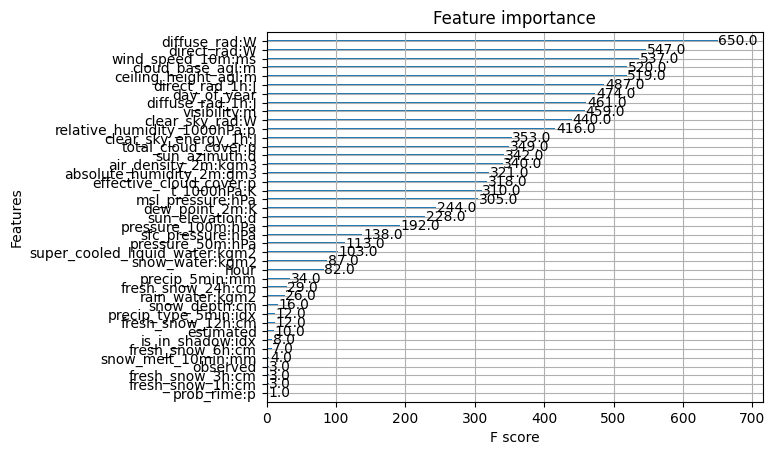

In [22]:
plot_importance(predictor1)

In [11]:
X_2, y_2 = df2_0[[c for c in df2_0.columns if "pv_measurement" != c]], df2_0["pv_measurement"]

In [12]:
study2 = optuna.create_study(direction="minimize")

# Optimize the objective function
print("Optimizing hyperparameters...")
study2.optimize(get_objective(X=X_2,y=y_2 ), n_trials=1)
print("Optimization complete!")
predictor2 = XGBRegressor(**study2.best_params).fit(X_2, y_2)


[I 2023-11-10 18:21:10,292] A new study created in memory with name: no-name-5251dedb-3976-4cc4-af12-48c2d6086afc
/var/folders/y8/9glnt_6110xftbsjpdqd12280000gp/T/ipykernel_70332/4123539858.py:15: FutureWarning: suggest_discrete_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., step=...) instead.
  "subsample": trial.suggest_discrete_uniform("subsample", 0.6, 1.0, 0.05),  # Reduce the range
/var/folders/y8/9glnt_6110xftbsjpdqd12280000gp/T/ipykernel_70332/4123539858.py:16: FutureWarning: suggest_discrete_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., step=...) instead.
  "colsample_bytree": trial.suggest_discrete_uniform("colsample_bytree", 0.6, 1.0, 0.05),  # Reduce the range


Optimizing hyperparameters...
Training Fold 1...
Fold 1 MAE: 58.370560587021345
Training Fold 2...


[I 2023-11-10 18:21:21,321] Trial 0 finished with value: 58.888319480692175 and parameters: {'tree_method': 'approx', 'max_depth': 9, 'learning_rate': 0.9098928879870335, 'n_estimators': 576, 'min_child_weight': 7, 'gamma': 0.31195507164615166, 'subsample': 0.8, 'colsample_bytree': 0.8, 'reg_alpha': 0.9442315291184267, 'reg_lambda': 0.9467439396259895, 'random_state': 199}. Best is trial 0 with value: 58.888319480692175.


Fold 2 MAE: 59.406078374363
Mean MAE for all Folds: 58.888319480692175
Optimization complete!


<Axes: title={'center': 'Feature importance'}, xlabel='F score', ylabel='Features'>

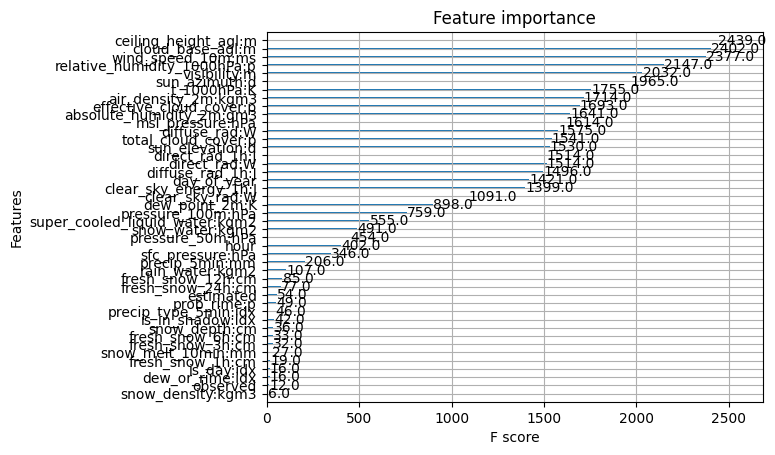

In [23]:
plot_importance(predictor2)

In [13]:
X_3, y_3 = df3_0[[c for c in df3_0.columns if "pv_measurement" != c]], df3_0["pv_measurement"]

In [14]:
study3 = optuna.create_study(direction="minimize")

# Optimize the objective function
print("Optimizing hyperparameters...")
study3.optimize(get_objective(X=X_3,y=y_3 ), n_trials=1)
print("Optimization complete!")
predictor3 = XGBRegressor(**study3.best_params).fit(X_3, y_3)


[I 2023-11-10 18:21:25,208] A new study created in memory with name: no-name-e0f5706e-488f-46e1-a61a-a368eaa4727f
/var/folders/y8/9glnt_6110xftbsjpdqd12280000gp/T/ipykernel_70332/4123539858.py:15: FutureWarning: suggest_discrete_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., step=...) instead.
  "subsample": trial.suggest_discrete_uniform("subsample", 0.6, 1.0, 0.05),  # Reduce the range
/var/folders/y8/9glnt_6110xftbsjpdqd12280000gp/T/ipykernel_70332/4123539858.py:16: FutureWarning: suggest_discrete_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., step=...) instead.
  "colsample_bytree": trial.suggest_discrete_uniform("colsample_bytree", 0.6, 1.0, 0.05),  # Reduce the range


Optimizing hyperparameters...
Training Fold 1...
Fold 1 MAE: 51.24486899461901
Training Fold 2...


[I 2023-11-10 18:21:32,686] Trial 0 finished with value: 51.27239416607777 and parameters: {'tree_method': 'hist', 'max_depth': 8, 'learning_rate': 0.8762946193676969, 'n_estimators': 706, 'min_child_weight': 3, 'gamma': 0.28580241384220484, 'subsample': 0.75, 'colsample_bytree': 0.95, 'reg_alpha': 0.5373289995186017, 'reg_lambda': 0.217555822086801, 'random_state': 869}. Best is trial 0 with value: 51.27239416607777.


Fold 2 MAE: 51.29991933753652
Mean MAE for all Folds: 51.27239416607777
Optimization complete!


<Axes: title={'center': 'Feature importance'}, xlabel='F score', ylabel='Features'>

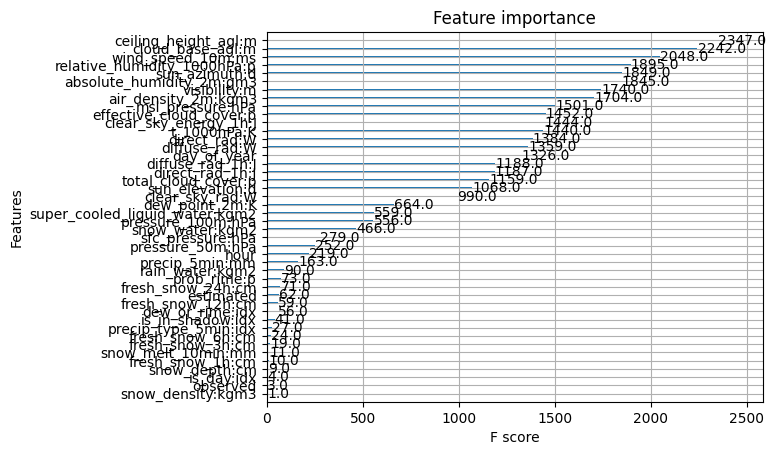

In [24]:
plot_importance(predictor3)

In [15]:
test1 = pipin.get_test_data("A")
test2 = pipin.get_test_data("B")
test3 = pipin.get_test_data("C")

test1 = pipin.drop_columns(test1)
test2 = pipin.drop_columns(test2)
test3 = pipin.drop_columns(test3)

In [16]:
pred1 = pd.DataFrame(predictor1.predict(test1), columns=["pv_measurement"])
pred2 = pd.DataFrame(predictor2.predict(test2), columns=["pv_measurement"])
pred3 = pd.DataFrame(predictor3.predict(test3), columns=["pv_measurement"])
negatives_pred1 = pred1[pred1["pv_measurement"] < 0]
negatives_pred2 = pred2[pred2["pv_measurement"] < 0]
negatives_pred3 = pred3[pred3["pv_measurement"] < 0]
neg = pd.concat([negatives_pred1, negatives_pred2, negatives_pred3])
neg.shape

(364, 1)

In [19]:
study1.bes

array(['absolute_humidity_2m:gm3', 'air_density_2m:kgm3',
       'ceiling_height_agl:m', 'clear_sky_energy_1h:J', 'clear_sky_rad:W',
       'cloud_base_agl:m', 'dew_or_rime:idx', 'dew_point_2m:K',
       'diffuse_rad:W', 'diffuse_rad_1h:J', 'direct_rad:W',
       'direct_rad_1h:J', 'effective_cloud_cover:p', 'elevation:m',
       'fresh_snow_12h:cm', 'fresh_snow_1h:cm', 'fresh_snow_24h:cm',
       'fresh_snow_3h:cm', 'fresh_snow_6h:cm', 'is_day:idx',
       'is_in_shadow:idx', 'msl_pressure:hPa', 'precip_5min:mm',
       'precip_type_5min:idx', 'pressure_100m:hPa', 'pressure_50m:hPa',
       'prob_rime:p', 'rain_water:kgm2', 'relative_humidity_1000hPa:p',
       'sfc_pressure:hPa', 'snow_density:kgm3', 'snow_depth:cm',
       'snow_drift:idx', 'snow_melt_10min:mm', 'snow_water:kgm2',
       'sun_azimuth:d', 'sun_elevation:d',
       'super_cooled_liquid_water:kgm2', 't_1000hPa:K',
       'total_cloud_cover:p', 'visibility:m', 'wind_speed_10m:ms',
       'estimated', 'observed', 'day_of

In [17]:
# pred = pd.concat([pred1, pred2, pred3])
# final_prediction = pipin.post_processing(pred, prediction_column="pv_measurement")
# final_prediction.to_csv('submissions/XGB_143_pipeline.csv')

In [1]:
%load_ext autoreload

In [18]:
from sklearn.model_selection import KFold
import optuna
optuna.logging.set_verbosity(optuna.logging.INFO)

from sklearn.metrics import mean_absolute_error
from xgboost import XGBRFRegressor, plot_importance
import pandas as pd
import numpy as np

In [3]:
%autoreload
from pipeline import Pipeline
pipin = Pipeline()

Current working directory: /Users/miksx/GitHub/Forest-Gump/mikael/optuna


In [4]:
df1_0 = pipin.get_data("A")
df2_0 = pipin.get_data("B")
df3_0 = pipin.get_data("C")

In [5]:
# remove_consecutive_measurments
# 6/24
# dette skal prøve å gjenskape henning sin
df1_0 = pipin.remove_consecutive_measurments_new(df1_0, 4, 12)
df2_0 = pipin.remove_consecutive_measurments_new(df2_0, 4, 12)
df3_0 = pipin.remove_consecutive_measurments_new(df3_0, 4, 12)

In [6]:
df1_0 = pipin.drop_columns(df1_0)
df2_0 = pipin.drop_columns(df2_0)
df3_0 = pipin.drop_columns(df3_0)
print(df1_0.shape, df2_0.shape, df3_0.shape)

(23905, 47) (16471, 47) (13750, 47)


In [7]:
df1_0.head()

,absolute_humidity_2m:gm3,air_density_2m:kgm3,ceiling_height_agl:m,clear_sky_energy_1h:J,clear_sky_rad:W,cloud_base_agl:m,dew_or_rime:idx,dew_point_2m:K,diffuse_rad:W,diffuse_rad_1h:J,...,super_cooled_liquid_water:kgm2,t_1000hPa:K,total_cloud_cover:p,visibility:m,wind_speed_10m:ms,estimated,observed,day_of_year,hour,pv_measurement
0,7.700,1.22825,1728.949951,0.000000,0.00,1728.949951,0.0,280.299988,0.000,0.000000,...,0.0,286.225006,100.000000,40386.476562,3.600,0.0,1.0,153.0,22.0,0.00
1,7.700,1.22350,1689.824951,0.000000,0.00,1689.824951,0.0,280.299988,0.000,0.000000,...,0.0,286.899994,100.000000,33770.648438,3.350,0.0,1.0,153.0,23.0,0.00
2,7.875,1.21975,1563.224976,0.000000,0.00,1563.224976,0.0,280.649994,0.000,0.000000,...,0.0,286.950012,100.000000,13595.500000,3.050,0.0,1.0,154.0,0.0,0.00
3,8.425,1.21800,1283.425049,208.649994,0.75,1283.425049,0.0,281.674988,0.300,526.775024,...,0.0,286.750000,100.000000,2321.850098,2.725,0.0,1.0,154.0,1.0,0.00
4,8.950,1.21800,1003.500000,32468.150391,23.10,1003.500000,0.0,282.500000,11.975,22068.949219,...,0.0,286.450012,99.224998,11634.799805,2.550,0.0,1.0,154.0,2.0,19.36


In [8]:
def get_objective(X=None, y=None):
    def objective(trial):
        kf = KFold(n_splits=2, shuffle=True, random_state=42)
        objective_list_reg = ["reg:squarederror", "reg:squaredlogerror"]
        tree_method = ["approx", "hist"]

        params = {
            "eval_metric": "mae",
            "objective": trial.suggest_categorical("objective", objective_list_reg),
            "tree_method": trial.suggest_categorical("tree_method", tree_method),
            "max_depth": trial.suggest_int("max_depth", 3, 10),  # Adjust the range
            "learning_rate": trial.suggest_float("learning_rate", 0.01, 1.0),
            "n_estimators": trial.suggest_int("n_estimators", 50, 1000),
            "min_child_weight": trial.suggest_int("min_child_weight", 1, 10),  # Increase the range
            "gamma": trial.suggest_float("gamma", 0.1, 1.0),  # Increase the lower bound
            "subsample": trial.suggest_discrete_uniform("subsample", 0.6, 1.0, 0.05),  # Reduce the range
            "colsample_bytree": trial.suggest_discrete_uniform("colsample_bytree", 0.6, 1.0, 0.05),  # Reduce the range
            "reg_alpha": trial.suggest_float("reg_alpha", 0.01, 1.0),
            "reg_lambda": trial.suggest_float("reg_lambda", 0.01, 1.0),
            "random_state": trial.suggest_int("random_state", 1, 1000),
        }
        # Initialize a list to store the mean absolute errors for each fold
        mae_list = []

        for fold, (train_idx, val_idx) in enumerate(kf.split(X), 1):
            X_fold_train, X_fold_val = X.iloc[train_idx], X.iloc[val_idx]
            y_fold_train, y_fold_val = y.iloc[train_idx], y.iloc[val_idx]

            print(f"Training Fold {fold}...")
            model = XGBRFRegressor(**params)
            model.fit(X_fold_train, y_fold_train)
            predictions = model.predict(X_fold_val)
            mae_fold = mean_absolute_error(y_fold_val, predictions)
            mae_list.append(mae_fold)
            print(f"Fold {fold} MAE: {mae_fold}")

        # Calculate the mean of the mean absolute errors for all folds
        mae = sum(mae_list) / len(mae_list)
        print(f"Mean MAE for all Folds: {mae}")
        return mae
    return objective

In [9]:
X_1, y_1 = df1_0[[c for c in df1_0.columns if "pv_measurement" != c]], df1_0["pv_measurement"]

In [10]:
study1 = optuna.create_study(direction="minimize")

# Optimize the objective function
print("Optimizing hyperparameters...")
study1.optimize(get_objective(X=X_1,y=y_1 ), n_trials=1)
print("Optimization complete!")

predictor1 = XGBRFRegressor(**study1.best_params).fit(X_1, y_1)


[I 2023-11-10 18:18:46,470] A new study created in memory with name: no-name-4eb38b6b-ee55-4f27-b9ef-5bd2df7b5a32


Optimizing hyperparameters...
Training Fold 1...


/var/folders/y8/9glnt_6110xftbsjpdqd12280000gp/T/ipykernel_70087/3434561556.py:16: FutureWarning: suggest_discrete_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., step=...) instead.
  "subsample": trial.suggest_discrete_uniform("subsample", 0.6, 1.0, 0.05),  # Reduce the range
/var/folders/y8/9glnt_6110xftbsjpdqd12280000gp/T/ipykernel_70087/3434561556.py:17: FutureWarning: suggest_discrete_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., step=...) instead.
  "colsample_bytree": trial.suggest_discrete_uniform("colsample_bytree", 0.6, 1.0, 0.05),  # Reduce the range


Fold 1 MAE: 732.0839708783311
Training Fold 2...


[I 2023-11-10 18:19:00,011] Trial 0 finished with value: 730.4235669128672 and parameters: {'objective': 'reg:squarederror', 'tree_method': 'approx', 'max_depth': 9, 'learning_rate': 0.32548821433153435, 'n_estimators': 578, 'min_child_weight': 9, 'gamma': 0.8073099648976965, 'subsample': 0.9, 'colsample_bytree': 0.95, 'reg_alpha': 0.6189355660761848, 'reg_lambda': 0.47338850496867746, 'random_state': 942}. Best is trial 0 with value: 730.4235669128672.


Fold 2 MAE: 728.7631629474032
Mean MAE for all Folds: 730.4235669128672
Optimization complete!


<Axes: title={'center': 'Feature importance'}, xlabel='F score', ylabel='Features'>

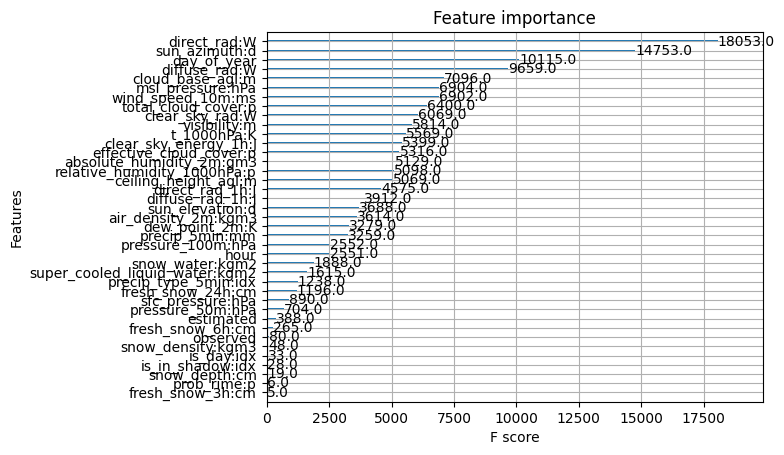

In [19]:
plot_importance(predictor1)

In [11]:
X_2, y_2 = df2_0[[c for c in df2_0.columns if "pv_measurement" != c]], df2_0["pv_measurement"]

In [12]:
study2 = optuna.create_study(direction="minimize")

# Optimize the objective function
print("Optimizing hyperparameters...")
study2.optimize(get_objective(X=X_2,y=y_2 ), n_trials=1)
print("Optimization complete!")
predictor2 = XGBRFRegressor(**study2.best_params).fit(X_2, y_2)


[I 2023-11-10 18:19:08,828] A new study created in memory with name: no-name-b9e74161-1755-4019-a8a0-1cf0214bdfbd
/var/folders/y8/9glnt_6110xftbsjpdqd12280000gp/T/ipykernel_70087/3434561556.py:16: FutureWarning: suggest_discrete_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., step=...) instead.
  "subsample": trial.suggest_discrete_uniform("subsample", 0.6, 1.0, 0.05),  # Reduce the range
/var/folders/y8/9glnt_6110xftbsjpdqd12280000gp/T/ipykernel_70087/3434561556.py:17: FutureWarning: suggest_discrete_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., step=...) instead.
  "colsample_bytree": trial.suggest_discrete_uniform("colsample_bytree", 0.6, 1.0, 0.05),  # Reduce the range


Optimizing hyperparameters...
Training Fold 1...
Fold 1 MAE: 167.0674026253017
Training Fold 2...


[I 2023-11-10 18:19:21,727] Trial 0 finished with value: 167.62968100065274 and parameters: {'objective': 'reg:squaredlogerror', 'tree_method': 'approx', 'max_depth': 6, 'learning_rate': 0.4971157285140966, 'n_estimators': 803, 'min_child_weight': 7, 'gamma': 0.7336752949551839, 'subsample': 0.6, 'colsample_bytree': 1.0, 'reg_alpha': 0.3472041711073767, 'reg_lambda': 0.8958063552177049, 'random_state': 894}. Best is trial 0 with value: 167.62968100065274.


Fold 2 MAE: 168.19195937600378
Mean MAE for all Folds: 167.62968100065274
Optimization complete!


<Axes: title={'center': 'Feature importance'}, xlabel='F score', ylabel='Features'>

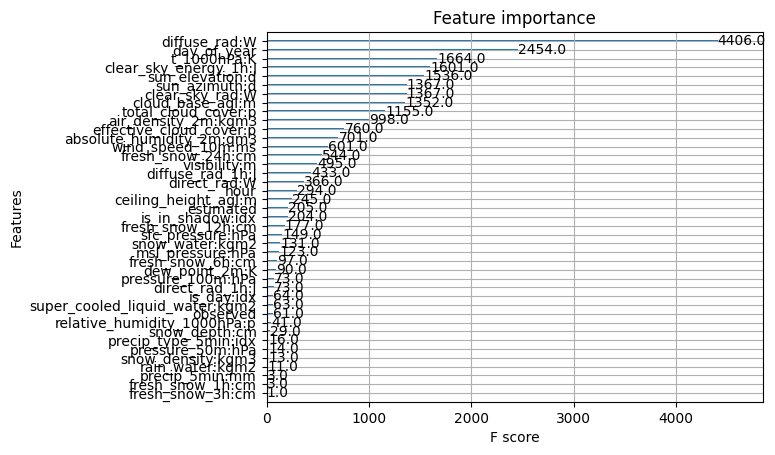

In [20]:
plot_importance(predictor2)

In [13]:
X_3, y_3 = df3_0[[c for c in df3_0.columns if "pv_measurement" != c]], df3_0["pv_measurement"]

In [14]:
study3 = optuna.create_study(direction="minimize")

# Optimize the objective function
print("Optimizing hyperparameters...")
study3.optimize(get_objective(X=X_3,y=y_3 ), n_trials=1)
print("Optimization complete!")
predictor3 = XGBRFRegressor(**study3.best_params).fit(X_3, y_3)


[I 2023-11-10 18:19:33,617] A new study created in memory with name: no-name-c1189ed3-28ff-430b-8a89-1010839f3783
/var/folders/y8/9glnt_6110xftbsjpdqd12280000gp/T/ipykernel_70087/3434561556.py:16: FutureWarning: suggest_discrete_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., step=...) instead.
  "subsample": trial.suggest_discrete_uniform("subsample", 0.6, 1.0, 0.05),  # Reduce the range
/var/folders/y8/9glnt_6110xftbsjpdqd12280000gp/T/ipykernel_70087/3434561556.py:17: FutureWarning: suggest_discrete_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., step=...) instead.
  "colsample_bytree": trial.suggest_discrete_uniform("colsample_bytree", 0.6, 1.0, 0.05),  # Reduce the range


Optimizing hyperparameters...
Training Fold 1...
Fold 1 MAE: 146.81180846407204
Training Fold 2...


[I 2023-11-10 18:19:38,329] Trial 0 finished with value: 146.7127852164872 and parameters: {'objective': 'reg:squaredlogerror', 'tree_method': 'hist', 'max_depth': 3, 'learning_rate': 0.14993610585877482, 'n_estimators': 488, 'min_child_weight': 9, 'gamma': 0.21668401721684977, 'subsample': 0.85, 'colsample_bytree': 0.75, 'reg_alpha': 0.13938943419056793, 'reg_lambda': 0.14466106017358887, 'random_state': 557}. Best is trial 0 with value: 146.7127852164872.


Fold 2 MAE: 146.61376196890237
Mean MAE for all Folds: 146.7127852164872
Optimization complete!


<Axes: title={'center': 'Feature importance'}, xlabel='F score', ylabel='Features'>

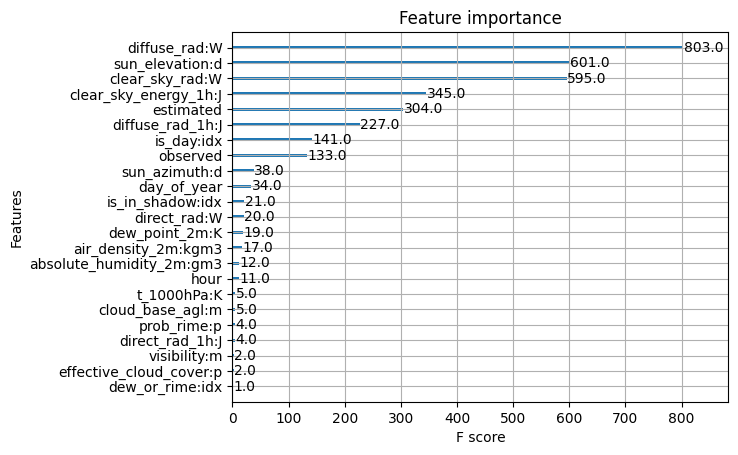

In [21]:
plot_importance(predictor3)

In [15]:
test1 = pipin.get_test_data("A")
test2 = pipin.get_test_data("B")
test3 = pipin.get_test_data("C")

test1 = pipin.drop_columns(test1)
test2 = pipin.drop_columns(test2)
test3 = pipin.drop_columns(test3)

In [16]:
pred1 = pd.DataFrame(predictor1.predict(test1), columns=["pv_measurement"])
pred2 = pd.DataFrame(predictor2.predict(test2), columns=["pv_measurement"])
pred3 = pd.DataFrame(predictor3.predict(test3), columns=["pv_measurement"])
negatives_pred1 = pred1[pred1["pv_measurement"] < 0]
negatives_pred2 = pred2[pred2["pv_measurement"] < 0]
negatives_pred3 = pred3[pred3["pv_measurement"] < 0]
neg = pd.concat([negatives_pred1, negatives_pred2, negatives_pred3])
neg.shape

(132, 1)

In [17]:
# pred = pd.concat([pred1, pred2, pred3])
# final_prediction = pipin.post_processing(pred, prediction_column="pv_measurement")
# final_prediction.to_csv('submissions/XGB_RF_143_pipeline.csv')

In [1]:
%load_ext autoreload

In [21]:
from sklearn.model_selection import KFold
import optuna
optuna.logging.set_verbosity(optuna.logging.INFO)
from sklearn.metrics import mean_absolute_error
from catboost import CatBoostRegressor
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [3]:
%autoreload
from pipeline import Pipeline
pipin = Pipeline()

Current working directory: /Users/miksx/GitHub/Forest-Gump/mikael/optuna


In [4]:
PATH = "ag_144_"

In [5]:
df1_0 = pipin.get_data("A")
df2_0 = pipin.get_data("B")
df3_0 = pipin.get_data("C")

In [6]:
# remove_consecutive_measurments
# 6/24
# dette skal prøve å gjenskape henning sin
df1_0 = pipin.remove_consecutive_measurments_new(df1_0, 4, 15)
df2_0 = pipin.remove_consecutive_measurments_new(df2_0, 4, 15)
df3_0 = pipin.remove_consecutive_measurments_new(df3_0, 4, 15)

In [7]:
df1_0 = pipin.drop_columns(df1_0)
df2_0 = pipin.drop_columns(df2_0)
df3_0 = pipin.drop_columns(df3_0)
print(df1_0.shape, df2_0.shape, df3_0.shape)

(26438, 47) (18422, 47) (15611, 47)


In [8]:
df1_0.head()

,absolute_humidity_2m:gm3,air_density_2m:kgm3,ceiling_height_agl:m,clear_sky_energy_1h:J,clear_sky_rad:W,cloud_base_agl:m,dew_or_rime:idx,dew_point_2m:K,diffuse_rad:W,diffuse_rad_1h:J,...,super_cooled_liquid_water:kgm2,t_1000hPa:K,total_cloud_cover:p,visibility:m,wind_speed_10m:ms,estimated,observed,day_of_year,hour,pv_measurement
0,7.700,1.22825,1728.949951,0.000000,0.00,1728.949951,0.0,280.299988,0.000,0.000000,...,0.0,286.225006,100.000000,40386.476562,3.600,0.0,1.0,153.0,22.0,0.00
1,7.700,1.22350,1689.824951,0.000000,0.00,1689.824951,0.0,280.299988,0.000,0.000000,...,0.0,286.899994,100.000000,33770.648438,3.350,0.0,1.0,153.0,23.0,0.00
2,7.875,1.21975,1563.224976,0.000000,0.00,1563.224976,0.0,280.649994,0.000,0.000000,...,0.0,286.950012,100.000000,13595.500000,3.050,0.0,1.0,154.0,0.0,0.00
3,8.425,1.21800,1283.425049,208.649994,0.75,1283.425049,0.0,281.674988,0.300,526.775024,...,0.0,286.750000,100.000000,2321.850098,2.725,0.0,1.0,154.0,1.0,0.00
4,8.950,1.21800,1003.500000,32468.150391,23.10,1003.500000,0.0,282.500000,11.975,22068.949219,...,0.0,286.450012,99.224998,11634.799805,2.550,0.0,1.0,154.0,2.0,19.36


In [9]:
def get_objective(X=None, y=None):
    def objective(trial):
        kf = KFold(n_splits=2, shuffle=True, random_state=42)

        params = {
            "iterations": 500,
            "learning_rate": trial.suggest_float("learning_rate", 1e-3, 0.1, log=True),
            "depth": trial.suggest_int("depth", 4, 10),
            "subsample": trial.suggest_float("subsample", 0.05, 1.0),
            "colsample_bylevel": trial.suggest_float("colsample_bylevel", 0.05, 1.0),
            "min_data_in_leaf": trial.suggest_int("min_data_in_leaf", 1, 100),
        }
        # Initialize a list to store the mean absolute errors for each fold
        mae_list = []

        for fold, (train_idx, val_idx) in enumerate(kf.split(X), 1):
            X_fold_train, X_fold_val = X.iloc[train_idx], X.iloc[val_idx]
            y_fold_train, y_fold_val = y.iloc[train_idx], y.iloc[val_idx]

            print(f"Training Fold {fold}...")
            model = CatBoostRegressor(**params, silent=True)
            model.fit(X_fold_train, y_fold_train)
            predictions = model.predict(X_fold_val)
            mae_fold = mean_absolute_error(y_fold_val, predictions)
            mae_list.append(mae_fold)
            print(f"Fold {fold} MAE: {mae_fold}")

        # Calculate the mean of the mean absolute errors for all folds
        mae = sum(mae_list) / len(mae_list)
        print(f"Mean MAE for all Folds: {mae}")
        return mae
    return objective

In [10]:
X_1, y_1 = df1_0[[c for c in df1_0.columns if "pv_measurement" != c]], df1_0["pv_measurement"]

In [11]:
study1 = optuna.create_study(direction="minimize")

# Optimize the objective function
print("Optimizing hyperparameters...")
study1.optimize(get_objective(X=X_1,y=y_1 ), n_trials=1)
print("Optimization complete!")

predictor1 = CatBoostRegressor(**study1.best_params).fit(X_1, y_1)


[I 2023-11-10 18:19:24,985] A new study created in memory with name: no-name-a11350fa-d6a5-4df8-b2ea-36531ea6bbbd


Optimizing hyperparameters...
Training Fold 1...
Fold 1 MAE: 355.67649381696117
Training Fold 2...


[I 2023-11-10 18:19:28,919] Trial 0 finished with value: 352.13427372942704 and parameters: {'learning_rate': 0.003898703780850047, 'depth': 6, 'subsample': 0.7766926077009079, 'colsample_bylevel': 0.5811250621341761, 'min_data_in_leaf': 73}. Best is trial 0 with value: 352.13427372942704.


Fold 2 MAE: 348.59205364189285
Mean MAE for all Folds: 352.13427372942704
Optimization complete!
0:	learn: 1262.7608368	total: 5.75ms	remaining: 5.75s
1:	learn: 1258.9799836	total: 12.6ms	remaining: 6.27s
2:	learn: 1255.1480783	total: 17.2ms	remaining: 5.72s
3:	learn: 1251.3318204	total: 22.3ms	remaining: 5.56s
4:	learn: 1247.5938657	total: 26.6ms	remaining: 5.29s
5:	learn: 1243.8276697	total: 31.9ms	remaining: 5.29s
6:	learn: 1240.0540563	total: 36.1ms	remaining: 5.12s
7:	learn: 1236.3385820	total: 41.4ms	remaining: 5.13s
8:	learn: 1232.6569150	total: 47.2ms	remaining: 5.2s
9:	learn: 1229.0817298	total: 50.7ms	remaining: 5.02s
10:	learn: 1225.4436233	total: 55.3ms	remaining: 4.97s
11:	learn: 1221.9253367	total: 60ms	remaining: 4.94s
12:	learn: 1218.3725963	total: 65.7ms	remaining: 4.99s
13:	learn: 1214.7800120	total: 69.8ms	remaining: 4.92s
14:	learn: 1211.1543884	total: 75.2ms	remaining: 4.94s
15:	learn: 1207.5304862	total: 81.7ms	remaining: 5.02s
16:	learn: 1204.0141365	total: 86.4m

Text(0.5, 1.0, 'Feature Importance')

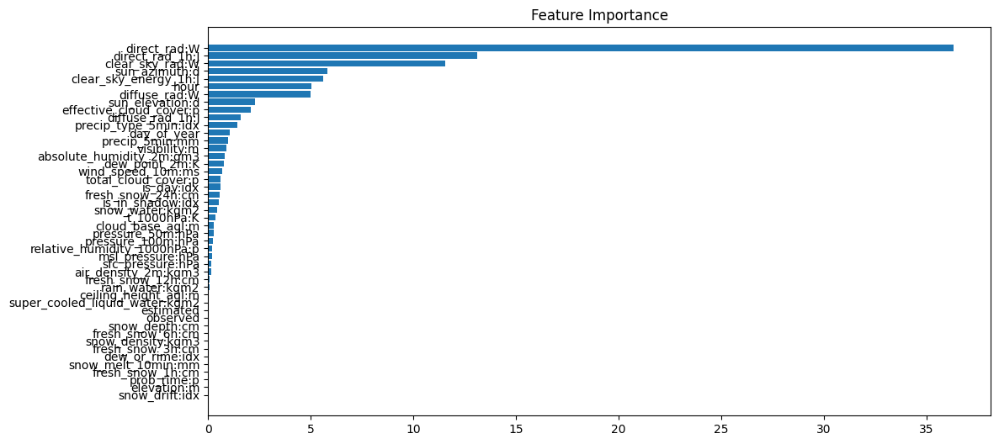

In [22]:
feature_importance = predictor1.feature_importances_
sorted_idx = np.argsort(feature_importance)
fig = plt.figure(figsize=(12, 6))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx], align='center')
plt.yticks(range(len(sorted_idx)), np.array(X_1.columns)[sorted_idx])
plt.title('Feature Importance')

In [12]:
X_2, y_2 = df2_0[[c for c in df2_0.columns if "pv_measurement" != c]], df2_0["pv_measurement"]

In [13]:
study2 = optuna.create_study(direction="minimize")

# Optimize the objective function
print("Optimizing hyperparameters...")
study2.optimize(get_objective(X=X_2,y=y_2 ), n_trials=1)
print("Optimization complete!")
predictor2 = CatBoostRegressor(**study2.best_params).fit(X_2, y_2)


[I 2023-11-10 18:19:33,855] A new study created in memory with name: no-name-e2c903d8-6564-40cb-9dc9-d60e59408acb


Optimizing hyperparameters...
Training Fold 1...
Fold 1 MAE: 83.05926131676746
Training Fold 2...


[I 2023-11-10 18:19:43,103] Trial 0 finished with value: 82.83207293237899 and parameters: {'learning_rate': 0.00218957417363213, 'depth': 9, 'subsample': 0.9368304668851243, 'colsample_bylevel': 0.6559927822482776, 'min_data_in_leaf': 64}. Best is trial 0 with value: 82.83207293237899.


Fold 2 MAE: 82.60488454799051
Mean MAE for all Folds: 82.83207293237899
Optimization complete!
0:	learn: 238.3066632	total: 11.2ms	remaining: 11.1s
1:	learn: 237.8793455	total: 21ms	remaining: 10.5s
2:	learn: 237.4639698	total: 32.2ms	remaining: 10.7s
3:	learn: 237.0497615	total: 41.9ms	remaining: 10.4s
4:	learn: 236.6266111	total: 52.9ms	remaining: 10.5s
5:	learn: 236.1985247	total: 62.3ms	remaining: 10.3s
6:	learn: 235.7776540	total: 72.3ms	remaining: 10.3s
7:	learn: 235.3583132	total: 83.1ms	remaining: 10.3s
8:	learn: 234.9339940	total: 92.5ms	remaining: 10.2s
9:	learn: 234.5255734	total: 103ms	remaining: 10.2s
10:	learn: 234.1047286	total: 113ms	remaining: 10.1s
11:	learn: 233.6870671	total: 123ms	remaining: 10.2s
12:	learn: 233.2773231	total: 133ms	remaining: 10.1s
13:	learn: 232.8744387	total: 142ms	remaining: 10s
14:	learn: 232.4658481	total: 151ms	remaining: 9.93s
15:	learn: 232.0502280	total: 162ms	remaining: 9.98s
16:	learn: 231.6370397	total: 173ms	remaining: 9.98s
17:	learn

Text(0.5, 1.0, 'Feature Importance')

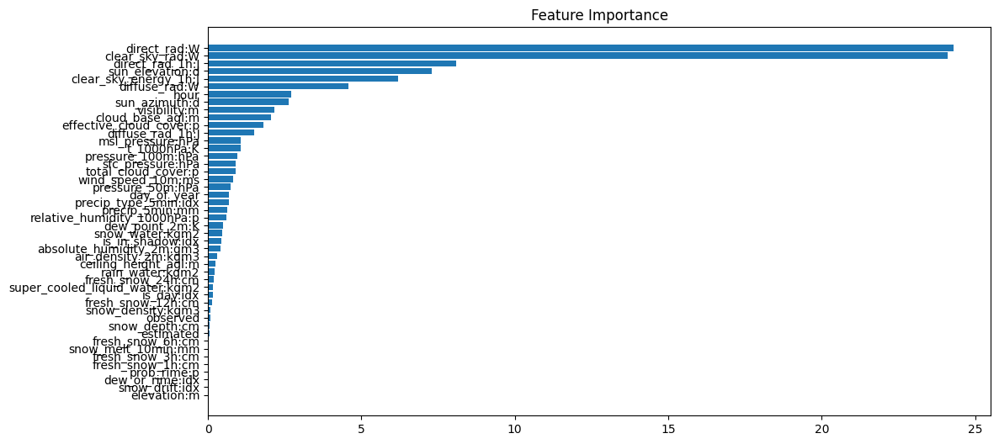

In [23]:
feature_importance = predictor2.feature_importances_
sorted_idx = np.argsort(feature_importance)
fig = plt.figure(figsize=(12, 6))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx], align='center')
plt.yticks(range(len(sorted_idx)), np.array(X_2.columns)[sorted_idx])
plt.title('Feature Importance')

In [14]:
X_3, y_3 = df3_0[[c for c in df3_0.columns if "pv_measurement" != c]], df3_0["pv_measurement"]

In [15]:
study3 = optuna.create_study(direction="minimize")

# Optimize the objective function
print("Optimizing hyperparameters...")
study3.optimize(get_objective(X=X_3,y=y_3 ), n_trials=1)
print("Optimization complete!")
predictor3 = CatBoostRegressor(**study3.best_params).fit(X_3, y_3)


[I 2023-11-10 18:19:53,590] A new study created in memory with name: no-name-47506f41-939d-42ea-a656-0198e65f90d3


Optimizing hyperparameters...
Training Fold 1...
Fold 1 MAE: 34.76186896022819
Training Fold 2...


[I 2023-11-10 18:19:55,548] Trial 0 finished with value: 34.604372113855206 and parameters: {'learning_rate': 0.013394538025040795, 'depth': 7, 'subsample': 0.22614848861118847, 'colsample_bylevel': 0.1919168581015177, 'min_data_in_leaf': 33}. Best is trial 0 with value: 34.604372113855206.


Fold 2 MAE: 34.44687526748223
Mean MAE for all Folds: 34.604372113855206
Optimization complete!
0:	learn: 195.9445665	total: 2.84ms	remaining: 2.84s
1:	learn: 193.8566579	total: 4.88ms	remaining: 2.43s
2:	learn: 191.8294022	total: 6.68ms	remaining: 2.22s
3:	learn: 189.7849274	total: 10.2ms	remaining: 2.55s
4:	learn: 187.8076665	total: 12.4ms	remaining: 2.47s
5:	learn: 185.8396000	total: 15.4ms	remaining: 2.55s
6:	learn: 183.9004998	total: 17.9ms	remaining: 2.54s
7:	learn: 182.0254667	total: 19.8ms	remaining: 2.45s
8:	learn: 180.2508139	total: 22.1ms	remaining: 2.43s
9:	learn: 178.4117717	total: 24.9ms	remaining: 2.47s
10:	learn: 176.6081609	total: 27.2ms	remaining: 2.45s
11:	learn: 174.8925368	total: 28.9ms	remaining: 2.38s
12:	learn: 173.3024139	total: 31.3ms	remaining: 2.38s
13:	learn: 171.5538699	total: 34.4ms	remaining: 2.42s
14:	learn: 169.8018804	total: 36.7ms	remaining: 2.41s
15:	learn: 168.1531646	total: 38.9ms	remaining: 2.39s
16:	learn: 166.4481843	total: 40.6ms	remaining: 2.

Text(0.5, 1.0, 'Feature Importance')

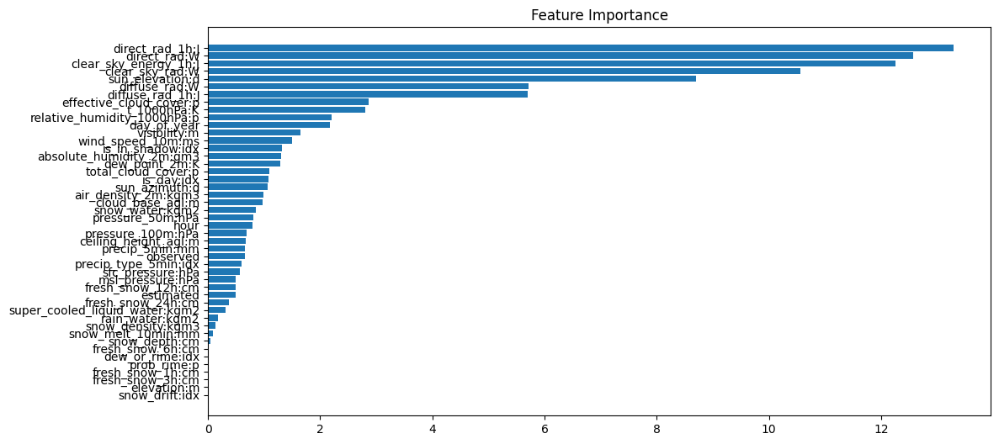

In [24]:
feature_importance = predictor3.feature_importances_
sorted_idx = np.argsort(feature_importance)
fig = plt.figure(figsize=(12, 6))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx], align='center')
plt.yticks(range(len(sorted_idx)), np.array(X_3.columns)[sorted_idx])
plt.title('Feature Importance')

In [16]:
test1 = pipin.get_test_data("A")
test2 = pipin.get_test_data("B")
test3 = pipin.get_test_data("C")

test1 = pipin.drop_columns(test1)
test2 = pipin.drop_columns(test2)
test3 = pipin.drop_columns(test3)

In [17]:
pred1 = pd.DataFrame(predictor1.predict(test1), columns=["pv_measurement"])
pred2 = pd.DataFrame(predictor2.predict(test2), columns=["pv_measurement"])
pred3 = pd.DataFrame(predictor3.predict(test3), columns=["pv_measurement"])
negatives_pred1 = pred1[pred1["pv_measurement"] < 0]
negatives_pred2 = pred2[pred2["pv_measurement"] < 0]
negatives_pred3 = pred3[pred3["pv_measurement"] < 0]
neg = pd.concat([negatives_pred1, negatives_pred2, negatives_pred3])
neg.shape

(30, 1)

In [18]:
pred = pd.concat([pred1, pred2, pred3])
final_prediction = pipin.post_processing(pred, prediction_column="pv_measurement")
final_prediction.to_csv('submissions/catboost_143_pipeline.csv')

In [19]:
diff = pipin.compare_mae(final_prediction)
diff

86.50569969917758

In [20]:
# predictor.evaluate(df1, silent=True)

In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
%matplotlib inline

pd.set_option('display.max_rows', 200)
pd.set_option('display.max_columns', 200)

In [2]:
def list_directory_tree_with_os_walk(starting_directory):
    for root, directories, files in os.walk(starting_directory):
        print(f"Directory: {root}")
        for file in files:
            print(f"  File: {file}")

list_directory_tree_with_os_walk('.')

Directory: .
  File: my_first_submission.csv
  File: .DS_Store
  File: test.csv
  File: Readme.md
  File: .gitignore
  File: read_files copy.ipynb
  File: sample_submission.csv
  File: read_files.ipynb
Directory: ./final_submission
  File: train_model.ipynb
  File: deduction.ipynb
  File: optuna_merged.ipynb
  File: gluon_merged.ipynb
  File: others_automl.ipynb
Directory: ./final_submission/merged_mats
  File: merged_models.ipynb
Directory: ./final_submission/merged_explore
  File: merged_explore_mats.ipynb
Directory: ./mats
  File: compare.ipynb
  File: dora.ipynb
  File: .DS_Store
  File: pipeline_tuning.py
  File: pipeline_new_remove.py
  File: pipeline_pivot.py
  File: .gitignore
  File: dora_pipeline_new_group.ipynb
  File: pipeline.py
  File: dora_pipeline.ipynb
Directory: ./mats/dataframes
  File: iterative_imputation.csv
Directory: ./mats/test_consectutive
  File: pipeline_old_remove_consec.py
  File: dora_consecutive_measures.ipynb
Directory: ./mats/gluon
  File: gluon_3_cons

In [3]:
train_a = pd.read_parquet('A/train_targets.parquet')
train_b = pd.read_parquet('B/train_targets.parquet')
train_c = pd.read_parquet('C/train_targets.parquet')

In [4]:
train_a.describe()

,time,pv_measurement
count,34085,34085.000000
mean,2021-05-14 00:29:51.497726,630.594707
min,2019-06-02 22:00:00,0.000000
25%,2020-05-22 23:00:00,0.000000
50%,2021-05-13 00:00:00,5.940000
75%,2022-05-03 01:00:00,678.040000
max,2023-04-30 23:00:00,5733.420000
std,NaN,1165.902422


In [5]:
X_train_estimated_a = pd.read_parquet('A/X_train_estimated.parquet')
X_train_estimated_b = pd.read_parquet('B/X_train_estimated.parquet')
X_train_estimated_c = pd.read_parquet('C/X_train_estimated.parquet')


In [6]:
X_train_observed_a = pd.read_parquet('A/X_train_observed.parquet')
X_train_observed_b = pd.read_parquet('B/X_train_observed.parquet')
X_train_observed_c = pd.read_parquet('C/X_train_observed.parquet')


In [7]:
X_test_estimated_a = pd.read_parquet('A/X_test_estimated.parquet')
X_test_estimated_b = pd.read_parquet('B/X_test_estimated.parquet')
X_test_estimated_c = pd.read_parquet('C/X_test_estimated.parquet')


In [8]:
X_test_estimated_a.columns

Index(['date_calc', 'date_forecast', 'absolute_humidity_2m:gm3',
       'air_density_2m:kgm3', 'ceiling_height_agl:m', 'clear_sky_energy_1h:J',
       'clear_sky_rad:W', 'cloud_base_agl:m', 'dew_or_rime:idx',
       'dew_point_2m:K', 'diffuse_rad:W', 'diffuse_rad_1h:J', 'direct_rad:W',
       'direct_rad_1h:J', 'effective_cloud_cover:p', 'elevation:m',
       'fresh_snow_12h:cm', 'fresh_snow_1h:cm', 'fresh_snow_24h:cm',
       'fresh_snow_3h:cm', 'fresh_snow_6h:cm', 'is_day:idx',
       'is_in_shadow:idx', 'msl_pressure:hPa', 'precip_5min:mm',
       'precip_type_5min:idx', 'pressure_100m:hPa', 'pressure_50m:hPa',
       'prob_rime:p', 'rain_water:kgm2', 'relative_humidity_1000hPa:p',
       'sfc_pressure:hPa', 'snow_density:kgm3', 'snow_depth:cm',
       'snow_drift:idx', 'snow_melt_10min:mm', 'snow_water:kgm2',
       'sun_azimuth:d', 'sun_elevation:d', 'super_cooled_liquid_water:kgm2',
       't_1000hPa:K', 'total_cloud_cover:p', 'visibility:m',
       'wind_speed_10m:ms', 'wind_spe

absolute_humidity_2m:gm3
air_density_2m:kgm3
ceiling_height_agl:m
clear_sky_energy_1h:J
clear_sky_rad:W
cloud_base_agl:m
dew_or_rime:idx
dew_point_2m:K
diffuse_rad:W
diffuse_rad_1h:J
direct_rad:W
direct_rad_1h:J
effective_cloud_cover:p
elevation:m
fresh_snow_12h:cm
fresh_snow_1h:cm
fresh_snow_24h:cm
fresh_snow_3h:cm
fresh_snow_6h:cm
is_day:idx
is_in_shadow:idx


/var/folders/y8/9glnt_6110xftbsjpdqd12280000gp/T/ipykernel_76785/1430449983.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(3, 1, figsize=(20, 10), sharex=True)


msl_pressure:hPa
precip_5min:mm
precip_type_5min:idx
pressure_100m:hPa
pressure_50m:hPa
prob_rime:p
rain_water:kgm2
relative_humidity_1000hPa:p
sfc_pressure:hPa
snow_density:kgm3
snow_depth:cm
snow_drift:idx
snow_melt_10min:mm
snow_water:kgm2
sun_azimuth:d
sun_elevation:d
super_cooled_liquid_water:kgm2
t_1000hPa:K
total_cloud_cover:p
visibility:m
wind_speed_10m:ms
wind_speed_u_10m:ms
wind_speed_v_10m:ms
wind_speed_w_1000hPa:ms


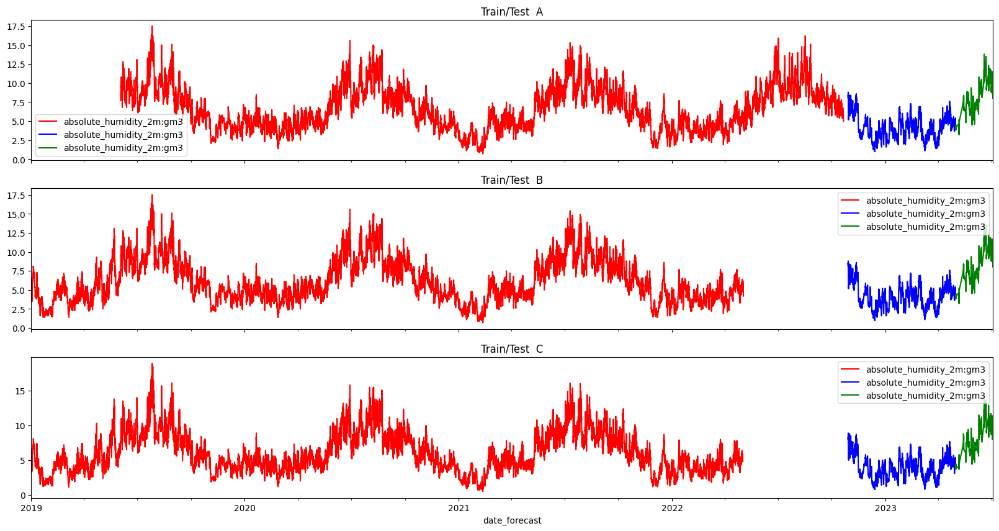

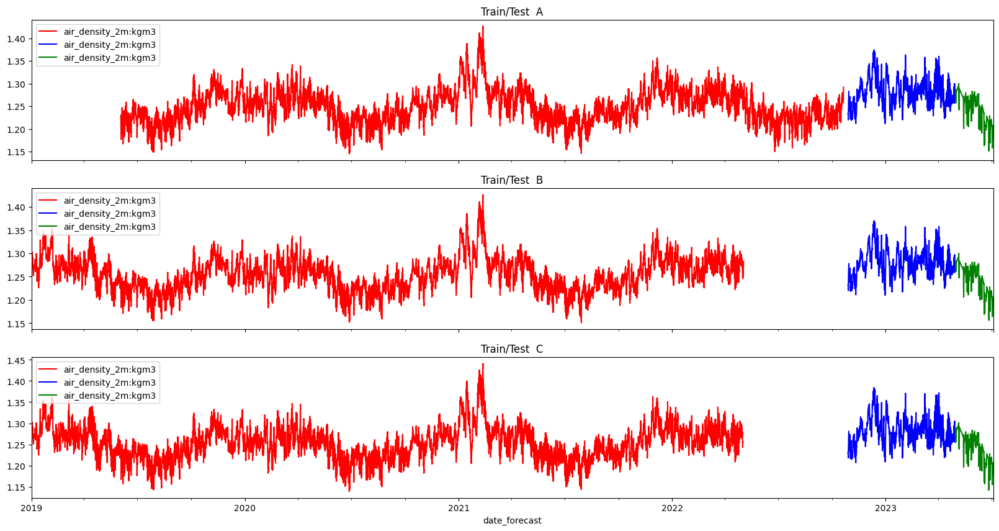

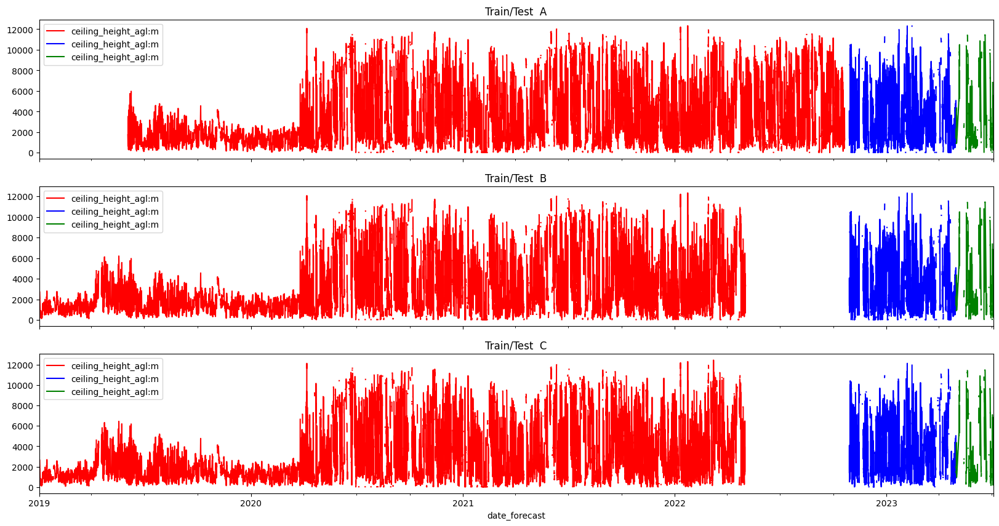

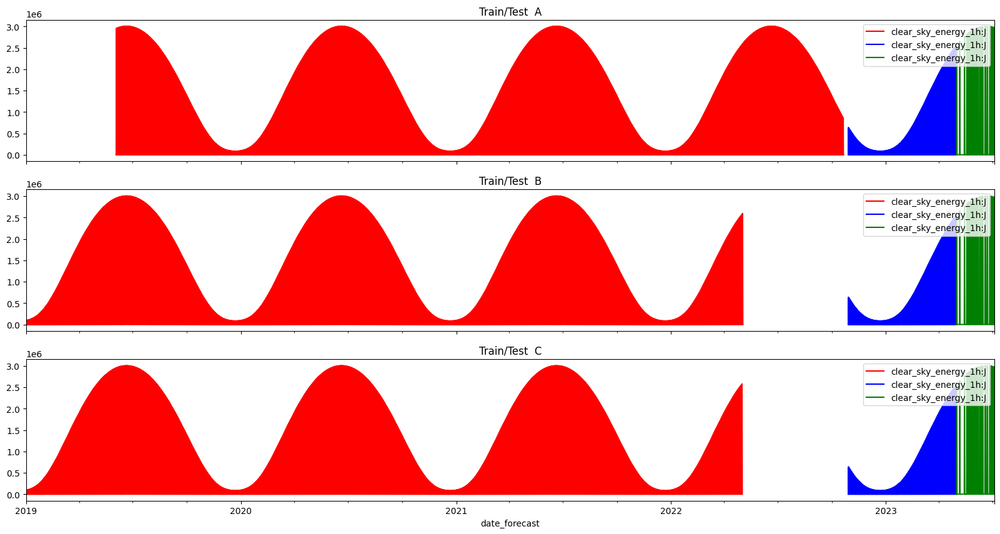

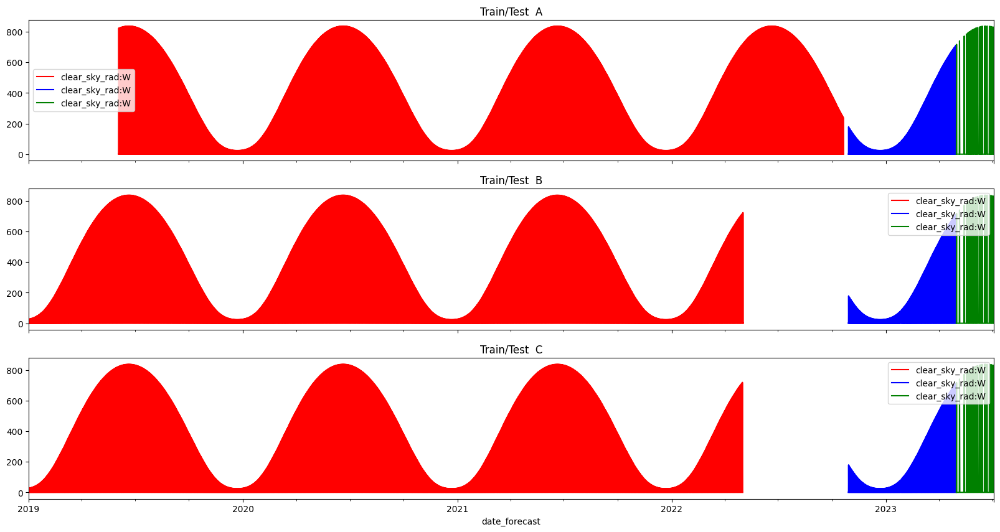

...

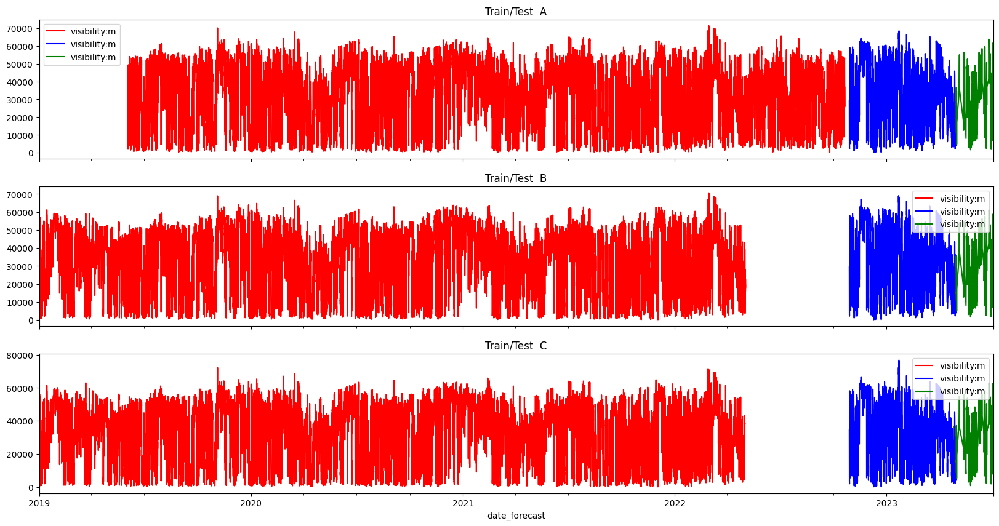

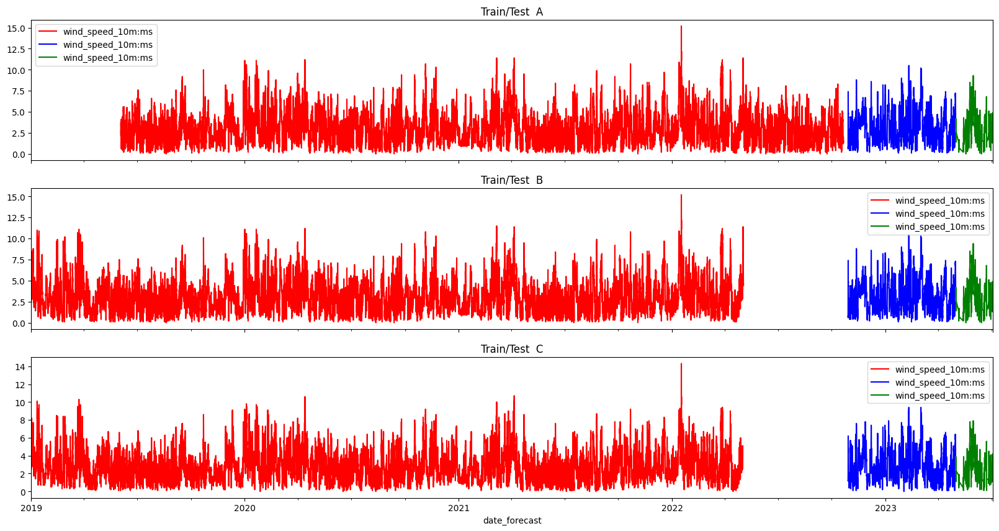

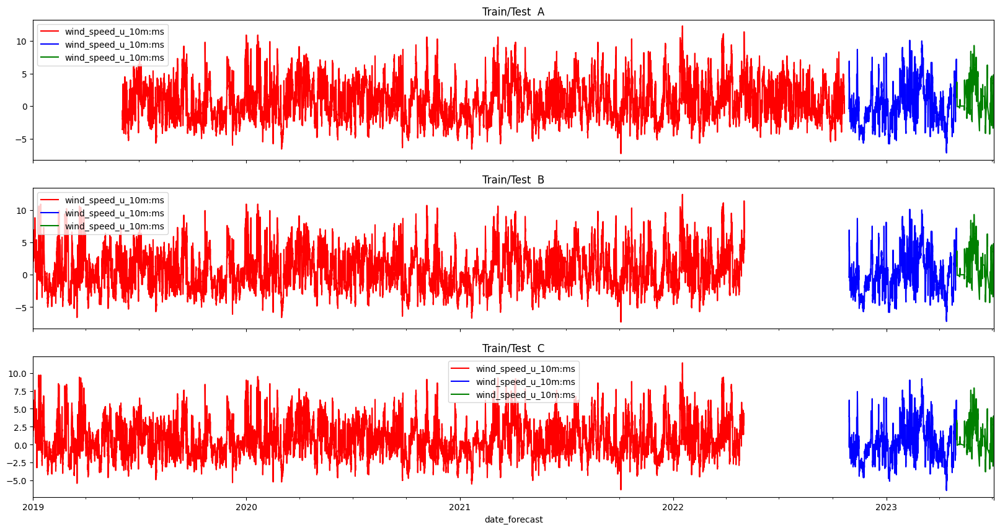

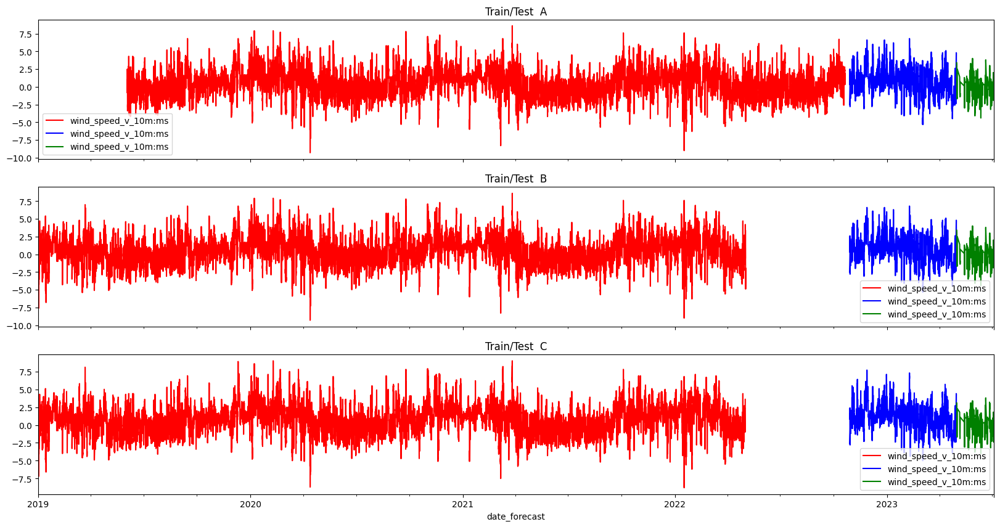

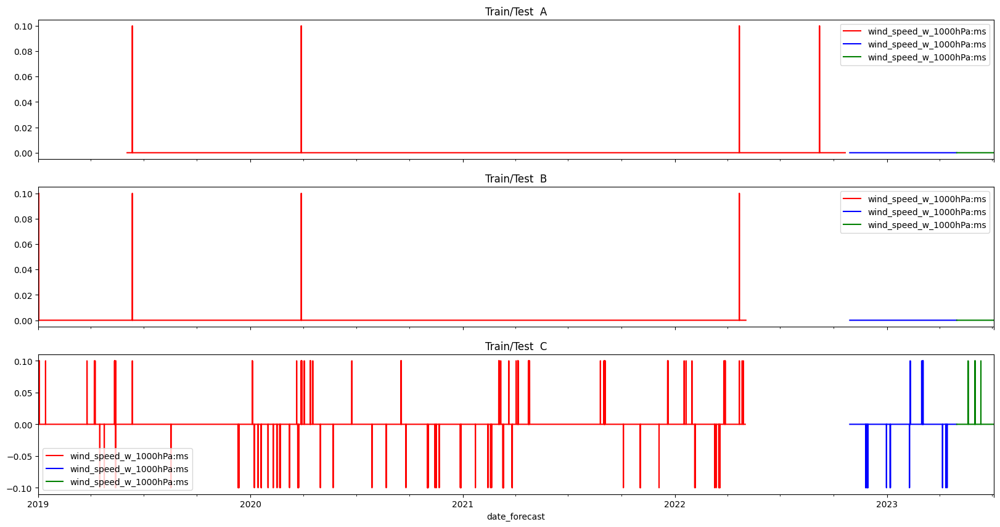

In [9]:
# Plotting a single feature
drop = ["date_calc", "date_forecast"]
cols = [c for c in X_test_estimated_a.columns.tolist() if c not in drop]
for col in cols:
    print(col)
    fig, axs = plt.subplots(3, 1, figsize=(20, 10), sharex=True)
    feature_name = col
    X_train_observed_a[['date_forecast', feature_name]].set_index('date_forecast').plot(ax=axs[0], title='Train/Test A', color='red')
    X_train_estimated_a[['date_forecast', feature_name]].set_index('date_forecast').plot(ax=axs[0], title='Train/Test A', color='blue')
    X_test_estimated_a[['date_forecast', feature_name]].set_index('date_forecast').plot(ax=axs[0], title='Train/Test  A', color='green')

    X_train_observed_b[['date_forecast', feature_name]].set_index('date_forecast').plot(ax=axs[1], title='Train/Test  B', color='red')
    X_train_estimated_b[['date_forecast', feature_name]].set_index('date_forecast').plot(ax=axs[1], title='Train/Test  B', color='blue')
    X_test_estimated_b[['date_forecast', feature_name]].set_index('date_forecast').plot(ax=axs[1], title='Train/Test  B', color='green')

    X_train_observed_c[['date_forecast', feature_name]].set_index('date_forecast').plot(ax=axs[2], title='Train/Test  C', color='red')
    X_train_estimated_c[['date_forecast', feature_name]].set_index('date_forecast').plot(ax=axs[2], title='Train/Test  C', color='blue')
    X_test_estimated_c[['date_forecast', feature_name]].set_index('date_forecast').plot(ax=axs[2], title='Train/Test  C', color='green')

In [10]:
test = pd.read_csv('test.csv')
test


,id,time,prediction,location
0,0,2023-05-01 00:00:00,0,A
1,1,2023-05-01 01:00:00,0,A
2,2,2023-05-01 02:00:00,0,A
3,3,2023-05-01 03:00:00,0,A
4,4,2023-05-01 04:00:00,0,A
...,...,...,...,...
2155,2155,2023-07-03 19:00:00,0,C
2156,2156,2023-07-03 20:00:00,0,C
2157,2157,2023-07-03 21:00:00,0,C
2158,2158,2023-07-03 22:00:00,0,C


In [1]:
import h2o
import pandas as pd
from Data import Data

In [ ]:
# Data handling
import datetime
import h2o
from h2o.automl import H2OAutoML
import pandas as pd
from sklearn.model_selection import train_test_split
from supervised.automl import AutoML
from autogluon.tabular import TabularPredictor, TabularDataset
from autogluon.core.metrics import mean_absolute_error
import autogluon.core as ag

import numpy as np

# Data science
from sklearn.preprocessing import MinMaxScaler


class Data:
    target: pd.Series = None
    train: pd.DataFrame = None
    frame: pd.DataFrame = None
    frame_without_tuning_data: pd.DataFrame = None
    tune_data: pd.DataFrame = None
    test: pd.DataFrame = None
    location: str = None

    X_scaler: MinMaxScaler = MinMaxScaler()
    Y_scaler: MinMaxScaler = MinMaxScaler()
    frame_scaler: MinMaxScaler = MinMaxScaler()

    def __init__(self, location: str):
        self.location = location

        self.target = pd.read_parquet(f"../../{location}/train_targets.parquet")["pv_measurement"]
        self.test = pd.read_parquet(f"../../{location}/X_test_estimated.parquet")
        self.test["observed_or_estimated"] = 1
        observed = pd.read_parquet(f"../../{location}/X_train_observed.parquet")
        observed["observed_or_estimated"] = 0
        estimated = pd.read_parquet(f"../../{location}/X_train_estimated.parquet")
        estimated["observed_or_estimated"] = 1
        self.train = pd.concat(
            [
                observed,
                estimated,
            ],
            ignore_index=True,
        ).reset_index()
        
        # self.train = self.train.groupby(pd.Grouper(key="date_forecast", freq="1H")).first().reset_index()
        # self.test = self.test.groupby(pd.Grouper(key="date_forecast", freq="1H")).first().reset_index()

        self.frame = self.train.copy()
        self.frame["pv_measurement"] = self.target
        # self.frame = self.frame.loc[self.frame["pv_measurement"].notna()]
        
        # self.drop_consequtives()
        # self.frame = self.frame.loc[self.frame["pv_measurement"].notna()]
        # self.tune_data = self.tune_data.loc[self.tune_data["pv_measurement"].notna()]
        # self.frame_without_tuning_data = self.frame_without_tuning_data.loc[self.frame_without_tuning_data["pv_measurement"].notna()]
        
        self.set_neg_to_zero()
        self.set_dtypes()
        self.drop_index()
        self.exstract_tuning_data()
        # self.reduce_test_to_submission_length()
        # self.fit_scalers()
        # self.transform_frame()
        
    def exstract_tuning_data(self):
        # exstract tuning data from self.frame
        tuning_start_date = '2021-05-01'
        tuning_end_date = '2021-08-31'
        tuning_condition = (self.frame['date_forecast'] >= tuning_start_date) & (self.frame['date_forecast'] <= tuning_end_date)

        self.tune_data = self.frame.loc[tuning_condition]
        self.frame_without_tuning_data = self.frame.loc[~tuning_condition]

    def set_dtypes(self):
        categorical_colummns = [c for c in self.frame.columns if "idx" in c]
        self.frame[categorical_colummns] = self.frame[categorical_colummns].astype("category")
        self.test[categorical_colummns] = self.test[categorical_colummns].astype("category")
        self.frame["date_forecast"] = pd.to_datetime(self.frame["date_forecast"])
        self.test["date_forecast"] = pd.to_datetime(self.test["date_forecast"])
        self.frame["date_calc"] = pd.to_datetime(self.frame["date_calc"])
        self.test["date_calc"] = pd.to_datetime(self.test["date_calc"])

    def transform_frame(self):
        self.frame = self.frame_scaler.fit_transform(self.frame.copy())

    def fit_transform_test(self):
        return self.X_scaler.transform(self.test)

    def fit_scalers(self):
        self.Y_scaler.fit(self.target.to_numpy().reshape(-1, 1))
        self.X_scaler.fit(self.train)

    def drop_consequtives(self, consecutive_threshold=int(24)):
        column_to_check = "pv_measurement"
        df = self.frame
        mask = (df[column_to_check] != df[column_to_check].shift(2)).cumsum()

        df["consecutive_count"] = df.groupby(mask).transform("count")[column_to_check]
        mask = df["consecutive_count"] > consecutive_threshold
        df.drop(columns=["consecutive_count"], inplace=True)
        self.frame = df.loc[~mask]

    def set_neg_to_zero(self):
        self.frame["pv_measurement"] = self.frame["pv_measurement"].apply(lambda x: max(0, x))

    def drop_index(self):
        self.train = self.train.drop(columns=["index"])
        self.frame = self.frame.drop(columns=["index"])
        # self.frame_without_tuning_data = self.frame_without_tuning_data.drop(columns=["index"])
        # self.tune_data = self.tune_data.drop(columns=["index"])

    def fit_predictions_to_submission_length(self, predictions: np.ndarray):
        submission_skeleton = pd.read_csv("../../test.csv")
        submission_skeleton = submission_skeleton.loc[submission_skeleton["location"] == self.location]
        submission_skeleton.drop(columns=["id", "location", "prediction"], inplace=True)
        submission_skeleton.rename(columns={"time": "date_forecast"}, inplace=True)
        submission_skeleton["date_forecast"] = pd.to_datetime(submission_skeleton["date_forecast"])

        test = self.test.copy()
        test["predictions"] = predictions

        test_shortened = pd.merge(submission_skeleton, test, on="date_forecast", how="left")
        return test_shortened["predictions"]
    
    def reduce_test_to_submission_length(self):
        submission_skeleton = pd.read_csv("../../test.csv")
        submission_skeleton = submission_skeleton.loc[submission_skeleton["location"] == self.location]
        submission_skeleton.drop(columns=["id", "location", "prediction"], inplace=True)
        submission_skeleton.rename(columns={"time": "date_forecast"}, inplace=True)
        submission_skeleton["date_forecast"] = pd.to_datetime(submission_skeleton["date_forecast"])

        test = self.test.copy()
        test["date_forecast"] = pd.to_datetime(test["date_forecast"])

        self.test = pd.merge(submission_skeleton, test, on="date_forecast", how="left")

    def predict_location_H2O(self):
        frame = h2o.H2OFrame(self.frame)

        y = "C47"
        x = frame.columns
        x.remove(y)

        aml = H2OAutoML(
            max_models=20,
            project_name="regression_" + str(self.location),
        )

        aml.train(x=x, y=y, training_frame=frame)
        return aml

    def predict_location_MLJAR(self):
        columns = [f"C_{i}" for i in range(len(self.frame[0]))]
        frame = pd.DataFrame(self.frame, columns=columns)
        frame.fillna(value=np.nan, inplace=True)

        y = frame["C_46"]
        X = frame.drop(columns=["C_46"])
        automl = AutoML(
            ml_task="regression",
            mode="Compete",
            algorithms=[
                "Random Forest",
                "Extra Trees",
                "LightGBM",
                "Xgboost",
                "CatBoost",
            ],
            # eval_metric="rmse",
            # optuna_time_budget=3600,
            # optuna_init_params={},
            # algorithms=["LightGBM", "Xgboost", "Extra Trees"],
            # total_time_limit=8 * 3600,
        )
        automl.fit(X=X, y=y)

        test = self.test.rename(
            columns={self.test.columns[i]: f"C_{i}" for i in range(len(self.frame[0]) - 1)}
        )  # not possible to use frame[0] when not scaling! Rename is thus unecessary
        predictions = automl.predict(test)
        return predictions
    
    def predict_location_GLUON(self, num_bag_folds=7, num_bag_sets=2, num_stack_levels=1):
        frame = self.frame_without_tuning_data.copy().drop(columns=[c for c in self.frame.columns if "index" in c])
        tune = self.tune_data.copy().drop(columns=[c for c in self.frame.columns if "index" in c])
        self.test = self.test.drop(columns=[c for c in self.test.columns if "index" in c])
        
        # frame = frame.loc[frame["pv_measurement"].notna()]
        # tune = tune.loc[tune["pv_measurement"].notna()]
        
        train = TabularDataset(frame)   
        tune = TabularDataset(tune)

        time_limit = 3 * 60 * 60
        # path = f"autogluon_models_{self.location}_f{num_bag_folds}_s{num_bag_sets}_s{num_stack_levels}"
        path = f"autogluon_models_{self.location}"

        predictor = TabularPredictor(
            problem_type="regression", 
            eval_metric=mean_absolute_error, 
            label="pv_measurement", 
            path=path,
            ).fit(
            train,
            tuning_data=tune,
            presets="best_quality",
            time_limit=time_limit,
            hyperparameters={
                'NN_TORCH': {},
                'GBM': [{'extra_trees': True, 'ag_args': {'name_suffix': 'XT'}}, {}, 'GBMLarge'],
                'CAT': {},
                'XGB': {},
                'FASTAI': {},
                'RF': [{'criterion': 'squared_error', 'ag_args': {'name_suffix': 'MSE', 'problem_types': ['regression']}}],
                'XT': [{'criterion': 'squared_error', 'ag_args': {'name_suffix': 'MSE', 'problem_types': ['regression']}}],
            },
            use_bag_holdout=True
            # num_bag_folds=num_bag_folds, 
            # num_bag_sets=num_bag_sets, 
            # num_stack_levels=num_stack_levels
        )

        return predictor

if __name__ == "__main__":
    num_folds = [5, 7]
    num_sets = [2, 4, 7, 30]
    num_stacks = [0, 1, 2]
    
    round = 0
    for num_fold in num_folds:
        for num_set in num_sets:
            for num_stack in num_stacks:
                print(f""".... predicting\n\n\n
                      num folds: {num_fold}
                      num set: {num_set}
                      num stack: {num_stack}
                      
                      Round: {round + 1} of {len(num_stacks) * len(num_folds) * len(num_sets)}
                      
                      """)
                prediction = []
                for location in ["A", "B", "C"]:
                    data = Data(location=location)
                    predictor = data.predict_location_GLUON(num_bag_folds=num_fold, num_bag_sets=num_set, num_stack_levels=num_stack)
                    test = TabularDataset(data.test)
                    y_pred = predictor.predict(test, as_pandas=False)
                    y_pred = data.fit_predictions_to_submission_length(y_pred).to_numpy()
                    prediction += list(y_pred)
                df = pd.DataFrame({"prediction": prediction}).rename_axis(index="id")
                df.to_csv(f"submissions/auto/auto_f{num_fold}_s{num_set}_s{num_stack}_submission.csv")

In [2]:
submission = "auto_ml_submission_H2O_"+str(2)

In [3]:
h2o.init(nthreads=-1, max_mem_size=12)

Checking whether there is an H2O instance running at http://localhost:54321..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "17.0.8" 2023-07-18; OpenJDK Runtime Environment Temurin-17.0.8+7 (build 17.0.8+7); OpenJDK 64-Bit Server VM Temurin-17.0.8+7 (build 17.0.8+7, mixed mode)
  Starting server from /Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/h2o/backend/bin/h2o.jar
  Ice root: /var/folders/y8/9glnt_6110xftbsjpdqd12280000gp/T/tmpvv7cmlnq
  JVM stdout: /var/folders/y8/9glnt_6110xftbsjpdqd12280000gp/T/tmpvv7cmlnq/h2o_miksx_started_from_python.out
  JVM stderr: /var/folders/y8/9glnt_6110xftbsjpdqd12280000gp/T/tmpvv7cmlnq/h2o_miksx_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,02 secs
H2O_cluster_timezone:,Europe/Oslo
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.44.0.1
H2O_cluster_version_age:,6 days
H2O_cluster_name:,H2O_from_python_miksx_qtzr3j
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,12 Gb
H2O_cluster_total_cores:,10
H2O_cluster_allowed_cores:,10
H2O_cluster_status:,"locked, healthy"


In [4]:
data_a = Data("A")
data_b = Data("B")
data_c = Data("C")

### Prediction A

In [5]:
aml_a = data_a.predict_location_H2O()

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
AutoML progress: |
18:40:30.35: AutoML: XGBoost is not available; skipping it.
18:40:30.56: _train param, Dropping bad and constant columns: [C33, C14]

████████████
18:41:54.404: XRT_1_AutoML_1_20231022_184030 [DRF XRT (Extremely Randomized Trees)] failed: java.lang.AssertionError

███
18:42:00.784: _train param, Dropping bad and constant columns: [C33, C14]

████████████████████████████████████████████████| (done) 100%


In [6]:
y_pred_aml_a = aml_a.leader.predict(h2o.H2OFrame(data_a.fit_transform_test()))

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


In [7]:
y_pred_frame_a = y_pred_aml_a.as_data_frame().to_numpy().reshape(-1, 1)
inversed_a = data_a.Y_scaler.inverse_transform(y_pred_frame_a).flatten()

In [8]:
len(inversed_a)

720

### Prediction B

In [9]:
aml_b = data_b.predict_location_H2O()

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
AutoML progress: |
19:07:11.8: AutoML: XGBoost is not available; skipping it.
19:07:11.10: _train param, Dropping bad and constant columns: [C46, C14]

████████████
19:08:36.212: XRT_1_AutoML_2_20231022_190711 [DRF XRT (Extremely Randomized Trees)] failed: java.lang.AssertionError

███
19:08:45.234: _train param, Dropping bad and constant columns: [C46, C14]

████████████████████████████████████████████████| (done) 100%


In [10]:
y_pred_aml_b = aml_b.leader.predict(h2o.H2OFrame(data_b.fit_transform_test()))

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


In [11]:
y_pred_frame_b = y_pred_aml_b.as_data_frame().to_numpy().reshape(-1, 1)
inversed_b = data_b.Y_scaler.inverse_transform(y_pred_frame_b).flatten()

In [12]:
len(inversed_b)

720

### Predict C

In [13]:
aml_c = data_c.predict_location_H2O()

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
AutoML progress: |
19:32:13.359: AutoML: XGBoost is not available; skipping it.
19:32:13.361: _train param, Dropping bad and constant columns: [C46, C33, C14]

█████████████
19:33:13.415: XRT_1_AutoML_3_20231022_193213 [DRF XRT (Extremely Randomized Trees)] failed: java.lang.AssertionError

██
19:33:18.666: _train param, Dropping bad and constant columns: [C46, C33, C14]

████████████████████████████████████████████████| (done) 100%


In [14]:
y_pred_aml_c = aml_c.leader.predict(h2o.H2OFrame(data_c.fit_transform_test()))

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


In [15]:
y_pred_frame_c = y_pred_aml_c.as_data_frame().to_numpy().reshape(-1, 1)
inversed_c = data_c.Y_scaler.inverse_transform(y_pred_frame_c).flatten()

In [16]:
len(inversed_c)

720

## Creating prediction

In [17]:
prediction = list(inversed_a) + list(inversed_b) + list(inversed_c)

In [18]:
df = pd.DataFrame({"prediction": prediction}).rename_axis(index="id")
df.to_csv(f"submissions/{submission}_submission.csv")

In [19]:
h2o.cluster().shutdown()

H2O session _sid_817c closed.


In [1]:
import pandas as pd
from Data import Data

In [2]:
submission = "auto_ml_submission_MLJAR_"+str(2)

In [3]:
data_a = Data("A")
data_b = Data("B")
data_c = Data("C")

In [4]:
y_pred_a = data_a.predict_location_MLJAR()

AutoML directory: AutoML_1
The task is regression with evaluation metric rmse
AutoML will use algorithms: ['Decision Tree', 'Random Forest', 'Extra Trees', 'LightGBM', 'Xgboost', 'CatBoost']
AutoML will stack models
AutoML will ensemble available models
AutoML steps: ['adjust_validation', 'simple_algorithms', 'default_algorithms', 'not_so_random', 'golden_features', 'kmeans_features', 'insert_random_feature', 'features_selection', 'hill_climbing_1', 'hill_climbing_2', 'boost_on_errors', 'ensemble', 'stack', 'ensemble_stacked']
* Step adjust_validation will try to check up to 1 model
1_DecisionTree rmse 0.100282 trained in 0.35 seconds
Adjust validation. Remove: 1_DecisionTree
Validation strategy: 10-fold CV Shuffle
* Step simple_algorithms will try to check up to 3 models
1_DecisionTree rmse 0.100808 trained in 2.67 seconds
2_DecisionTree rmse 0.096431 trained in 3.06 seconds
3_DecisionTree rmse 0.096431 trained in 3.08 seconds
* Step default_algorithms will try to check up to 5 models

/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xgboost/data.py:520: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xgboost/data.py:520: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xgboost/data.py:520: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xgboost/data.py:520: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xg

5_Default_Xgboost rmse 0.072548 trained in 25.16 seconds
6_Default_CatBoost rmse 0.072161 trained in 31.09 seconds
7_Default_RandomForest rmse 0.093978 trained in 23.23 seconds
8_Default_ExtraTrees rmse 0.095084 trained in 11.32 seconds
* Step not_so_random will try to check up to 45 models
18_LightGBM rmse 0.072202 trained in 50.71 seconds


/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xgboost/data.py:520: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xgboost/data.py:520: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xgboost/data.py:520: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xgboost/data.py:520: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xg

9_Xgboost rmse 0.071328 trained in 41.83 seconds
27_CatBoost rmse 0.068798 trained in 140.74 seconds
36_RandomForest rmse 0.093936 trained in 20.11 seconds
45_ExtraTrees rmse 0.096371 trained in 6.27 seconds
19_LightGBM rmse 0.071577 trained in 49.93 seconds


/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xgboost/data.py:520: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xgboost/data.py:520: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xgboost/data.py:520: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xgboost/data.py:520: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xg

10_Xgboost rmse 0.071764 trained in 35.49 seconds
28_CatBoost rmse 0.075125 trained in 83.43 seconds
37_RandomForest rmse 0.096768 trained in 16.22 seconds
46_ExtraTrees rmse 0.098662 trained in 6.88 seconds
20_LightGBM rmse 0.068725 trained in 140.5 seconds


/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xgboost/data.py:520: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xgboost/data.py:520: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xgboost/data.py:520: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xgboost/data.py:520: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xg

11_Xgboost rmse 0.072314 trained in 26.44 seconds
29_CatBoost rmse 0.07003 trained in 55.53 seconds
38_RandomForest rmse 0.089148 trained in 26.94 seconds
47_ExtraTrees rmse 0.088883 trained in 11.17 seconds
21_LightGBM rmse 0.068629 trained in 256.22 seconds


/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xgboost/data.py:520: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xgboost/data.py:520: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xgboost/data.py:520: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xgboost/data.py:520: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xg

12_Xgboost rmse 0.075828 trained in 12.24 seconds
30_CatBoost rmse 0.077184 trained in 43.03 seconds
39_RandomForest rmse 0.089113 trained in 30.59 seconds
48_ExtraTrees rmse 0.090905 trained in 14.31 seconds
22_LightGBM rmse 0.071744 trained in 56.88 seconds


/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xgboost/data.py:520: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xgboost/data.py:520: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xgboost/data.py:520: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xgboost/data.py:520: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xg

13_Xgboost rmse 0.073875 trained in 20.75 seconds
31_CatBoost rmse 0.078759 trained in 61.33 seconds
40_RandomForest rmse 0.086912 trained in 31.95 seconds
49_ExtraTrees rmse 0.087552 trained in 9.11 seconds
23_LightGBM rmse 0.067825 trained in 391.25 seconds
Skip golden_features because of the time limit.
* Step kmeans_features will try to check up to 3 models


/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1934: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1934: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1934: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1934: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppr

4_Default_LightGBM_KMeansFeatures rmse 0.070467 trained in 203.57 seconds
Not enough time to perform features selection. Skip
Time needed for features selection ~ 642.0 seconds
Please increase total_time_limit to at least (6484 seconds) to have features selection
Skip insert_random_feature because no parameters were generated.
Skip features_selection because no parameters were generated.
* Step hill_climbing_1 will try to check up to 29 models
50_LightGBM rmse 0.067958 trained in 370.24 seconds
51_LightGBM rmse 0.068242 trained in 437.06 seconds
Skip hill_climbing_2 because of the time limit.
* Step boost_on_errors will try to check up to 1 model
4_Default_LightGBM_BoostOnErrors rmse 0.068512 trained in 158.93 seconds
* Step ensemble will try to check up to 1 model
Ensemble rmse 0.067004 trained in 0.99 seconds
* Step stack will try to check up to 33 models
23_LightGBM_Stacked rmse 0.067159 trained in 30.55 seconds
27_CatBoost_Stacked rmse 0.06633 trained in 27.49 seconds


/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xgboost/data.py:520: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xgboost/data.py:520: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xgboost/data.py:520: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xgboost/data.py:520: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xg

9_Xgboost_Stacked rmse 0.067021 trained in 9.18 seconds
40_RandomForest_Stacked rmse 0.066214 trained in 86.75 seconds
49_ExtraTrees_Stacked rmse 0.066326 trained in 19.03 seconds
50_LightGBM_Stacked rmse 0.067034 trained in 31.41 seconds
29_CatBoost_Stacked rmse 0.06641 trained in 10.27 seconds


/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xgboost/data.py:520: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xgboost/data.py:520: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xgboost/data.py:520: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xgboost/data.py:520: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xg

10_Xgboost_Stacked rmse 0.067269 trained in 10.54 seconds
39_RandomForest_Stacked rmse 0.066271 trained in 74.16 seconds
47_ExtraTrees_Stacked rmse 0.066475 trained in 18.46 seconds
51_LightGBM_Stacked rmse 0.06702 trained in 27.78 seconds
6_Default_CatBoost_Stacked rmse 0.066483 trained in 7.86 seconds


/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xgboost/data.py:520: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xgboost/data.py:520: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xgboost/data.py:520: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xgboost/data.py:520: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xg

11_Xgboost_Stacked rmse 0.066507 trained in 6.7 seconds
38_RandomForest_Stacked not trained. Stop training after the first fold. Time needed to train on the first fold 12.0 seconds. The time estimate for training on all folds is larger than total_time_limit.
48_ExtraTrees_Stacked rmse 0.066554 trained in 16.24 seconds
4_Default_LightGBM_Stacked rmse 0.066802 trained in 21.32 seconds
28_CatBoost_Stacked rmse 0.068156 trained in 26.61 seconds


/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xgboost/data.py:520: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xgboost/data.py:520: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xgboost/data.py:520: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xgboost/data.py:520: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xg

5_Default_Xgboost_Stacked rmse 0.066545 trained in 7.53 seconds
36_RandomForest_Stacked not trained. Stop training after the first fold. Time needed to train on the first fold 2.0 seconds. The time estimate for training on all folds is larger than total_time_limit.
8_Default_ExtraTrees_Stacked not trained. Stop training after the first fold. Time needed to train on the first fold 3.0 seconds. The time estimate for training on all folds is larger than total_time_limit.
* Step ensemble_stacked will try to check up to 1 model
Ensemble_Stacked rmse 0.065958 trained in 2.03 seconds
AutoML fit time: 3610.96 seconds
AutoML best model: Ensemble_Stacked


/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/supervised/preprocessing/preprocessing_missing.py:71: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '0.3035714404188654' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/supervised/preprocessing/preprocessing_missing.py:71: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '0.3758866717281286' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/supervised/preprocessing/preprocessing_missing.py:71: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '0.15536514385835504' has dtype i

In [5]:
reshaped_pred_a = y_pred_a.reshape(-1, 1)

In [6]:
inversed_a = data_a.Y_scaler.inverse_transform(reshaped_pred_a).flatten()

## Pred B

In [7]:
y_pred_b = data_b.predict_location_MLJAR()

AutoML directory: AutoML_2
The task is regression with evaluation metric rmse
AutoML will use algorithms: ['Decision Tree', 'Random Forest', 'Extra Trees', 'LightGBM', 'Xgboost', 'CatBoost']
AutoML will stack models
AutoML will ensemble available models
AutoML steps: ['adjust_validation', 'simple_algorithms', 'default_algorithms', 'not_so_random', 'golden_features', 'kmeans_features', 'insert_random_feature', 'features_selection', 'hill_climbing_1', 'hill_climbing_2', 'boost_on_errors', 'ensemble', 'stack', 'ensemble_stacked']
* Step adjust_validation will try to check up to 1 model
1_DecisionTree rmse 0.137638 trained in 0.59 seconds
Adjust validation. Remove: 1_DecisionTree
Validation strategy: 10-fold CV Shuffle
* Step simple_algorithms will try to check up to 3 models
1_DecisionTree rmse 0.136849 trained in 2.0 seconds
2_DecisionTree rmse 0.129692 trained in 2.2 seconds
3_DecisionTree rmse 0.129692 trained in 2.22 seconds
* Step default_algorithms will try to check up to 5 models
4

/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xgboost/data.py:520: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xgboost/data.py:520: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xgboost/data.py:520: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xgboost/data.py:520: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xg

5_Default_Xgboost rmse 0.086185 trained in 57.71 seconds
6_Default_CatBoost rmse 0.085411 trained in 85.14 seconds
7_Default_RandomForest rmse 0.122774 trained in 19.24 seconds
8_Default_ExtraTrees rmse 0.13041 trained in 8.83 seconds
* Step not_so_random will try to check up to 45 models
18_LightGBM rmse 0.086345 trained in 123.43 seconds


/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xgboost/data.py:520: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xgboost/data.py:520: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xgboost/data.py:520: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xgboost/data.py:520: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/xg

9_Xgboost rmse 0.084458 trained in 95.08 seconds
27_CatBoost rmse 0.080979 trained in 2752.93 seconds
Skip golden_features because of the time limit.
Skip kmeans_features because of the time limit.
Not enough time to perform features selection. Skip
Time needed for features selection ~ 813.0 seconds
Please increase total_time_limit to at least (8194 seconds) to have features selection
Skip insert_random_feature because no parameters were generated.
Skip features_selection because no parameters were generated.
Skip hill_climbing_1 because of the time limit.
Skip hill_climbing_2 because of the time limit.
Skip boost_on_errors because of the time limit.
* Step ensemble will try to check up to 1 model
Ensemble rmse 0.080149 trained in 0.15 seconds
* Step stack will try to check up to 8 models
27_CatBoost_Stacked not trained. Force to stop the training. Total time for AutoML training already exceeded.
Skip ensemble_stacked because no parameters were generated.
AutoML fit time: 4390.08 secon

/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/supervised/preprocessing/preprocessing_missing.py:71: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '0.2976190367641768' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/supervised/preprocessing/preprocessing_missing.py:71: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '0.3672725822511662' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/supervised/preprocessing/preprocessing_missing.py:71: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '0.136330385831565' has dtype inc

In [8]:
reshaped_pred_b = y_pred_b.reshape(-1, 1)

In [9]:
inversed_b = data_b.Y_scaler.inverse_transform(reshaped_pred_b).flatten()

## Pred C

In [10]:
y_pred_c = data_c.predict_location_MLJAR()

AutoML directory: AutoML_3
The task is regression with evaluation metric rmse
AutoML will use algorithms: ['Decision Tree', 'Random Forest', 'Extra Trees', 'LightGBM', 'Xgboost', 'CatBoost']
AutoML will stack models
AutoML will ensemble available models
AutoML steps: ['adjust_validation', 'simple_algorithms', 'default_algorithms', 'not_so_random', 'golden_features', 'kmeans_features', 'insert_random_feature', 'features_selection', 'hill_climbing_1', 'hill_climbing_2', 'boost_on_errors', 'ensemble', 'stack', 'ensemble_stacked']
* Step adjust_validation will try to check up to 1 model
1_DecisionTree rmse 0.109898 trained in 0.32 seconds
Adjust validation. Remove: 1_DecisionTree
Validation strategy: 10-fold CV Shuffle
* Step simple_algorithms will try to check up to 3 models
1_DecisionTree rmse 0.112639 trained in 1064.37 seconds
2_DecisionTree not trained. Force to stop the training. Total time for AutoML training already exceeded.
Skip default_algorithms because of the time limit.
Skip 

/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/supervised/preprocessing/preprocessing_missing.py:71: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '0.31292516306188195' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/supervised/preprocessing/preprocessing_missing.py:71: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '0.4843047289751894' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/supervised/preprocessing/preprocessing_missing.py:71: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '0.14207390153703717' has dtype 

In [11]:
reshaped_pred_c = y_pred_c.reshape(-1, 1)

In [12]:
inversed_c = data_c.Y_scaler.inverse_transform(reshaped_pred_c).flatten()

## Submission

In [13]:
prediction = list(inversed_a) + list(inversed_b) + list(inversed_c)

In [14]:
df = pd.DataFrame({"prediction": prediction}).rename_axis(index="id")
df.to_csv(f"submissions/{submission}_submission.csv")

In [1]:
import pandas as pd


import warnings
warnings.filterwarnings('ignore')

pd.set_option('display.max_rows', 200)
pd.set_option('display.max_columns', 200)

/Users/miksx/.pyenv/versions/3.11.4/envs/TDT4173/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# Data handling
import pandas as pd

# Helper functions
from manual.functions import get_days_sinse_beginning_of_year, get_hours_of_day, remove_consecutive_measurments

# Types handling
import numpy as np

# Data science
from sklearn.preprocessing import MinMaxScaler

# Feature engineering
from feature_engine.selection import DropCorrelatedFeatures, DropConstantFeatures
from feature_engine.timeseries.forecasting import LagFeatures

non_equal_value_columns = [
    "dew_or_rime:idx",
    "dew_point_2m:K",
    "elevation:m",
    "fresh_snow_12h:cm",
    "fresh_snow_1h:cm",
    "fresh_snow_24h:cm",
    "fresh_snow_3h:cm",
    "fresh_snow_6h:cm",
    "is_day:idx",  # A and B
    "is_in_shadow:idx",  # A and B
    "precip_5min:mm",  # C and B
    "precip_type_5min:idx",  # A and B
    "prob_rime:p",
    "snow_depth:cm",
    "snow_melt_10min:mm",
    "wind_speed_w_1000hPa:ms",  # A and B
]


class MasterDataframes:
    df_a: pd.DataFrame = None
    df_b: pd.DataFrame = None
    df_c: pd.DataFrame = None

    X_scaler: MinMaxScaler = None
    Y_scaler: MinMaxScaler = None

    # def __init__(self):
    #     self.df_a = self.prep_dataset_x(X_train_observed_a, Y_train_observed_a)
    #     self.df_b = self.prep_dataset_x(X_train_observed_b, Y_train_observed_b)
    #     self.df_c = self.prep_dataset_x(X_train_observed_c, Y_train_observed_c)

    def prep_dataset(self, location: str, merge_dfs: bool = False):
        if location == "A":
            Y_train_x = Y_train_observed_a
            X_train_observed_x = X_train_observed_a
            X_train_estimated_x = X_train_estimated_a
        if location == "B":
            X_train_observed_x = X_train_observed_b
            Y_train_x = Y_train_observed_b
            X_train_estimated_x = X_train_estimated_b
        if location == "C":
            X_train_observed_x = X_train_observed_c
            Y_train_x = Y_train_observed_c
            X_train_estimated_x = X_train_estimated_c

        if merge_dfs:
            X_train_total_a = pd.concat([X_train_observed_a, X_train_estimated_a]).reset_index()
            X_train_total_b = pd.concat([X_train_observed_b, X_train_estimated_b]).reset_index()
            X_train_total_c = pd.concat([X_train_observed_c, X_train_estimated_c]).reset_index()

            if location != "A":
                X_train_total_a = X_train_total_a.drop(columns=non_equal_value_columns)
            if location != "B":
                X_train_total_b = X_train_total_b.drop(columns=non_equal_value_columns)
            if location != "C":
                X_train_total_c = X_train_total_c.drop(columns=non_equal_value_columns)
            X_train_total = pd.merge(
                pd.merge(
                    X_train_total_a,
                    X_train_total_b,
                    on="date_forecast",
                    how="inner",
                    suffixes=("_a", "_b"),
                ),
                X_train_total_c,
                on="date_forecast",
                how="inner",
                suffixes=("", "_c"),
            )
        else:
            X_train_total = pd.concat([X_train_observed_x, X_train_estimated_x]).reset_index()
        return X_train_total, Y_train_x

    def prep_dataset_x_y(self, location: str, drop_features=False, merge_dfs=False) -> pd.DataFrame:
        X_train_total, Y_train_total = self.prep_dataset(location, merge_dfs)

        # X_train_group = X_train_total.groupby(pd.Grouper(key="date_forecast", freq="1H")).mean().reset_index()
        X_train_group = X_train_total.groupby(pd.Grouper(key="date_forecast", freq="1H")).first().reset_index()
        X_train_group.rename(columns={"date_forecast": "time"}, inplace=True)
        X_train_group.drop(columns=["date_calc"], inplace=True)
        X_train_group.drop(columns=[c for c in X_train_group.columns if "index" in c], inplace=True)

        inner_merge = pd.merge(X_train_group, Y_train_total, on="time", how="inner")
        id_columns = [c for c in inner_merge.columns if ":idx" in c]

        filled = self._fill_df(inner_merge, id_columns)
        df_new_features = self._add_features_full_df(filled)
        cleaned_df = self._clean_df(df_new_features)
        drop_consecutive_pv_zeros = remove_consecutive_measurments(cleaned_df)

        X = drop_consecutive_pv_zeros.drop(columns=["pv_measurement"]).astype("float")
        # X = self._add_lag_features(X, drop_features=drop_features)

        Y = drop_consecutive_pv_zeros["pv_measurement"].fillna(0).reset_index(drop=True)

        # X_scaled, Y_scaled = self._scale_and_create_scaler(X, Y)
        # return X_scaled, Y_scaled
        return X, Y

    def _scale_and_create_scaler(self, X: pd.DataFrame, Y: pd.Series):
        self.Y_scaler = MinMaxScaler(feature_range=(0, 1)).fit(Y.values.reshape(-1, 1))
        self.X_scaler = MinMaxScaler(feature_range=(0, 1)).fit(X)

        X_scaled = self.X_scaler.transform(X)
        Y_scaled = self.Y_scaler.transform(Y.values(-1, 1))

        df_X = pd.DataFrame(X_scaled, columns=X.columns)
        s_Y = pd.Series(Y_scaled.ravel(), name=Y.name).reset_index(drop=True)

        return df_X, s_Y

    def _add_features_full_df(self, df: pd.DataFrame) -> pd.DataFrame:
        df["year"] = df["time"].apply(lambda datestring: np.datetime64(datestring).astype(pd.Timestamp).year)
        df["month"] = df["time"].apply(lambda datestring: np.datetime64(datestring).astype(pd.Timestamp).month)
        df["hours"] = df["time"].apply(lambda datestring: get_hours_of_day(datestring))
        df["since_jan_1"] = df["time"].apply(lambda datestring: get_days_sinse_beginning_of_year(datestring))

        df["effective_energy"] = df["clear_sky_rad:W"] * (df["total_cloud_cover:p"] / 100)

        return df

    def _add_lag_features(self, X: pd.DataFrame, drop_features: bool = False) -> pd.DataFrame:
        no_nan_columns_df = X[[c for c in X.columns if len(X[X[c].isna()].index) == 0]]
        no_nan_columns_df = no_nan_columns_df.select_dtypes(include=["number", "float", "int"])
        no_nan_columns = no_nan_columns_df[~no_nan_columns_df.isna()].columns.to_list()

        lag_f = LagFeatures(variables=no_nan_columns, periods=1)

        X_tr = lag_f.fit_transform(no_nan_columns_df)
        X[X_tr.columns] = X_tr

        if drop_features:
            tr = DropCorrelatedFeatures(variables=None, method="pearson", threshold=0.8)
            Xdc = tr.fit_transform(X)

            transformer = DropConstantFeatures(tol=0.7, missing_values="ignore")
            X = transformer.fit_transform(Xdc)

        return X

    def _fill_df(self, df: pd.DataFrame, categorical_columns: list) -> pd.DataFrame:
        inner_to_split = df.copy()
        # non_id_columns = [c for c in inner_to_split.columns if ":idx" not in c]

        inner_to_split[categorical_columns].fillna(0, inplace=True)
        # inner_to_split[non_id_columns].fillna(method="bfill", inplace=True)

        return inner_to_split

    def _clean_df(self, df: pd.DataFrame) -> pd.DataFrame:
        df.drop(columns=[c for c in df.columns if "date" in c or "tim" in c], inplace=True)
        df = df.astype("float")

        # non_categorical = [c for c in df.columns if ":idx" not in c]

        # lower_bound = df[non_categorical].quantile(0.05)
        # upper_bound = df[non_categorical].quantile(0.95)

        # df[non_categorical] = df[(df[non_categorical] >= lower_bound) & (df[non_categorical] <= upper_bound)]

        return df

    def _shorten_dataset_to_prediction_scale(self, df: pd.DataFrame, location: str) -> pd.DataFrame:
        test_df["time_merge"] = pd.to_datetime(test_df["time"])
        df["time_merge"] = pd.to_datetime(df["time"])
        test_mapped = test_df.loc[test_df["location"] == location]

        train_mapped = df.merge(
            test_mapped[["time", "time_merge"]], how="left", on="time_merge", suffixes=("_train", "_test")
        ).reset_index(drop=True)

        df_c = train_mapped[train_mapped["time_test"].notna()]

        df_c = df_c.drop(columns=[c for c in df_c.columns if "tim" in c or "date" in c])
        df_c = df_c.astype("float")

        return df_c

    def prep_test(self, location: str, merge_dfs=False) -> pd.DataFrame:
        if merge_dfs:
            X_test_a = X_test_estimated_a
            X_test_b = X_test_estimated_b
            X_test_c = X_test_estimated_c
            if location != "A":
                X_test_a = X_test_a.drop(columns=non_equal_value_columns)
            if location != "B":
                X_test_b = X_test_b.drop(columns=non_equal_value_columns)
            if location != "C":
                X_test_c = X_test_c.drop(columns=non_equal_value_columns)
            df = pd.merge(
                pd.merge(
                    X_test_a,
                    X_test_b,
                    on="date_forecast",
                    how="inner",
                    suffixes=("_a", "_b"),
                ),
                X_test_c,
                on="date_forecast",
                how="inner",
                suffixes=("", "_c"),
            )
        else:
            if location == "A":
                df = X_test_estimated_a
            if location == "B":
                df = X_test_estimated_b
            if location == "C":
                df = X_test_estimated_c

        df.rename(columns={"date_forecast": "time"}, inplace=True)

        categorical = [c for c in df.columns if ":idx" in c]
        filled = self._fill_df(df, categorical)

        df_new_features = self._add_features_full_df(filled)
        # df_with_lag = self._add_lag_features(df_new_features)
        df_shortened = self._shorten_dataset_to_prediction_scale(df_new_features, location)

        print(f"Location {location}. length: {str(len(df_new_features))}")

        return df_shortened


# Estimate
X_train_estimated_a = pd.read_parquet("../A/X_train_estimated.parquet")
X_train_estimated_b = pd.read_parquet("../B/X_train_estimated.parquet")
X_train_estimated_c = pd.read_parquet("../C/X_train_estimated.parquet")

# Test estimates
X_test_estimated_a = pd.read_parquet("../A/X_test_estimated.parquet")
X_test_estimated_b = pd.read_parquet("../B/X_test_estimated.parquet")
X_test_estimated_c = pd.read_parquet("../C/X_test_estimated.parquet")

# Full test estimate
X_test_A = pd.read_parquet("../A/X_test_A.parquet")
X_test_B = pd.read_parquet("../B/X_test_B.parquet")
X_test_C = pd.read_parquet("../C/X_test_C.parquet")

test_df = pd.read_csv("../test.csv")

# Observations
X_train_observed_a = pd.read_parquet("../A/X_train_observed.parquet")
X_train_observed_b = pd.read_parquet("../B/X_train_observed.parquet")
X_train_observed_c = pd.read_parquet("../C/X_train_observed.parquet")

# Targets
Y_train_observed_a = pd.read_parquet("../A/train_targets.parquet")
Y_train_observed_b = pd.read_parquet("../B/train_targets.parquet")
Y_train_observed_c = pd.read_parquet("../C/train_targets.parquet")


# Training A

In [3]:
trials=3
submission="seventeenth"

In [ ]:
# Data handling
import pickle
import json
from classes.DataFrameHandler import MasterDataframes

# Data science
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

# Optimization / feature engineering tools
from classes.ModelObjectives import XGBRCVObjective  # , HGBRObjective, RFRObjective, XGBRObjective

from classes.Models import MonoModel


class MonoModelTrainer:
    modelA = None
    modelB = None
    modelC = None

    M_df = MasterDataframes()

    def train_model(self, trials: int, location: str, drop_features=True, merge_dfs=False):
        X, Y = self.M_df.prep_dataset_x_y(location, merge_dfs=merge_dfs)
        scaler_x = MinMaxScaler()
        scaler_y = MinMaxScaler()

        X = scaler_x.fit_transform(X)
        Y = scaler_y.fit_transform(Y.to_numpy().reshape(-1, 1)).flatten()

        X_train, X_test, y_train, y_test = train_test_split(X, Y, random_state=10, test_size=0.20)

        model, selection_model, study, selection, select_X_test = XGBRCVObjective(
            X_train, X_test, y_train, y_test, trials
        )

        if selection_model:
            y_pred = selection_model.predict(select_X_test)
        else:
            y_pred = model.predict(X_test)

        M_df_c = self.M_df
        switched_model = MonoModel(
            model=model,
            selection_model=selection_model,
            M_df=M_df_c,
            y_pred=y_pred,
            y_test=y_test,
            X_test=X_test,
            X_train=X_train,
            params=study.best_params,
            scaler_x=scaler_x,
            scaler_y=scaler_y,
            selection=selection,
        )
        if location == "A":
            self.modelA = switched_model
        if location == "B":
            self.modelB = switched_model
        if location == "C":
            self.modelC = switched_model

        MAE = mean_absolute_error(y_test, y_pred)

        filename = f"models/{location}_xgb_MAE_{str(int(MAE))}.pkl"
        model_params = f"models/{location}_xgb_MAE_{str(int(MAE))}_best_params.json"
        with open(model_params, "w") as f:
            f.write(json.dumps(study.best_params, indent=4))
        f.close()
        pickle.dump(model, open(filename, "wb"))

        print("R2: ", r2_score(y_test, y_pred))
        print("RMSE: ", mean_squared_error(y_test, y_pred, squared=False))
        print("graded! MAE: ", MAE)
        print("Best params: " + json.dumps(study.best_params, indent=4))

        return switched_model


In [4]:
model_a = MonoModelTrainer().train_model(location="A", trials=trials)

[I 2023-10-17 04:14:34,383] A new study created in memory with name: regression
[I 2023-10-17 04:14:37,576] Trial 1 finished with value: 0.061713982506785954 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'mae', 'tree_method': 'hist', 'max_depth': 4, 'learning_rate': 0.7413274004991911, 'n_estimators': 540, 'min_child_weight': 5, 'gamma': 0.9995448459397365, 'subsample': 0.7, 'colsample_bytree': 0.8, 'reg_alpha': 0.8710675419792644, 'reg_lambda': 0.1800903413606064, 'random_state': 665}. Best is trial 1 with value: 0.061713982506785954.
[I 2023-10-17 04:14:38,243] Trial 2 finished with value: 0.11223620603180337 and parameters: {'objective': 'reg:squarederror', 'eval_metric': 'mae', 'tree_method': 'hist', 'max_depth': 10, 'learning_rate': 0.2505251812592975, 'n_estimators': 437, 'min_child_weight': 4, 'gamma': 0.6513851442510924, 'subsample': 0.7, 'colsample_bytree': 1.0, 'reg_alpha': 0.8926720878570209, 'reg_lambda': 0.661216247039005, 'random_state': 857}. Best is t

R2:  0.8237395297855098
RMSE:  0.0835797785689038
graded! MAE:  0.044947758639202126
Best params: {
    "objective": "reg:squarederror",
    "eval_metric": "mae",
    "tree_method": "hist",
    "max_depth": 7,
    "learning_rate": 0.9133856350192731,
    "n_estimators": 641,
    "min_child_weight": 3,
    "gamma": 0.1964126724766476,
    "subsample": 0.85,
    "colsample_bytree": 0.75,
    "reg_alpha": 0.6792775750159704,
    "reg_lambda": 0.4753514754925571,
    "random_state": 164
}


In [5]:
# model_a.plot_important_features(top=30)

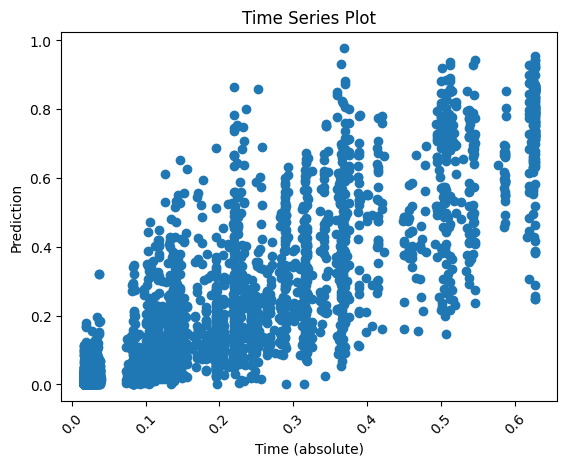

In [6]:
model_a.plot_pred_vs_test()

# Train B

In [7]:
model_b = MonoModelTrainer().train_model(location="B", merge_dfs=True, trials=trials)

KeyboardInterrupt: 

In [ ]:
# model_b.plot_important_features(50)

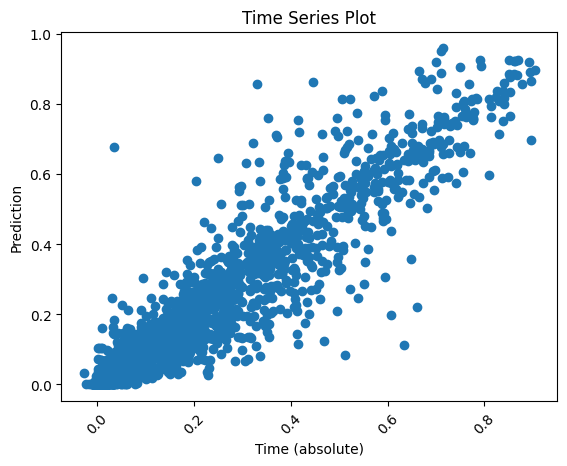

In [ ]:
model_b.plot_pred_vs_test()

# Train c

In [ ]:
model_c = MonoModelTrainer().train_model(location="C", merge_dfs=True, trials=trials)

[I 2023-10-06 22:13:27,069] A new study created in memory with name: regression
[I 2023-10-06 22:13:27,816] Trial 5 finished with value: 0.08401975025328665 and parameters: {'max_leaf_nodes': 22, 'learning_rate': 0.3968091743705049, 'max_depth': 13, 'min_samples_leaf': 22, 'max_bins': 50}. Best is trial 5 with value: 0.08401975025328665.
[I 2023-10-06 22:13:27,839] Trial 4 finished with value: 0.08401975025328665 and parameters: {'max_leaf_nodes': 15, 'learning_rate': 0.39151399250698865, 'max_depth': 13, 'min_samples_leaf': 22, 'max_bins': 76}. Best is trial 5 with value: 0.08401975025328665.
[I 2023-10-06 22:13:27,847] Trial 1 finished with value: 0.08401975025328665 and parameters: {'max_leaf_nodes': 13, 'learning_rate': 0.20861154418276784, 'max_depth': 12, 'min_samples_leaf': 26, 'max_bins': 104}. Best is trial 5 with value: 0.08401975025328665.
[I 2023-10-06 22:13:27,849] Trial 2 finished with value: 0.08401975025328665 and parameters: {'max_leaf_nodes': 29, 'learning_rate': 0.25

R2:  0.9054459365423837
RMSE:  0.05298089406936807
graded! MAE:  0.02401484762661578
Best params: {
    "max_leaf_nodes": 22,
    "learning_rate": 0.3968091743705049,
    "max_depth": 13,
    "min_samples_leaf": 22,
    "max_bins": 50
}


In [ ]:
# model_c.plot_important_features(30)

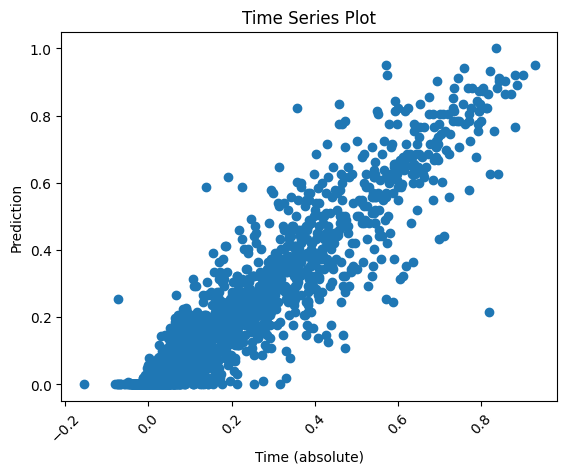

In [ ]:
model_c.plot_pred_vs_test()

# Create prediction

In [ ]:
y_pred_a = model_a.predict_test_data("A", merge_df=True)
print("Length pred: ", len(y_pred_a))
y_pred_b = model_b.predict_test_data("B", merge_df=True)
print("Length pred: ", len(y_pred_b))
y_pred_c = model_c.predict_test_data("C", merge_df=True)
print("Length pred: ", len(y_pred_c))

predictions = list(y_pred_a) + list(y_pred_b) + list(y_pred_c)

Location A. length: 2880
Length pred:  720
Location B. length: 2880
Length pred:  720
Location C. length: 2880
Length pred:  720


In [ ]:
compare_best = pd.read_csv("submissions/best_prediction.csv")["prediction"]

In [ ]:
print("MAE: "+ str(mean_absolute_error(compare_best, predictions)))

MAE: 97.6489528026221


In [ ]:
len(predictions)

2160

In [ ]:
df = pd.DataFrame({"prediction":predictions}).rename_axis(index="id")
df.to_csv(f"submissions/{submission}_submission.csv")

# Predict from pickle_file

In [ ]:
# model_a_pickle = pickle.load(open("models/A_xgb_MAE_172_.pkl", "rb"))

In [ ]:
# pickle_model = MLModel(model_a_pickle)

In [ ]:
# pickle_model.predict_test_data("A")